In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import os, datetime
import tensorflow as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
print('Tensorflow version: {}'.format(tf.__version__))

import matplotlib.pyplot as plt
plt.style.use('seaborn')

2023-12-19 13:30:19.463689: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-12-19 13:30:19.545199: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-12-19 13:30:19.546560: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-19 13:30:21.082500: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Tensorflow version: 2.12.0


In [2]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.layers import Flatten
from keras import backend as K
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn import linear_model
import sqlite3
import pandas as pd
import math
import matplotlib.pyplot as plt
plt.style.use('seaborn')
from datetime import datetime
import random

In [3]:
import os
os.chdir('/gstore/project/hr_brca_heterogeneity/T47D_trace_Seq_v2/Nathan')
#os.listdir()

In [4]:
'''Hyperparameters'''

batch_size = 32 # was 32
seq_len = 8 # was 128

#d_k = 256
#d_v = 256
n_heads = 40 # was 60  # Number of attention heads # no difference or imporvement between 5-60
n_head_size= 5 # was 46 # Embedding size for attention # no difference between 5-46
n_ff_dim = 5  # was 55    # Hidden layer size in feed forward network inside transformer # some difference between 5-55


In [5]:
#### full data
import json

# f = open('tran_9545_barcodes2.json') is 25% cells have count of 3 or more (RT-PT)
# f = open('tran_9545_barcodes3.json') is 10% cells have count of 1 or more (RT-PT)
# f = open('tran_9545_barcodes4.json') is PTIME ONLY order with 10% cells have count of 1 or more
# f = open('tran_9545_barcodes5.json') is PTIME ONLY order AND P-SURV with 10% cells have count of 1 or more
# f = open('tran_9545_barcodes6.json') is PLSR PTIME ONLY order AND P-SURV with 10% cells have count of 3 or more
# f = open('tran_9545_barcodes8.json') is PLSR BREASTcgp + ESRcgp Paths PTIME ONLY order AND P-SURV with 10% cells have count of 3 or more
# f = open('tran_9545_barcodes9.json') is PLSR PID + HALLMARK Paths PTIME ONLY order AND P-SURV with 10% cells have count of 3 or more
# f = open('tran_Palbo_barcodes.json') is palbo PLSR genes PTIME ONLY order AND P-SURV with 10% cells have count of 3 or more
# f = open('tran_combo_barcodes.json') is combo PLSR genes PTIME ONLY order AND P-SURV with 10% cells have count of 3 or more
# 'tran_9545_survdepl.json' is separated into surviving and depleting barcodes
# 'tran_9545_BREASTsurvdepl.json' is separated into surviving and depleting barcodes for BREAST + ESR paths
# 'tran_Palbo_barcodes6.json' same as 9545_barcodes6
# 'tran_Palbo_BREAST.json' same as 9545_barcodes8
# 'tran_combo_barcodes6.json' same as 9545_barcodes6
# 'tran_combo_BREAST.json' same as 9545_barcodes8
# 'tran_9545_barcodes_pcares0.25.json' same as 9545 pcares0.25 ptime
# 'tran_9545_pcares0.25_BREAST.json' ptime for 9545 with BREAST paths
# 'tran_9545_pcares0.25_BREAST75.json'
# 'tran_9545_barcodes75_pcares0.25.json'
# tran_9545_plsrres0.3_BREAST.json with the new method
# tran_palbo_plsrres0.3_BREAST.json with the new method
# tran_combo_plsrres0.5_BREAST.json
# tran_9545_plsrres0.3_HALL3.json
f = open('json_files/tran_9545_plsrres0.3_HALL3.json')
data = json.load(f)

In [6]:
exp_days = {'Day 0': 1, 'Day 1': 2, 'Day 4': 3, 'Day 8': 4, 'Day 26': 5}

df = pd.DataFrame(data['GFPBC_libB_90850'])
df.iloc[:, 0:len(df.columns)-1]

,Pseudotime,RealTime,Survival,Score.MAPK,Score.ER_induced,Score.ER_repressed,Score.Hippo_145,Score.Hippo_50,Score.TCGA_LuBrCa_mPIK3CA_up,Score.TCGA_LuBrCa_mPIK3CA_dn,...,Score.HALLMARK_ANGIOGENESIS,Score.HALLMARK_HEME_METABOLISM,Score.HALLMARK_COAGULATION,Score.HALLMARK_IL2_STAT5_SIGNALING,Score.HALLMARK_BILE_ACID_METABOLISM,Score.HALLMARK_PEROXISOME,Score.HALLMARK_ALLOGRAFT_REJECTION,Score.HALLMARK_SPERMATOGENESIS,Score.HALLMARK_KRAS_SIGNALING_UP,Score.HALLMARK_KRAS_SIGNALING_DN
0,0.0098,1,0.3518,0.0000,0.3627,0.4066,0.2999,0.2336,0.1245,0.0844,...,0.8933,1.7672,2.3216,1.6280,1.5111,1.9565,2.2742,1.6578,2.1438,0.6785
1,0.0105,2,0.3143,0.1703,0.2965,0.3819,0.4214,0.3118,0.0888,0.1282,...,2.0071,1.7374,1.9475,1.7186,2.0668,2.1993,2.1643,1.4647,1.9337,1.6546
2,0.0116,1,0.2891,0.2174,0.5001,0.5001,0.3403,0.2268,0.0770,0.0000,...,1.6901,1.2966,2.1445,1.5817,1.9198,2.1749,1.7421,2.0901,1.9001,1.4106
3,0.0129,1,0.2772,0.4634,0.5483,0.2941,0.3515,0.2339,0.1068,0.3133,...,2.1376,1.7490,2.1339,1.6222,1.5716,2.1146,2.1199,1.9977,2.0230,1.5737
4,0.0143,2,0.2668,0.4727,0.4183,0.3784,0.4032,0.3497,0.1019,0.2250,...,1.7691,1.4083,2.1572,1.6870,1.8793,2.3432,2.2296,1.8866,1.8935,1.3916
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2380,0.9984,5,0.0899,0.1211,0.2532,0.4466,0.4576,0.5640,0.3350,0.1142,...,2.0554,1.5934,1.6054,1.7091,1.5929,1.5802,1.8458,1.5784,1.9996,1.5064
2381,0.9991,5,0.0928,0.1573,0.3216,0.6288,0.5804,0.6759,0.2311,0.0567,...,1.5983,1.6818,1.7428,1.6946,1.5457,1.3229,1.9067,1.4309,1.5273,1.7536
2382,0.9995,5,0.0841,0.1324,0.4018,0.7432,0.4769,0.5029,0.2264,0.0948,...,1.1106,1.4459,1.3601,1.7555,1.7549,1.4490,1.7661,1.5650,1.8006,1.8729
2383,0.9999,5,0.0745,0.1656,0.2699,0.6598,0.4079,0.5167,0.3009,0.1464,...,1.7250,1.6574,1.7760,2.1085,1.8774,1.5012,1.6859,1.4455,1.6761,1.6979


In [7]:
barcodes = [i for i in data.keys()]
print(barcodes)
new_barcodes = []
for i in barcodes:
    df = pd.DataFrame(data[i])
    #print(i, df.shape[0])
    if df.shape[0] > 200: # 50 or 60
        new_barcodes.append(i)
print(new_barcodes)
print(len(new_barcodes))

bar_dict = {new_barcodes[i]:i for i in range(len(new_barcodes))}

['GFPBC_libB_92196', 'GFPBC_libB_20182', 'GFPBC_libB_90850', 'GFPBC_libB_10678', 'GFPBC_libB_37798', 'GFPBC_libB_31581', 'GFPBC_libB_40758', 'GFPBC_libB_94397', 'GFPBC_libB_83026', 'GFPBC_libB_10737', 'GFPBC_libB_81397']
['GFPBC_libB_92196', 'GFPBC_libB_20182', 'GFPBC_libB_90850', 'GFPBC_libB_10678', 'GFPBC_libB_37798', 'GFPBC_libB_31581', 'GFPBC_libB_40758', 'GFPBC_libB_94397', 'GFPBC_libB_83026', 'GFPBC_libB_10737']
10


In [8]:
'''Create training and test data'''

def transformer_train_test_split_dayiter(bar, frac_val, extra_var_bool, splitval):
    
    bardf = pd.DataFrame(data[bar])
    #bardf = bardf[bardf['RealTime'] <= exp_days[d]]
    num_cell_day = len(bardf['RealTime'].tolist())
    snum = int(num_cell_day*splitval)
    bardf = bardf.iloc[:snum,:]
    
    
    bardf = bardf.iloc[:,:len(bardf.columns)-1]
    bardf['RealTime'] = bardf['RealTime'].astype('category')
    bardf['Barcode'] = [bar_dict[bar] for _ in range(bardf.shape[0])]
    bardf['Barcode'] = bardf['Barcode'].astype('category')
    
    # normalize after train/test split
    scaler = MinMaxScaler(feature_range=(-1, 1)) 
    bardf2 = pd.DataFrame(scaler.fit_transform(bardf.iloc[:,2:len(bardf.columns)-1])) # survival and expression
    bardf2.columns = bardf.columns[2:len(bardf.columns)-1]
    
    if extra_var_bool[0]:
        bardf2['RealTime'] = bardf['RealTime'].astype('category')
        num_cell_day = len(bardf2['RealTime'].tolist())
    if extra_var_bool[1]:
        bardf2['Barcode'] = bardf['Barcode'].astype('category')
    if extra_var_bool[2]:
        bardf2['Pseudotime'] = bardf['Pseudotime']
    #bardf2 = bardf2.dropna()
    COLS = bardf2.columns.tolist()[1:]
    #print(COLS)
    
    bardf2 = bardf2.dropna()
    bardf2.index = [i for i in range(bardf2.shape[0])]
    bardf_train = bardf2[:-(round(num_cell_day*frac_val))]
    bardf_val = bardf2[len(bardf2) - (round(num_cell_day*frac_val)):]
    #print(bardf_val.shape, bardf_train.shape)
    
    train_y = bardf_train['Survival']
    train_data = bardf_train.iloc[:,1:]
    val_y = bardf_val['Survival'].tolist()
    val_data = bardf_val.iloc[:,1:]
    
    if frac_val == 0:
        train_data = bardf2.iloc[:,1:]
        train_y = bardf2['Survival']
    
    # Training data
    X_train, y_train = [], []
    for i in range(seq_len, len(train_data)):
      X_train.append(train_data[i-seq_len:i]) 
      y_train.append(train_y[i]) #Value of 0th column (Survival) of df-row seq_len+1
    X_train, y_train = np.array(X_train), np.array(y_train)
    
    if frac_val != 0:
    
        # Validation data
        X_val, y_val = [], []
        for i in range(seq_len, len(val_data)):
          X_val.append(val_data[i-seq_len:i]) 
          y_val.append(val_y[i]) #Value of 0th column (Survival) of df-row seq_len+1
        X_val, y_val = np.array(X_val), np.array(y_val)
    
        print('Transformer Training/Val set shapes (varies depending on barcode) ', X_train.shape, X_val.shape)
        return X_train, y_train, X_val, y_val, COLS
    
    else:
        
        print('Transformer Training/Val set shapes (varies depending on barcode) ', X_train.shape)
        return X_train, y_train, COLS

In [9]:
'''Create training and test data'''

def regr_train_test_split_dayiter(bar, frac_val, extra_var_bool, splitval):
    
    bardf = pd.DataFrame(data[bar])
    #bardf = bardf[bardf['RealTime'] <= exp_days[d]]
    num_cell_day = len(bardf['RealTime'].tolist())
    snum = int(num_cell_day*splitval)
    bardf = bardf.iloc[:snum,:]
    
    bardf = bardf.iloc[:,:len(bardf.columns)-1]
    bardf['RealTime'] = bardf['RealTime'].astype('category')
    bardf['Barcode'] = [bar_dict[bar] for _ in range(bardf.shape[0])]
    bardf['Barcode'] = bardf['Barcode'].astype('category')
    
    # normalize after train/test split
    scaler = MinMaxScaler(feature_range=(-1, 1)) 
    bardf2 = pd.DataFrame(scaler.fit_transform(bardf.iloc[:,2:len(bardf.columns)-1])) # survival and expression
    bardf2.columns = bardf.columns[2:len(bardf.columns)-1]
    
    if extra_var_bool[0]:
        bardf2['RealTime'] = bardf['RealTime'].astype('category')
        num_cell_day = len(bardf2['RealTime'].tolist())
    if extra_var_bool[1]:
        bardf2['Barcode'] = bardf['Barcode'].astype('category')
    if extra_var_bool[2]:
        bardf2['Pseudotime'] = bardf['Pseudotime']
        
    bardf2 = bardf2.dropna()
    bardf2.index = [i for i in range(bardf2.shape[0])]
    bardf_train = bardf2[:-(round(num_cell_day*frac_val))]
    bardf_val = bardf2[len(bardf2) - (round(num_cell_day*frac_val)):]
    #print(bardf_val)
    
    train_y = bardf_train['Survival']
    train_data = bardf_train.iloc[:,1:]
    val_y = bardf_val['Survival'].tolist()
    val_data = bardf_val.iloc[:,1:]
    
    # Training data
    X_train, y_train = np.array(train_data), np.array(train_y)
    
    # Validation data
    X_val, y_val = np.array(val_data), np.array(val_y)
    
    print('Regr Training/Val set shapes (varies depending on barcode) ', X_train.shape, X_val.shape)
    return X_train, y_train, X_val, y_val

In [10]:
########### testing function #################
# make the training and validation data

b = 'GFPBC_libB_92196'
frac_val = 0.20
extra_var_bool = [False, False, False] # 0-realtime, 1-barcode, 2-pseudotime
vs = [0.25, 0.5, 0.75, 1]
pct_test = frac_val/len(vs)
for v in vs:
    X_train, y_train, X_val, y_val, cols = transformer_train_test_split_dayiter(b, pct_test, extra_var_bool, v)
    X_train, y_train, X_val, y_val = regr_train_test_split_dayiter(b, pct_test, extra_var_bool, v)

X_full, y_full, COLS = transformer_train_test_split_dayiter(b, 0, extra_var_bool, 1)

Transformer Training/Val set shapes (varies depending on barcode)  (690, 8, 72) (167, 8, 72)
Regr Training/Val set shapes (varies depending on barcode)  (698, 72) (175, 72)
Transformer Training/Val set shapes (varies depending on barcode)  (1564, 8, 72) (167, 8, 72)
Regr Training/Val set shapes (varies depending on barcode)  (1572, 72) (175, 72)
Transformer Training/Val set shapes (varies depending on barcode)  (2438, 8, 72) (167, 8, 72)
Regr Training/Val set shapes (varies depending on barcode)  (2446, 72) (175, 72)
Transformer Training/Val set shapes (varies depending on barcode)  (3312, 8, 72) (167, 8, 72)
Regr Training/Val set shapes (varies depending on barcode)  (3320, 72) (175, 72)
Transformer Training/Val set shapes (varies depending on barcode)  (3487, 8, 72)


In [11]:
def transformer_encoder(inputs, head_size, num_heads, ff_dim, num_attention_blocks, num_transformer_blocks, dropout=0):
    if num_transformer_blocks == 0 and num_attention_blocks == 0:
        return inputs
    
    if num_attention_blocks != 0:
        for _ in range(num_attention_blocks):
            # Normalization and Attention
            # "EMBEDDING LAYER"
            x = layers.LayerNormalization(epsilon=1e-6)(inputs)

            # "ATTENTION LAYER"
            x = layers.MultiHeadAttention(
                key_dim=head_size, num_heads=num_heads, dropout=dropout
            )(x, x)
            x = layers.Dropout(dropout)(x)
            res = x + inputs
            
    if num_attention_blocks == 0:
        res = inputs
    
    if num_transformer_blocks != 0: 
        for _ in range(num_transformer_blocks):
            # FEED FORWARD Part - you can stick anything here or just delete the whole section - it will still work. 
            x = layers.LayerNormalization(epsilon=1e-6)(res)
            x = layers.Conv1D(filters=ff_dim, kernel_size=1, activation = "relu")(x)
            x = layers.Dropout(dropout)(x)
            x = layers.Conv1D(filters=inputs.shape[-1], kernel_size=1)(x)
    
    # may need to return something else if transformer blocks are 0
    return x + res

In [12]:
def build_model(
    input_shape,
    head_size,
    num_heads,
    ff_dim,
    num_attention_blocks,
    num_transformer_blocks,
    mlp_units,
    dropout=0,
    mlp_dropout=0, 
):
    inputs = keras.Input(shape=input_shape)
    x = inputs
    
    # This is what stacks our transformer blocks
    x = transformer_encoder(x, head_size, num_heads, ff_dim, num_attention_blocks, num_transformer_blocks, dropout)

    x = layers.GlobalAveragePooling1D(data_format="channels_first")(x)
    for dim in mlp_units:
        x = layers.Dense(dim, activation="elu")(x)
        x = layers.Dropout(mlp_dropout)(x)
    outputs = layers.Dense(1, activation="linear")(x) #this is a pass-through
    return keras.Model(inputs, outputs)

In [13]:
def lr_scheduler(epoch, lr, warmup_epochs=30, decay_epochs=100, initial_lr=1e-6, base_lr=1e-3, min_lr=5e-5):
    if epoch <= warmup_epochs:
        pct = epoch / warmup_epochs
        return ((base_lr - initial_lr) * pct) + initial_lr

    if epoch > warmup_epochs and epoch < warmup_epochs+decay_epochs:
        pct = 1 - ((epoch - warmup_epochs) / decay_epochs)
        return ((base_lr - min_lr) * pct) + min_lr

    return min_lr

# This learning rate scheduler is also from Mr. Theodoros Ntakouris' articla at https://towardsdatascience.com/the-time-series-transformer-2a521a0efad3
# I am definetely a fan.

In [14]:
callbacks = [
            keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
            keras.callbacks.LearningRateScheduler(lr_scheduler)
            ]

In [15]:
from keras.utils.vis_utils import plot_model
import pydot
import graphviz

#tf.keras.utils.plot_model(model, to_file ='model_plot.png', show_shapes = True, show_layer_names = True)

In [16]:
def plot_transformer_predictions_losses(X_train, y_train, X_val, y_val, bar, dir_path, model):
    
    #Calculate predication for training, validation and test data
    print(X_train.shape, X_val.shape)
    train_pred = model.predict(X_train)
    val_pred = model.predict(X_val)

    #Print evaluation metrics for all datasets
    train_mse = mean_squared_error(y_train, train_pred)
    val_mse = mean_squared_error(y_val, val_pred)
    print(' ')
    print('Transformer Evaluation metrics')
    print('Transformer Training MSE - MSE: {:.4f}'.format(train_mse)) ### these lines should be MSE???
    print('Transformer Validation MSE - MSE: {:.4f}'.format(val_mse))
    

    plt.plot(y_train, label='Survival')
    plt.plot(np.arange(train_pred.shape[0]), train_pred, linewidth=3, label='Predicted Survival')
    plt.title("Transformer Training Data "+bar, fontsize=14)
    plt.xlabel('Real + Pseudotime')
    plt.ylabel('Survival')
    plt.ylim(-1.5, 1.5)
    plt.legend(loc="best", fontsize=12)
    plt.savefig(dir_path+bar+'_training.png', bbox_inches='tight')
    plt.show()

    #Plot validation data results
    plt.plot(y_val, label='Survival')
    plt.plot(np.arange(val_pred.shape[0]), val_pred, linewidth=3, label='Predicted Survival')
    plt.title("Transformer Validation Data "+bar, fontsize=14)
    plt.xlabel('Real + Pseudotime')
    plt.ylabel('Survival')
    plt.ylim(-1.5, 1.5)
    plt.legend(loc="best", fontsize=12)
    plt.savefig(dir_path+bar+'_validation.png', bbox_inches='tight')
    plt.show()
    
    return train_mse, val_mse

In [17]:
def plot_regr_predictions_losses(X, y, X_test, y_test, bar, dir_path, regr):
    
    #Calculate predication for training, validation and test data
    train_pred = regr.predict(X)
    val_pred = regr.predict(X_test)

    #Print evaluation metrics for all datasets
    train_eval = mean_squared_error(y, train_pred)
    val_eval = mean_squared_error(y_test, val_pred)
    print(' ')
    print('Evaluation metrics Regr')
    print('Regr Training Data - MSE: {:.4f}'.format(train_eval)) ### these lines should be MSE???
    print('Regr Validation Data - MSE: {:.4f}'.format(val_eval))
    
    plt.plot(y, label='Survival')
    plt.plot(np.arange(train_pred.shape[0]), train_pred, linewidth=3, label='Predicted Survival')
    plt.title("Regr Training Data "+bar, fontsize=14)
    plt.xlabel('Real + Pseudotime')
    plt.ylabel('Survival')
    plt.ylim(-1.5, 1.5)
    plt.legend(loc="best", fontsize=12)
    plt.savefig(dir_path+bar+'_training.png', bbox_inches='tight')
    plt.show()

    #Plot validation data results
    plt.plot(y_test, label='Survival')
    plt.plot(np.arange(val_pred.shape[0]), val_pred, linewidth=3, label='Predicted Survival')
    plt.title("Regr Validation Data "+bar, fontsize=14)
    plt.xlabel('Real + Pseudotime')
    plt.ylabel('Survival')
    plt.ylim(-1.5, 1.5)
    plt.legend(loc="best", fontsize=12)
    plt.savefig(dir_path+bar+'_validation.png', bbox_inches='tight')
    plt.show()
    
    return train_eval, val_eval

In [18]:
def SHAPvals4(X_val, y_val, bar, COLS, dir_path, model):
    
    #COLS = bardf.columns.tolist()[1:] # may need fixing
    #print(len(COLS), X_val.shape)
    #print(COLS)

    results = []
    print(' Computing feature importance...'+bar)

    # COMPUTE BASELINE (NO SHUFFLE)
    oof_preds = model.predict(X_val, verbose=0).squeeze() 
    baseline_mae = np.mean(np.abs( oof_preds-y_val ))
    results.append({'feature':'BASELINE','mae':baseline_mae, 'prediction':oof_preds.tolist(), 'true':y_val.tolist()})           

    for k in range(len(COLS)):

        if k in [20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]:
            print('SHAP', k, ' '+bar)
        # SHUFFLE FEATURE K
        save_col = X_val[:,:,k].copy()
        mae_all = []
        pred_df = pd.DataFrame() #########
        for i in range(30):
            np.random.shuffle(X_val[:,:,k])

            # COMPUTE OOF MAE WITH FEATURE K SHUFFLED
            oof_preds = model.predict(X_val, verbose=0).squeeze() 
            pred_df['prediction_'+str(i)] = oof_preds #######
            mae = np.mean(np.abs( oof_preds-y_val ))
            mae_all.append(mae)
            X_val[:,:,k] = save_col
        results.append({'feature':COLS[k],'mae_mean':np.mean(mae_all), 'mae_std':np.std(mae_all), 'mae_all':mae_all})
        for each_col in pred_df.columns.tolist():
            results[-1][each_col] = pred_df[each_col].tolist()

    # SAVE FEATURE IMPORTANCE
    df = pd.DataFrame(results)
    df = df.sort_values('mae_mean',ascending=False)
    df['fc_mae'] = df['mae'] - baseline_mae
    df.to_csv(dir_path+bar+'_feature_importance_full.csv',index=False)
    print('done with '+bar)

In [69]:
# set seeds produces more similar results, but not exact
seed_value = 42
num_layers = 10
n_heads = 40 # was 40  # Number of attention heads # no difference or imporvement between 5-60
n_head_size= 5 # was 46 # Embedding size for attention # no difference between 5-46
n_ff_dim = 5  # was 55    # Hidden layer size in feed forward network inside transformer # some difference between 5-55

batch_size = 32 # was 32
seq_len = 8 # was 8


os.environ['PYTHONHASHSEED']=str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

In [20]:
#test_barcodes = ['GFPBC_libB_92196']
#print(test_barcodes)

['GFPBC_libB_92196']


In [70]:
# use partial_fit to train multiple times, could be different barcodes in our case
frac_val = 0.20
#test_barcodes = ['GFPBC_libB_92196'] #, 'GFPBC_libB_90850', 'GFPBC_libB_20182'] #'GFPBC_libB_78143', 'GFPBC_libB_78143', 'GFPBC_libB_78143']
extra_var_bool = [False, False, False] # 0-realtime, 1-barcode, 2-pseudotime

intervals = [0.25, 0.5, 0.75, 1]
pct_test = frac_val/len(intervals) # comment out and use frac_val for last 20%
#intervals = [1]
#pct_test = frac_val/4

mse_dict = {} # structure is {barcode: {day_0: [trans_train, trans_val, regr_train, regr_val], day_n...}, barcode_n: ...}

    
def runDynamicDeepLearn(bar):
    
    print('\n\n')
    print(bar)
    mse_dict[bar] = {}
    
    for v in intervals:
        # make the training and validation data
        X_train, y_train, X_val, y_val, COLS = transformer_train_test_split_dayiter(bar, pct_test, extra_var_bool, v)

        # build and compile model
        input_shape = X_train.shape[1:]
        model = build_model(
            input_shape,
            head_size=n_head_size, # Embedding size for attention
            num_heads=n_heads, # Number of attention heads
            ff_dim=n_ff_dim, # Hidden layer size in feed forward network inside transformer
            num_attention_blocks=num_layers, # 3 iterations for attention
            num_transformer_blocks=num_layers, # six layers doesn't add or subtract much so best to keep simple
            mlp_units=[256],
            mlp_dropout=0.4, # unclear if increasing or decreasing has sizable effect
            dropout=0.14 # unclear if increasing or decreasing has sizable effect
        )
        model.compile(
            loss="mean_squared_error",
            optimizer=keras.optimizers.Adam(learning_rate=1e-3),  # was 1e-4
            metrics=["mean_squared_error"],
        )
        # fit the model
        history = model.fit(X_train, y_train, 
                        batch_size=batch_size, 
                        epochs=20,
                        validation_data=(X_val, y_val)) 
        
        # build no attention model
        noattn_model = build_model(
            input_shape,
            head_size=n_head_size, # Embedding size for attention
            num_heads=n_heads, # Number of attention heads
            ff_dim=n_ff_dim, # Hidden layer size in feed forward network inside transformer
            num_attention_blocks=0, # number of iteration layers for attention
            num_transformer_blocks=num_layers, # six layers doesn't add or subtract much so best to keep simple
            mlp_units=[256],
            mlp_dropout=0.4, # unclear if increasing or decreasing has sizable effect
            dropout=0.14 # unclear if increasing or decreasing has sizable effect
        )
        noattn_model.compile(
            loss="mean_squared_error",
            optimizer=keras.optimizers.Adam(learning_rate=1e-3),  # was 1e-4
            metrics=["mean_squared_error"],
        )
        # fit the model
        noattn_history = noattn_model.fit(X_train, y_train, 
                        batch_size=batch_size, 
                        epochs=20,
                        validation_data=(X_val, y_val))
        
        # build no encode model
        noenc_model = build_model(
            input_shape,
            head_size=n_head_size, # Embedding size for attention
            num_heads=n_heads, # Number of attention heads
            ff_dim=n_ff_dim, # Hidden layer size in feed forward network inside transformer
            num_attention_blocks=num_layers, # number of iteration layers for attention
            num_transformer_blocks=0, # six layers doesn't add or subtract much so best to keep simple
            mlp_units=[256],
            mlp_dropout=0.4, # unclear if increasing or decreasing has sizable effect
            dropout=0.14 # unclear if increasing or decreasing has sizable effect
        )
        noenc_model.compile(
            loss="mean_squared_error",
            optimizer=keras.optimizers.Adam(learning_rate=1e-3),  # was 1e-4
            metrics=["mean_squared_error"],
        )
        # fit the model
        noenc_history = noenc_model.fit(X_train, y_train, 
                        batch_size=batch_size, 
                        epochs=20,
                        validation_data=(X_val, y_val))


        if X_val.shape[0] > 0:

            # predictions and loss
            train_mse, val_mse = plot_transformer_predictions_losses(X_train, y_train, X_val, y_val, bar, 'test/transformer_ptime_', model)

            # noattn - predictions and loss
            noattn_train_mse, noattn_val_mse = plot_transformer_predictions_losses(X_train, y_train, X_val, y_val, bar, 'test/noattn_ptime_', noattn_model)
            
            # noenc - predictions and loss
            noenc_train_mse, noenc_val_mse = plot_transformer_predictions_losses(X_train, y_train, X_val, y_val, bar, 'test/noenc_ptime_', noenc_model)
            
            # build multivariate regression model
            X, y, X_test, y_test = regr_train_test_split_dayiter(bar, pct_test, extra_var_bool, v)
            regr = linear_model.LinearRegression()
            regr.fit(X, y)
            regr_train_mse, regr_val_mse = plot_regr_predictions_losses(X, y, X_test, y_test, bar, 'test/regr_ptime_', regr)

            # add to mse dictionary
            mse_dict[bar][v] = [train_mse, val_mse, regr_train_mse, regr_val_mse, noattn_train_mse, noattn_val_mse, noenc_train_mse, noenc_val_mse]

            # SHAP values
            #regr_SHAPvals(X_test, y_test, bar, COLS, 'barmodels_ptime7/regr_'+str(v))
            #if v == 1:
            #    X_full, y_full, COLS = transformer_train_test_split_dayiter(bar, 0, extra_var_bool, 1)
            #    SHAPvals4(X_full, y_full, bar, COLS, 'barmodels_combo_plsrres0.5_GENE3/transformer_full', model)
            sys.stdout.flush()
                

    return mse_dict
    

test ['GFPBC_libB_92196', 'GFPBC_libB_20182', 'GFPBC_libB_90850', 'GFPBC_libB_10678', 'GFPBC_libB_37798', 'GFPBC_libB_31581', 'GFPBC_libB_40758', 'GFPBC_libB_94397', 'GFPBC_libB_83026', 'GFPBC_libB_10737']






























GFPBC_libB_92196GFPBC_libB_10678GFPBC_libB_20182GFPBC_libB_31581GFPBC_libB_90850GFPBC_libB_37798GFPBC_libB_94397GFPBC_libB_40758GFPBC_libB_83026GFPBC_libB_10737









Transformer Training/Val set shapes (varies depending on barcode)  (53, 8, 72) (8, 8, 72)
Transformer Training/Val set shapes (varies depending on barcode) Transformer Training/Val set shapes (varies depending on barcode)   (92, 8, 72)Transformer Training/Val set shapes (varies depending on barcode)  (92, 8, 72) (17, 8, 72)(110, 8, 72)
  (22, 8, 72)
(17, 8, 72)Transformer Training/Val set shapes (varies depending on barcode)  (130, 8, 72)
 (27, 8, 72)
Transformer Training/Val set shapes (varies depending on barcode)  (229, 8, 72) (52, 8, 72)
Transformer Training/Val set shapes (varies de

2023-12-19 14:58:40.367390: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2023-12-19 14:58:40.367732: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2023-12-19 14:58:40.367732: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2023-12-19 14:58:40.371143: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2023-12-19 14:58:40.385601: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2023-12-19 14:58:40.390162: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ER

Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
Epoch 1/20
3/3 [==============================] - 3s 175ms/step - loss: 0.2229 - mean_squared_error: 0.2229 - val_loss: 0.0371 - val_mean_squared_error: 0.0371
Epoch 2/20
3/3 [==============================] - 0s 26ms/step - loss: 0.1197 - mean_squared_error: 0.1197 - val_loss: 0.0335 - val_mean_squared_error: 0.0335
Epoch 3/20
3/3 [==============================] - 0s 27ms/step - loss: 0.0957 - mean_squared_error: 0.0957 - val_loss: 0.0365 - val_mean_squared_error: 0.0365
Epoch 4/20
14/14 [==============================] - 3s 35ms/step - loss: 0.1003 - mean_squared_error: 0.1003 - val_loss: 0.0825 - val_mean_squared_error: 0.0825
Epoch 2/20
3/3 [==============================] - 3s 287ms/step - loss: 0.1752 - mean_squared_error: 0.1752 - val_loss: 0.4202 - val_mean_squared_error: 0.4202
Epoch 2/20
2/2 [==============================] - 3s 547ms/step - loss: 0.3133 - mean_squared_error: 0

4/4 [==============================] - 0s 23ms/step - loss: 0.2473 - mean_squared_error: 0.2473 - val_loss: 1.0448 - val_mean_squared_error: 1.0448
Epoch 3/20
3/3 [==============================] - 0s 29ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0784 - val_mean_squared_error: 0.0784
Epoch 12/20
22/22 [==============================] - 0s 13ms/step - loss: 0.0837 - mean_squared_error: 0.0837 - val_loss: 0.2181 - val_mean_squared_error: 0.2181
Epoch 7/20
Epoch 4/20
2/2 [==============================] - 0s 53ms/step - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.2123 - val_mean_squared_error: 0.2123
Epoch 9/20
Epoch 4/20
Epoch 11/20
8/8 [==============================] - 0s 19ms/step - loss: 0.0746 - mean_squared_error: 0.0746 - val_loss: 0.0571 - val_mean_squared_error: 0.0571
Epoch 13/20
5/5 [==============================] - 0s 21ms/step - loss: 0.0555 - mean_squared_error: 0.0555 - val_loss: 0.0525 - val_mean_squared_error: 0.0525
Epoch 8/20
2/2 [===

5/5 [==============================] - 0s 22ms/step - loss: 0.0431 - mean_squared_error: 0.0431 - val_loss: 0.0585 - val_mean_squared_error: 0.0585
Epoch 12/20
3/3 [==============================] - 0s 40ms/step - loss: 0.0113 - mean_squared_error: 0.0113 - val_loss: 0.0157 - val_mean_squared_error: 0.0157
Epoch 9/20
3/3 [==============================] - 0s 42ms/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0662 - val_mean_squared_error: 0.0662
Epoch 18/20
2/2 [==============================] - 0s 92ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.1841 - val_mean_squared_error: 0.1841
Epoch 18/20
8/8 [==============================] - 0s 20ms/step - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0280 - val_mean_squared_error: 0.0280
Epoch 6/20
3/3 [==============================] - 0s 32ms/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0215 - val_mean_squared_error: 0.0215
Epoch 16/20
4/4 [==============================] - 0s 

8/8 [==============================] - 0s 17ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0364 - val_mean_squared_error: 0.0364
Epoch 10/20
5/5 [==============================] - 0s 25ms/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0498 - val_mean_squared_error: 0.0498
Epoch 16/20
13/13 [==============================] - 0s 16ms/step - loss: 0.0253 - mean_squared_error: 0.0253 - val_loss: 0.1205 - val_mean_squared_error: 0.1205
Epoch 8/20
4/4 [==============================] - 0s 26ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.3685 - val_mean_squared_error: 0.3685
Epoch 17/20
15/15 [==============================] - 0s 17ms/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.3388 - val_mean_squared_error: 0.3388
Epoch 11/20
5/5 [==============================] - 0s 26ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.0481 - val_mean_squared_error: 0.0481
Epoch 19/20
22/22 [==============================

8/8 [==============================] - 0s 17ms/step - loss: 0.0058 - mean_squared_error: 0.0058 - val_loss: 0.0355 - val_mean_squared_error: 0.0355
Epoch 19/20
Epoch 16/20
13/13 [==============================] - 0s 16ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0833 - val_mean_squared_error: 0.0833
Epoch 14/20
15/15 [==============================] - 0s 14ms/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.3812 - val_mean_squared_error: 0.3812
Epoch 16/20
2/2 [==============================] - 1s 226ms/step - loss: 0.3102 - mean_squared_error: 0.3102 - val_loss: 0.7851 - val_mean_squared_error: 0.7851
Epoch 2/20
8/8 [==============================] - 0s 20ms/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0533 - val_mean_squared_error: 0.0533
Epoch 20/20
22/22 [==============================] - 0s 16ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.1442 - val_mean_squared_error: 0.1442
Epoch 12/20
14/14 [===============

Epoch 8/20
3/3 [==============================] - 0s 18ms/step - loss: 0.0618 - mean_squared_error: 0.0618 - val_loss: 0.1387 - val_mean_squared_error: 0.1387
Epoch 9/20
15/15 [==============================] - 0s 15ms/step - loss: 0.0033 - mean_squared_error: 0.0033 - val_loss: 0.3148 - val_mean_squared_error: 0.3148
Epoch 20/20
2/2 [==============================] - 0s 70ms/step - loss: 0.0611 - mean_squared_error: 0.0611 - val_loss: 0.3990 - val_mean_squared_error: 0.3990
Epoch 14/20
Epoch 15/20
3/3 [==============================] - 0s 26ms/step - loss: 0.0595 - mean_squared_error: 0.0595 - val_loss: 0.1511 - val_mean_squared_error: 0.1511
Epoch 10/20
13/13 [==============================] - 0s 15ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.1238 - val_mean_squared_error: 0.1238
Epoch 19/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0602 - mean_squared_error: 0.0602 - val_loss: 0.3649 - val_mean_squared_error: 0.3649
Epoch 16/20
3/3 [=========

4/4 [==============================] - 0s 12ms/step - loss: 0.2206 - mean_squared_error: 0.2206 - val_loss: 1.1879 - val_mean_squared_error: 1.1879
Epoch 5/20
3/3 [==============================] - 0s 25ms/step - loss: 0.0615 - mean_squared_error: 0.0615 - val_loss: 0.0540 - val_mean_squared_error: 0.0540
Epoch 17/20
5/5 [==============================] - 0s 14ms/step - loss: 0.0979 - mean_squared_error: 0.0979 - val_loss: 0.2233 - val_mean_squared_error: 0.2233
Epoch 7/20
3/3 [==============================] - 0s 20ms/step - loss: 0.0347 - mean_squared_error: 0.0347 - val_loss: 0.0449 - val_mean_squared_error: 0.0449
Epoch 19/20
22/22 [==============================] - 0s 10ms/step - loss: 0.0133 - mean_squared_error: 0.0133 - val_loss: 0.1694 - val_mean_squared_error: 0.1694
Epoch 17/20
3/3 [==============================] - 0s 18ms/step - loss: 0.0582 - mean_squared_error: 0.0582 - val_loss: 0.0457 - val_mean_squared_error: 0.0457
Epoch 18/20
5/5 [==============================] - 0

8/8 [==============================] - 1s 33ms/step - loss: 0.2731 - mean_squared_error: 0.2731 - val_loss: 0.3628 - val_mean_squared_error: 0.3628
Epoch 2/20
8/8 [==============================] - 0s 6ms/step - loss: 0.1516 - mean_squared_error: 0.1516 - val_loss: 0.1798 - val_mean_squared_error: 0.1798
Epoch 3/20
8/8 [==============================] - 0s 6ms/step - loss: 0.0959 - mean_squared_error: 0.0959 - val_loss: 0.0824 - val_mean_squared_error: 0.0824
Epoch 4/20
8/8 [==============================] - 0s 6ms/step - loss: 0.0700 - mean_squared_error: 0.0700 - val_loss: 0.0758 - val_mean_squared_error: 0.0758
Epoch 5/20
8/8 [==============================] - 0s 6ms/step - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0653 - val_mean_squared_error: 0.0653
Epoch 6/20
8/8 [==============================] - 0s 6ms/step - loss: 0.0564 - mean_squared_error: 0.0564 - val_loss: 0.0446 - val_mean_squared_error: 0.0446
Epoch 7/20
8/8 [==============================] - 0s 6ms/step 

13/13 [==============================] - 0s 5ms/step - loss: 0.0892 - mean_squared_error: 0.0892 - val_loss: 0.1053 - val_mean_squared_error: 0.1053
Epoch 9/20
15/15 [==============================] - 0s 6ms/step - loss: 0.0406 - mean_squared_error: 0.0406 - val_loss: 0.2205 - val_mean_squared_error: 0.2205
Epoch 10/20
14/14 [==============================] - 0s 5ms/step - loss: 0.0647 - mean_squared_error: 0.0647 - val_loss: 0.0544 - val_mean_squared_error: 0.0544
Epoch 11/20
13/13 [==============================] - 0s 5ms/step - loss: 0.0846 - mean_squared_error: 0.0846 - val_loss: 0.1120 - val_mean_squared_error: 0.1120
Epoch 10/20
15/15 [==============================] - 0s 5ms/step - loss: 0.0350 - mean_squared_error: 0.0350 - val_loss: 0.2275 - val_mean_squared_error: 0.2275
Epoch 11/20
14/14 [==============================] - 0s 7ms/step - loss: 0.0630 - mean_squared_error: 0.0630 - val_loss: 0.0454 - val_mean_squared_error: 0.0454
Epoch 11/20
15/15 [============================

2/2 [==============================] - 0s 41ms/step - loss: 0.3088 - mean_squared_error: 0.3088 - val_loss: 0.8034 - val_mean_squared_error: 0.8034
Epoch 9/20
5/5 [==============================] - 0s 19ms/step - loss: 0.0877 - mean_squared_error: 0.0877 - val_loss: 0.2299 - val_mean_squared_error: 0.2299
Epoch 4/20
Epoch 4/20
15/15 [==============================] - 0s 8ms/step - loss: 0.0228 - mean_squared_error: 0.0228 - val_loss: 0.2175 - val_mean_squared_error: 0.2175
Epoch 18/20
3/3 [==============================] - 0s 30ms/step - loss: 0.0266 - mean_squared_error: 0.0266 - val_loss: 0.0138 - val_mean_squared_error: 0.0138
Epoch 10/20
Epoch 7/20
14/14 [==============================] - 0s 8ms/step - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0676 - val_mean_squared_error: 0.0676
Epoch 20/20
3/3 [==============================] - 0s 31ms/step - loss: 0.0960 - mean_squared_error: 0.0960 - val_loss: 0.0687 - val_mean_squared_error: 0.0687
Epoch 5/20
15/15 [============

5/5 [==============================] - 0s 19ms/step - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.0511 - val_mean_squared_error: 0.0511
Epoch 3/20
3/3 [==============================] - 0s 27ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0342 - val_mean_squared_error: 0.0342
Epoch 15/20
3/3 [==============================] - 0s 37ms/step - loss: 0.0267 - mean_squared_error: 0.0267 - val_loss: 0.0734 - val_mean_squared_error: 0.0734
Epoch 11/20
4/4 [==============================] - 0s 19ms/step - loss: 0.1390 - mean_squared_error: 0.1390 - val_loss: 0.3251 - val_mean_squared_error: 0.3251
Epoch 4/20
5/5 [==============================] - 0s 17ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0919 - val_mean_squared_error: 0.0919
Epoch 11/20
3/3 [==============================] - 0s 24ms/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0245 - val_mean_squared_error: 0.0245
Epoch 16/20
22/22 [==============================] - 0

Epoch 18/20
4/4 [==============================] - 0s 20ms/step - loss: 0.0157 - mean_squared_error: 0.0157 - val_loss: 0.1783 - val_mean_squared_error: 0.1783
Epoch 13/20
5/5 [==============================] - 0s 16ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0668 - val_mean_squared_error: 0.0668

Epoch 19/20
4/4 [==============================] - 0s 19ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.1977 - val_mean_squared_error: 0.1977
Epoch 14/20
1/4 [======>.......................] - ETA: 0s - loss: 0.0115 - mean_squared_error: 0.0115 
Transformer Evaluation metrics
22/22 [==============================] - 0s 4ms/step - loss: 0.0574 - mean_squared_error: 0.0574 - val_loss: 0.2407 - val_mean_squared_error: 0.2407
Epoch 17/20
5/5 [==============================] - 0s 16ms/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0798 - val_mean_squared_error: 0.0798

Transformer Validation MSE - MSE: 0.0285
Epoch 20/20
4/4 [================

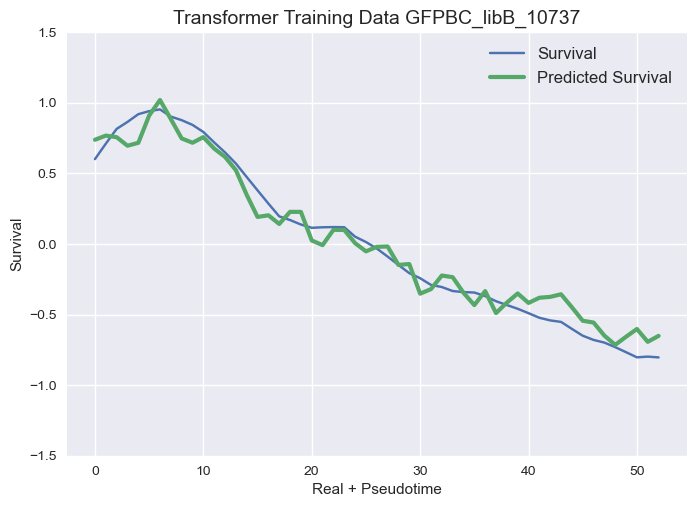

4/4 [==============================] - 0s 20ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.2985 - val_mean_squared_error: 0.2985
Epoch 2/20
Epoch 18/20
22/22 [==============================] - 0s 4ms/step - loss: 0.0538 - mean_squared_error: 0.0538 - val_loss: 0.2256 - val_mean_squared_error: 0.2256
Epoch 20/20
 1/22 [>.............................] - ETA: 0s - loss: 0.0652 - mean_squared_error: 0.0652 
Transformer Evaluation metrics
4/4 [==============================] - 0s 20ms/step - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.2089 - val_mean_squared_error: 0.2089
Transformer Training MSE - MSE: 0.0032Epoch 19/20

Transformer Validation MSE - MSE: 0.0731
8/8 [==============================] - 0s 13ms/step - loss: 0.0667 - mean_squared_error: 0.0667 - val_loss: 0.0223 - val_mean_squared_error: 0.0223
Epoch 3/20
4/4 [==============================] - 0s 21ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.2197 - val_mean_squared_error: 0.2

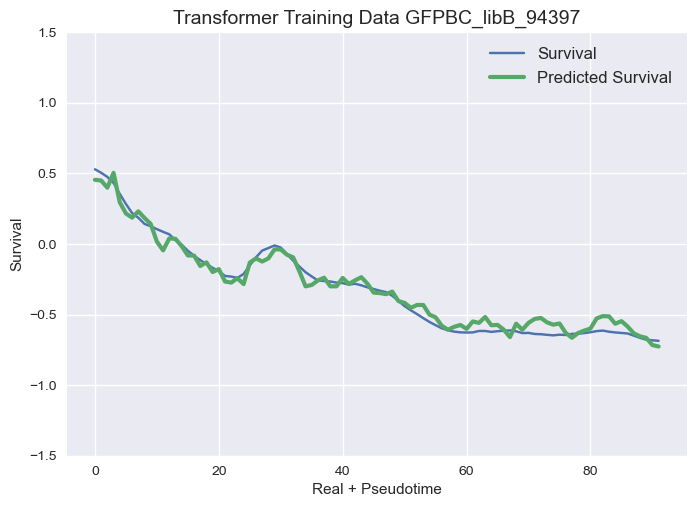

8/8 [==============================] - 0s 13ms/step - loss: 0.0429 - mean_squared_error: 0.0429 - val_loss: 0.0211 - val_mean_squared_error: 0.0211
Epoch 4/20
8/8 [==============================] - 0s 12ms/step - loss: 0.0296 - mean_squared_error: 0.0296 - val_loss: 0.0221 - val_mean_squared_error: 0.0221
Epoch 5/20
8/8 [==============================] - 0s 13ms/step - loss: 0.0275 - mean_squared_error: 0.0275 - val_loss: 0.0308 - val_mean_squared_error: 0.0308
Epoch 6/20


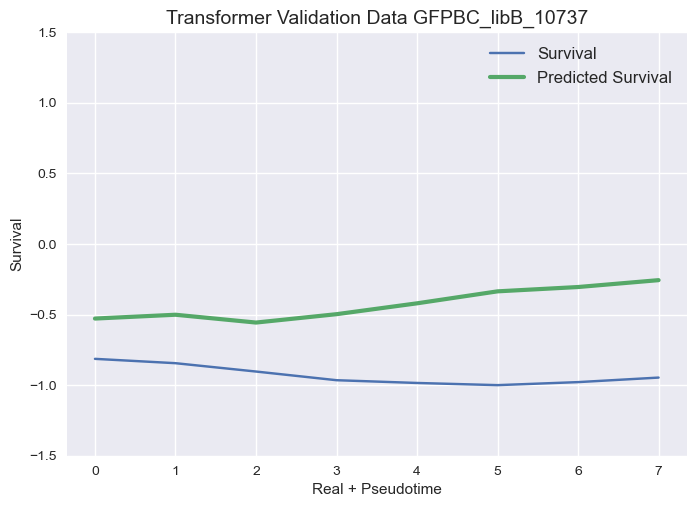

8/8 [==============================] - 0s 13ms/step - loss: 0.0231 - mean_squared_error: 0.0231 - val_loss: 0.0234 - val_mean_squared_error: 0.0234
Epoch 7/20
1/1 [==============================] - 0s 26ms/stepss: 0.0219 - mean_squared_error: 0.02
 
1/2 [==============>...............] - ETA: 0sTransformer Evaluation metrics
Transformer Training MSE - MSE: 0.0041
Transformer Validation MSE - MSE: 0.0507


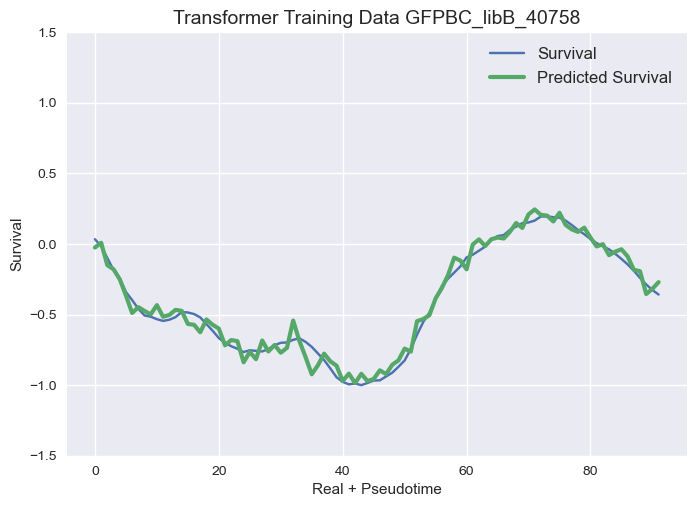

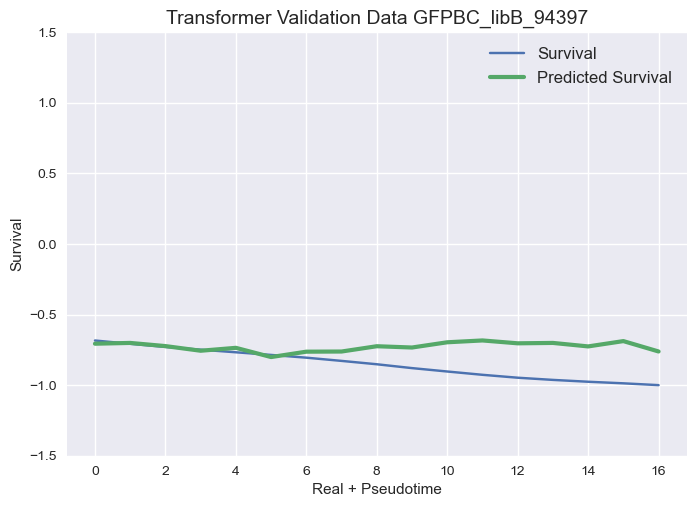

2/2 [==============================] - 0s 11ms/step
(92, 8, 72) (17, 8, 72)
1/1 [==============================] - 0s 28ms/step
 
Transformer Evaluation metrics
8/8 [==============================] - 0s 14ms/step - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0211 - val_mean_squared_error: 0.0211
Epoch 8/20
Transformer Training MSE - MSE: 0.0025
1/1 [==============================] - 0s 32ms/step
 
8/8 [==============================] - ETA: 0s - loss: 0.0162 - mean_squared_error: 0.0162Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0257
Transformer Validation MSE - MSE: 0.3372
8/8 [==============================] - 0s 13ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0503 - val_mean_squared_error: 0.0503
Epoch 9/20
8/8 [==============================] - 0s 12ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0170 - val_mean_squared_error: 0.0170
Epoch 10/20
1/1 [==============================] - 0s 27ms/stepss: 0.0139 - mea

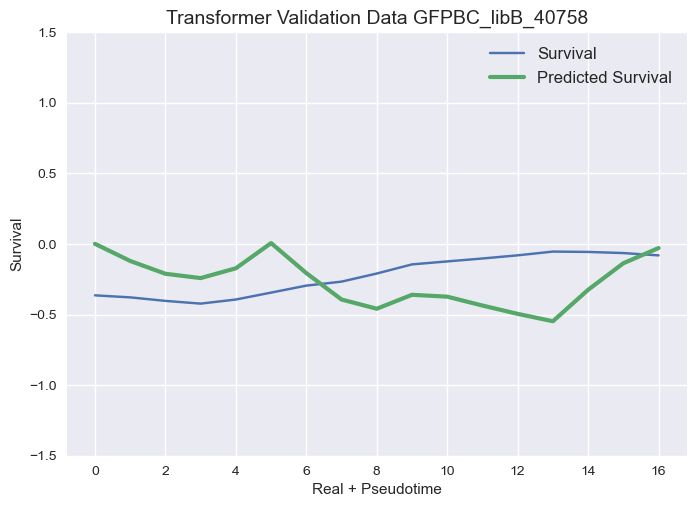

 7/14 [==============>...............] - ETA: 0s - loss: 0.1485 - mean_squared_error: 0.1485 

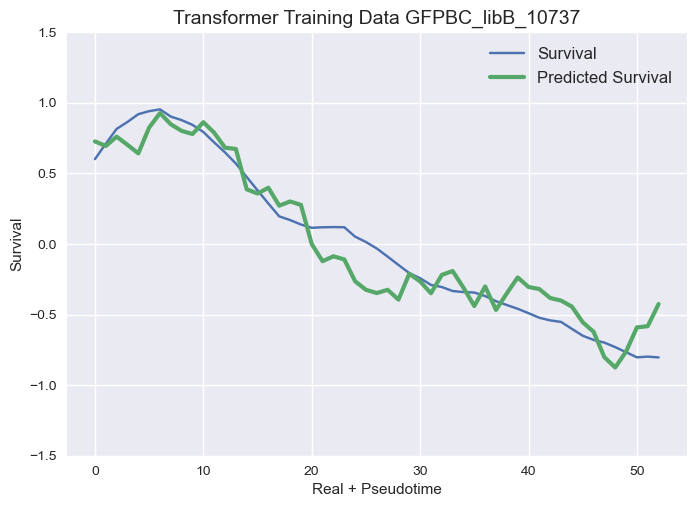

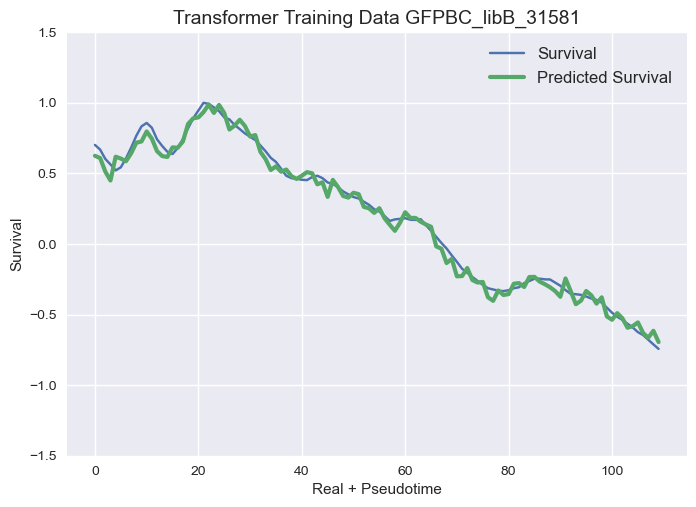

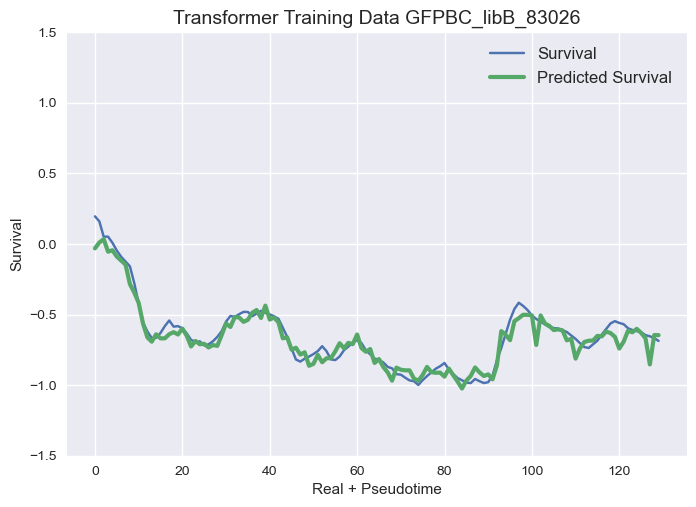

8/8 [==============================] - 0s 16ms/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0222 - val_mean_squared_error: 0.0222
Epoch 13/20
8/8 [==============================] - 0s 12ms/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0167 - val_mean_squared_error: 0.0167
Epoch 14/20
1/1 [==============================] - 0s 25ms/stepss: 0.0029 - mean_squared_error: 0.00


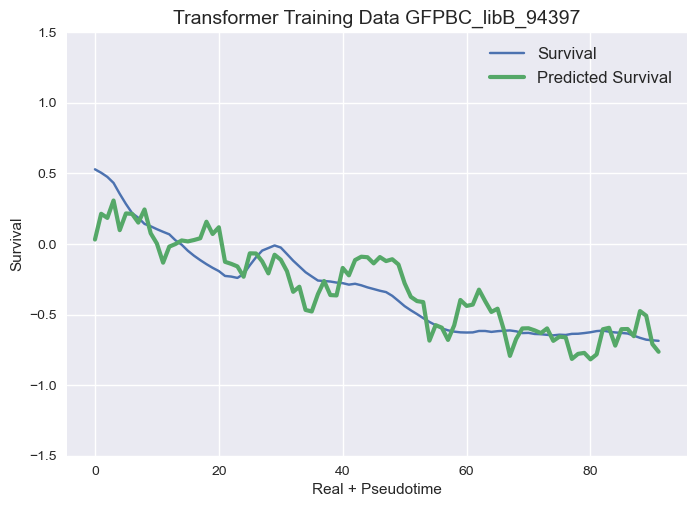

 
13/13 [==============================] - ETA: 0s - loss: 0.2943 - mean_squared_error: 0.2943
Transformer Training MSE - MSE: 0.0472
8/8 [==============================] - 0s 12ms/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0267 - val_mean_squared_error: 0.0267
Epoch 15/20
14/14 [==============================] - 2s 27ms/step - loss: 0.1091 - mean_squared_error: 0.1091 - val_loss: 0.0717 - val_mean_squared_error: 0.0717
Epoch 2/20
8/8 [==============================] - 0s 14ms/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.0155 - val_mean_squared_error: 0.0155
Epoch 16/20
13/13 [==============================] - 2s 29ms/step - loss: 0.2943 - mean_squared_error: 0.2943 - val_loss: 0.0122 - val_mean_squared_error: 0.0122


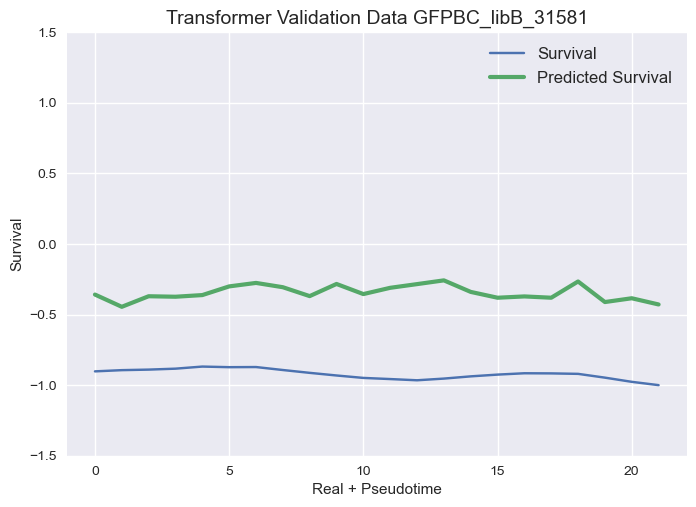

Epoch 2/20
(110, 8, 72) (22, 8, 72)
8/8 [==============================] - 0s 13ms/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0321 - val_mean_squared_error: 0.0321
Epoch 17/20


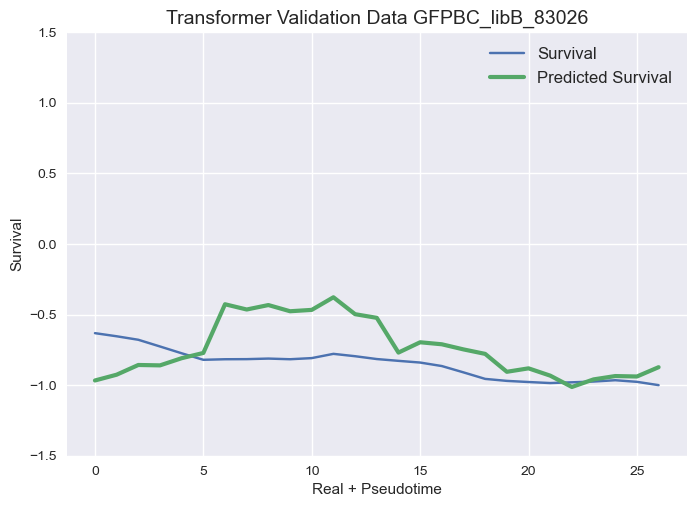

1/8 [==>...........................] - ETA: 0s - loss: 0.0047 - mean_squared_error: 0.0047

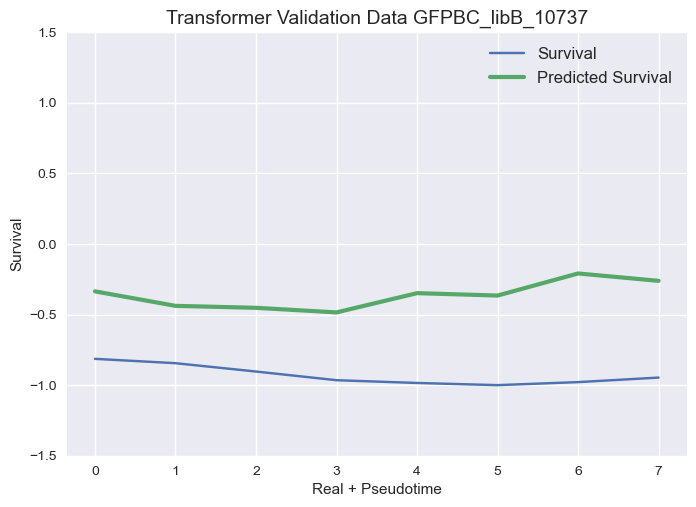

(53, 8, 72)(130, 8, 72) (27, 8, 72)
14/14 [==============================] - 0s 13ms/step - loss: 0.0657 - mean_squared_error: 0.0657 - val_loss: 0.0864 - val_mean_squared_error: 0.0864

8/8 [==============================] - 0s 13ms/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0192 - val_mean_squared_error: 0.0192
Epoch 18/20
1/8 [==>...........................] - ETA: 0s - loss: 0.0096 - mean_squared_error: 0.0096

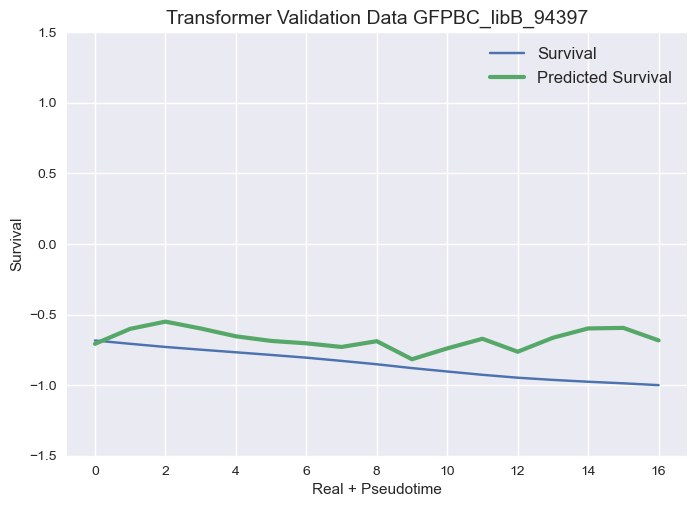

15/15 [==============================] - 2s 26ms/step - loss: 0.0660 - mean_squared_error: 0.0660 - val_loss: 0.1627 - val_mean_squared_error: 0.1627
Epoch 2/20
13/13 [==============================] - 0s 12ms/step - loss: 0.1217 - mean_squared_error: 0.1217 - val_loss: 0.2257 - val_mean_squared_error: 0.2257

13/14 [==========================>...] - ETA: 0s - loss: 0.0529 - mean_squared_error: 0.0529

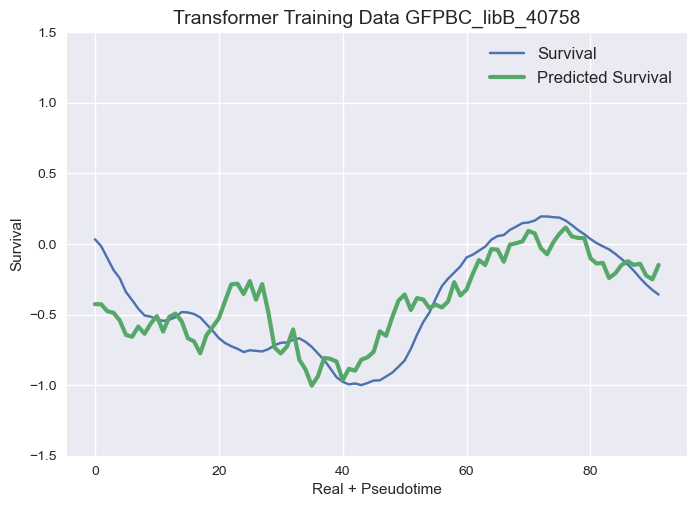

14/14 [==============================] - 0s 15ms/step - loss: 0.0548 - mean_squared_error: 0.0548 - val_loss: 0.0772 - val_mean_squared_error: 0.0772
Epoch 19/20
Epoch 4/20
1/8 [==>...........................] - ETA: 0s - loss: 0.0039 - mean_squared_error: 0.003917 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0382
Transformer Validation MSE - MSE: 0.4600
3/3 [==============================] - 0s 9ms/steposs: 0.0051 - mean_squared_error: 0.00

 1/13 [=>............................] - ETA: 0s - loss: 0.0501 - mean_squared_error: 0.0501Transformer Evaluation metricsEpoch 3/20

Transformer Training MSE - MSE: 0.0594
8/8 [==============================] - 0s 14ms/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0155 - val_mean_squared_error: 0.0155
Epoch 20/20

1/1 [==============================] - 0s 26ms/steploss: 0.0706 - mean_squared_error: 0.07

 
Transformer Evaluation metrics
Transformer Evaluation metrics
 6/15 [===========>..................] - E

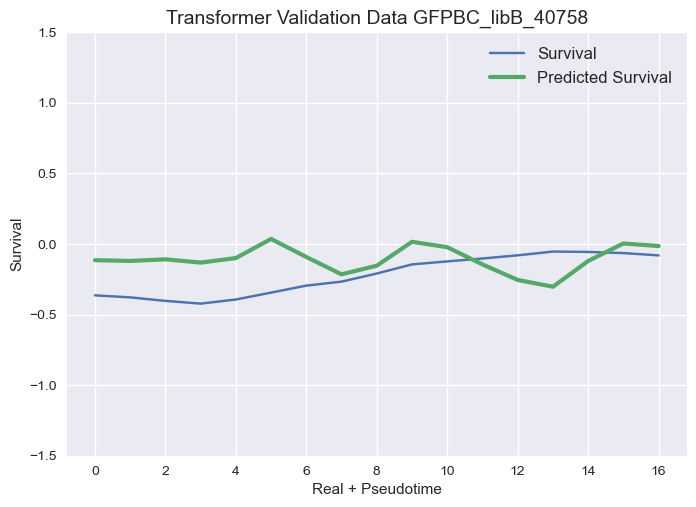

Epoch 6/20
 7/14 [==============>...............] - ETA: 0s - loss: 0.0214 - mean_squared_error: 0.0214(92, 8, 72(17, 8, 7


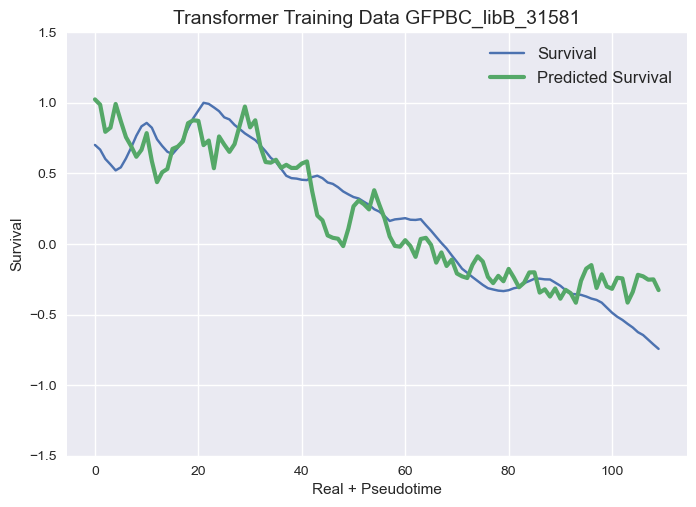

15/15 [==============================] - 0s 14ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.3392 - val_mean_squared_error: 0.3392
Epoch 7/20
Epoch 5/20
1/8 [==>...........................] - ETA: 1s

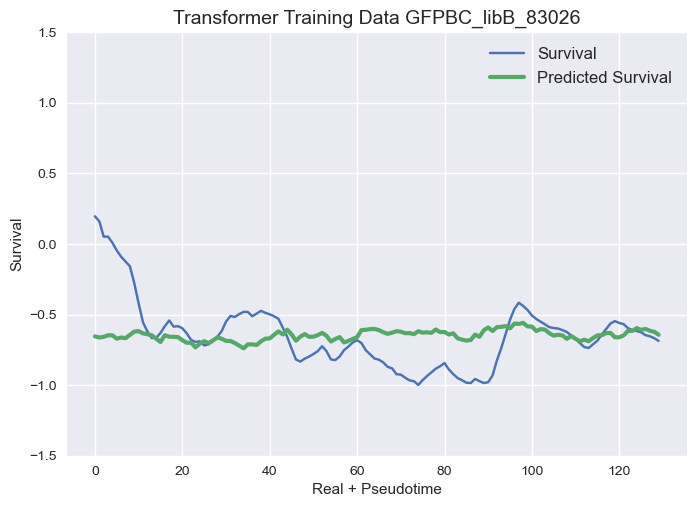

Epoch 7/20
8/8 [==============================] - 0s 5ms/step loss: 0.0243 - mean_squared_error: 0.02


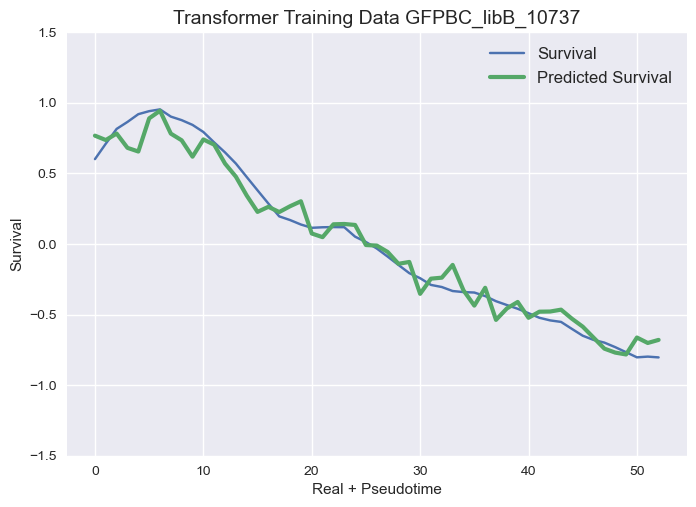

1/3 [=========>....................] - ETA: 0s0s - loss: 0.0108 - mean_squared_error: 0.0108

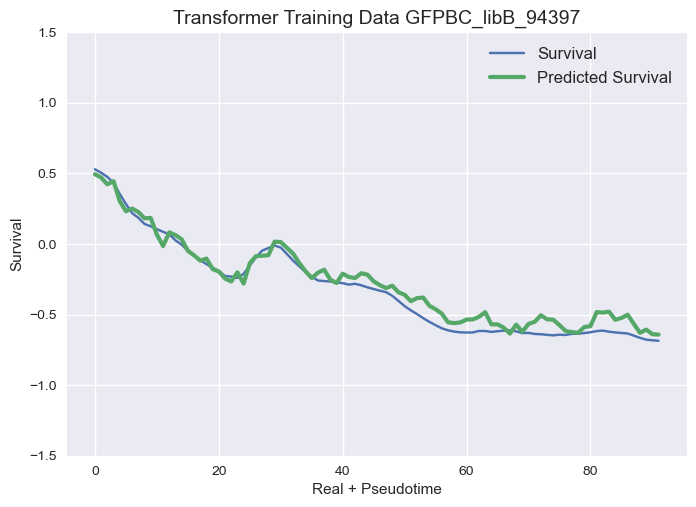

2/2 [==============================] - 0s 4ms/step loss: 0.0106 - mean_squared_error: 0.01
 
Transformer Evaluation metrics
12/13 [==========================>...] - ETA: 0s - loss: 0.0226 - mean_squared_error: 0.0226Transformer Training MSE - MSE: 0.0015
Transformer Validation MSE - MSE: 0.0380
1/1 [==============================] - 0s 47ms/step
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0033
Transformer Validation MSE - MSE: 0.0687
15/15 [==============================] - 0s 14ms/step - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.3750 - val_mean_squared_error: 0.3750
Epoch 6/20
Epoch 8/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.1071 - val_mean_squared_error: 0.1071
Epoch 8/20
 6/13 [============>.................] - ETA: 0s - loss: 0.0175 - mean_squared_error: 0.0175

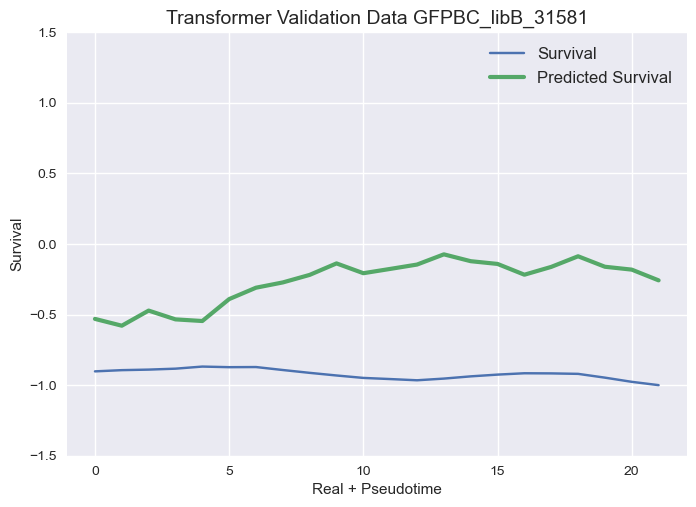

14/14 [==============================] - 0s 12ms/step - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0794 - val_mean_squared_error: 0.0794
Epoch 9/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.1111 - val_mean_squared_error: 0.1111
Epoch 9/20
 1/13 [=>............................] - ETA: 0s - loss: 0.0090 - mean_squared_error: 0.0090

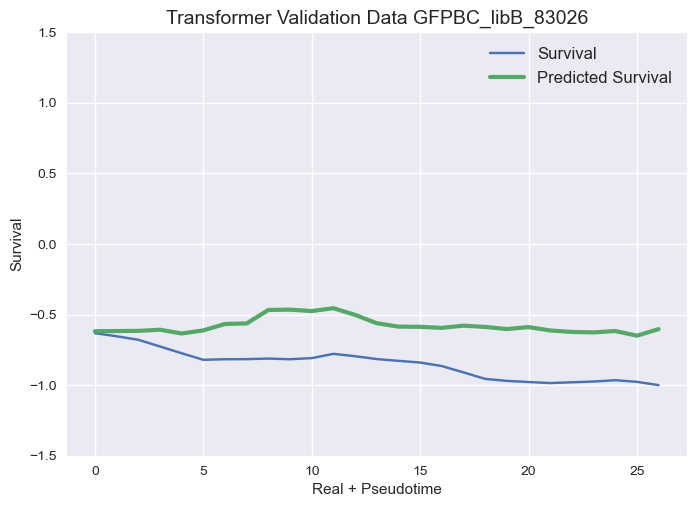

Epoch 7/20
11/14 [======================>.......] - ETA: 0s - loss: 0.0070 - mean_squared_error: 0.0070

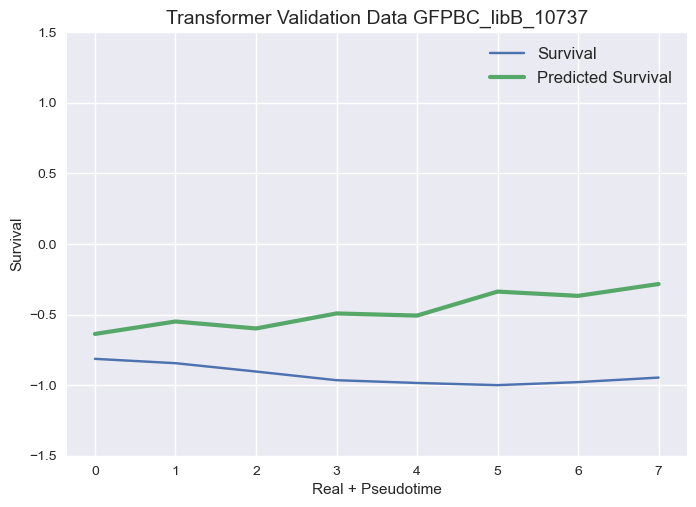

10/15 [===================>..........] - ETA: 0s - loss: 0.0065 - mean_squared_error: 0.0065Regr Training/Val set shapes (varies depending on barcode) 

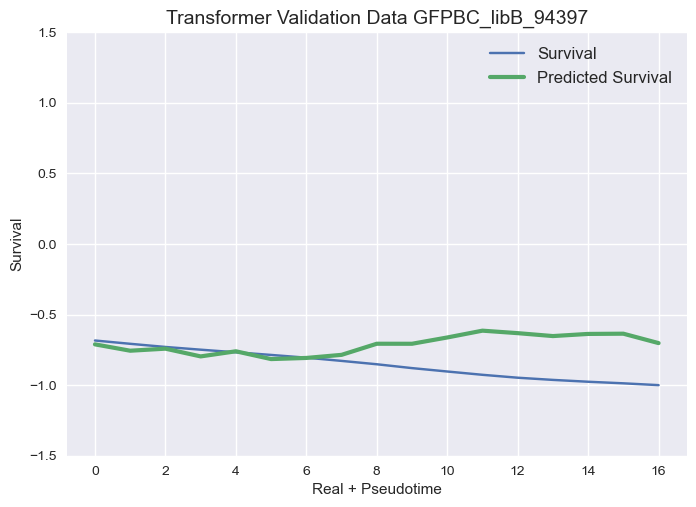

13/13 [==============================] - 0s 12ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.0824 - val_mean_squared_error: 0.0824

Epoch 10/20
14/22 [==================>...........] - ETA: 0s - loss: 0.2690 - mean_squared_error: 0.2690 
Regr Validation Data - MSE: 1.9358

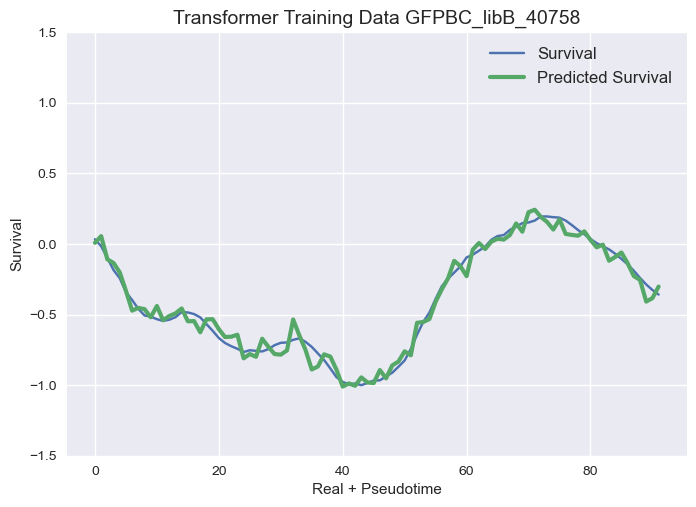

(100, 72)Evaluation metrics Regr 
Regr Training Data - MSE: 0.0000(25, 72)


14/14 [==============================] - 0s 18ms/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0805 - val_mean_squared_error: 0.0805
Epoch 10/20
 7/13 [===============>..............] - ETA: 0s - loss: 0.0124 - mean_squared_error: 0.0124
Transformer Evaluation metrics


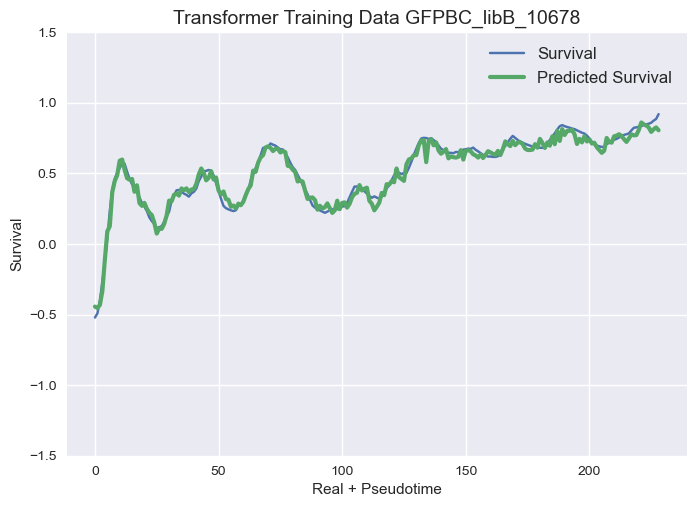

11/14 [======================>.......] - ETA: 0s - loss: 0.0064 - mean_squared_error: 0.0064Evaluation metrics Regr
Regr Training Data - MSE: 0.0100
Regr Validation Data - MSE: 0.4041
Transformer Training MSE - MSE: 0.0040
13/13 [==============================] - 0s 25ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0730 - val_mean_squared_error: 0.0730
Epoch 11/20
1/1 [==============================] - 0s 82ms/step
Epoch 11/20
 1/13 [=>............................] - ETA: 0s - loss: 0.0091 - mean_squared_error: 0.0091 
Transformer Evaluation metrics
 1/14 [=>............................] - ETA: 0s - loss: 0.0068 - mean_squared_error: 0.0068
Transformer Validation MSE - MSE: 0.1219
15/15 [==============================] - 0s 17ms/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.3087 - val_mean_squared_error: 0.3087
Epoch 9/20
22/22 [==============================] - 2s 27ms/step - loss: 0.2207 - mean_squared_error: 0.2207 - val_loss: 0.2785 - val_mean_squ

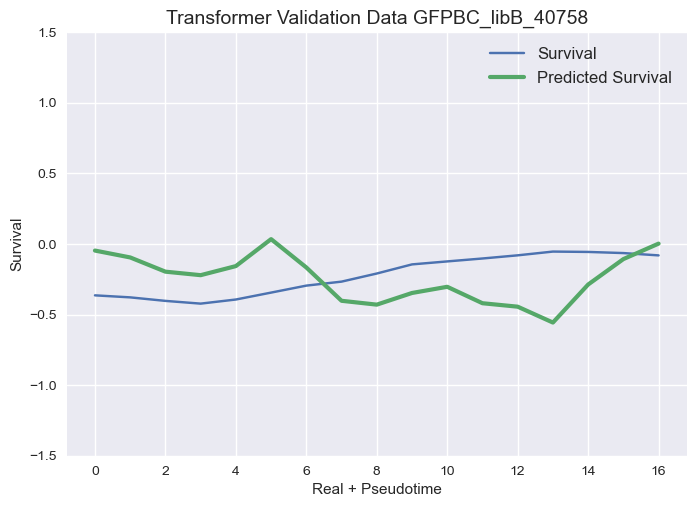

10/22 [============>.................] - ETA: 0s - loss: 0.1116 - mean_squared_error: 0.1116Regr Training/Val set shapes (varies depending on barcode (100, 72

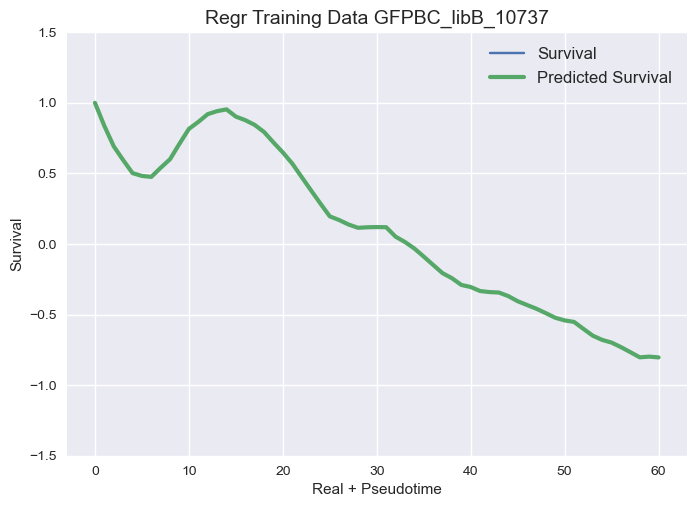

16/22 [====================>.........] - ETA: 0s - loss: 0.1085 - mean_squared_error: 0.1085Epoch 10/20
 
Evaluation metrics Regr

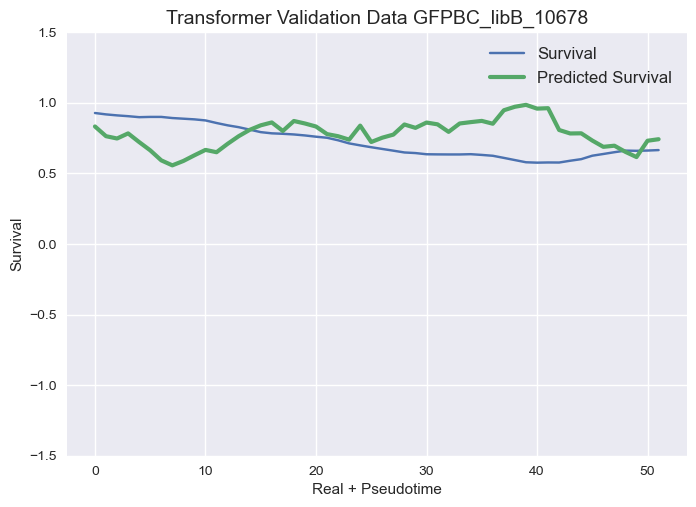

14/14 [==============================] - ETA: 0s - loss: 0.0092 - mean_squared_error: 0.0092


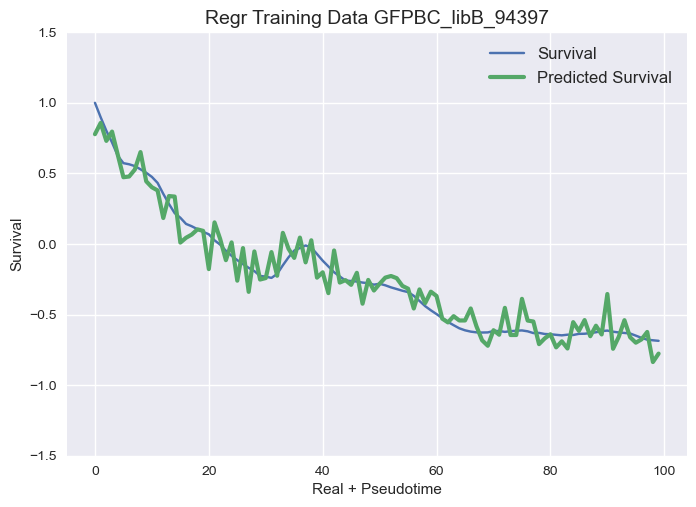

22/22 [==============================] - ETA: 0s - loss: 0.1093 - mean_squared_error: 0.1093(229, 8, 72)

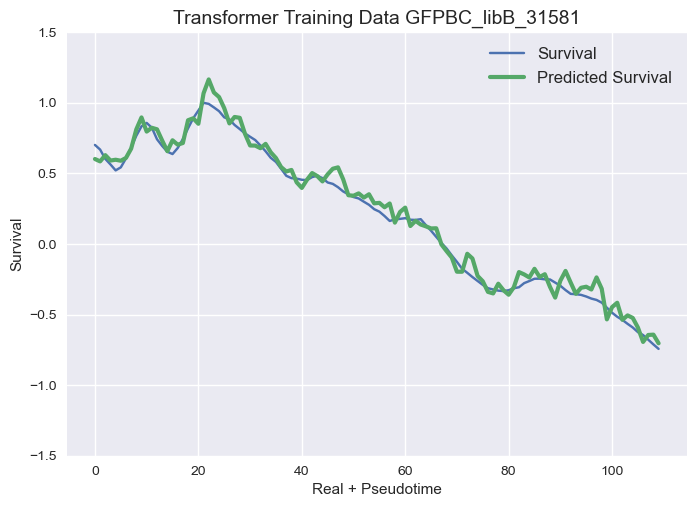



 (52, 8, 72)Regr Validation Data - MSE: 0.2320Epoch 13/20
14/14 [==============================] - 0s 18ms/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0682 - val_mean_squared_error: 0.0682

22/22 [==============================] - 0s 16ms/step - loss: 0.1093 - mean_squared_error: 0.1093 - val_loss: 0.3517 - val_mean_squared_error: 0.3517
Epoch 3/20
13/14 [==========================>...] - ETA: 0s - loss: 0.0082 - mean_squared_error: 0.0082

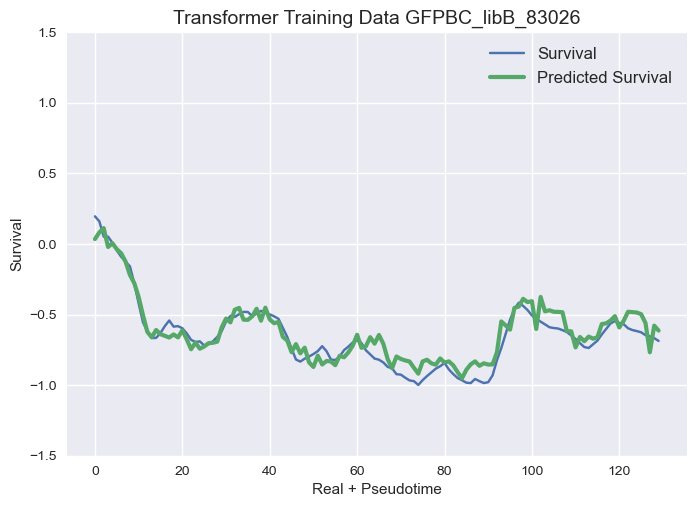

15/15 [==============================] - 0s 19ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.3232 - val_mean_squared_error: 0.3232
Epoch 11/20
14/14 [==============================] - 0s 12ms/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0693 - val_mean_squared_error: 0.0693

Epoch 14/20
Epoch 14/20
11/15 [=====================>........] - ETA: 0s - loss: 0.0044 - mean_squared_error: 0.0044

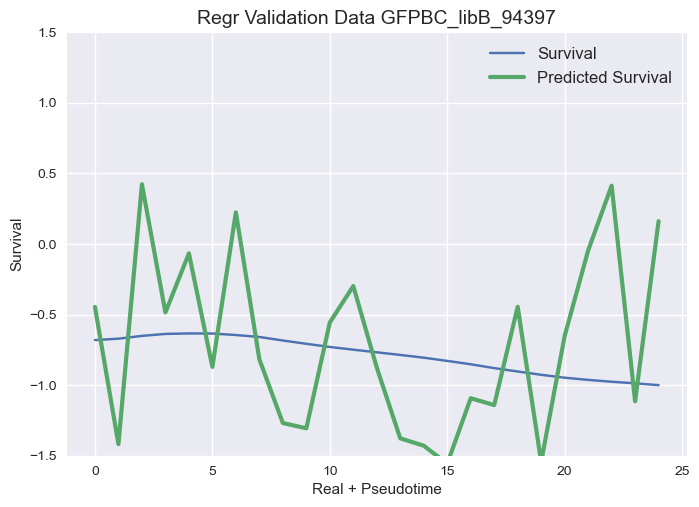

22/22 [==============================] - 0s 12ms/step - loss: 0.0880 - mean_squared_error: 0.0880 - val_loss: 0.3241 - val_mean_squared_error: 0.3241
Epoch 4/20


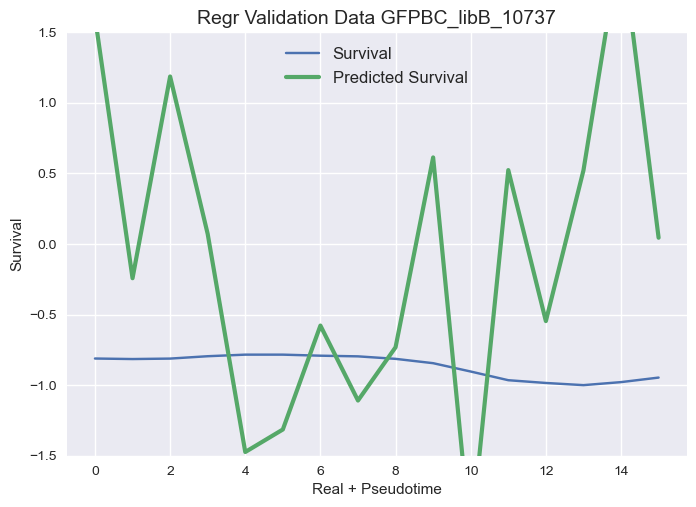

12/14 [========================>.....] - ETA: 0s - loss: 0.0058 - mean_squared_error: 0.0058Transformer Training/Val set shapes (varies depending on barcode) Transformer Training/Val set shapes (varies depending on barcode)  (131, 8, 72)  (218, 8, 72)(8, 8, 72) 
(17, 8, 72)
13/13 [==============================] - 0s 16ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0851 - val_mean_squared_error: 0.0851
Epoch 12/20
14/14 [==============================] - 0s 15ms/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0999 - val_mean_squared_error: 0.0999


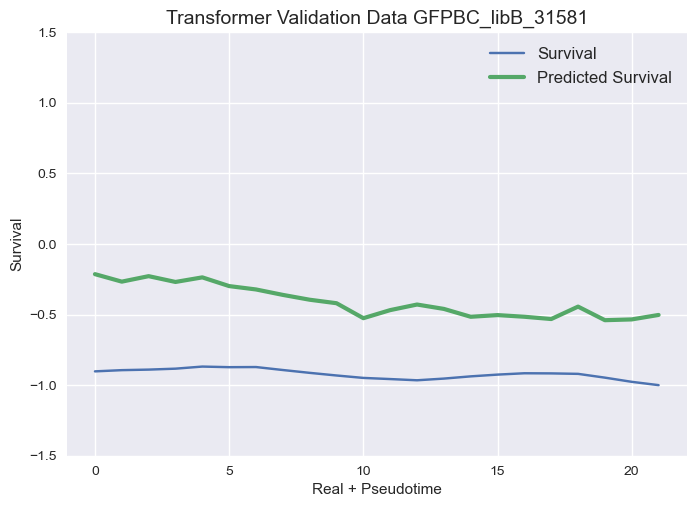

 1/15 [=>............................] - ETA: 0s - loss: 0.0014 - mean_squared_error: 0.0014Epoch 15/20
Epoch 15/20
 1/13 [=>............................] - ETA: 0s - loss: 0.0116 - mean_squared_error: 0.0116


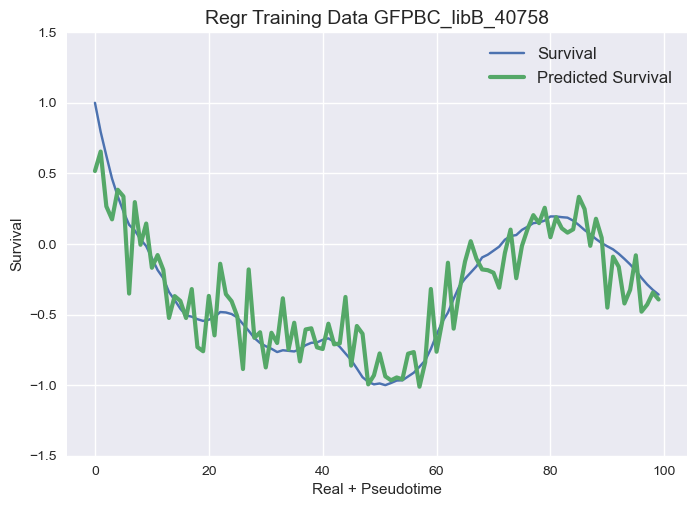

10/13 [======================>.......] - ETA: 0s - loss: 0.0097 - mean_squared_error: 0.0097Evaluation metrics Regr
Regr Training Data - MSE: 0.0331
Regr Validation Data - MSE: 0.6985
22/22 [==============================] - 0s 13ms/step - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.2938 - val_mean_squared_error: 0.2938
Epoch 5/20
 1/22 [>.............................] - ETA: 0s - loss: 0.0628 - mean_squared_error: 0.0628

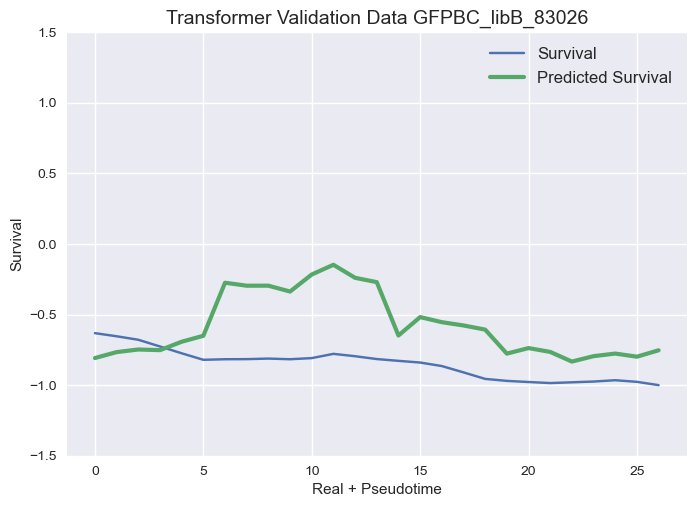

13/13 [==============================] - 0s 20ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0673 - val_mean_squared_error: 0.0673
Epoch 16/20


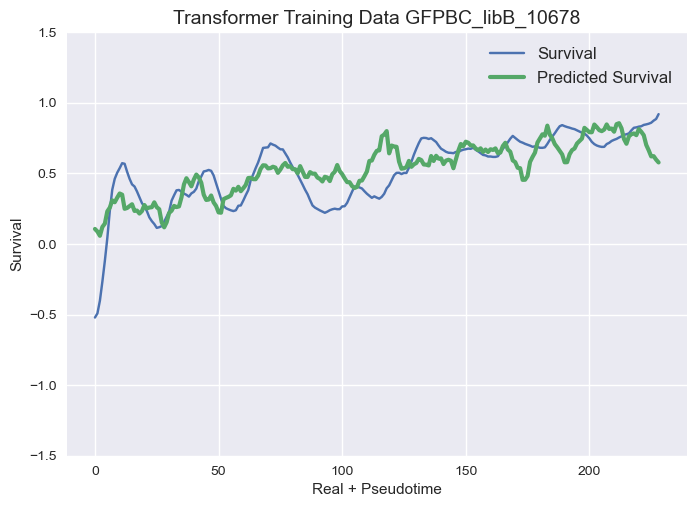

15/15 [==============================] - 0s 20ms/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.2761 - val_mean_squared_error: 0.2761
Epoch 13/20
14/14 [==============================] - 0s 21ms/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0691 - val_mean_squared_error: 0.0691
Epoch 16/20
13/13 [==============================] - 0s 24ms/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0902 - val_mean_squared_error: 0.0902
Epoch 17/20
15/15 [==============================] - 0s 20ms/step - loss: 0.0035 - mean_squared_error: 0.0035 - val_loss: 0.2665 - val_mean_squared_error: 0.2665
Epoch 6/20
Epoch 14/20
14/14 [==============================] - 0s 24ms/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0560 - val_mean_squared_error: 0.0560
Epoch 17/20
 3/22 [===>..........................] - ETA: 0s - loss: 0.0384 - mean_squared_error: 0.0384

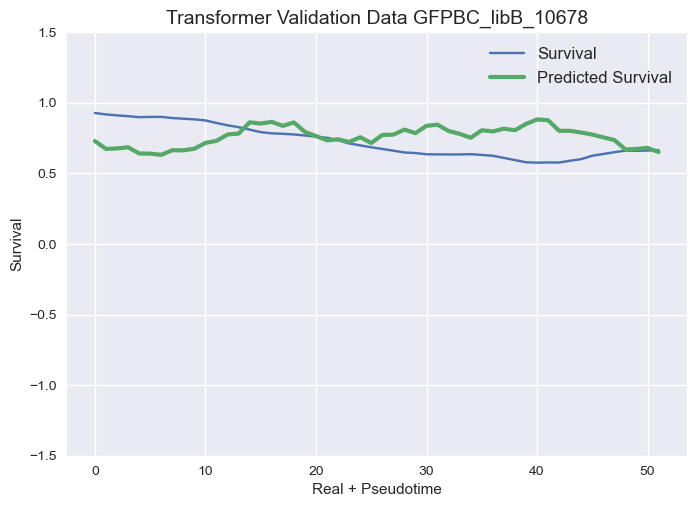

 6/15 [===========>..................] - ETA: 0s - loss: 0.0054 - mean_squared_error: 0.0054 (52, 8, 7

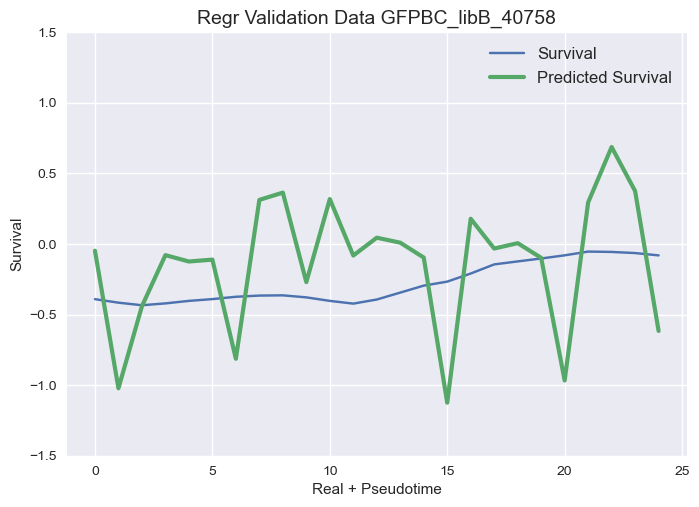

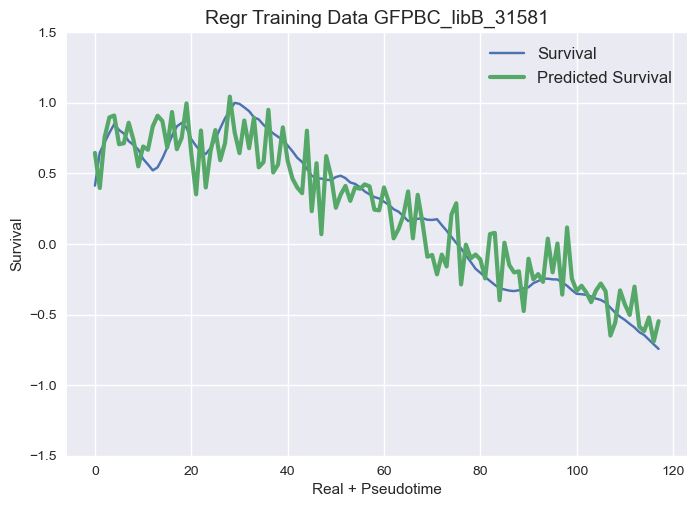

13/13 [==============================] - 0s 22ms/step - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0895 - val_mean_squared_error: 0.0895
Epoch 18/20
 1/15 [=>............................] - ETA: 0s - loss: 0.0045 - mean_squared_error: 0.0045
Evaluation metrics Regr
19/22 [========================>.....] - ETA: 0s - loss: 0.0299 - mean_squared_error: 0.0299
Regr Validation Data - MSE: 0.0776
14/14 [==============================] - 0s 23ms/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0779 - val_mean_squared_error: 0.0779
Epoch 18/20
1/8 [==>...........................] - ETA: 2s0s - loss: 0.0045 - mean_squared_error: 0.0045

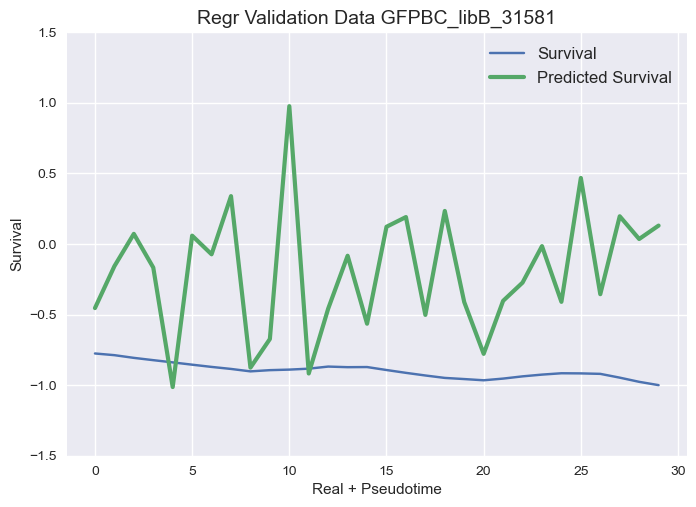

13/13 [==============================] - 0s 20ms/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0809 - val_mean_squared_error: 0.0809
Epoch 19/20
22/22 [==============================] - 1s 25ms/step - loss: 0.0279 - mean_squared_error: 0.0279 - val_loss: 0.2960 - val_mean_squared_error: 0.2960
Epoch 16/20
11/14 [======================>.......] - ETA: 0s - loss: 0.0053 - mean_squared_error: 0.0053 (22, 8, 72)
Epoch 1/20
2/2 [==============================] - 0s 5ms/step loss: 0.0028 - mean_squared_error: 0.00
 
14/14 [==============================] - 0s 17ms/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0716 - val_mean_squared_error: 0.0716
Transformer Evaluation metrics
14/22 [==================>...........] - ETA: 0s - loss: 0.0212 - mean_squared_error: 0.0212Epoch 19/20

15/15 [==============================] - 0s 13ms/step - loss: 0.0032 - mean_squared_error: 0.0032 - val_loss: 0.2951 - val_mean_squared_error: 0.2951
Epoch 17/20
13/13 [============

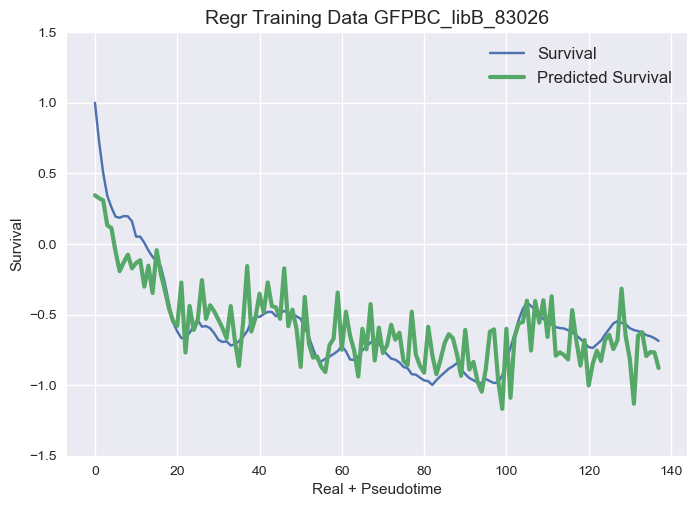

22/22 [==============================] - 0s 12ms/step - loss: 0.0195 - mean_squared_error: 0.0195 - val_loss: 0.2763 - val_mean_squared_error: 0.2763
(432, 8, 72)Epoch 9/20
 (102, 8, 72)
 1/22 [>.............................] - ETA: 0s - loss: 0.0127 - mean_squared_error: 0.0127

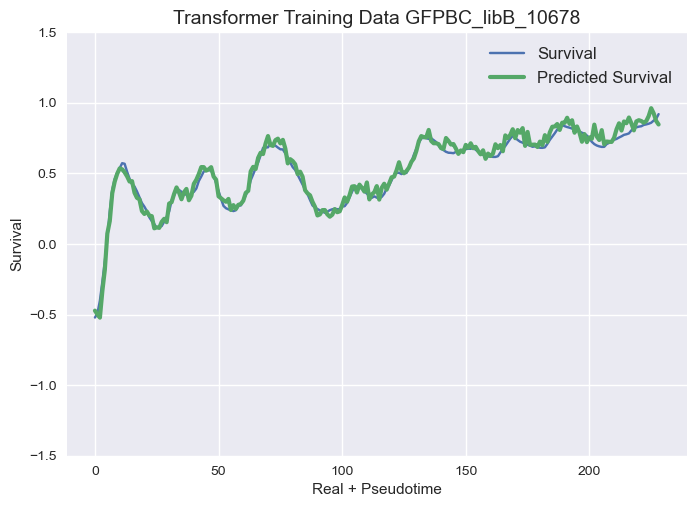

15/15 [==============================] - 0s 12ms/step - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.2768 - val_mean_squared_error: 0.2768
Epoch 19/20
 1/13 [=>............................] - ETA: 2s - loss: 0.0190 - mean_squared_error: 0.0190

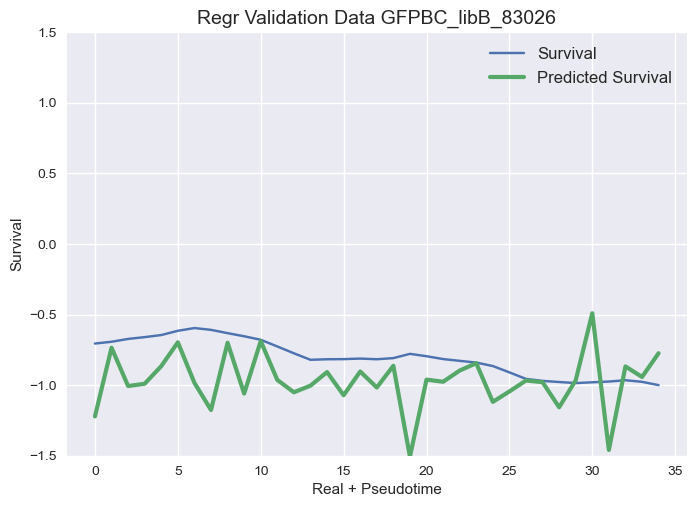

22/22 [==============================] - 0s 10ms/step - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.4165 - val_mean_squared_error: 0.4165
Epoch 10/20
15/15 [==============================] - 0s 11ms/step - loss: 0.0030 - mean_squared_error: 0.0030 - val_loss: 0.2920 - val_mean_squared_error: 0.2920barcode
Epoch 20/20
3/3 [==============================] - 0s 4ms/step loss: 0.0026 - mean_squared_error: 0.0026(27, 8,

 
16/22 [====================>.........] - ETA: 0s - loss: 0.0180 - mean_squared_error: 0.0180
Transformer Training MSE - MSE: 0.0018
4/4 [==============================] - 0s 3ms/step
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0030
Transformer Validation MSE - MSE: 0.1047
15/15 [==============================] - 0s 11ms/step - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.2960 - val_mean_squared_error: 0.2960


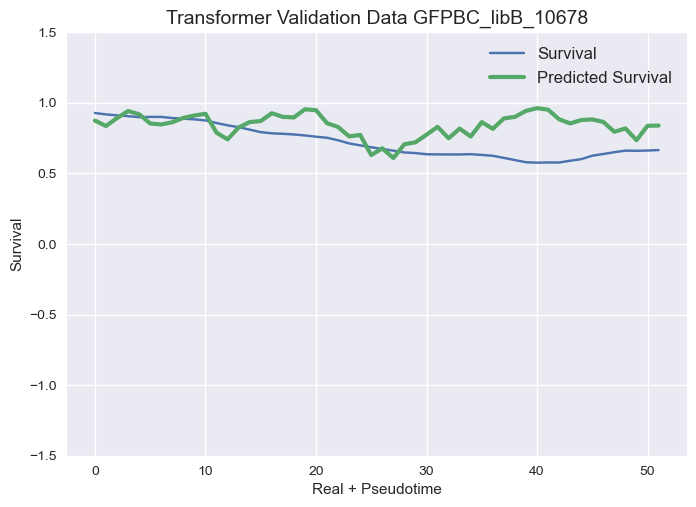

(469, 8, 72) (111, 8, 72)
22/22 [==============================] - 0s 9ms/step - loss: 0.0187 - mean_squared_error: 0.0187 - val_loss: 0.2868 - val_mean_squared_error: 0.2868
Epoch 11/20
 7/15 [=============>................] - ETA: 0sEvaluation metrics Regr
Regr Training Data - MSE: 0.0311
Regr Validation Data - MSE: 0.0534
22/22 [==============================] - 0s 22ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.2588 - val_mean_squared_error: 0.2588
Epoch 12/20
 9/22 [===========>..................] - ETA: 0s - loss: 0.0131 - mean_squared_error: 0.0131 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0025
Transformer Validation MSE - MSE: 0.3134
22/22 [==============================] - 0s 8ms/step - loss: 0.0143 - mean_squared_error: 0.0143 - val_loss: 0.2805 - val_mean_squared_error: 0.2805


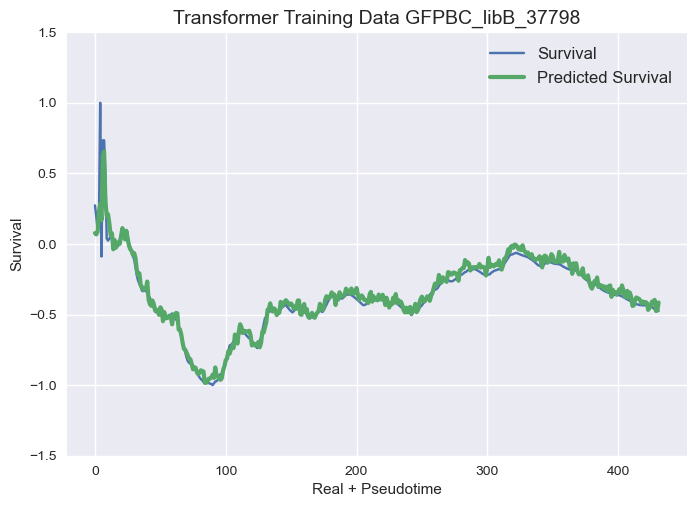

Epoch 13/20
 1/22 [>.............................] - ETA: 0s - loss: 0.0135 - mean_squared_error: 0.0135

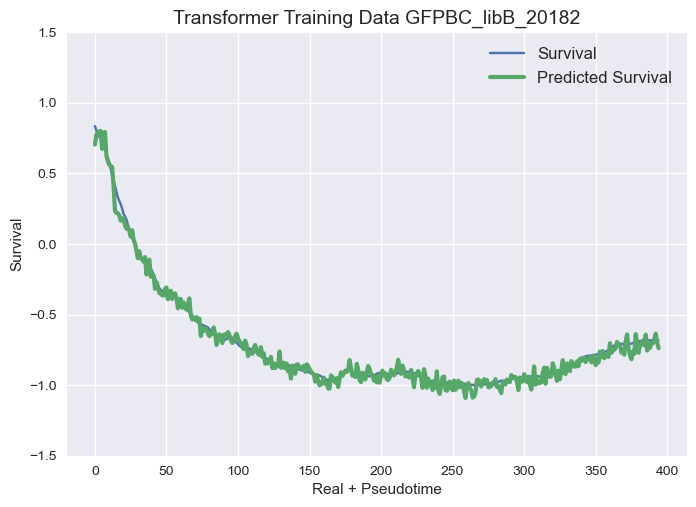

18/22 [=======================>......] - ETA: 0s - loss: 0.0136 - mean_squared_error: 0.0136

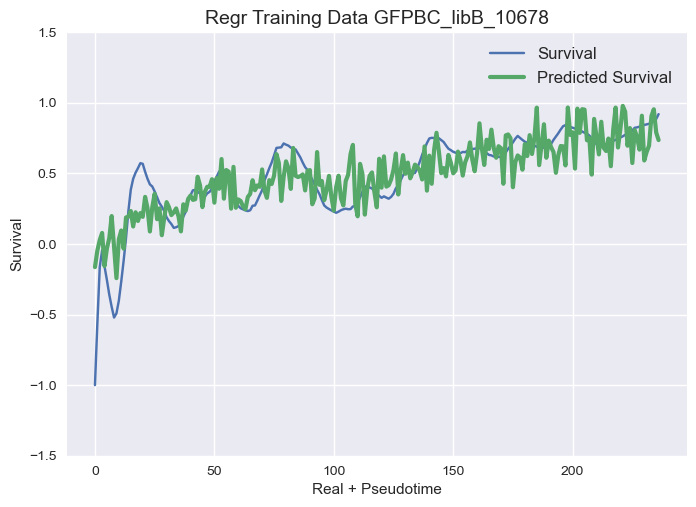

22/22 [==============================] - 0s 8ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.3663 - val_mean_squared_error: 0.3663
Epoch 14/20
17/22 [======================>.......] - ETA: 0s - loss: 0.0115 - mean_squared_error: 0.0115

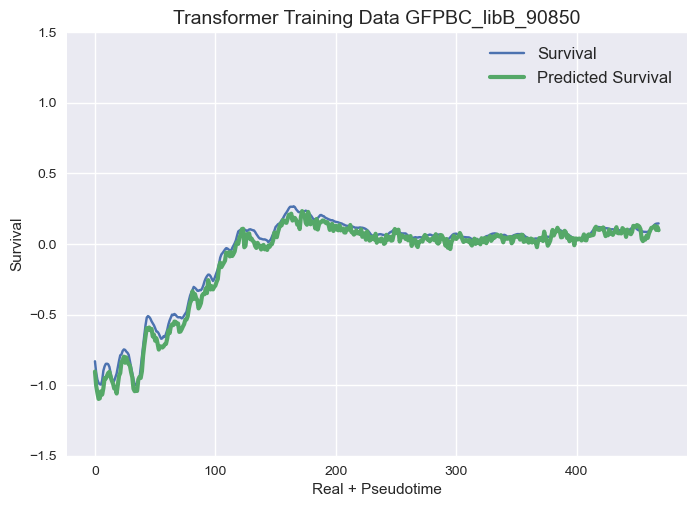

Epoch 1/20
22/22 [==============================] - 0s 9ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.2937 - val_mean_squared_error: 0.2937
Epoch 15/20


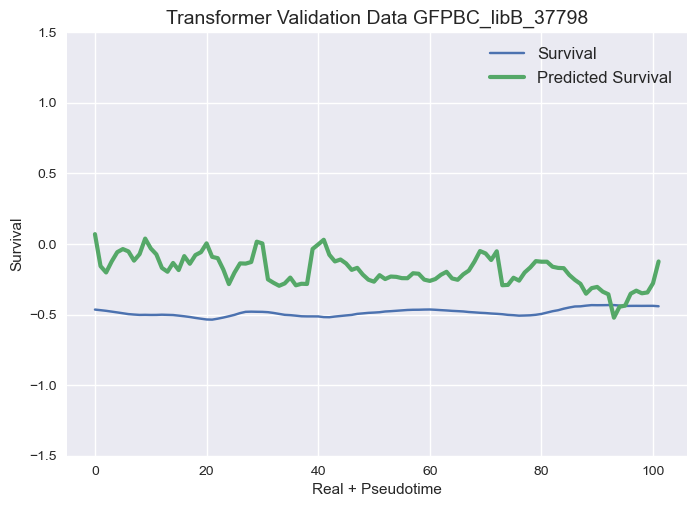

 1/22 [>.............................] - ETA: 0s - loss: 0.0078 - mean_squared_error: 0.0078(432, 8, 72) (102, 8, 72)


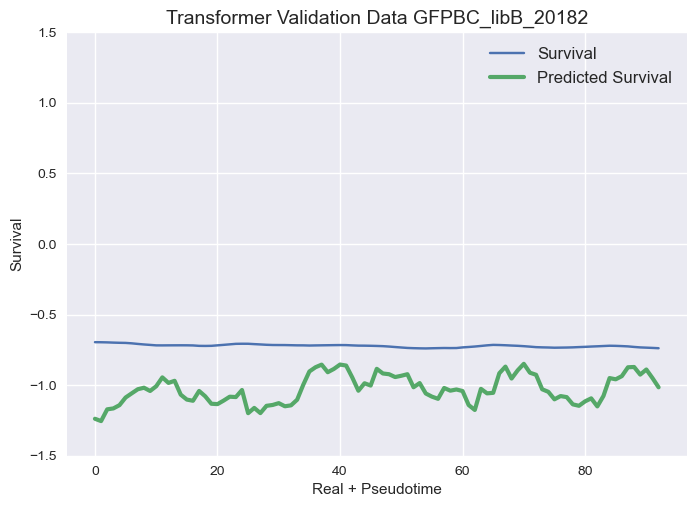

(395, 8, 72) (93, 8, 72)
14/14 [==============================] - 0s 1ms/steposs: 0.0139 - mean_squared_error: 0.01


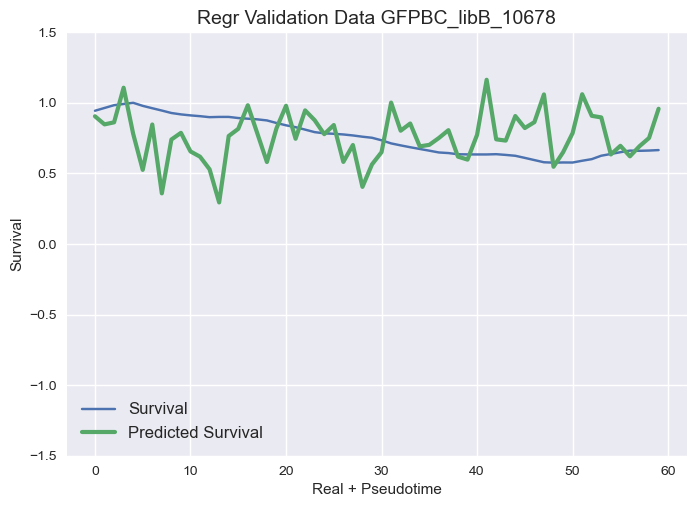

22/22 [==============================] - 0s 9ms/step - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.3373 - val_mean_squared_error: 0.3373
Epoch 16/20
4/4 [==============================] - 0s 2ms/step loss: 0.0106 - mean_squared_error: 0.01
 (52, 8, 72)

Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0366
Transformer Validation MSE - MSE: 0.0914
1/7 [===>..........................] - ETA: 13s - loss: 0.1939 - mean_squared_error: 0.19397 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0520
Transformer Validation MSE - MSE: 0.1268
6/7 [========================>.....] - ETA: 0s - loss: 0.1293 - mean_squared_error: 0.1293 

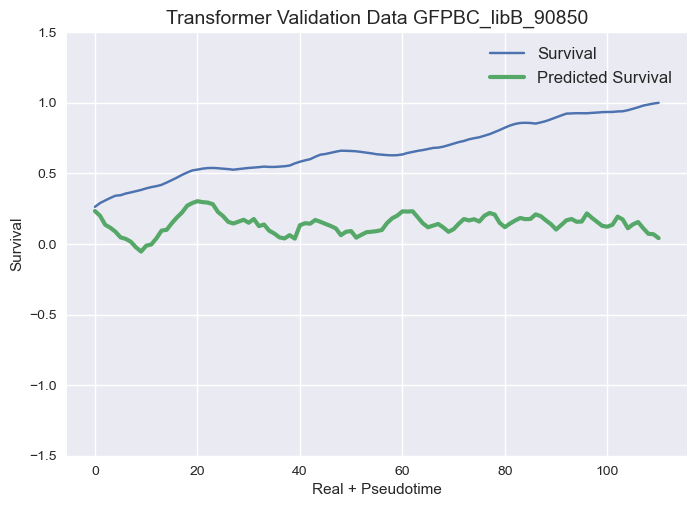

(469, 8, 72) (111, 8, 72)
22/22 [==============================] - 0s 10ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.2999 - val_mean_squared_error: 0.2999
Epoch 17/20
22/22 [==============================] - 0s 9ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.3009 - val_mean_squared_error: 0.3009
Epoch 18/20
7/7 [==============================] - 3s 57ms/step - loss: 0.1184 - mean_squared_error: 0.1184 - val_loss: 0.0489 - val_mean_squared_error: 0.0489
Epoch 2/20
 9/22 [===========>..................] - ETA: 0s - loss: 0.0103 - mean_squared_error: 0.0103
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0147
Transformer Validation MSE - MSE: 0.2332

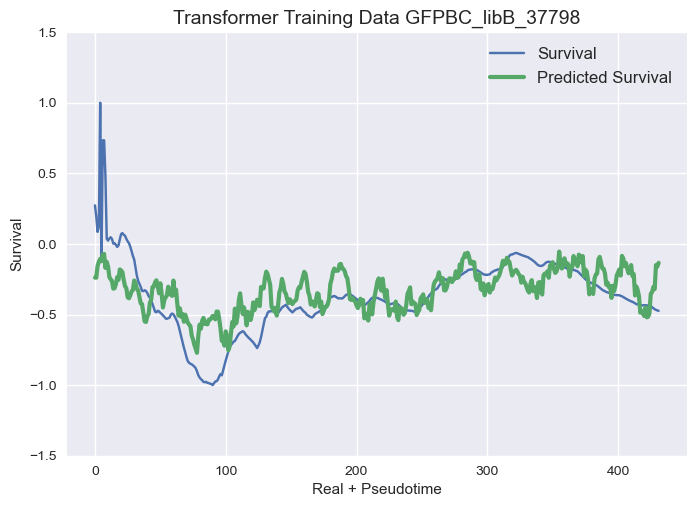


7/7 [==============================] - 0s 16ms/step - loss: 0.0357 - mean_squared_error: 0.0357 - val_loss: 0.0494 - val_mean_squared_error: 0.0494
Epoch 3/20
5/5 [==============================] - 2s 74ms/step - loss: 0.3906 - mean_squared_error: 0.3906 - val_loss: 0.2236 - val_mean_squared_error: 0.2236


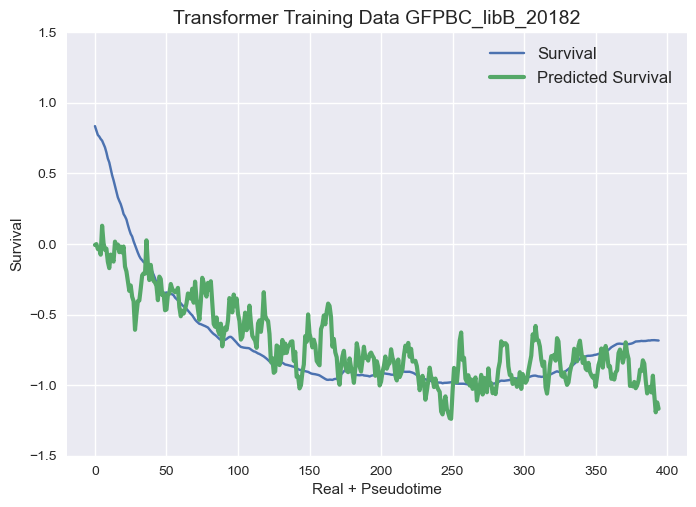

Epoch 2/20
22/22 [==============================] - 0s 11ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.2458 - val_mean_squared_error: 0.2458
Epoch 19/20
7/7 [==============================] - 0s 15ms/step - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0734 - val_mean_squared_error: 0.0734
Epoch 4/20
5/5 [==============================] - 0s 20ms/step - loss: 0.3367 - mean_squared_error: 0.3367 - val_loss: 0.1416 - val_mean_squared_error: 0.1416
Epoch 4/20
7/7 [==============================] - 0s 20ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 5/20
5/5 [==============================] - 0s 17ms/step - loss: 0.2997 - mean_squared_error: 0.2997 - val_loss: 0.0824 - val_mean_squared_error: 0.0824
Epoch 5/20
22/22 [==============================] - 0s 12ms/step - loss: 0.0122 - mean_squared_error: 0.0122 - val_loss: 0.2947 - val_mean_squared_error: 0.2947
Epoch 20/20


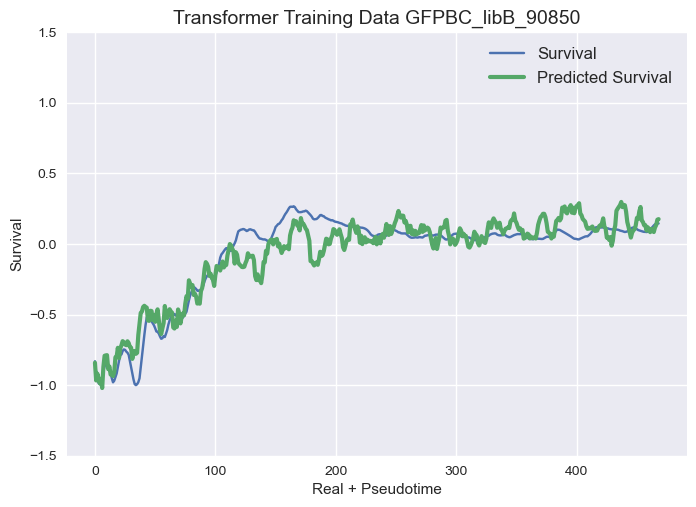

 1/22 [>.............................] - ETA: 0s - loss: 0.0133 - mean_squared_error: 0.0133

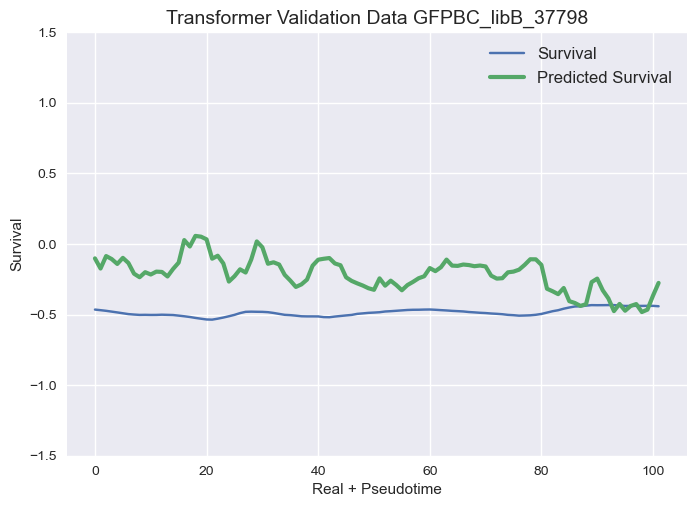

(432, 8, 72) (102, 8, 72)
7/7 [==============================] - 0s 18ms/step - loss: 0.0136 - mean_squared_error: 0.0136 - val_loss: 0.0418 - val_mean_squared_error: 0.0418
Epoch 6/20
Epoch 6/20
1/7 [===>..........................] - ETA: 0s - loss: 0.0110 - mean_squared_error: 0.0110

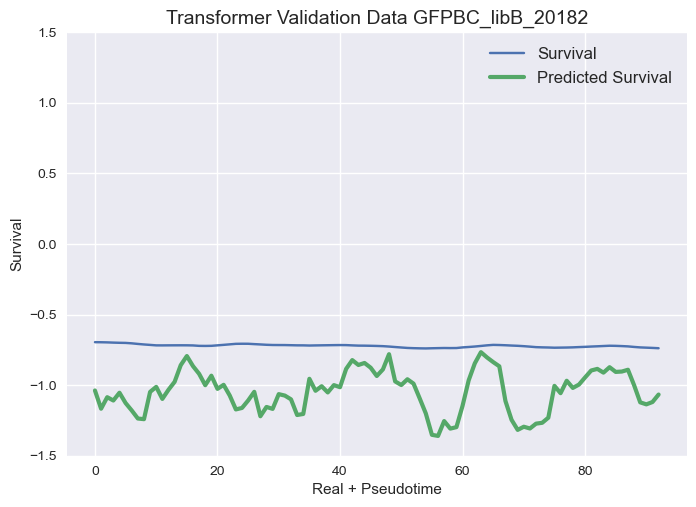

5/5 [==============================] - 0s 18ms/step - loss: 0.1612 - mean_squared_error: 0.1612 - val_loss: 0.0994 - val_mean_squared_error: 0.0994
Epoch 7/20

7/7 [==============================] - 0s 23ms/step - loss: 0.0126 - mean_squared_error: 0.0126 - val_loss: 0.0571 - val_mean_squared_error: 0.0571
Epoch 7/20
5/5 [==============================] - 0s 16ms/step - loss: 0.1279 - mean_squared_error: 0.1279 - val_loss: 0.0757 - val_mean_squared_error: 0.0757
Epoch 8/20
7/7 [==============================] - 3s 62ms/step - loss: 0.2073 - mean_squared_error: 0.2073 - val_loss: 0.0650 - val_mean_squared_error: 0.0650
Epoch 2/20
1/7 [===>..........................] - ETA: 0s - loss: 0.1423 - mean_squared_error: 0.1423Epoch 1/20

5/5 [==============================] - 0s 18ms/step - loss: 0.0915 - mean_squared_error: 0.0915 - val_loss: 0.0268 - val_mean_squared_error: 0.0268
Epoch 9/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_

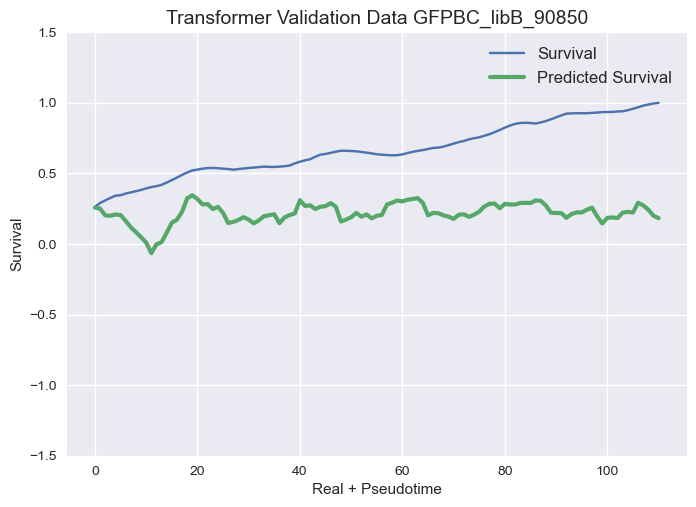

7/7 [==============================] - 0s 18ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0654 - val_mean_squared_error: 0.0654
Epoch 9/20
1/7 [===>..........................] - ETA: 0s - loss: 0.0086 - mean_squared_error: 0.0086 
Transformer Evaluation metrics
7/7 [==============================] - 0s 16ms/step - loss: 0.0844 - mean_squared_error: 0.0844 - val_loss: 0.0065 - val_mean_squared_error: 0.0065
Transformer Training MSE - MSE: 0.0025Epoch 4/20

1/7 [===>..........................] - ETA: 0s - loss: 0.0805 - mean_squared_error: 0.0805
Epoch 11/20
7/7 [==============================] - 0s 16ms/step - loss: 0.0092 - mean_squared_error: 0.0092 - val_loss: 0.0497 - val_mean_squared_error: 0.0497
Epoch 10/20
5/5 [==============================] - 0s 19ms/step - loss: 0.0436 - mean_squared_error: 0.0436 - val_loss: 0.1503 - val_mean_squared_error: 0.1503
Epoch 5/20
Epoch 12/20
5/5 [==============================] - 0s 18ms/step - loss: 0.0390 - mean_squared_erro

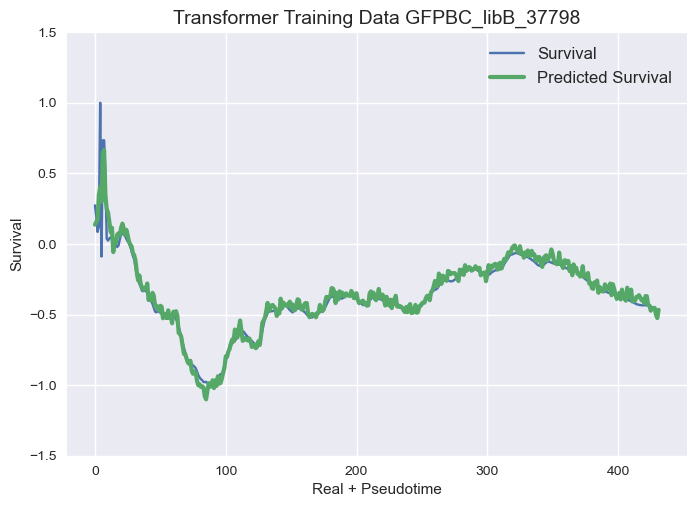

9/9 [==============================] - 0s 15ms/step - loss: 0.1065 - mean_squared_error: 0.1065 - val_loss: 0.3438 - val_mean_squared_error: 0.3438

Epoch 3/20
5/5 [==============================] - 0s 24ms/step - loss: 0.0390 - mean_squared_error: 0.0390 - val_loss: 0.1337 - val_mean_squared_error: 0.1337
Epoch 14/20
7/7 [==============================] - 0s 19ms/step - loss: 0.0257 - mean_squared_error: 0.0257 - val_loss: 0.0072 - val_mean_squared_error: 0.0072
Epoch 7/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0450 - val_mean_squared_error: 0.0450
Epoch 12/20

Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0009
Transformer Validation MSE - MSE: 0.2960
5/5 [==============================] - 0s 23ms/step - loss: 0.0267 - mean_squared_error: 0.0267 - val_loss: 0.2243 - val_mean_squared_error: 0.2243
Epoch 15/20
9/9 [==============================] - 0s 17ms/step - loss: 0.0664 - mean_squared_error: 

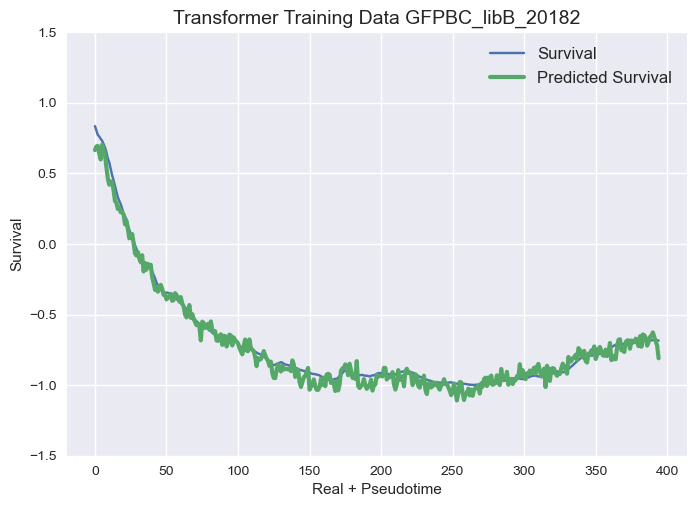

7/7 [==============================] - 0s 22ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.0061 - val_mean_squared_error: 0.0061
Epoch 13/20
9/9 [==============================] - 0s 16ms/step - loss: 0.0494 - mean_squared_error: 0.0494 - val_loss: 0.1980 - val_mean_squared_error: 0.1980
Epoch 5/20
7/7 [==============================] - 0s 21ms/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0504 - val_mean_squared_error: 0.0504
Epoch 14/20
7/7 [==============================] - 0s 22ms/step - loss: 0.0215 - mean_squared_error: 0.0215 - val_loss: 0.0071 - val_mean_squared_error: 0.0071
Epoch 9/20
6/7 [========================>.....] - ETA: 0s - loss: 0.0063 - mean_squared_error: 0.0063

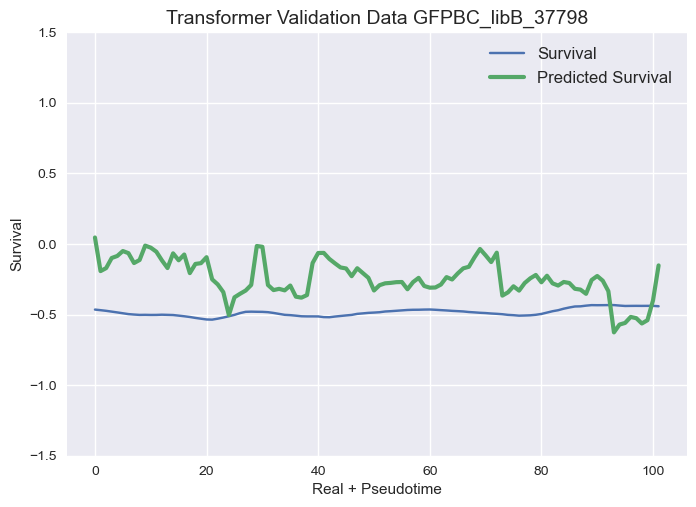

5/5 [==============================] - 0s 25ms/step - loss: 0.0235 - mean_squared_error: 0.0235 - val_loss: 0.0998 - val_mean_squared_error: 0.0998
Epoch 18/20
9/9 [==============================] - 0s 17ms/step - loss: 0.0427 - mean_squared_error: 0.0427 - val_loss: 0.1797 - val_mean_squared_error: 0.1797
Epoch 15/20
Epoch 6/20


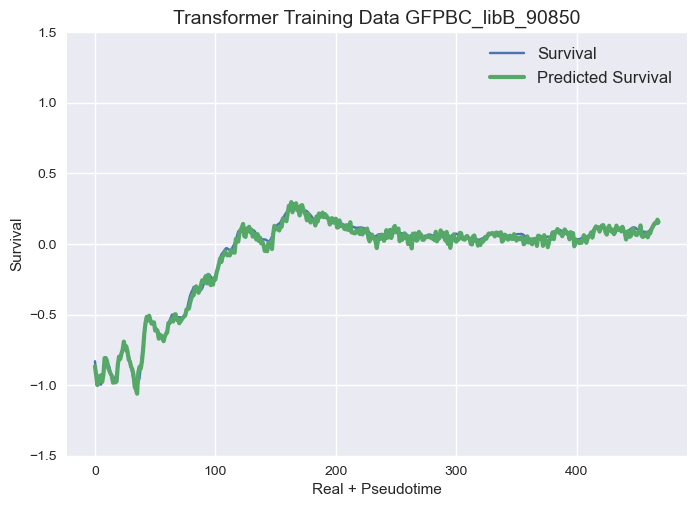

5/5 [==============================] - 0s 17ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.2141 - val_mean_squared_error: 0.2141)  (440, 72
Epoch 19/20
1/7 [===>..........................] - ETA: 0s - loss: 0.0103 - mean_squared_error: 0.0103


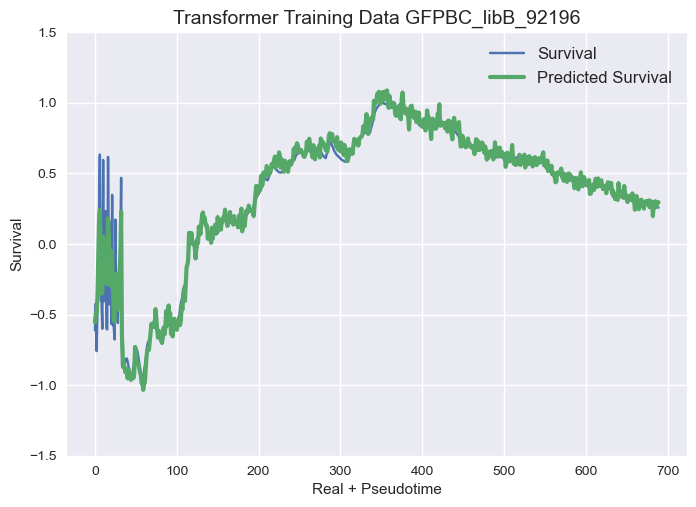

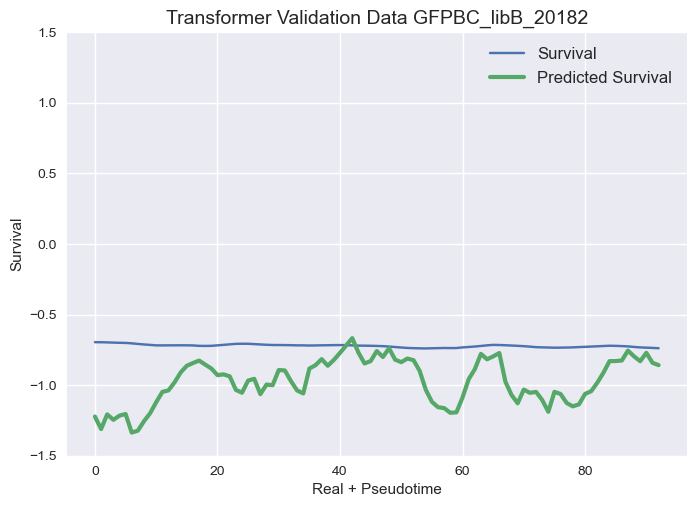

9/9 [==============================] - 0s 23ms/step - loss: 0.0317 - mean_squared_error: 0.0317 - val_loss: 0.1901 - val_mean_squared_error: 0.1901
Epoch 16/20
Regr Training/Val set shapes (varies depending on barcode) Epoch 7/20
10/10 [==============================] - 3s 47ms/step - loss: 0.1151 - mean_squared_error: 0.1151 - val_loss: 0.1400 - val_mean_squared_error: 0.1400
Epoch 11/20
7/7 [==============================] - 0s 23ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0198 - val_mean_squared_error: 0.0198
Epoch 12/20
5/5 [==============================] - 0s 52ms/step - loss: 0.0173 - mean_squared_error: 0.0173 - val_loss: 0.0807 - val_mean_squared_error: 0.0807
Evaluation metrics Regr
1/7 [===>..........................] - ETA: 0s - loss: 0.0113 - mean_squared_error: 0.0113Regr Training Data - MSE: 0.0731
Regr Validation Data - MSE: 0.0429
7/7 [==============================] - 0s 40ms/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0369 - v

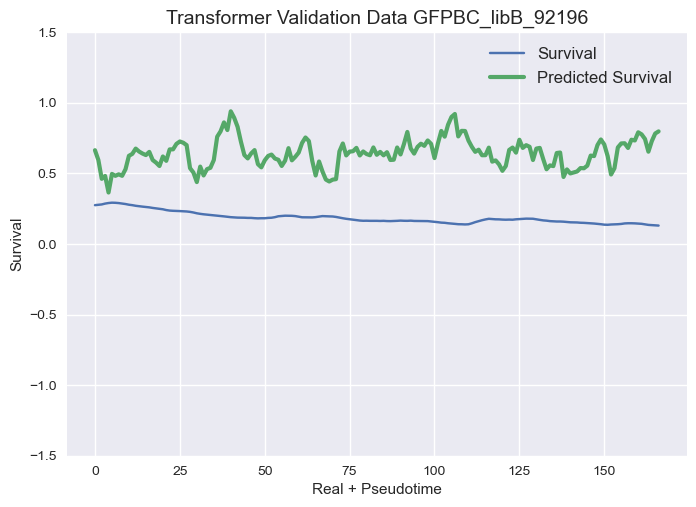

10/10 [==============================] - 0s 29ms/step - loss: 0.0427 - mean_squared_error: 0.0427 - val_loss: 0.0807 - val_mean_squared_error: 0.0807
Epoch 3/20
 1/10 [==>...........................] - ETA: 0s - loss: 0.0277 - mean_squared_error: 0.0277
Evaluation metrics Regr(167, 8, 72)
7/7 [==============================] - 0s 19ms/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 18/20
7/7 [==============================] - 0s 38ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0047 - val_mean_squared_error: 0.0047


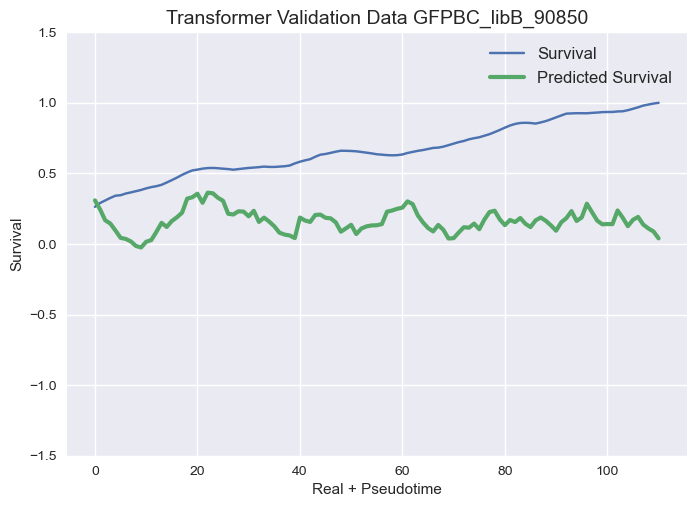

9/9 [==============================] - 0s 21ms/step - loss: 0.0272 - mean_squared_error: 0.0272 - val_loss: 0.2039 - val_mean_squared_error: 0.2039
Epoch 9/20
7/7 [==============================] - 0s 24ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0085 - val_mean_squared_error: 0.0085
Epoch 19/20
Epoch 14/20
6/7 [========================>.....] - ETA: 0s - loss: 0.0116 - mean_squared_error: 0.0116

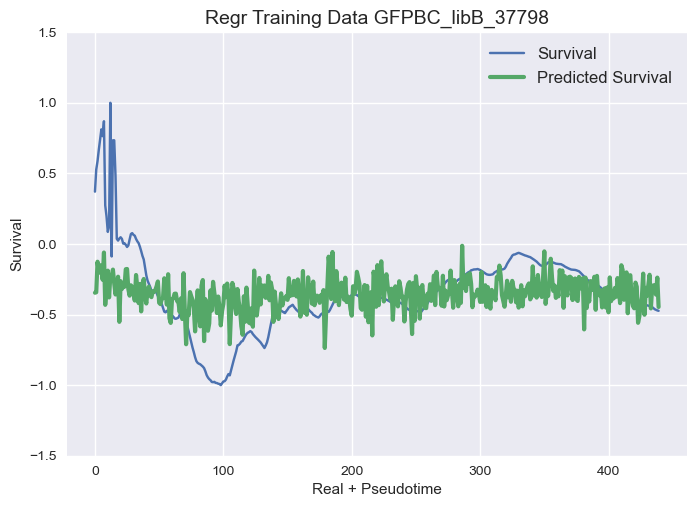

 1/10 [==>...........................] - ETA: 0s - loss: 0.0203 - mean_squared_error: 0.0203Epoch 10/20
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0385
7/7 [==============================] - 0s 29ms/step - loss: 0.0112 - mean_squared_error: 0.0112 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Evaluation metrics Regr
Regr Training Data - MSE: 0.0406
Epoch 15/20
7/7 [==============================] - 0s 33ms/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0676 - val_mean_squared_error: 0.0676
Epoch 20/20
9/9 [==============================] - 0s 23ms/step - loss: 0.0195 - mean_squared_error: 0.0195 - val_loss: 0.2226 - val_mean_squared_error: 0.2226
Epoch 11/20
Epoch 5/20
7/7 [==============================] - 0s 22ms/step - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0038 - val_mean_squared_error: 0.0038
Epoch 16/20
6/7 [========================>.....] - ETA: 0s - loss: 0.0104 - mean_squared_error: 0.0104

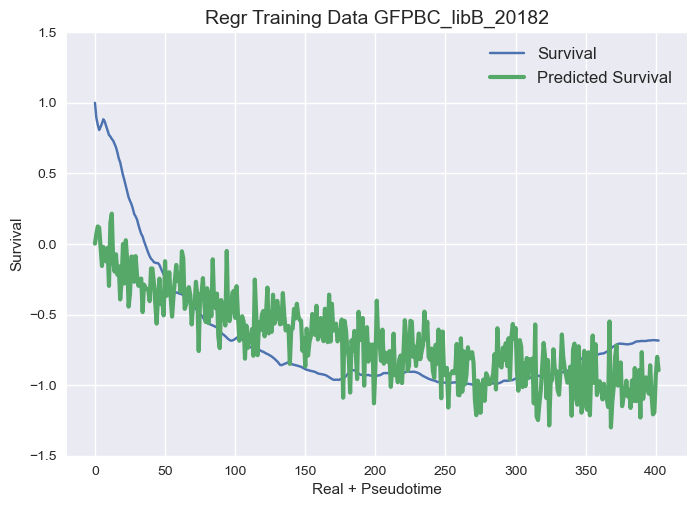

9/9 [==============================] - 0s 17ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 0.2190 - val_mean_squared_error: 0.2190
Epoch 12/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0123 - val_mean_squared_error: 0.0123
Epoch 17/20
10/10 [==============================] - 0s 14ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0377 - val_mean_squared_error: 0.0377
Epoch 6/20


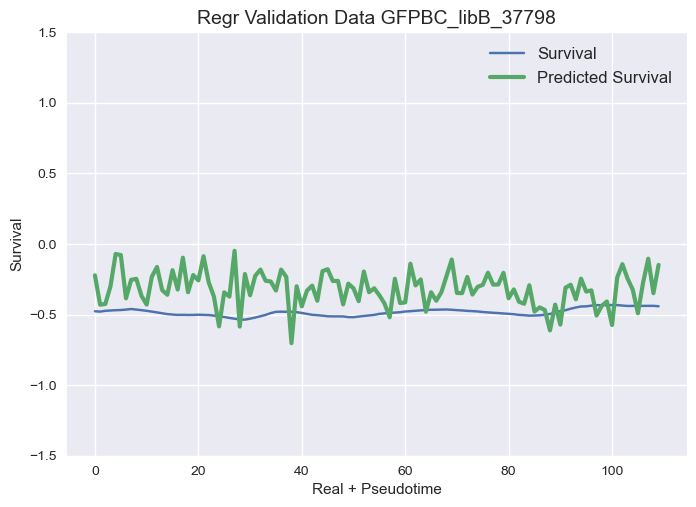

9/9 [==============================] - 0s 14ms/step - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.2148 - val_mean_squared_error: 0.2148n barcode
 Epoch 13/20
6/9 [===================>..........] - ETA: 0s - loss: 0.0183 - mean_squared_error: 0.0183

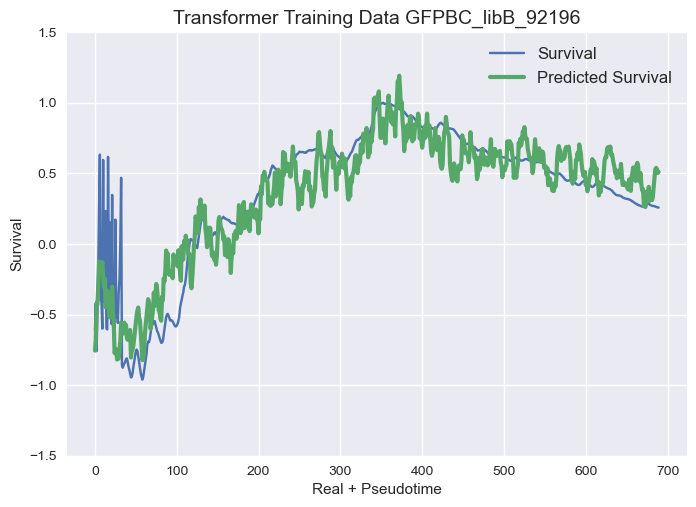

10/10 [==============================] - 0s 21ms/step - loss: 0.0119 - mean_squared_error: 0.0119 - val_loss: 0.0255 - val_mean_squared_error: 0.0255
Epoch 7/20
 1/10 [==>...........................] - ETA: 0s - loss: 0.0198 - mean_squared_error: 0.0198

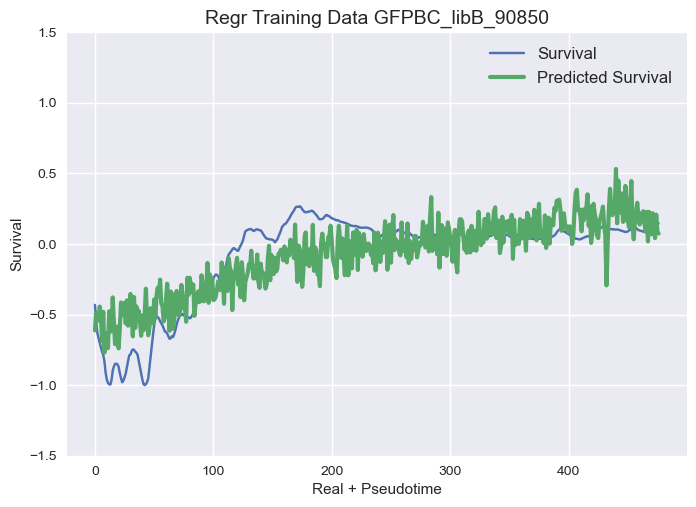

9/9 [==============================] - 0s 16ms/step - loss: 0.0168 - mean_squared_error: 0.0168 - val_loss: 0.2200 - val_mean_squared_error: 0.2200
Epoch 14/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0090 - val_mean_squared_error: 0.0090
Epoch 19/20
6/9 [===================>..........] - ETA: 0s - loss: 0.0139 - mean_squared_error: 0.0139

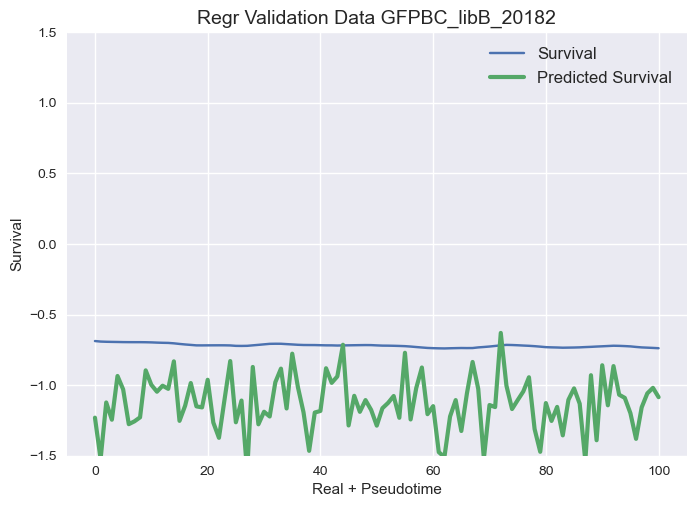

10/10 [==============================] - 0s 13ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0278 - val_mean_squared_error: 0.0278
Epoch 8/20
9/9 [==============================] - 0s 14ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.1578 - val_mean_squared_error: 0.1578
Epoch 1/20
Epoch 15/20
Epoch 20/20
17/17 [==============================] - 3s 28ms/step - loss: 0.1535 - mean_squared_error: 0.1535 - val_loss: 0.1345 - val_mean_squared_error: 0.1345
Epoch 2/20
10/10 [==============================] - 0s 14ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0565 - val_mean_squared_error: 0.0565
Epoch 9/20
9/9 [==============================] - 0s 17ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.3156 - val_mean_squared_error: 0.3156
Epoch 16/20
 7/10 [====================>.........] - ETA: 0s - loss: 0.0086 - mean_squared_error: 0.0086

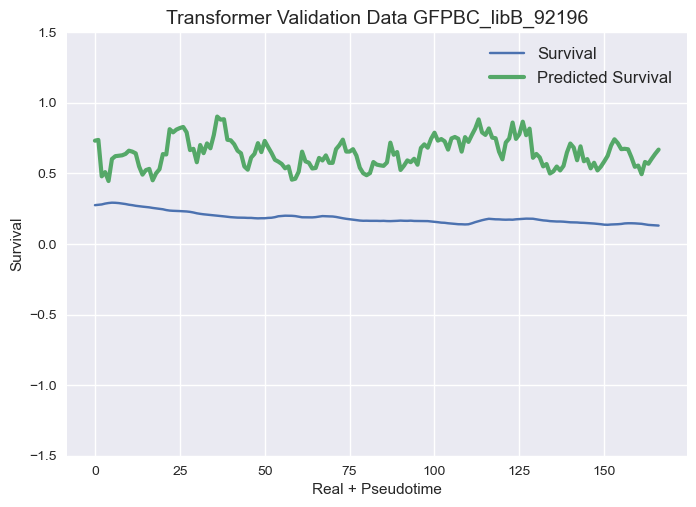

10/10 [==============================] - 0s 14ms/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0535 - val_mean_squared_error: 0.0535

Epoch 10/20


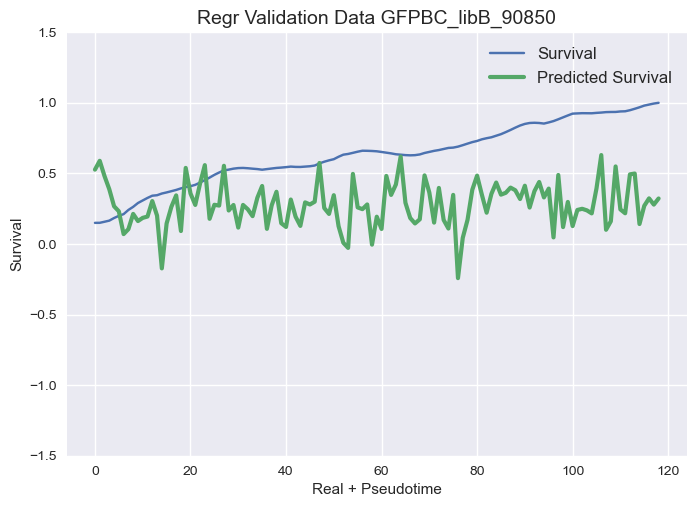

9/9 [==============================] - 0s 14ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.2832 - val_mean_squared_error: 0.2832
Epoch 17/20
17/17 [==============================] - 0s 12ms/step - loss: 0.0499 - mean_squared_error: 0.0499 - val_loss: 0.0845 - val_mean_squared_error: 0.0845
Epoch 3/20
10/10 [==============================] - 0s 13ms/step - loss: 0.0104 - mean_squared_error: 0.0104 - val_loss: 0.0375 - val_mean_squared_error: 0.0375rcode
Epoch 11/20
9/9 [==============================] - 0s 15ms/step - loss: 0.0225 - mean_squared_error: 0.0225 - val_loss: 0.2014 - val_mean_squared_error: 0.2014
Epoch 18/20
10/10 [==============================] - 0s 14ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0289 - val_mean_squared_error: 0.0289
Epoch 12/20
9/9 [==============================] - 0s 13ms/step - loss: 0.0184 - mean_squared_error: 0.0184 - val_loss: 0.2566 - val_mean_squared_error: 0.2566
Epoch 19/20
10/10 [=======================

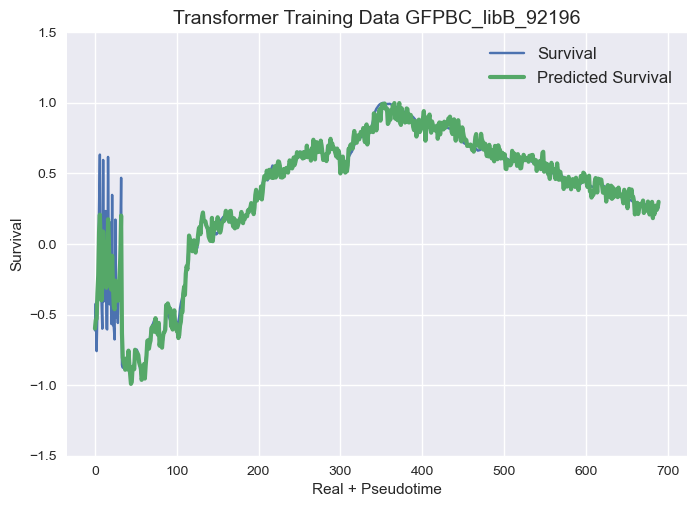

5/5 [==============================] - 0s 12ms/step - loss: 0.3696 - mean_squared_error: 0.3696 - val_loss: 0.1718 - val_mean_squared_error: 0.1718
Epoch 7/20
17/17 [==============================] - 0s 12ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.0749 - val_mean_squared_error: 0.0749
Epoch 7/20
10/10 [==============================] - 0s 12ms/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0180 - val_mean_squared_error: 0.0180
Epoch 17/20
5/5 [==============================] - 0s 10ms/step - loss: 0.3719 - mean_squared_error: 0.3719 - val_loss: 0.1638 - val_mean_squared_error: 0.1638
Epoch 8/20
5/5 [==============================] - 0s 15ms/step - loss: 0.3609 - mean_squared_error: 0.3609 - val_loss: 0.1284 - val_mean_squared_error: 0.1284
Epoch 10/20
1/5 [=====>........................] - ETA: 0s - loss: 0.3561 - mean_squared_error: 0.3561Epoch 18/20
Epoch 1/20
5/5 [==============================] - 0s 11ms/step - loss: 0.3595 - mean_squared_erro

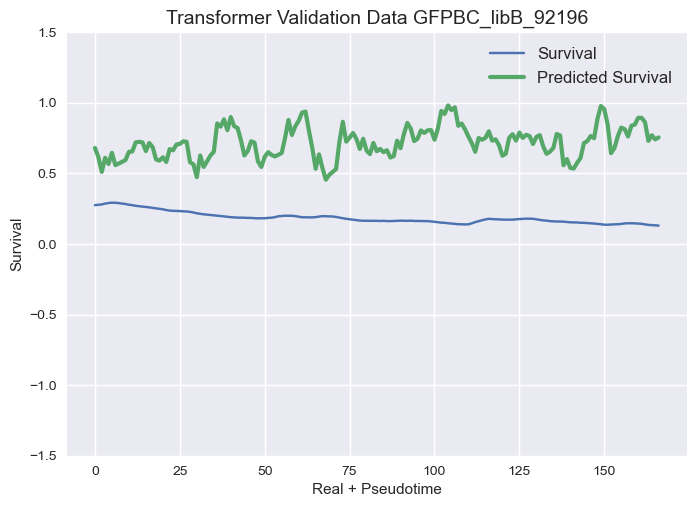

Epoch 20/20
5/5 [==============================] - 0s 11ms/step - loss: 0.3305 - mean_squared_error: 0.3305 - val_loss: 0.0469 - val_mean_squared_error: 0.0469
Epoch 4/20
Epoch 14/20
Epoch 9/20
7/7 [==============================] - 0s 9ms/step - loss: 0.0421 - mean_squared_error: 0.0421 - val_loss: 0.0785 - val_mean_squared_error: 0.0785
Epoch 6/20
Epoch 16/20
5/5 [==============================] - 0s 27ms/step - loss: 0.2988 - mean_squared_error: 0.2988 - val_loss: 0.0106 - val_mean_squared_error: 0.0106
Epoch 17/20
5/5 [==============================] - 0s 9ms/step - loss: 0.2950 - mean_squared_error: 0.2950 - val_loss: 0.0207 - val_mean_squared_error: 0.0207
Epoch 18/20
1/5 [=====>........................] - ETA: 0s - loss: 0.2641 - mean_squared_error: 0.2641Epoch 10/20
Evaluation metrics Regr
7/7 [==============================] - 0s 36ms/step - loss: 0.0416 - mean_squared_error: 0.0416 - val_loss: 0.0501 - val_mean_squared_error: 0.0501
Epoch 7/20
Regr Validation Data - MSE: 0.41

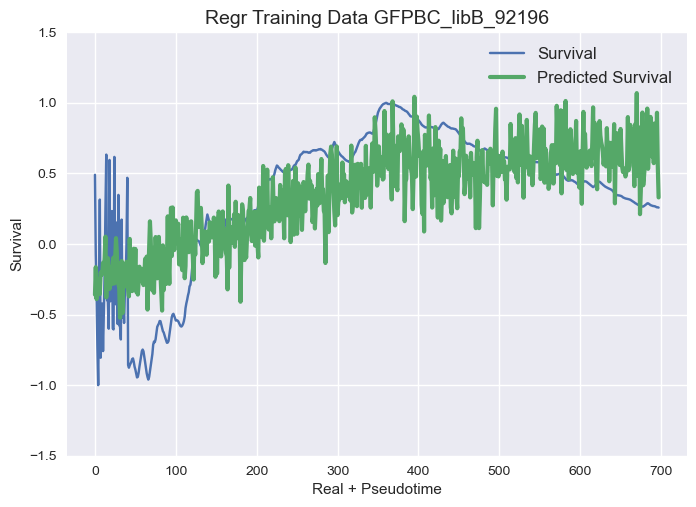

7/7 [==============================] - 0s 8ms/step - loss: 0.1334 - mean_squared_error: 0.1334 - val_loss: 0.0962 - val_mean_squared_error: 0.0962
Epoch 7/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0226 - mean_squared_error: 0.0226 - val_loss: 0.0559 - val_mean_squared_error: 0.0559
Epoch 14/20
7/7 [==============================] - 0s 7ms/step - loss: 0.1222 - mean_squared_error: 0.1222 - val_loss: 0.0776 - val_mean_squared_error: 0.0776
Epoch 8/20
7/7 [==============================] - 0s 7ms/step - loss: 0.1223 - mean_squared_error: 0.1223 - val_loss: 0.0698 - val_mean_squared_error: 0.0698
Epoch 9/20
17/17 [==============================] - 0s 10ms/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0743 - val_mean_squared_error: 0.0743
Epoch 13/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0185 - mean_squared_error: 0.0185 - val_loss: 0.0644 - val_mean_squared_error: 0.0644
Epoch 16/20
7/7 [==============================] - 0s 7ms

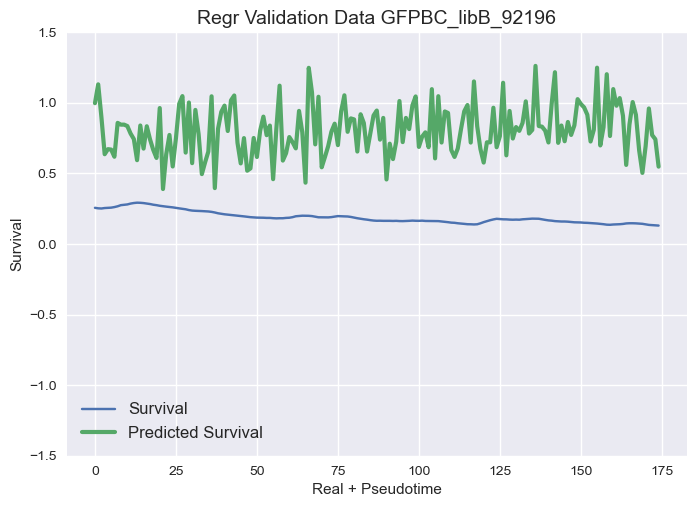

7/7 [==============================] - 0s 8ms/step - loss: 0.1106 - mean_squared_error: 0.1106 - val_loss: 0.0566 - val_mean_squared_error: 0.0566
Epoch 14/20
9/9 [==============================] - 0s 7ms/step - loss: 0.2093 - mean_squared_error: 0.2093 - val_loss: 0.0793 - val_mean_squared_error: 0.0793
Epoch 4/20
7/7 [==============================] - 0s 8ms/step - loss: 0.1022 - mean_squared_error: 0.1022 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 15/20
Epoch 15/20
9/9 [==============================] - 0s 6ms/step - loss: 0.1417 - mean_squared_error: 0.1417 - val_loss: 0.2505 - val_mean_squared_error: 0.2505
Epoch 5/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0959 - mean_squared_error: 0.0959 - val_loss: 0.0524 - val_mean_squared_error: 0.0524
Epoch 16/20
9/9 [==============================] - 0s 7ms/step - loss: 0.1226 - mean_squared_error: 0.1226 - val_loss: 0.4701 - val_mean_squared_error: 0.4701
Epoch 6/20
7/7 [==============================] 

31/31 [==============================] - 0s 13ms/step - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0020 - val_mean_squared_error: 0.0020
Epoch 8/20
Epoch 4/20
29/29 [==============================] - 0s 12ms/step - loss: 0.0383 - mean_squared_error: 0.0383 - val_loss: 0.0366 - val_mean_squared_error: 0.0366
Epoch 4/20
10/10 [==============================] - 0s 8ms/step - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 0.1114 - val_mean_squared_error: 0.1114
Epoch 10/20
34/34 [==============================] - 0s 13ms/step - loss: 0.0508 - mean_squared_error: 0.0508 - val_loss: 0.0791 - val_mean_squared_error: 0.0791
Epoch 3/20
10/10 [==============================] - 0s 7ms/step - loss: 0.0389 - mean_squared_error: 0.0389 - val_loss: 0.0775 - val_mean_squared_error: 0.0775
Epoch 1/20
31/31 [==============================] - 0s 13ms/step - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0158 - val_mean_squared_error: 0.0158
Epoch 5/20
10/10 [=================

5/5 [==============================] - 0s 25ms/step - loss: 0.0262 - mean_squared_error: 0.0262 - val_loss: 0.0088 - val_mean_squared_error: 0.0088
Epoch 15/20
5/5 [==============================] - 0s 18ms/step - loss: 0.0334 - mean_squared_error: 0.0334 - val_loss: 0.0110 - val_mean_squared_error: 0.0110
Epoch 16/20
34/34 [==============================] - 0s 12ms/step - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0658 - val_mean_squared_error: 0.0658
Epoch 6/20
5/5 [==============================] - 0s 19ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0563 - val_mean_squared_error: 0.0563
Epoch 17/20
Epoch 8/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0823 - mean_squared_error: 0.0823 - val_loss: 0.0164 - val_mean_squared_error: 0.0164
Epoch 18/20
Epoch 4/20
17/17 [==============================] - 2s 20ms/step - loss: 0.1540 - mean_squared_error: 0.1540 - val_loss: 0.1956 - val_mean_squared_error: 0.1956
Epoch 2/20
17/17 [=========

Epoch 8/20
7/7 [==============================] - 0s 18ms/step - loss: 0.0154 - mean_squared_error: 0.0154 - val_loss: 0.0118 - val_mean_squared_error: 0.0118
Epoch 2/20
Epoch 10/20
7/7 [==============================] - 0s 16ms/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0562 - val_mean_squared_error: 0.0562
Epoch 3/20
17/17 [==============================] - 0s 9ms/step - loss: 0.0317 - mean_squared_error: 0.0317 - val_loss: 0.1066 - val_mean_squared_error: 0.1066
Epoch 9/20
7/7 [==============================] - 0s 21ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0134 - val_mean_squared_error: 0.0134
Epoch 12/20
7/7 [==============================] - 0s 16ms/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0645 - val_mean_squared_error: 0.0645
Epoch 15/20
17/17 [==============================] - 0s 6ms/step - loss: 0.0328 - mean_squared_error: 0.0328 - val_loss: 0.1009 - val_mean_squared_error: 0.1009
Epoch 11/20
34/34 [===========

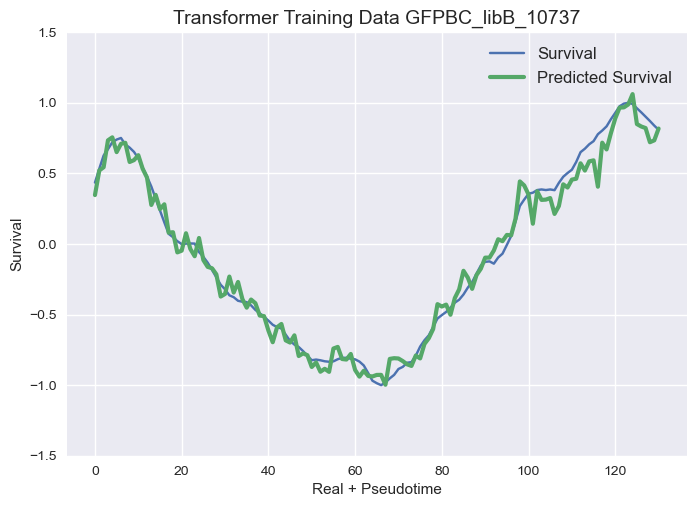

7/7 [==============================] - 0s 21ms/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0681 - val_mean_squared_error: 0.0681
Epoch 9/20
7/7 [==============================] - 0s 15ms/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0060 - val_mean_squared_error: 0.0060
Epoch 17/20
17/17 [==============================] - 0s 6ms/step - loss: 0.0303 - mean_squared_error: 0.0303 - val_loss: 0.0924 - val_mean_squared_error: 0.0924
Epoch 16/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0055 - val_mean_squared_error: 0.0055
Epoch 18/20
17/17 [==============================] - 0s 7ms/step - loss: 0.0307 - mean_squared_error: 0.0307 - val_loss: 0.0870 - val_mean_squared_error: 0.0870
Epoch 13/20
Epoch 17/20
9/9 [==============================] - 0s 16ms/step - loss: 0.0342 - mean_squared_error: 0.0342 - val_loss: 0.2182 - val_mean_squared_error: 0.2182
Epoch 10/20
31/31 [====================

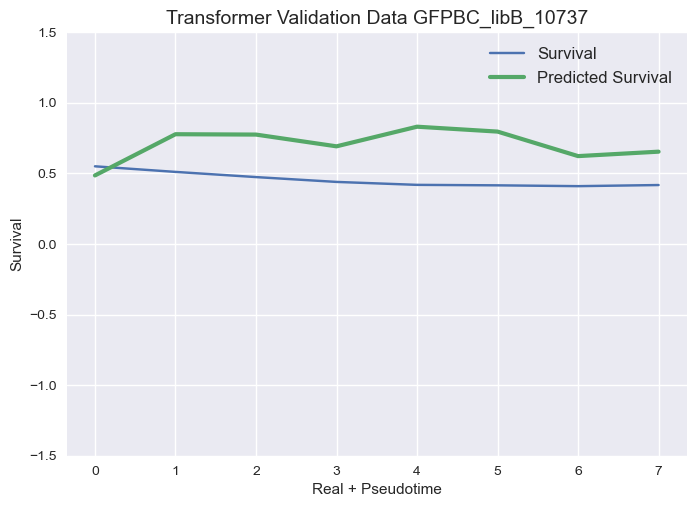

34/34 [==============================] - 1s 16ms/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0689 - val_mean_squared_error: 0.0689
(8, 8, 72)Epoch 11/20

10/10 [==============================] - 2s 38ms/step - loss: 0.1572 - mean_squared_error: 0.1572 - val_loss: 0.4120 - val_mean_squared_error: 0.4120
Epoch 2/20
9/9 [==============================] - 0s 21ms/step - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.1921 - val_mean_squared_error: 0.1921
Epoch 12/20
17/17 [==============================] - 0s 6ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.0818 - val_mean_squared_error: 0.0818
Epoch 20/20
9/9 [==============================] - 0s 13ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.3868 - val_mean_squared_error: 0.3868
Epoch 14/20
10/10 [==============================] - 0s 22ms/step - loss: 0.0648 - mean_squared_error: 0.0648 - val_loss: 0.0971 - val_mean_squared_error: 0.0971
 (17, 8, 72)
Epoch 3/20
49/49 [====

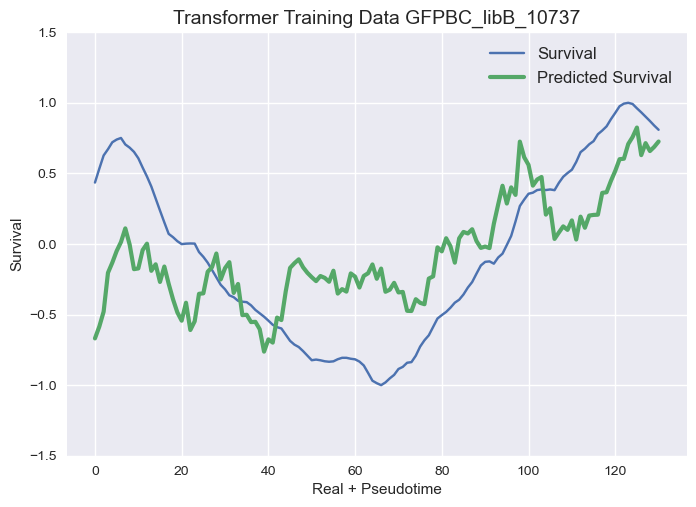

Epoch 16/20
9/9 [==============================] - 0s 15ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.3678 - val_mean_squared_error: 0.3678
Epoch 17/20
25/31 [=======================>......] - ETA: 0s - loss: 0.0041 - mean_squared_error: 0.0041
Transformer Evaluation metrics
30/49 [=================>............] - ETA: 0s - loss: 0.0112 - mean_squared_error: 0.0112
Transformer Validation MSE - MSE: 0.0669
Epoch 1/20
9/9 [==============================] - 0s 17ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.2350 - val_mean_squared_error: 0.2350
Epoch 18/20
34/34 [==============================] - 1s 15ms/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0800 - val_mean_squared_error: 0.0800
Epoch 16/20
Epoch 13/20
31/31 [==============================] - 0s 16ms/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 16/20
1/9 [==>...........................] - ETA: 0s - loss: 0.0132 -

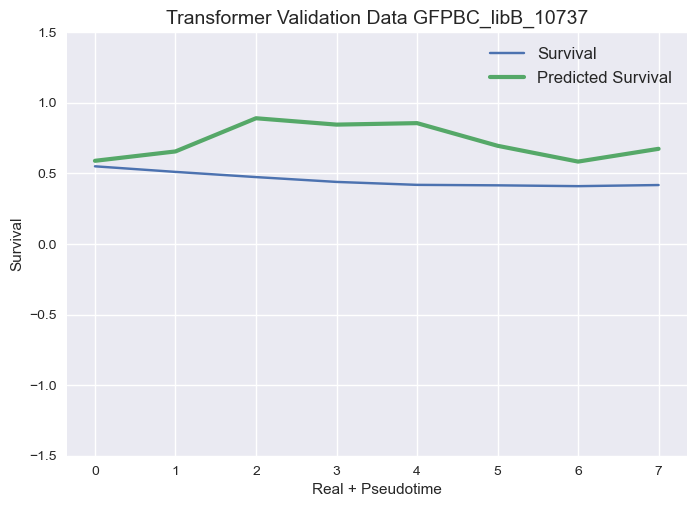

11/34 [========>.....................] - ETA: 0s - loss: 0.0059 - mean_squared_error: 0.0059Epoch 6/20
(8, 8, 72)
Transformer Evaluation metrics
6/9 [===================>..........] - ETA: 0s - loss: 0.0196 - mean_squared_error: 0.019651Transformer Training MSE - MSE: 0.
Transformer Validation MSE - MSE: 0.0059
10/10 [==============================] - 0s 14ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0628 - val_mean_squared_error: 0.0628
Epoch 8/20
 1/10 [==>...........................] - ETA: 0s - loss: 0.0074 - mean_squared_error: 0.0074

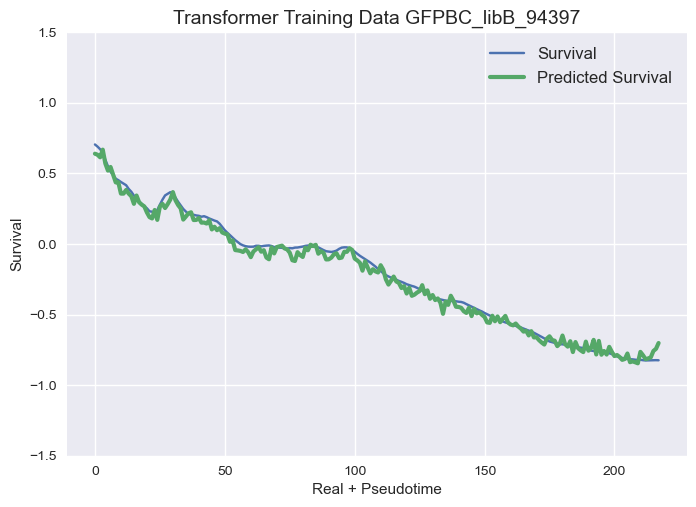

29/29 [==============================] - 0s 13ms/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0442 - val_mean_squared_error: 0.0442
Epoch 17/20
10/10 [==============================] - 0s 16ms/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0623 - val_mean_squared_error: 0.0623
Epoch 9/20
 1/10 [==>...........................] - ETA: 0s - loss: 0.0055 - mean_squared_error: 0.0055 
Transformer Evaluation metrics
 6/29 [=====>........................] - ETA: 0s - loss: 0.0033 - mean_squared_error: 0.0033
Epoch 14/20

Transformer Validation MSE - MSE: 0.0093
31/31 [==============================] - 0s 14ms/step - loss: 0.0034 - mean_squared_error: 0.0034 - val_loss: 0.0133 - val_mean_squared_error: 0.0133
Epoch 17/20
10/10 [==============================] - 0s 16ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0324 - val_mean_squared_error: 0.0324
Epoch 10/20
23/29 [======================>.......] - ETA: 0s - loss: 0.0035 - mean_squared_er

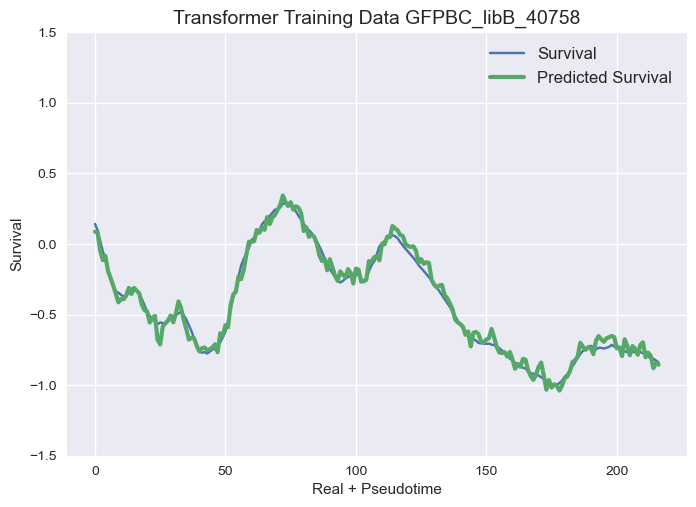

 9/10 [==========================>...] - ETA: 0s - loss: 0.0075 - mean_squared_error: 0.0075

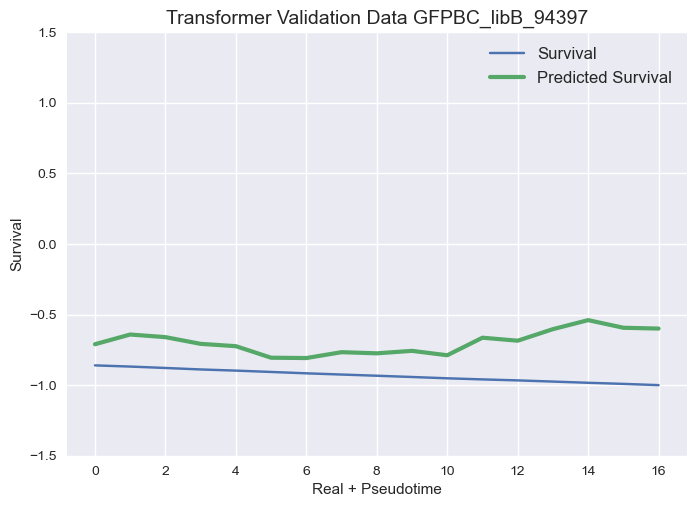

29/29 [==============================] - 0s 13ms/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0420 - val_mean_squared_error: 0.0420

Epoch 18/20
Epoch 11/20
49/49 [==============================] - 1s 14ms/step - loss: 0.0083 - mean_squared_error: 0.0083 - val_loss: 0.1176 - val_mean_squared_error: 0.1176
Epoch 7/20
34/34 [==============================] - 0s 13ms/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0916 - val_mean_squared_error: 0.0916
Epoch 15/20
31/31 [==============================] - 0s 14ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0168 - val_mean_squared_error: 0.0168


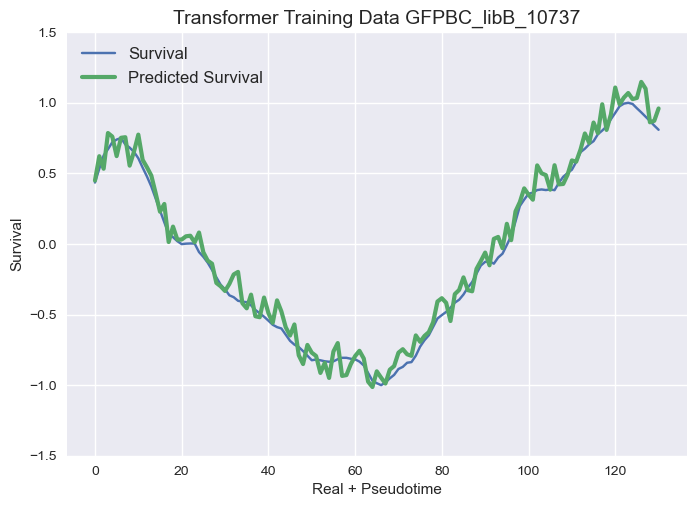

1/1 [==============================] - 0s 24ms/steploss: 0.0075 - mean_squared_error: 0.00
 
10/10 [==============================] - 0s 14ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0394 - val_mean_squared_error: 0.0394
Epoch 13/20
27/29 [==========================>...] - ETA: 0s - loss: 0.0037 - mean_squared_error: 0.0037Transformer Training MSE - MSE: 0.0075

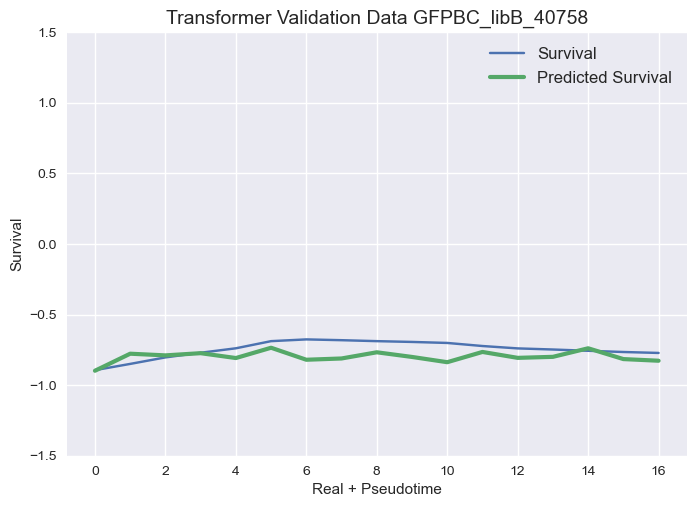

(217, 8, 72)
29/29 [==============================] - 0s 15ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0573 - val_mean_squared_error: 0.0573
Epoch 14/20
31/31 [==============================] - 0s 13ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0147 - val_mean_squared_error: 0.0147


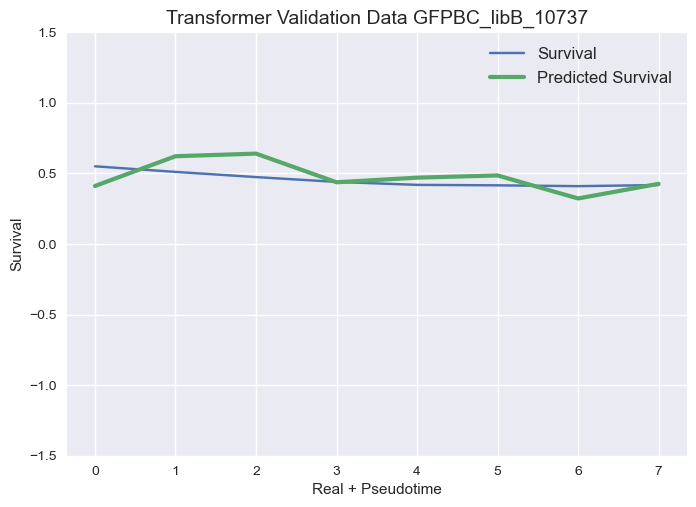

49/49 [==============================] - 1s 14ms/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.0938 - val_mean_squared_error: 0.0938



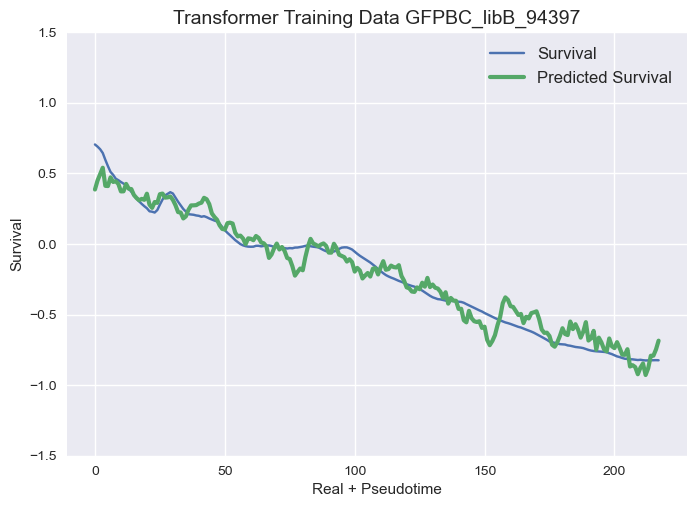

Epoch 8/20
17/31 [===============>..............] - ETA: 0s - loss: 0.0033 - mean_squared_error: 0.0033Transformer Training MSE - MSE: 0.0578

10/10 [==============================] - 0s 20ms/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0368 - val_mean_squared_error: 0.0368
Epoch 16/20
10/10 [==============================] - 0s 18ms/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0532 - val_mean_squared_error: 0.0532
Epoch 17/20
31/31 [==============================] - 1s 17ms/step - loss: 0.0033 - mean_squared_error: 0.0033 - val_loss: 0.0134 - val_mean_squared_error: 0.0134
Epoch 20/20
 7/31 [=====>........................] - ETA: 0s - loss: 0.0037 - mean_squared_error: 0.0037Evaluation metrics Regr
Epoch 17/20
10/10 [==============================] - 0s 20ms/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0389 - val_mean_squared_error: 0.0389
Epoch 18/20
Regr Training Data - MSE: 0.1400
17/17 [==============================] - 2s 33ms

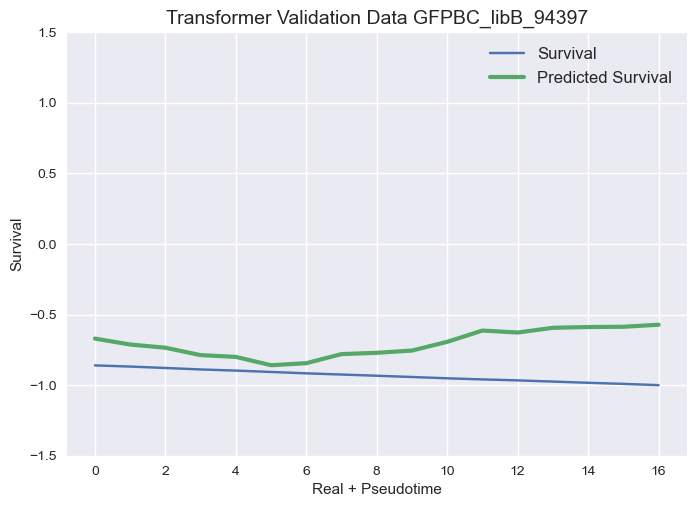

49/49 [==============================] - 1s 16ms/step - loss: 0.0083 - mean_squared_error: 0.0083 - val_loss: 0.0956 - val_mean_squared_error: 0.0956


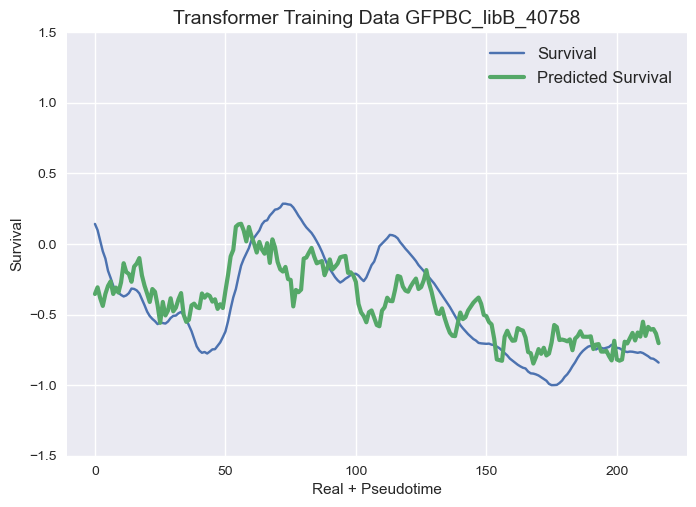

Epoch 9/20
17/17 [==============================] - 0s 15ms/step - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0609 - val_mean_squared_error: 0.0609
Epoch 3/20
 1/17 [>.............................] - ETA: 0s - loss: 0.0312 - mean_squared_error: 0.0312

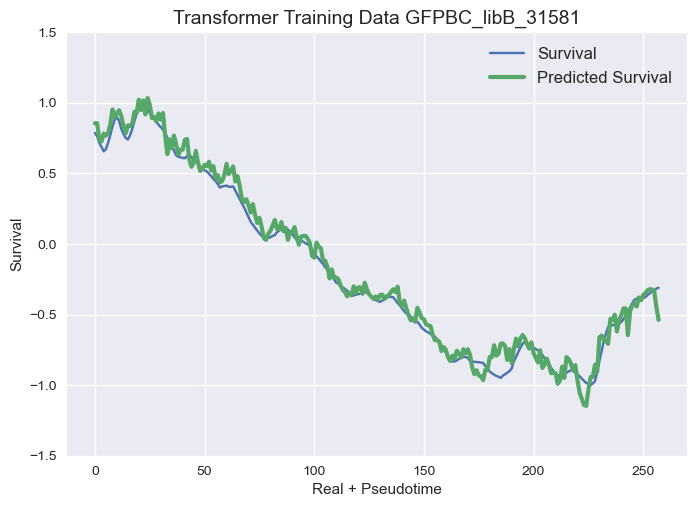

Epoch 20/20
12/17 [====================>.........] - ETA: 0s - loss: 0.0314 - mean_squared_error: 0.0314

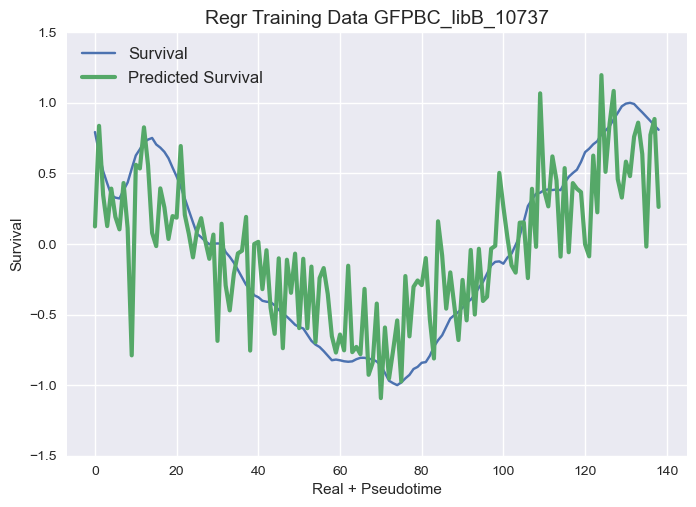

1/1 [==============================] - 0s 26ms/step
 
17/17 [==============================] - 0s 12ms/step - loss: 0.0285 - mean_squared_error: 0.0285 - val_loss: 0.0547 - val_mean_squared_error: 0.0547

12/34 [=========>....................] - ETA: 0s - loss: 0.0051 - mean_squared_error: 0.0051Transformer Training MSE - MSE: 0.0014
Transformer Validation MSE - MSE: 0.0760

40/49 [=======================>......] - ETA: 0s - loss: 0.0062 - mean_squared_error: 0.0062

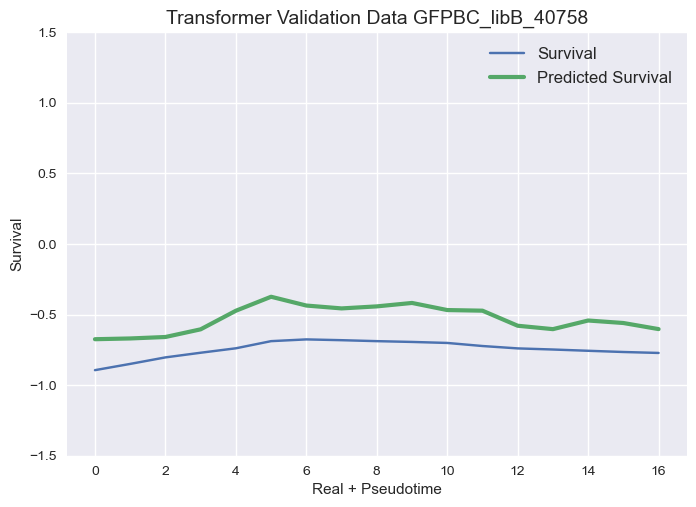

46/49 [===========================>..] - ETA: 0s - loss: 0.0066 - mean_squared_error: 0.0066

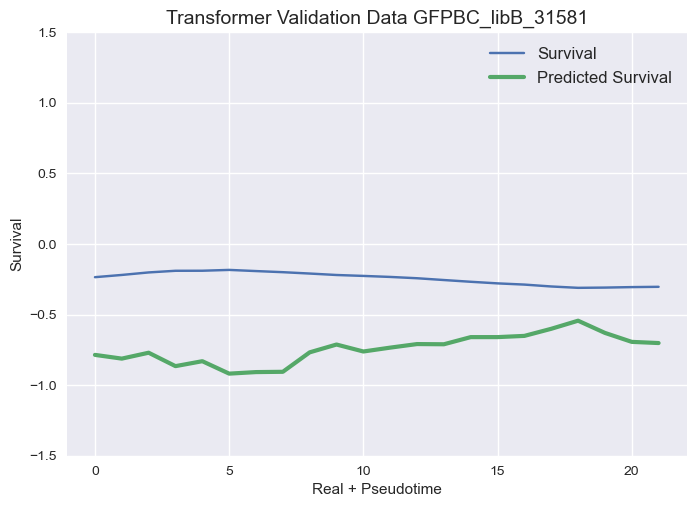

10/10 [==============================] - 0s 7ms/step
Epoch 5/20
34/34 [==============================] - 0s 11ms/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0690 - val_mean_squared_error: 0.0690
Epoch 19/20
49/49 [==============================] - 1s 11ms/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.1473 - val_mean_squared_error: 0.1473
Epoch 10/20
 6/34 [====>.........................] - ETA: 0s - loss: 0.0051 - mean_squared_error: 0.0051

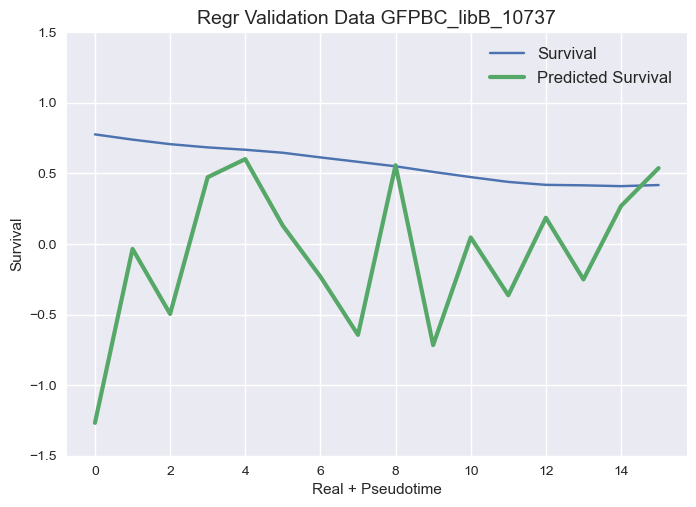

1/7 [===>..........................] - ETA: 0sEpoch 1/20


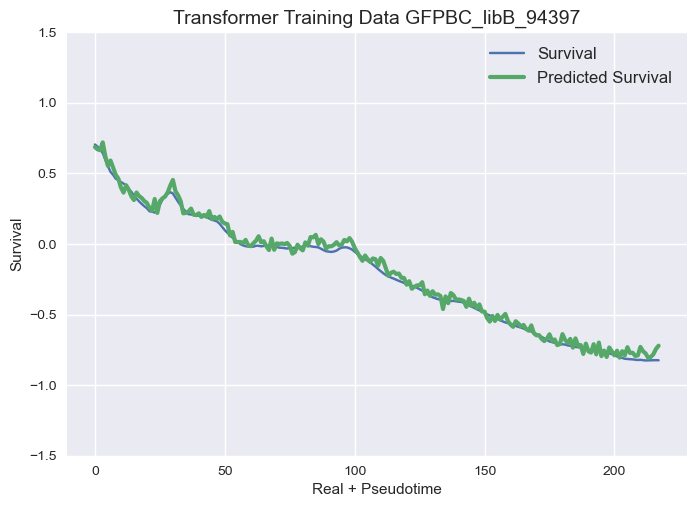

9/9 [==============================] - 0s 2ms/step loss: 0.0051 - mean_squared_error: 0.005
Transformer Evaluation metrics
12/34 [=========>....................] - ETA: 0s - loss: 0.0050 - mean_squared_error: 0.0050Transformer Training MSE - MSE: 0.0018
Transformer Validation MSE - MSE: 0.0200

17/17 [==============================] - 0s 13ms/step - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.0919 - val_mean_squared_error: 0.0919
Epoch 6/20
26/34 [=====================>........] - ETA: 0s - loss: 0.0047 - mean_squared_error: 0.0047 
Transformer Evaluation metrics

Transformer Training MSE - MSE: 0.0027
22/49 [============>.................] - ETA: 0s - loss: 0.0053 - mean_squared_error: 0.0053Transformer Evaluation metricsTransformer Validation MSE - MSE: 0.00
Transformer Training MSE - MSE: 0.0317

34/34 [==============================] - 0s 10ms/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0755 - val_mean_squared_error: 0.0755
Epoch 20/20
44/49 [========

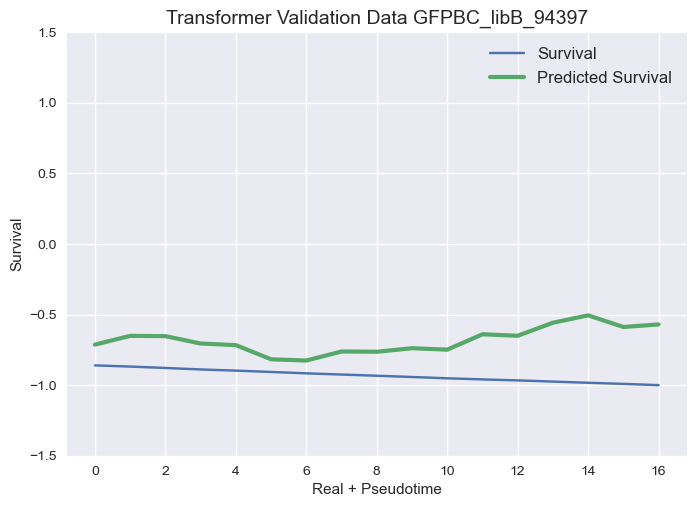

17/17 [==============================] - 0s 12ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0712 - val_mean_squared_error: 0.0712)  (226, 72
(25, 72)


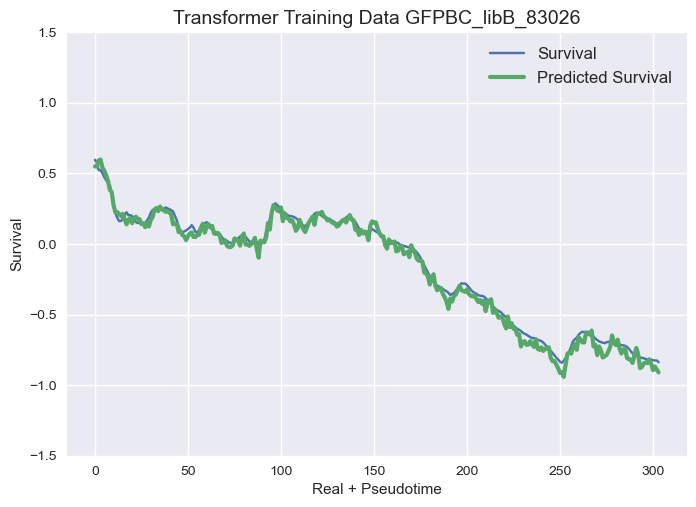

Epoch 8/20
49/49 [==============================] - 1s 13ms/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.1084 - val_mean_squared_error: 0.1084


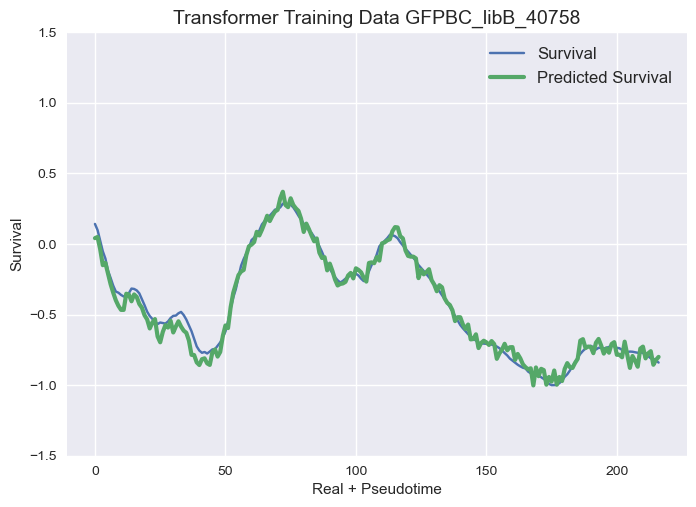

Evaluation metrics RegrEpoch 11/20
 1/49 [..............................] - ETA: 1s - loss: 0.0057 - mean_squared_error: 0.0057
Regr Validation Data - MSE: 0.2498


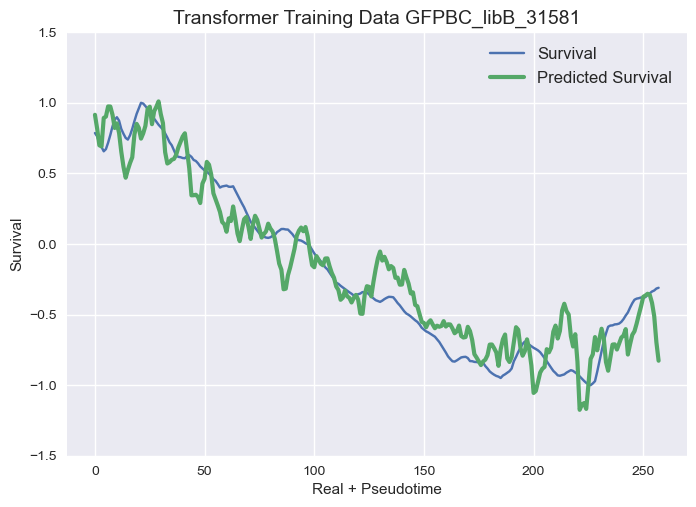

17/17 [==============================] - 0s 16ms/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.0543 - val_mean_squared_error: 0.0543
Epoch 9/20
17/17 [==============================] - 0s 11ms/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.0765 - val_mean_squared_error: 0.0765
Epoch 10/20
 1/17 [>.............................] - ETA: 0s - loss: 0.0081 - mean_squared_error: 0.0081

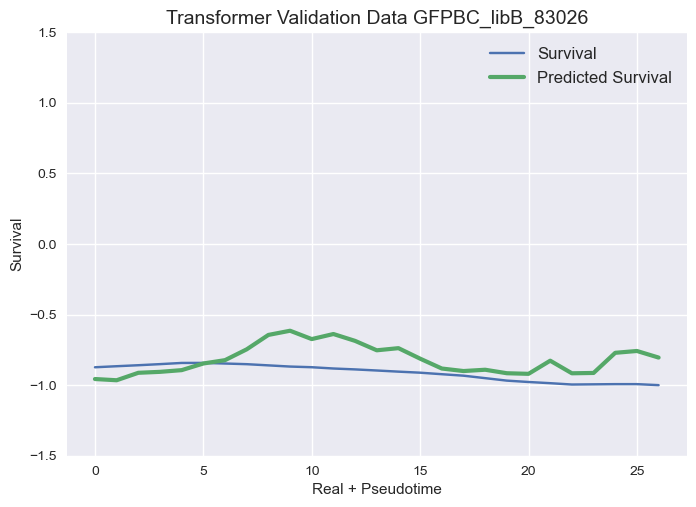

 8/17 [=============>................] - ETA: 0s - loss: 0.0071 - mean_squared_error: 0.0071

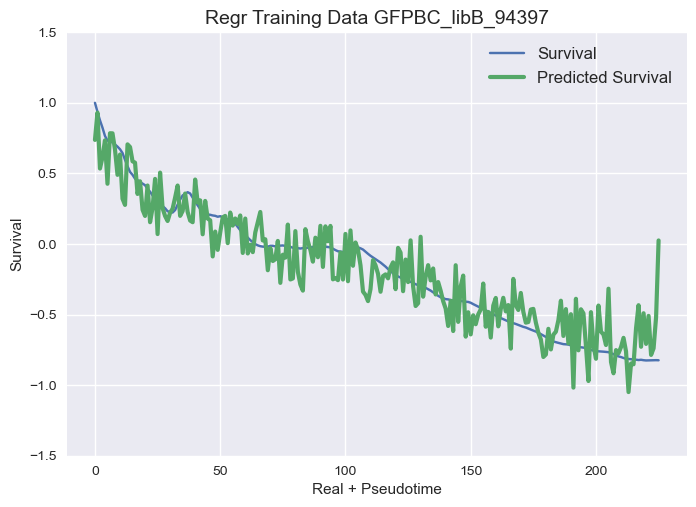

47/49 [===========================>..] - ETA: 0s - loss: 0.0049 - mean_squared_error: 0.0049

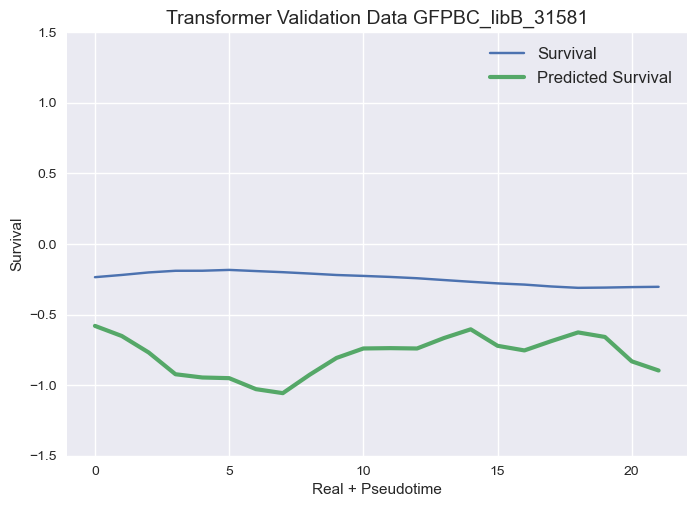

(258, 8, 72) (22, 8, 72)


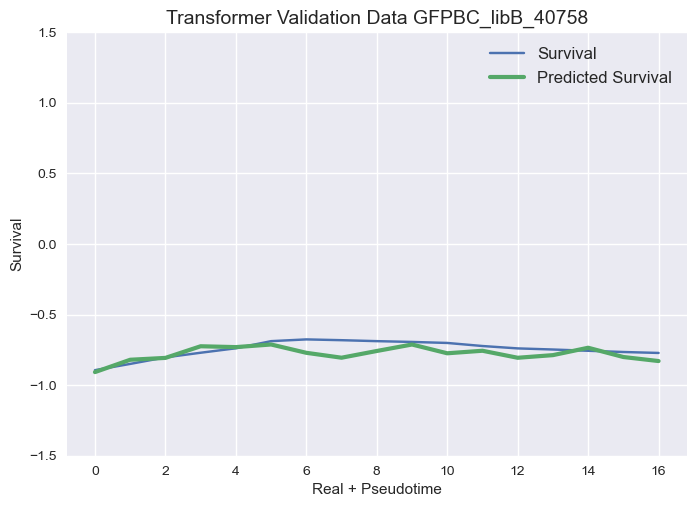

49/49 [==============================] - 1s 11ms/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0912 - val_mean_squared_error: 0.0912
Epoch 12/20
17/17 [==============================] - 0s 18ms/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0792 - val_mean_squared_error: 0.0792
Epoch 11/20
 2/49 [>.............................] - ETA: 3s - loss: 0.0046 - mean_squared_error: 0.0046 
Evaluation metrics Regr
1/9 [==>...........................] - ETA: 1s
Regr Validation Data - MSE: 0.0395
25/31 [=======================>......] - ETA: 0s - loss: 0.0687 - mean_squared_error: 0.0687

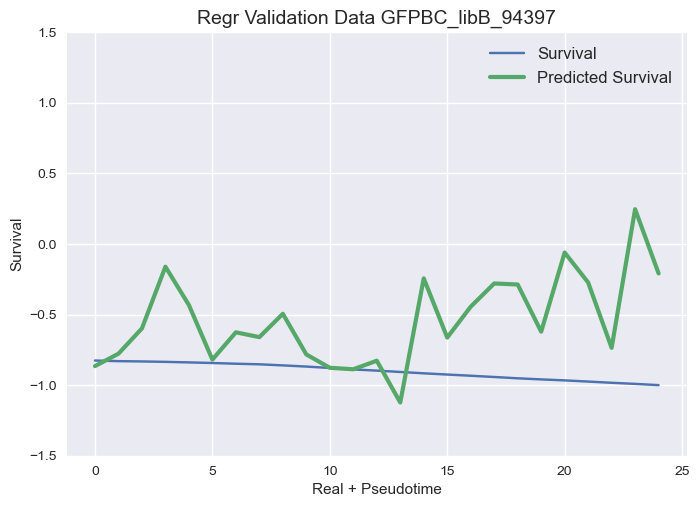

1/1 [==============================] - 0s 51ms/step
 
17/17 [==============================] - 0s 14ms/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0753 - val_mean_squared_error: 0.0753
Epoch 12/20
13/49 [======>.......................] - ETA: 0s - loss: 0.0084 - mean_squared_error: 0.0084
Transformer Training MSE - MSE: 0.0067
Transformer Validation MSE - MSE: 0.3046
29/29 [==============================] - 2s 17ms/step - loss: 0.1635 - mean_squared_error: 0.1635 - val_loss: 0.0441 - val_mean_squared_error: 0.0441
Epoch 2/20
29/29 [==============================] - 0s 4ms/step - loss: 0.0554 - mean_squared_error: 0.0554 - val_loss: 0.0534 - val_mean_squared_error: 0.0534
Epoch 3/20
17/17 [==============================] - 0s 10ms/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0453 - val_mean_squared_error: 0.0453
Epoch 13/20
31/31 [==============================] - 2s 20ms/step - loss: 0.0647 - mean_squared_error: 0.0647 - val_loss: 0.0058 - val_mean_

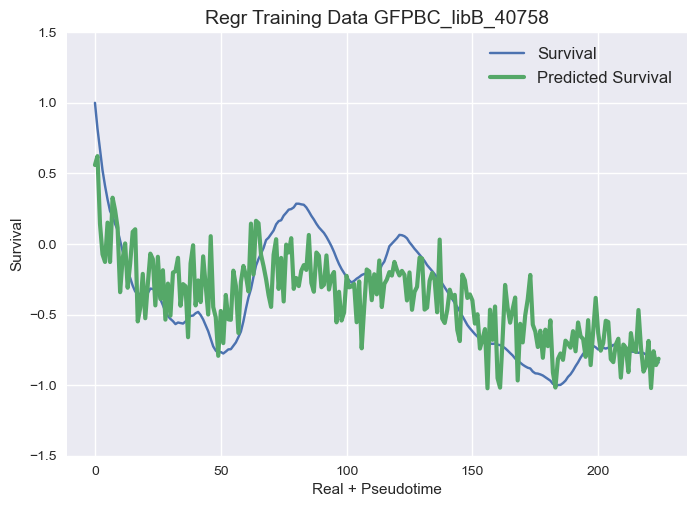

31/31 [==============================] - 0s 4ms/step - loss: 0.0493 - mean_squared_error: 0.0493 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 14/20
Epoch 3/20
25/29 [========================>.....] - ETA: 0s - loss: 0.0549 - mean_squared_error: 0.0549

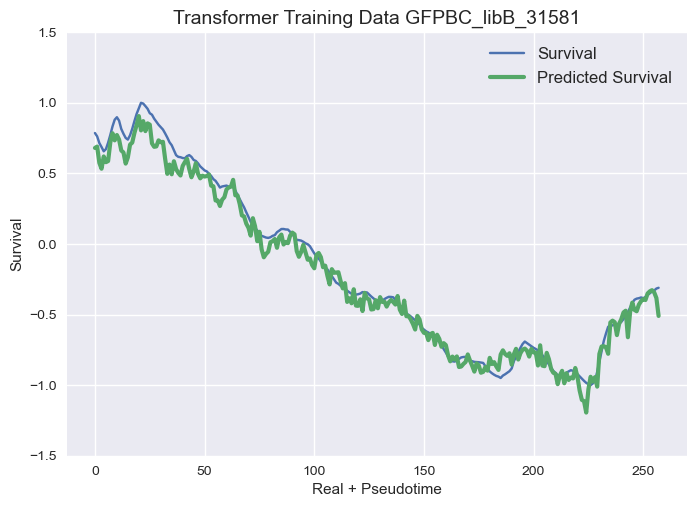


49/49 [==============================] - 1s 15ms/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.1570 - val_mean_squared_error: 0.1570

Epoch 13/20
17/17 [==============================] - 0s 10ms/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0569 - val_mean_squared_error: 0.0569
Epoch 15/20
31/31 [==============================] - 0s 4ms/step - loss: 0.0419 - mean_squared_error: 0.0419 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 5/20
17/17 [==============================] - 0s 10ms/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0744 - val_mean_squared_error: 0.0744
Epoch 16/20
29/29 [==============================] - 0s 4ms/step - loss: 0.0489 - mean_squared_error: 0.0489 - val_loss: 0.0708 - val_mean_squared_error: 0.0708
Epoch 7/20
 6/17 [=========>....................] - ETA: 0s - loss: 0.0046 - mean_squared_error: 0.0046

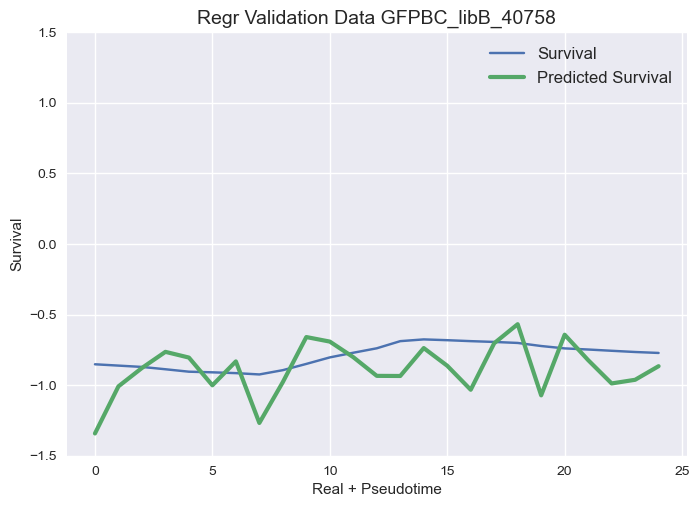

31/31 [==============================] - 0s 5ms/step - loss: 0.0410 - mean_squared_error: 0.0410 - val_loss: 0.0162 - val_mean_squared_error: 0.0162
Epoch 6/20


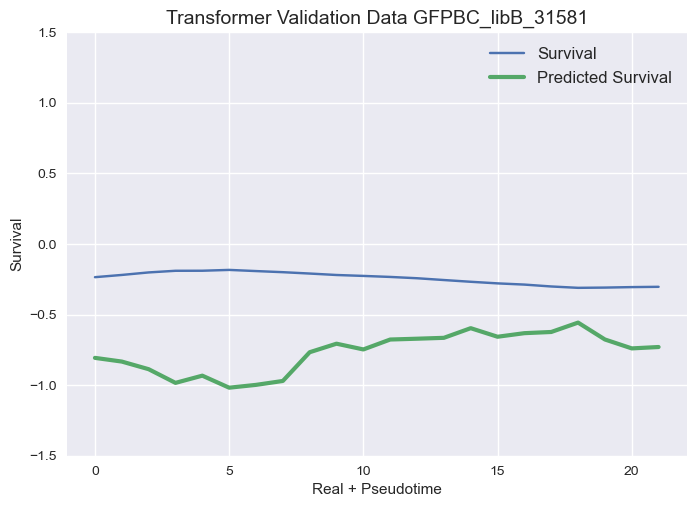

29/29 [==============================] - 0s 4ms/step - loss: 0.0467 - mean_squared_error: 0.0467 - val_loss: 0.0832 - val_mean_squared_error: 0.0832e)  (266, 
Epoch 8/20
(30, 72)
 1/29 [>.............................] - ETA: 0s - loss: 0.0690 - mean_squared_error: 0.0690

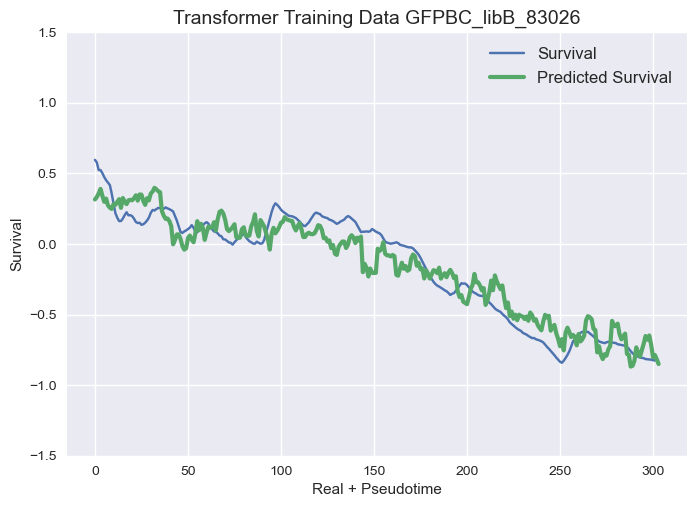

49/49 [==============================] - 1s 11ms/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.1638 - val_mean_squared_error: 0.1638
Epoch 14/20
 1/49 [..............................] - ETA: 0s - loss: 0.0038 - mean_squared_error: 0.0038 
Evaluation metrics Regr
17/17 [==============================] - 0s 15ms/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 17/20
31/31 [==============================] - 0s 6ms/step - loss: 0.0419 - mean_squared_error: 0.0419 - val_loss: 0.0067 - val_mean_squared_error: 0.0067
Epoch 7/20
31/31 [==============================] - 0s 8ms/step - loss: 0.0398 - mean_squared_error: 0.0398 - val_loss: 0.0155 - val_mean_squared_error: 0.0155
Epoch 8/20
29/29 [==============================] - 0s 4ms/step - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.0718 - val_mean_squared_error: 0.0718
Epoch 10/20
17/17 [==============================] - 0s 11ms/step - loss: 0.0056 - mean_s

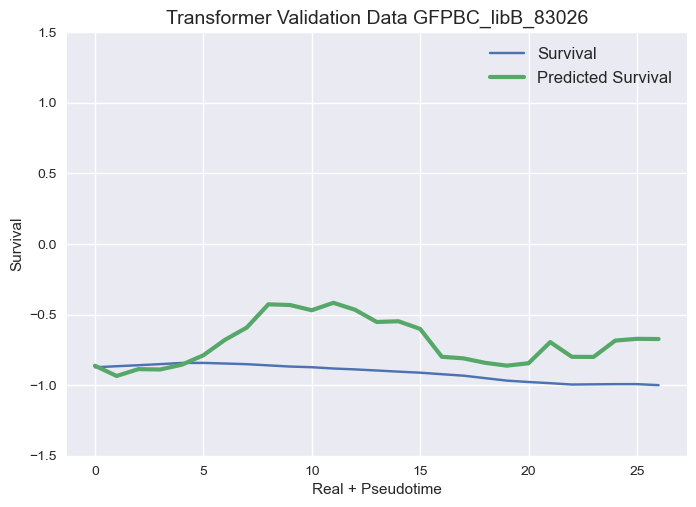

23/29 [======================>.......] - ETA: 0s - loss: 0.0416 - mean_squared_error: 0.0416Epoch 15/20


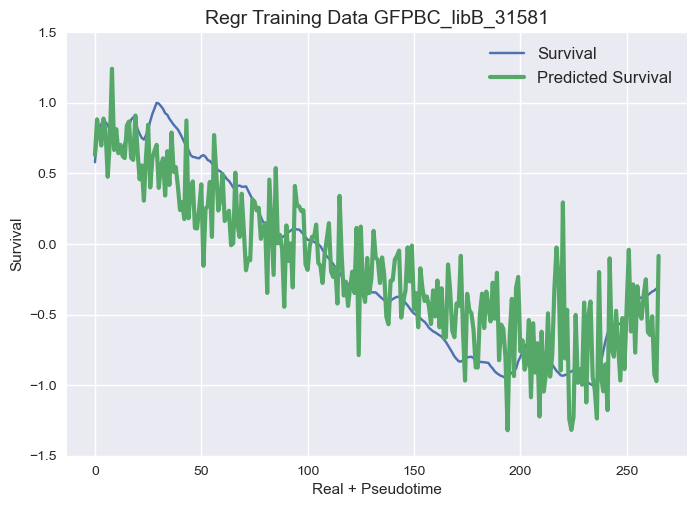

29/29 [==============================] - 0s 4ms/step - loss: 0.0411 - mean_squared_error: 0.0411 - val_loss: 0.0916 - val_mean_squared_error: 0.0916
Epoch 12/20
17/17 [==============================] - 0s 11ms/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0502 - val_mean_squared_error: 0.0502
Epoch 20/20
29/29 [==============================] - 0s 4ms/step - loss: 0.0383 - mean_squared_error: 0.0383 - val_loss: 0.1022 - val_mean_squared_error: 0.1022
Epoch 13/20
10/10 [==============================] - 0s 4ms/steposs: 0.0801 - mean_squared_error: 0.08
Epoch 11/20
34/34 [==============================] - 0s 4ms/step - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.4091 - val_mean_squared_error: 0.4091
Epoch 14/20
Epoch 4/20
17/17 [==============================] - 0s 13ms/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
(527, 8, 72) (52, 8, 72) 
31/31 [==============================] - 0s 4ms/step - loss: 0.03

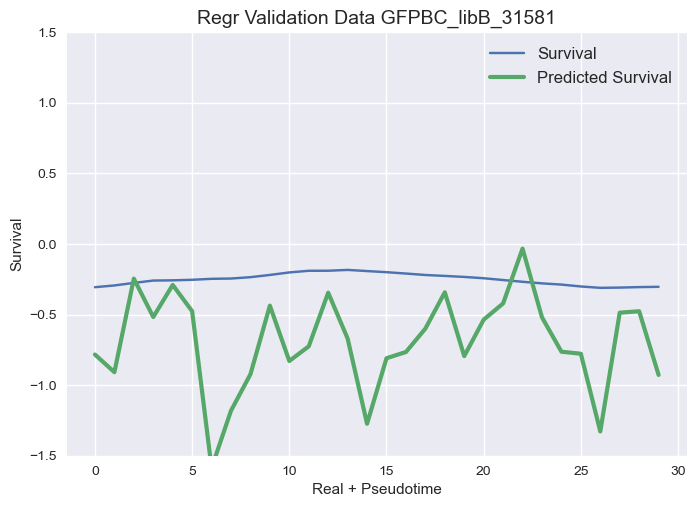

29/29 [==============================] - 0s 4ms/step - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.1056 - val_mean_squared_error: 0.1056
Epoch 15/20
34/34 [==============================] - 0s 5ms/step - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.2697 - val_mean_squared_error: 0.2697
Epoch 5/20
31/31 [==============================] - 0s 4ms/step - loss: 0.0362 - mean_squared_error: 0.0362 - val_loss: 0.0141 - val_mean_squared_error: 0.0141
Epoch 13/20
49/49 [==============================] - 0s 10ms/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.1899 - val_mean_squared_error: 0.1899
Epoch 16/20
31/31 [==============================] - 0s 5ms/step - loss: 0.0351 - mean_squared_error: 0.0351 - val_loss: 0.0145 - val_mean_squared_error: 0.0145
Epoch 14/20
34/34 [==============================] - 0s 3ms/step - loss: 0.0544 - mean_squared_error: 0.0544 - val_loss: 0.2657 - val_mean_squared_error: 0.2657
Epoch 7/20
31/49 [=================>..........

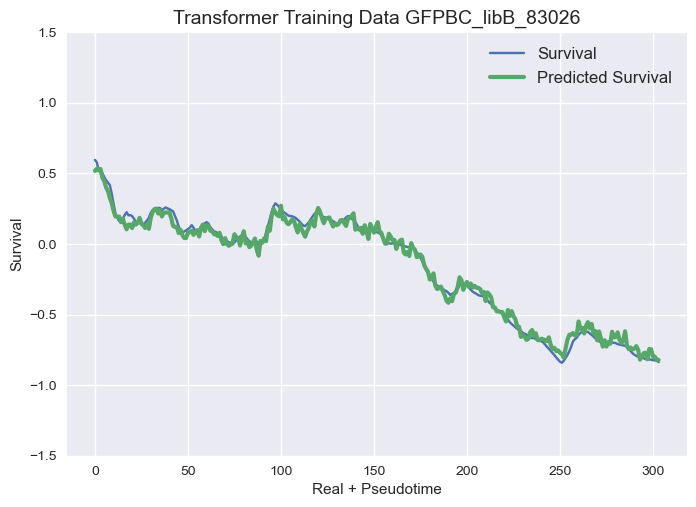


29/29 [==============================] - 0s 4ms/step - loss: 0.0264 - mean_squared_error: 0.0264 - val_loss: 0.1197 - val_mean_squared_error: 0.1197
Epoch 19/20
34/34 [==============================] - 0s 4ms/step - loss: 0.0454 - mean_squared_error: 0.0454 - val_loss: 0.1722 - val_mean_squared_error: 0.1722
Epoch 9/20
49/49 [==============================] - 0s 10ms/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.1424 - val_mean_squared_error: 0.1424
Epoch 17/20
31/31 [==============================] - 0s 3ms/step - loss: 0.0326 - mean_squared_error: 0.0326 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 17/20
29/29 [==============================] - 0s 4ms/step - loss: 0.0248 - mean_squared_error: 0.0248 - val_loss: 0.0872 - val_mean_squared_error: 0.0872
Epoch 20/20
34/34 [==============================] - 0s 4ms/step - loss: 0.0450 - mean_squared_error: 0.0450 - val_loss: 0.1757 - val_mean_squared_error: 0.1757
Epoch 10/20
7/7 [============================

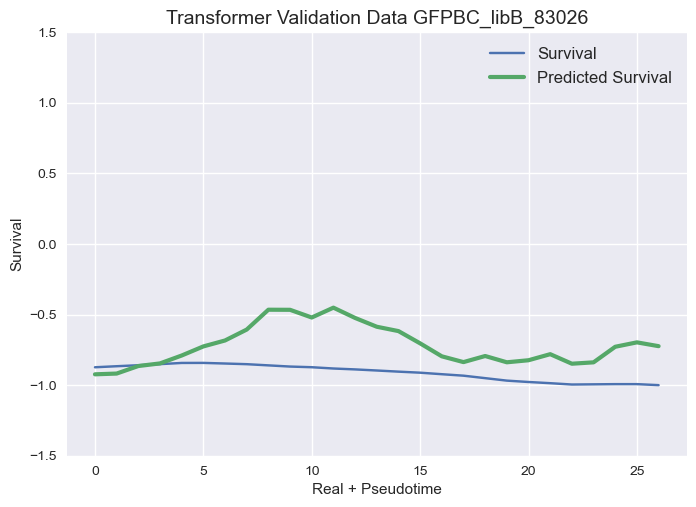

Epoch 11/20
7/7 [==============================] - 0s 15ms/step - loss: 0.1752 - mean_squared_error: 0.1752 - val_loss: 0.1173 - val_mean_squared_error: 0.1173
Epoch 4/20
 1/34 [..............................] - ETA: 0s - loss: 0.0419 - mean_squared_error: 0.0419

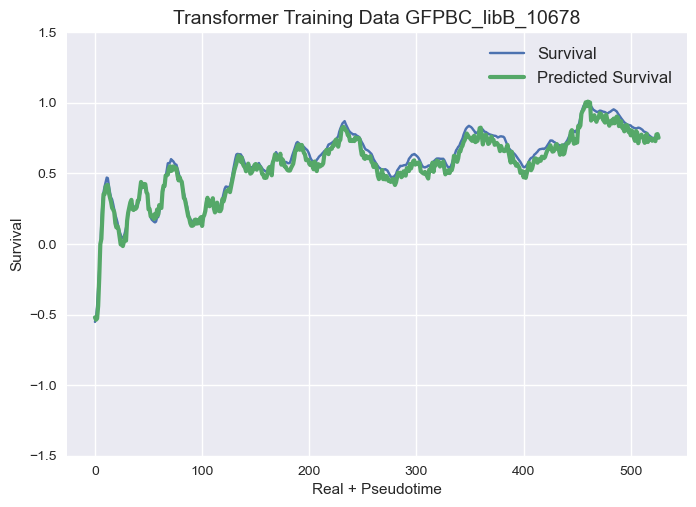

31/31 [==============================] - 0s 4ms/step - loss: 0.0287 - mean_squared_error: 0.0287 - val_loss: 0.0156 - val_mean_squared_error: 0.0156
(312, 72) (35, 72)
1/7 [===>..........................] - ETA: 0s - loss: 0.1141 - mean_squared_error: 0.1141
Evaluation metrics Regr
Regr Training Data - MSE: 0.0381
43/49 [=========================>....] - ETA: 0s - loss: 0.0043 - mean_squared_error: 0.0043Regr Validation Data - MSE: 0.1402Epoch 20/20

Epoch 12/20
7/7 [==============================] - 0s 17ms/step - loss: 0.1115 - mean_squared_error: 0.1115 - val_loss: 0.1075 - val_mean_squared_error: 0.1075
Epoch 6/20
49/49 [==============================] - 1s 14ms/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.1755 - val_mean_squared_error: 0.1755
Epoch 18/20
34/34 [==============================] - 0s 5ms/step - loss: 0.0398 - mean_squared_error: 0.0398 - val_loss: 0.1178 - val_mean_squared_error: 0.1178
Epoch 13/20
34/34 [==============================] - 0s 4ms/ste

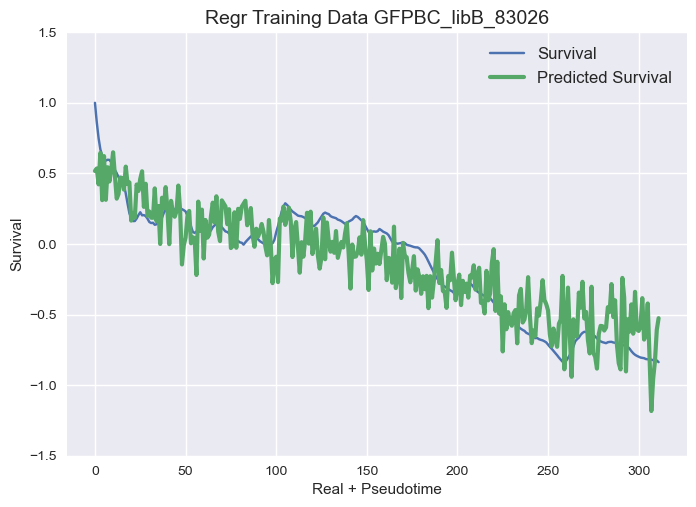

7/7 [==============================] - 0s 15ms/step - loss: 0.0316 - mean_squared_error: 0.0316 - val_loss: 0.1543 - val_mean_squared_error: 0.1543
Epoch 10/20
34/34 [==============================] - 0s 4ms/step - loss: 0.0376 - mean_squared_error: 0.0376 - val_loss: 0.1317 - val_mean_squared_error: 0.1317
Epoch 16/20
49/49 [==============================] - 1s 11ms/step - loss: 0.0035 - mean_squared_error: 0.0035 - val_loss: 0.1608 - val_mean_squared_error: 0.1608
Epoch 19/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.1698 - val_mean_squared_error: 0.1698
Epoch 11/20
34/34 [==============================] - 0s 4ms/step - loss: 0.0365 - mean_squared_error: 0.0365 - val_loss: 0.1323 - val_mean_squared_error: 0.1323
Epoch 17/20
7/7 [==============================] - 0s 16ms/step - loss: 0.0148 - mean_squared_error: 0.0148 - val_loss: 0.1338 - val_mean_squared_error: 0.1338
Epoch 12/20
11/11 [=============================

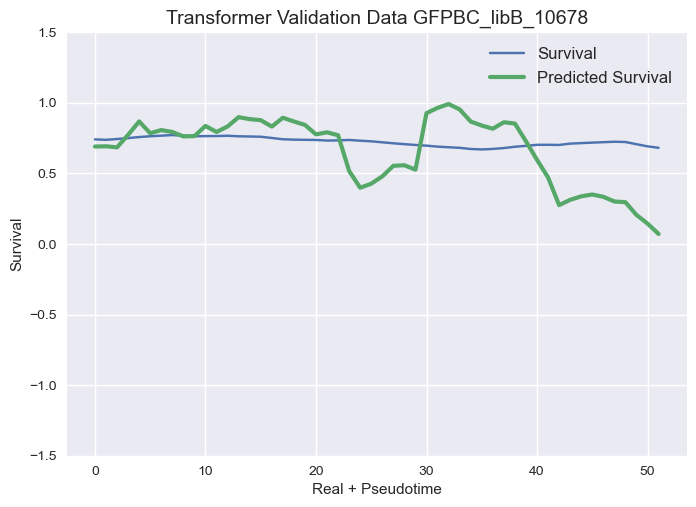

 1/34 [..............................] - ETA: 0s - loss: 0.0235 - mean_squared_error: 0.0235Epoch 2/20


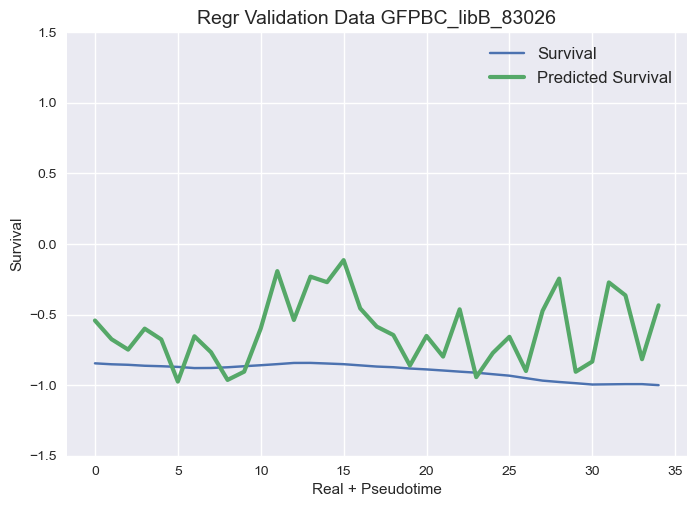

32/49 [==================>...........] - ETA: 0s - loss: 0.0032 - mean_squared_error: 0.0032
Epoch 1/20
7/7 [==============================] - 0s 20ms/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 0.1497 - val_mean_squared_error: 0.1497
Epoch 14/20
11/11 [==============================] - 0s 14ms/step - loss: 0.0466 - mean_squared_error: 0.0466 - val_loss: 0.1321 - val_mean_squared_error: 0.1321
Epoch 3/20
49/49 [==============================] - 0s 10ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.1822 - val_mean_squared_error: 0.1822
Epoch 20/20
11/11 [==============================] - 0s 13ms/step - loss: 0.0285 - mean_squared_error: 0.0285 - val_loss: 0.1443 - val_mean_squared_error: 0.1443
Epoch 4/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.1950 - val_mean_squared_error: 0.1950
 
Transformer Evaluation metricsEpoch 16/20

11/11 [==============================] - 0s 15ms/step - los

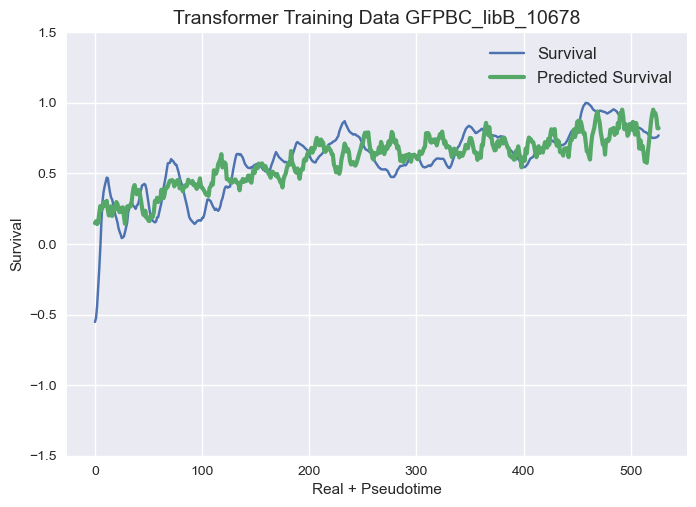

11/11 [==============================] - 0s 17ms/step - loss: 0.0873 - mean_squared_error: 0.0873 - val_loss: 0.0627 - val_mean_squared_error: 0.0627
Epoch 3/20
7/7 [==============================] - 0s 19ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.1604 - val_mean_squared_error: 0.1604
Epoch 20/20
11/11 [==============================] - 0s 15ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.1466 - val_mean_squared_error: 0.1466
Epoch 8/20
11/11 [==============================] - 0s 13ms/step - loss: 0.0550 - mean_squared_error: 0.0550 - val_loss: 0.0225 - val_mean_squared_error: 0.0225
Epoch 4/20
11/11 [==============================] - 0s 13ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.1579 - val_mean_squared_error: 0.1579
Epoch 9/20
11/11 [==============================] - 0s 13ms/step - loss: 0.0434 - mean_squared_error: 0.0434 - val_loss: 0.0224 - val_mean_squared_error: 0.0224
Epoch 5/20
 7/11 [==================>.........

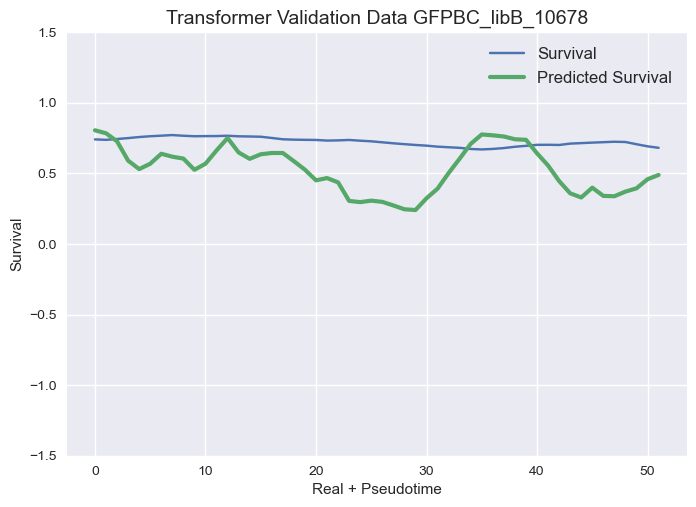

11/11 [==============================] - 0s 14ms/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.1383 - val_mean_squared_error: 0.1383
Epoch 10/20
11/11 [==============================] - 0s 16ms/step - loss: 0.0357 - mean_squared_error: 0.0357 - val_loss: 0.0180 - val_mean_squared_error: 0.0180
Epoch 6/20
11/11 [==============================] - 0s 13ms/step - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0356 - val_mean_squared_error: 0.0356
Epoch 7/20
11/11 [==============================] - 0s 19ms/step - loss: 0.0091 - mean_squared_error: 0.0091 - val_loss: 0.1282 - val_mean_squared_error: 0.1282
Epoch 11/20
11/11 [==============================] - 0s 14ms/step - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0253 - val_mean_squared_error: 0.0253
Epoch 8/20
29/29 [==============================] - 2s 19ms/step - loss: 0.1453 - mean_squared_error: 0.1453 - val_loss: 0.0607 - val_mean_squared_error: 0.0607
Epoch 2/20
 8/31 [======>..................

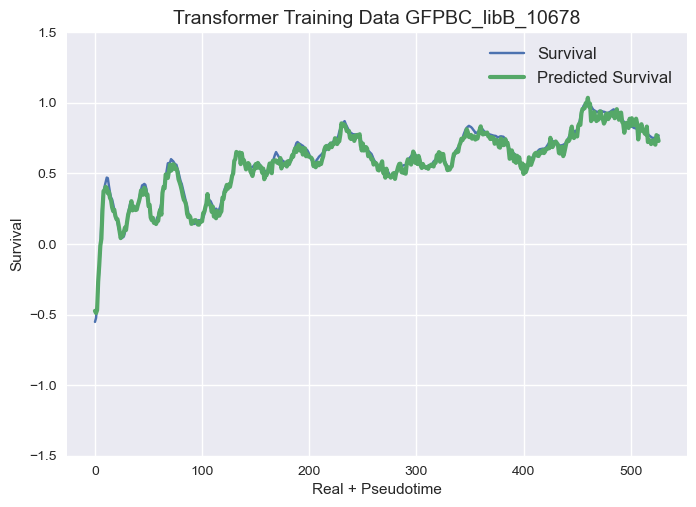

31/31 [==============================] - 2s 20ms/step - loss: 0.0553 - mean_squared_error: 0.0553 - val_loss: 0.0034 - val_mean_squared_error: 0.0034
Epoch 2/20
13/13 [==============================] - 0s 13ms/step - loss: 0.0651 - mean_squared_error: 0.0651 - val_loss: 0.3244 - val_mean_squared_error: 0.3244
Epoch 4/20
11/11 [==============================] - 0s 19ms/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0189 - val_mean_squared_error: 0.0189
Epoch 12/20
11/11 [==============================] - 0s 15ms/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.1829 - val_mean_squared_error: 0.1829
Epoch 17/20
Epoch 4/20
 1/11 [=>............................] - ETA: 0s - loss: 0.0040 - mean_squared_error: 0.0040

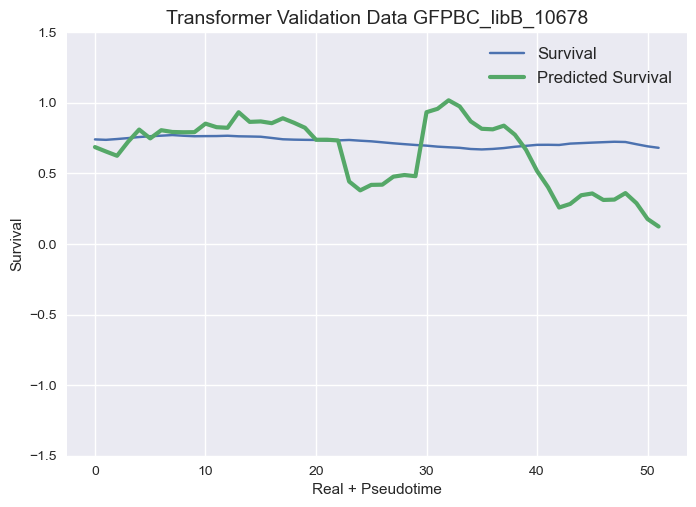

31/31 [==============================] - 0s 13ms/step - loss: 0.0403 - mean_squared_error: 0.0403 - val_loss: 0.0031 - val_mean_squared_error: 0.0031
(535, 72) (60, 72)
11/11 [==============================] - 0s 22ms/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0235 - val_mean_squared_error: 0.0235
Epoch 14/20
 8/11 [====================>.........] - ETA: 0s - loss: 0.0090 - mean_squared_error: 0.0090 
Evaluation metrics Regr
10/11 [==========================>...] - ETA: 0s - loss: 0.0085 - mean_squared_error: 0.0085Regr Training Data - MSE: 0.03
Regr Validation Data - MSE: 0.0681
49/49 [==============================] - 2s 9ms/step - loss: 0.0837 - mean_squared_error: 0.0837 - val_loss: 0.6818 - val_mean_squared_error: 0.6818
Epoch 2/20
11/11 [==============================] - 0s 31ms/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.1371 - val_mean_squared_error: 0.1371
Epoch 19/20
29/29 [==============================] - 0s 17ms/step - loss: 0.0158 - 

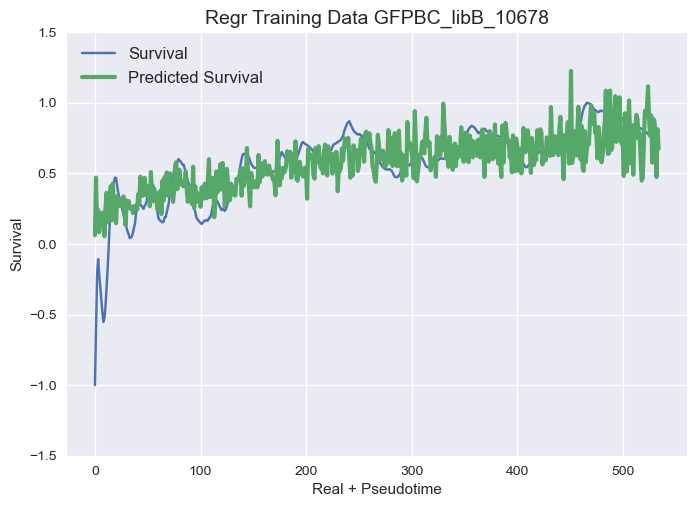

49/49 [==============================] - 0s 4ms/step - loss: 0.0694 - mean_squared_error: 0.0694 - val_loss: 0.4205 - val_mean_squared_error: 0.4205
Epoch 4/20
13/13 [==============================] - 0s 18ms/step - loss: 0.0212 - mean_squared_error: 0.0212 - val_loss: 0.5934 - val_mean_squared_error: 0.5934
Epoch 9/20
11/11 [==============================] - 0s 18ms/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.1509 - val_mean_squared_error: 0.1509
Epoch 5/20
11/11 [==============================] - 0s 15ms/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.0245 - val_mean_squared_error: 0.0245
Epoch 18/20
31/31 [==============================] - 0s 13ms/step - loss: 0.0183 - mean_squared_error: 0.0183 - val_loss: 0.0149 - val_mean_squared_error: 0.0149
Epoch 5/20
7/7 [==============================] - 0s 9ms/step - loss: 0.2603 - mean_squared_error: 0.2603 - val_loss: 0.5861 - val_mean_squared_error: 0.5861
Epoch 7/20
13/13 [==============================

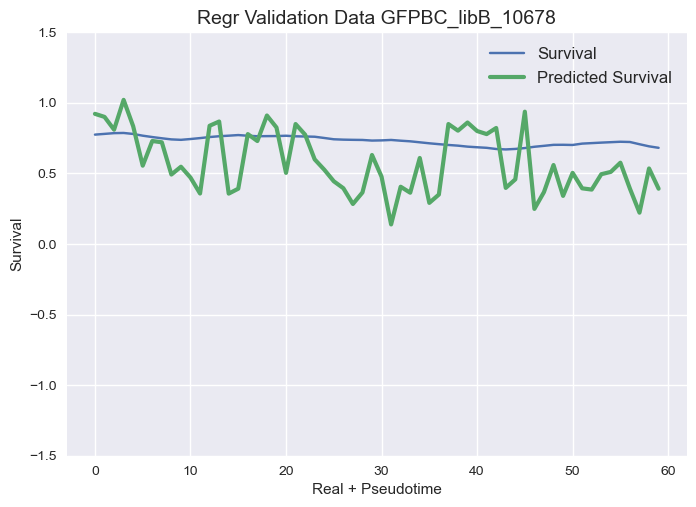

7/7 [==============================] - 0s 10ms/step - loss: 0.1823 - mean_squared_error: 0.1823 - val_loss: 0.3135 - val_mean_squared_error: 0.3135
Epoch 10/20
13/13 [==============================] - 0s 16ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.6356 - val_mean_squared_error: 0.6356rcode)  (824, 8, 
(52, 8, 72)Epoch 11/20

 7/15 [=============>................] - ETA: 0s - loss: 0.0674 - mean_squared_error: 0.0674Epoch 8/20
Epoch 3/20
Epoch 6/20
11/11 [==============================] - 0s 18ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0226 - val_mean_squared_error: 0.0226
Epoch 20/20
Epoch 1/20
31/31 [==============================] - 0s 13ms/step - loss: 0.0083 - mean_squared_error: 0.0083 - val_loss: 0.0151 - val_mean_squared_error: 0.0151
Epoch 6/20
15/15 [==============================] - 0s 13ms/step - loss: 0.0556 - mean_squared_error: 0.0556 - val_loss: 0.0344 - val_mean_squared_error: 0.0344
Epoch 3/20
13/13 [======================

Epoch 11/20
Epoch 7/20
31/31 [==============================] - 0s 12ms/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.0086 - val_mean_squared_error: 0.0086
Epoch 9/20
Epoch 17/20
29/29 [==============================] - 0s 11ms/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0778 - val_mean_squared_error: 0.0778
Epoch 12/20
13/13 [==============================] - 0s 16ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.5833 - val_mean_squared_error: 0.5833
Epoch 18/20
49/49 [==============================] - 0s 6ms/step - loss: 0.0522 - mean_squared_error: 0.0522 - val_loss: 0.1324 - val_mean_squared_error: 0.1324
Epoch 12/20
Epoch 7/20
13/13 [==============================] - 0s 15ms/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.5954 - val_mean_squared_error: 0.5954
Epoch 19/20
15/15 [==============================] - 0s 14ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0377 - val_mean_squared_error: 0.0

49/49 [==============================] - 0s 4ms/step - loss: 0.0467 - mean_squared_error: 0.0467 - val_loss: 0.1472 - val_mean_squared_error: 0.1472
Epoch 16/20
11/11 [==============================] - 0s 9ms/step - loss: 0.1196 - mean_squared_error: 0.1196 - val_loss: 0.1693 - val_mean_squared_error: 0.1693
Epoch 4/20
11/11 [==============================] - 0s 8ms/step - loss: 0.1059 - mean_squared_error: 0.1059 - val_loss: 0.1762 - val_mean_squared_error: 0.1762
Epoch 14/20
Epoch 5/20
Epoch 1/20
11/11 [==============================] - 0s 8ms/step - loss: 0.0243 - mean_squared_error: 0.0243 - val_loss: 0.1127 - val_mean_squared_error: 0.1127
Epoch 14/20
31/31 [==============================] - 0s 11ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0103 - val_mean_squared_error: 0.0103
Epoch 13/20
11/11 [==============================] - 0s 5ms/step - loss: 0.0874 - mean_squared_error: 0.0874 - val_loss: 0.1015 - val_mean_squared_error: 0.1015
Epoch 7/20
34/34 [======

11/11 [==============================] - 0s 6ms/step - loss: 0.0495 - mean_squared_error: 0.0495 - val_loss: 0.0180 - val_mean_squared_error: 0.0180
Epoch 16/20
15/15 [==============================] - 0s 19ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0356 - val_mean_squared_error: 0.0356
Epoch 17/20
11/11 [==============================] - 0s 6ms/step - loss: 0.0428 - mean_squared_error: 0.0428 - val_loss: 0.0205 - val_mean_squared_error: 0.0205
Epoch 18/20
11/11 [==============================] - 0s 7ms/step - loss: 0.0430 - mean_squared_error: 0.0430 - val_loss: 0.0221 - val_mean_squared_error: 0.0221
Epoch 19/20
7/7 [==============================] - 0s 24ms/step - loss: 0.1315 - mean_squared_error: 0.1315 - val_loss: 0.0789 - val_mean_squared_error: 0.0789
Epoch 4/20
31/31 [==============================] - 0s 13ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0128 - val_mean_squared_error: 0.0128
Epoch 19/20
18/29 [=================>.........

7/7 [==============================] - 0s 20ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0332 - val_mean_squared_error: 0.0332
Epoch 10/20
13/13 [==============================] - 0s 7ms/step - loss: 0.0694 - mean_squared_error: 0.0694 - val_loss: 1.2292 - val_mean_squared_error: 1.2292
Epoch 11/20
7/7 [==============================] - 0s 21ms/step - loss: 0.0205 - mean_squared_error: 0.0205 - val_loss: 0.0348 - val_mean_squared_error: 0.0348
Epoch 12/20
13/13 [==============================] - 0s 8ms/step - loss: 0.0623 - mean_squared_error: 0.0623 - val_loss: 1.2623 - val_mean_squared_error: 1.2623
Epoch 12/20
13/13 [==============================] - 0s 7ms/step - loss: 0.0638 - mean_squared_error: 0.0638 - val_loss: 1.1461 - val_mean_squared_error: 1.1461
Epoch 13/20
Epoch 13/20
34/34 [==============================] - 0s 11ms/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0964 - val_mean_squared_error: 0.0964
Epoch 16/20
13/13 [================

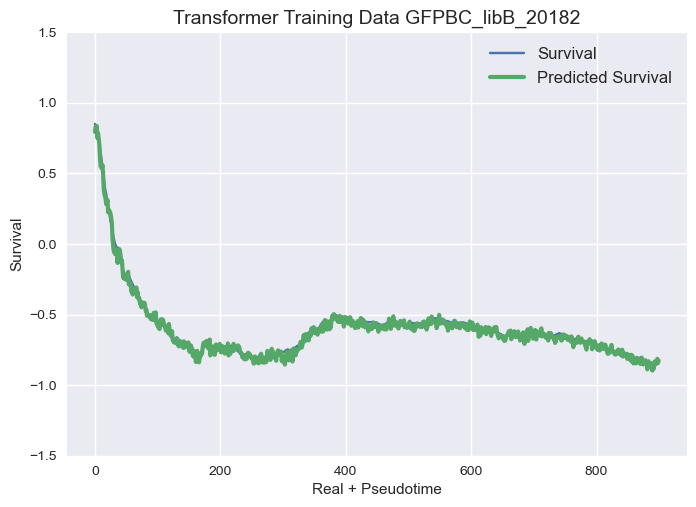

11/11 [==============================] - 0s 15ms/step - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.0764 - val_mean_squared_error: 0.0764
Epoch 4/20
15/15 [==============================] - 1s 20ms/step - loss: 0.2436 - mean_squared_error: 0.2436 - val_loss: 0.1065 - val_mean_squared_error: 0.1065
Epoch 2/20
Epoch 20/20
34/34 [==============================] - 0s 12ms/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0909 - val_mean_squared_error: 0.0909
Epoch 19/20
11/11 [==============================] - 0s 15ms/step - loss: 0.0297 - mean_squared_error: 0.0297 - val_loss: 0.0846 - val_mean_squared_error: 0.0846
Epoch 3/20
Epoch 5/20
15/15 [==============================] - 0s 6ms/step - loss: 0.1975 - mean_squared_error: 0.1975 - val_loss: 0.1954 - val_mean_squared_error: 0.1954
Epoch 2/20
26/26 [==============================] - 0s 13ms/step - loss: 0.0071 - mean_squared_error: 0.0071 - val_loss: 0.1284 - val_mean_squared_error: 0.1284
Epoch 9/20
 6/26 [====

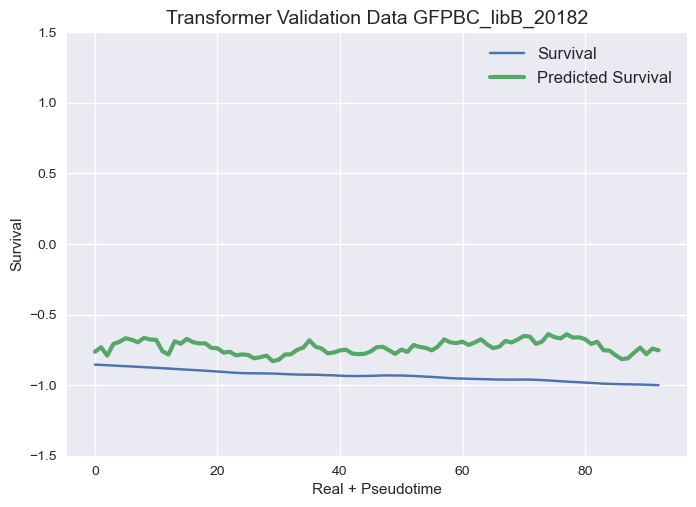

15/15 [==============================] - 0s 9ms/step - loss: 0.1827 - mean_squared_error: 0.1827 - val_loss: 0.3399 - val_mean_squared_error: 0.3399

11/11 [==============================] - 0s 13ms/step - loss: 0.0781 - mean_squared_error: 0.0781 - val_loss: 0.0158 - val_mean_squared_error: 0.0158
Epoch 5/20
11/11 [==============================] - 0s 14ms/step - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0867 - val_mean_squared_error: 0.0867
Epoch 7/20
34/34 [==============================] - 0s 12ms/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.0908 - val_mean_squared_error: 0.0908
Epoch 20/20
15/15 [==============================] - 0s 6ms/step - loss: 0.1192 - mean_squared_error: 0.1192 - val_loss: 0.3466 - val_mean_squared_error: 0.3466
Epoch 7/20
42/49 [========================>.....] - ETA: 0s - loss: 0.0747 - mean_squared_error: 0.0747Epoch 10/20

11/11 [==============================] - 0s 16ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - v

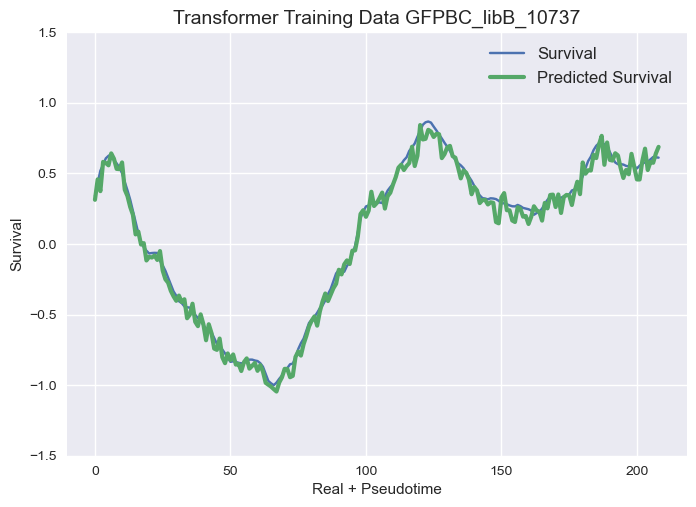

15/15 [==============================] - 0s 9ms/step - loss: 0.0387 - mean_squared_error: 0.0387 - val_loss: 0.1209 - val_mean_squared_error: 0.1209
Epoch 11/20
11/11 [==============================] - 0s 16ms/step - loss: 0.0186 - mean_squared_error: 0.0186 - val_loss: 0.0303 - val_mean_squared_error: 0.0303
Epoch 7/20
11/11 [==============================] - 0s 15ms/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.1546 - val_mean_squared_error: 0.1546
Epoch 11/20
 8/11 [====================>.........] - ETA: 0s - loss: 0.0073 - mean_squared_error: 0.0073

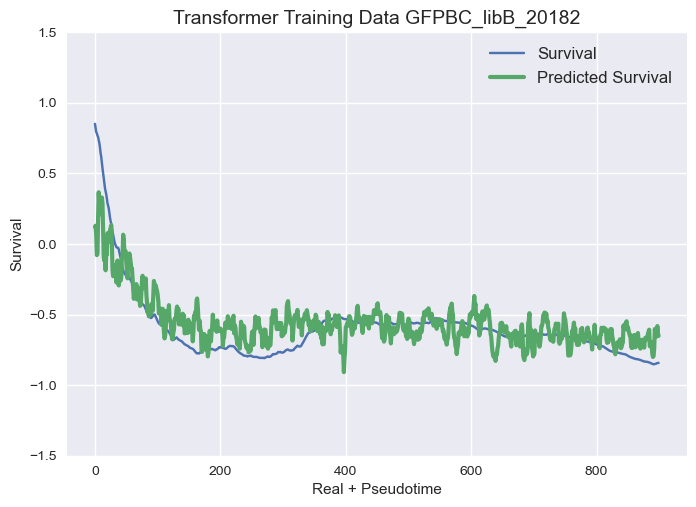

26/26 [==============================] - 0s 13ms/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.1167 - val_mean_squared_error: 0.1167
Epoch 12/20
11/11 [==============================] - 0s 18ms/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.1469 - val_mean_squared_error: 0.1469
Epoch 12/20
15/15 [==============================] - 0s 6ms/step - loss: 0.0326 - mean_squared_error: 0.0326 - val_loss: 0.0842 - val_mean_squared_error: 0.0842
Epoch 13/20


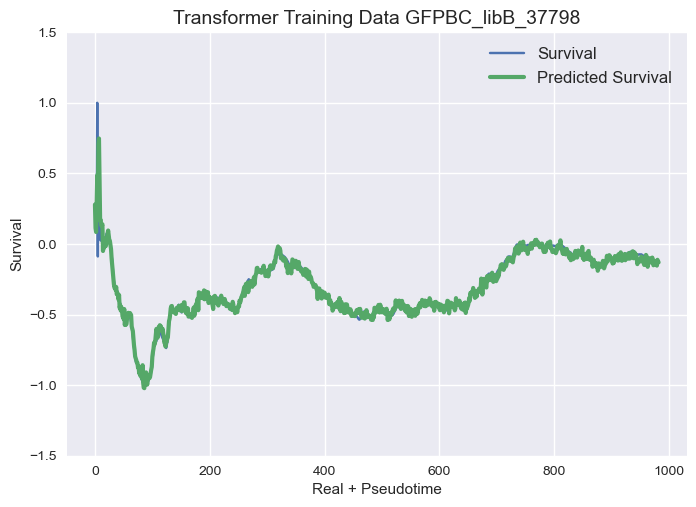

15/15 [==============================] - 0s 6ms/step - loss: 0.0298 - mean_squared_error: 0.0298 - val_loss: 0.0732 - val_mean_squared_error: 0.0732
Epoch 14/20
11/11 [==============================] - 0s 16ms/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0148 - val_mean_squared_error: 0.0148
Epoch 9/20
11/11 [==============================] - 0s 16ms/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.1522 - val_mean_squared_error: 0.1522


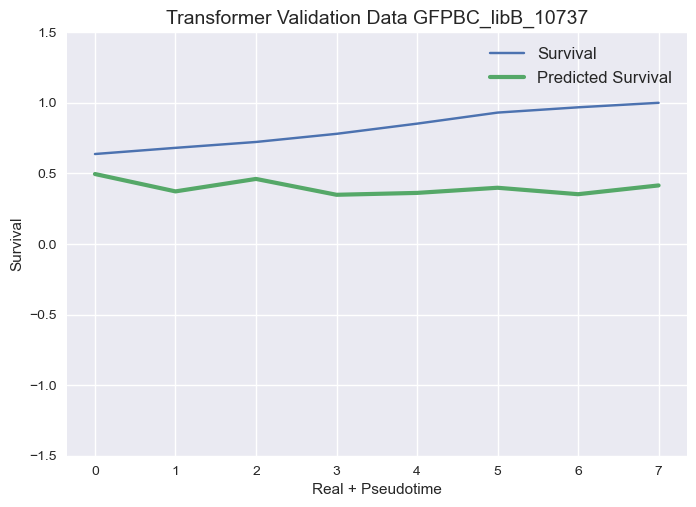

(209, 8, 72) Epoch 13/20
11/11 [==============================] - 0s 17ms/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0202 - val_mean_squared_error: 0.0202
Epoch 10/20
 1/11 [=>............................] - ETA: 0s - loss: 0.0058 - mean_squared_error: 0.0058Epoch 14/20


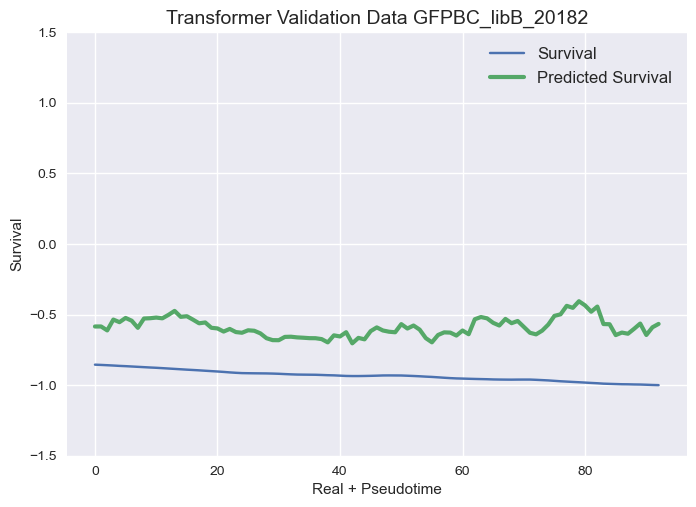

15/15 [==============================] - 0s 6ms/step - loss: 0.0312 - mean_squared_error: 0.0312 - val_loss: 0.0813 - val_mean_squared_error: 0.0813
Epoch 13/20

 5/26 [====>.........................] - ETA: 0s - loss: 0.0049 - mean_squared_error: 0.0049

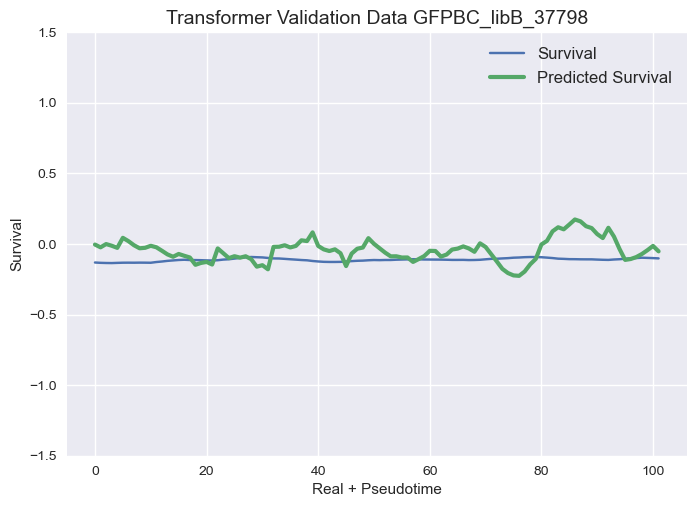

11/11 [==============================] - 0s 12ms/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.1338 - val_mean_squared_error: 0.1338
Epoch 15/20
33/49 [===================>..........] - ETA: 0s - loss: 0.0344 - mean_squared_error: 0.0344(102, 8, 72)
Epoch 11/20
 6/11 [===============>..............] - ETA: 0s - loss: 0.0079 - mean_squared_error: 0.0079
Transformer Evaluation metrics
16/26 [=================>............] - ETA: 0s - loss: 0.0054 - mean_squared_error: 0.0054
Transformer Validation MSE - MSE: 0.0268
11/11 [==============================] - 0s 15ms/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0218 - val_mean_squared_error: 0.0218
Epoch 18/20
11/11 [==============================] - 0s 14ms/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.1197 - val_mean_squared_error: 0.1197
Epoch 12/20
4/4 [==============================] - 0s 4ms/step
Epoch 4/20
 7/11 [==================>...........] - ETA: 0s - loss: 0.0068 - mean_square

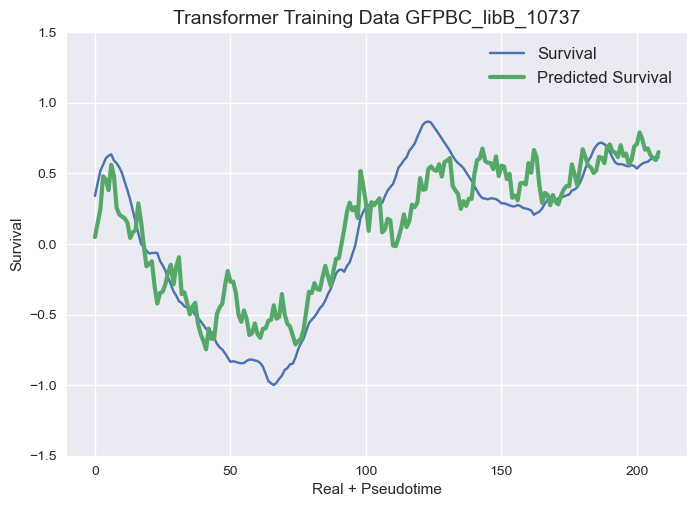

11/11 [==============================] - 0s 14ms/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.1382 - val_mean_squared_error: 0.1382
Epoch 18/20
13/13 [==============================] - 2s 31ms/step - loss: 0.2119 - mean_squared_error: 0.2119 - val_loss: 0.7650 - val_mean_squared_error: 0.7650
Epoch 2/20
11/11 [==============================] - 0s 15ms/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0139 - val_mean_squared_error: 0.0139
Epoch 15/20
11/11 [==============================] - 0s 15ms/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.1144 - val_mean_squared_error: 0.1144
Epoch 19/20
26/26 [==============================] - 0s 15ms/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.1171 - val_mean_squared_error: 0.1171


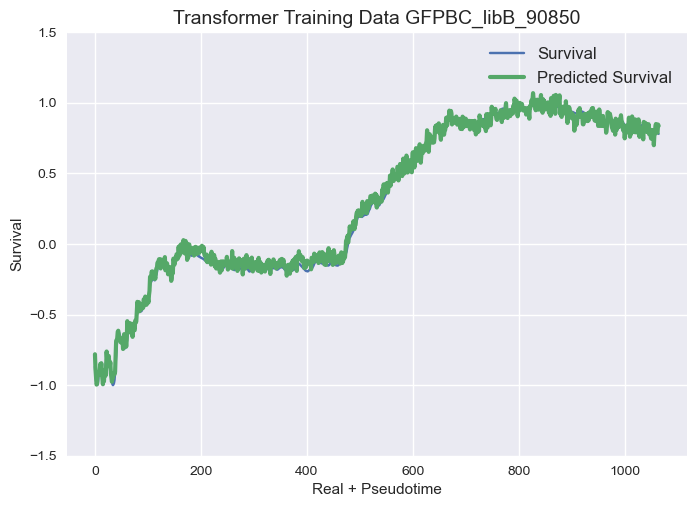

 3/26 [==>...........................] - ETA: 0s - loss: 0.0041 - mean_squared_error: 0.0041

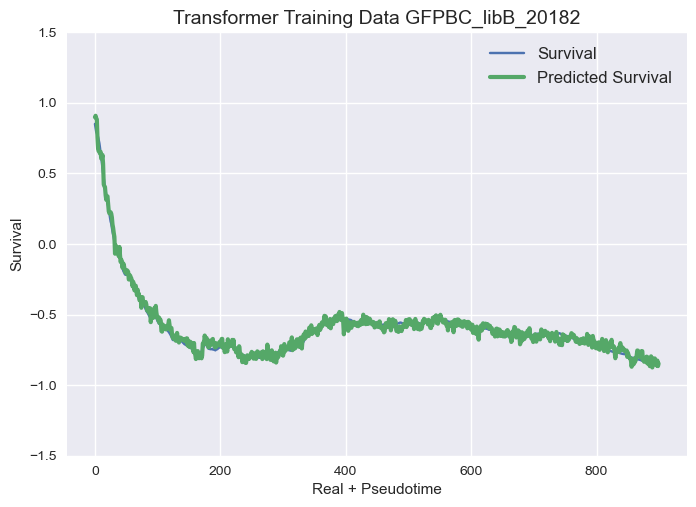

49/49 [==============================] - 1s 11ms/step - loss: 0.0158 - mean_squared_error: 0.0158 - val_loss: 0.2051 - val_mean_squared_error: 0.2051


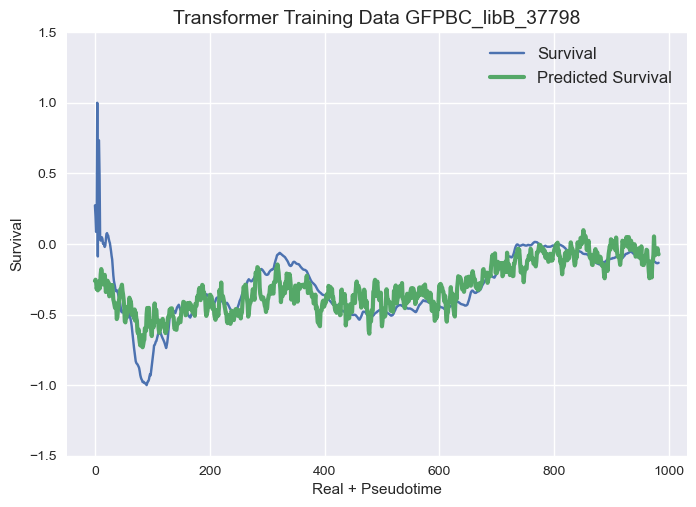

11/11 [==============================] - 0s 15ms/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.1488 - val_mean_squared_error: 0.1488
Epoch 20/20
13/13 [==============================] - 0s 15ms/step - loss: 0.0686 - mean_squared_error: 0.0686 - val_loss: 0.9396 - val_mean_squared_error: 0.9396


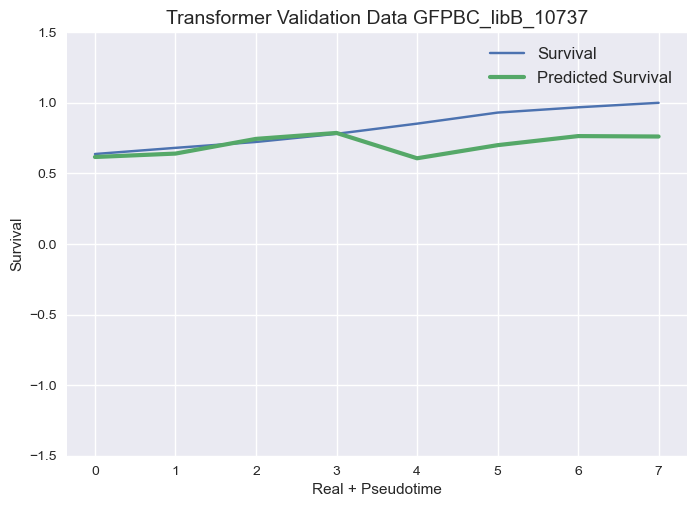

Epoch 4/20
11/11 [==============================] - 0s 17ms/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0171 - val_mean_squared_error: 0.0171
Epoch 17/20
31/49 [=================>............] - ETA: 0s - loss: 0.0139 - mean_squared_error: 0.0139(344, 8, 7 (17, 8, 72)

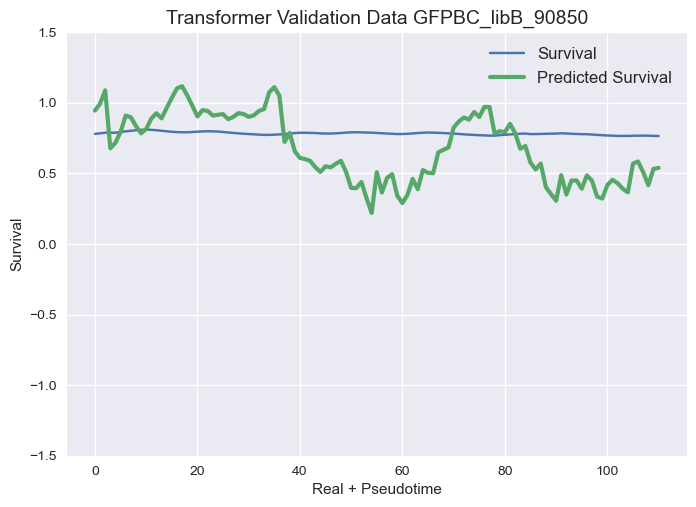

Epoch 16/20
(1065, 8, 72) (111, 8, 72)

13/13 [==============================] - 0s 14ms/step - loss: 0.0467 - mean_squared_error: 0.0467 - val_loss: 0.9330 - val_mean_squared_error: 0.9330
Epoch 5/20
11/11 [==============================] - 0s 14ms/step - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0182 - val_mean_squared_error: 0.0182


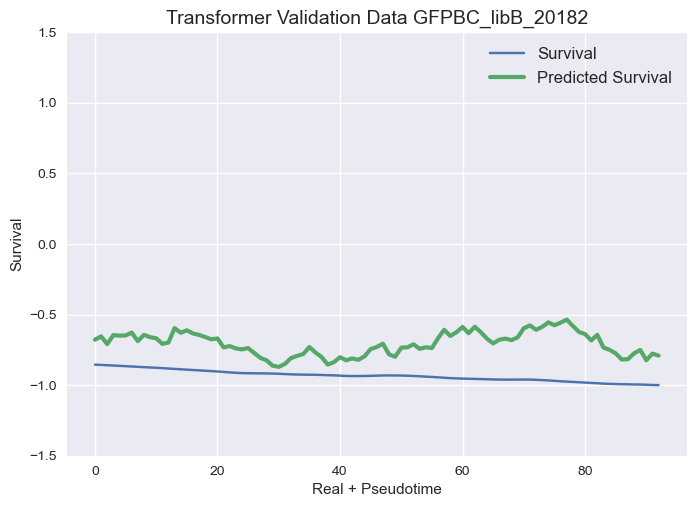

Epoch 18/20
11/26 [===========>..................] - ETA: 0s - loss: 0.0041 - mean_squared_error: 0.0041

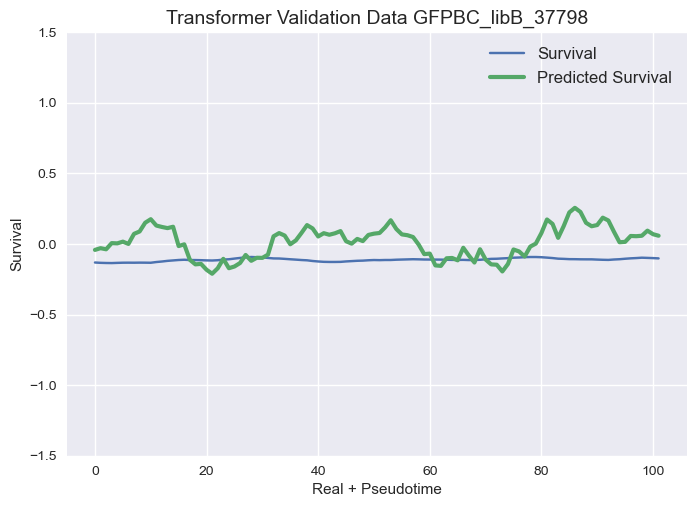

(983, 8, 72) (102, 8, 72)Epoch 1/20

 7/11 [==================>...........] - ETA: 0s - loss: 0.0044 - mean_squared_error: 0.0044 
Transformer Evaluation metrics
16/26 [=================>............] - ETA: 0s - loss: 0.0047 - mean_squared_error: 0.0047Transformer Training MSE - MSE: 0.0040(908, 72)
Transformer Validation MSE - MSE: 0.0560
 (101, 72)
34/34 [==============================] - 0s 2ms/step
Epoch 6/20
49/49 [==============================] - 1s 11ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.1928 - val_mean_squared_error: 0.1928
Epoch 6/20
13/13 [==============================] - 0s 18ms/step - loss: 0.0293 - mean_squared_error: 0.0293 - val_loss: 0.9674 - val_mean_squared_error: 0.9674
Epoch 7/20
 6/11 [===============>..............] - ETA: 0s - loss: 0.0042 - mean_squared_error: 0.0042 
Transformer Evaluation metrics 
Transformer Training MSE - MSE: 0.0019

27/31 [=========================>....] - ETA: 0sTransformer Evaluation metricsTransformer Vali

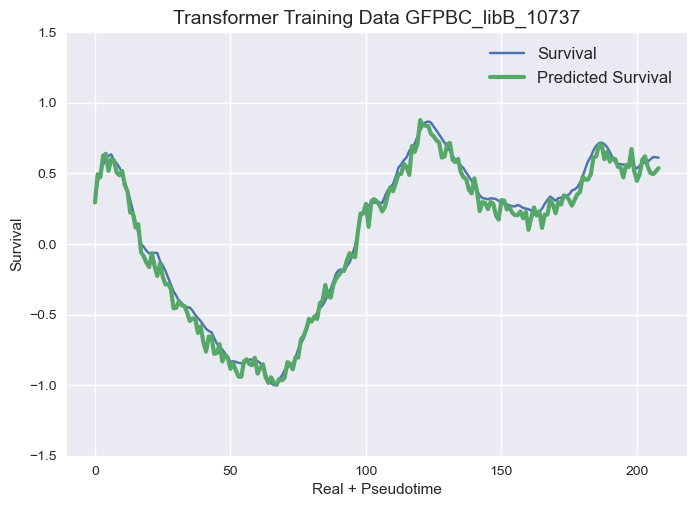

26/26 [==============================] - 0s 16ms/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.1360 - val_mean_squared_error: 0.1360
Epoch 18/20
49/49 [==============================] - 1s 13ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.1613 - val_mean_squared_error: 0.1613
Epoch 7/20
 6/49 [==>...........................] - ETA: 0s - loss: 0.0052 - mean_squared_error: 0.0052

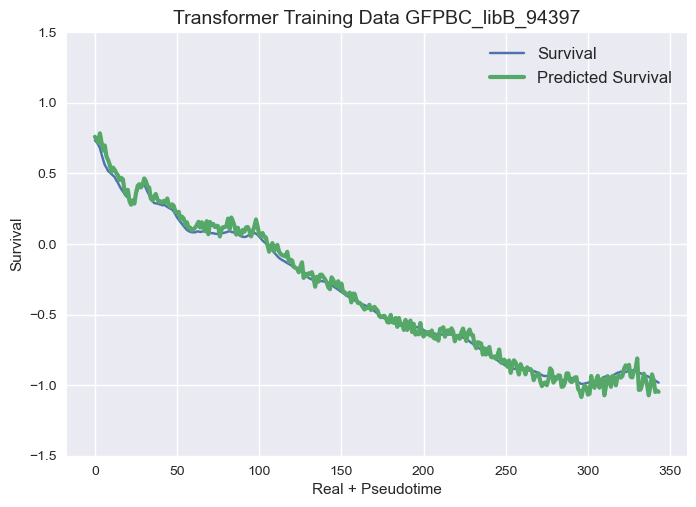

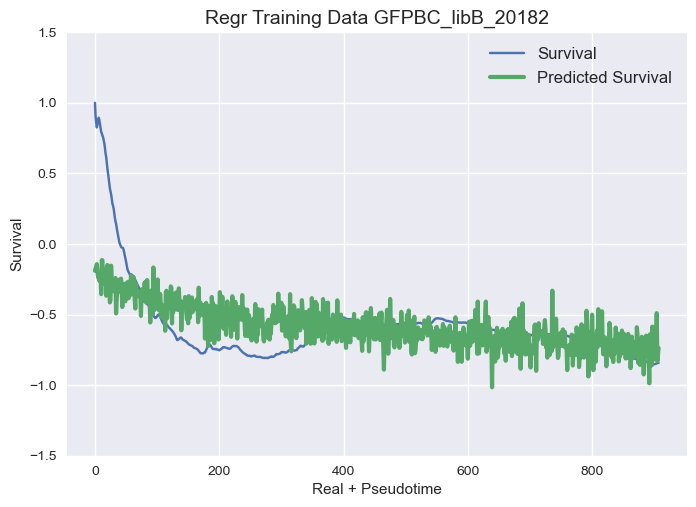

11/49 [=====>........................] - ETA: 0s - loss: 0.0063 - mean_squared_error: 0.0063

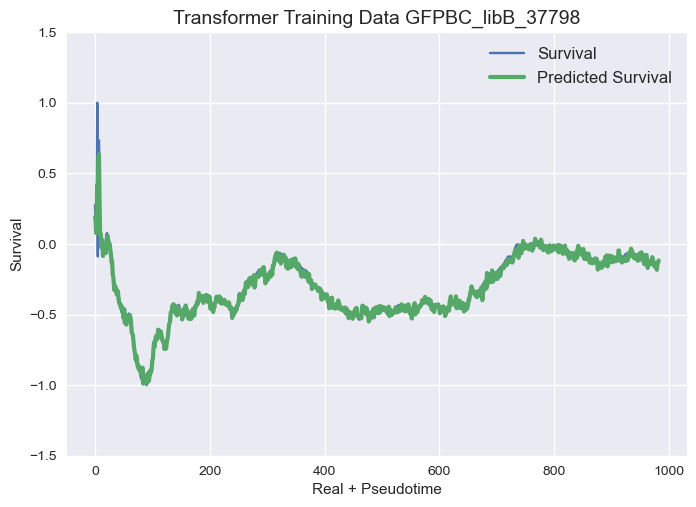

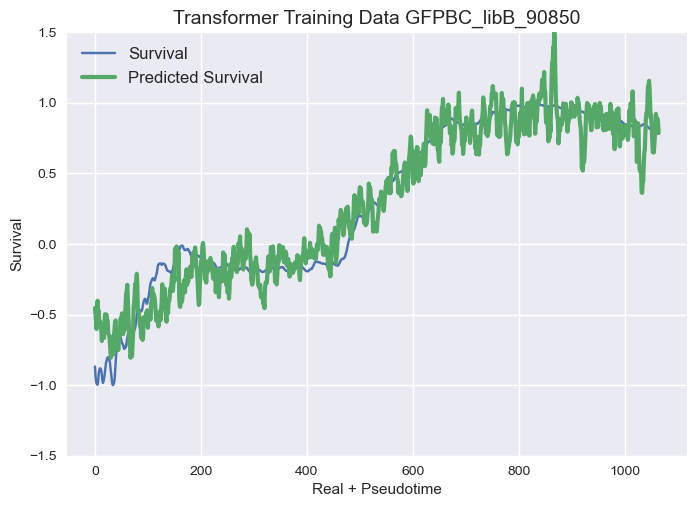

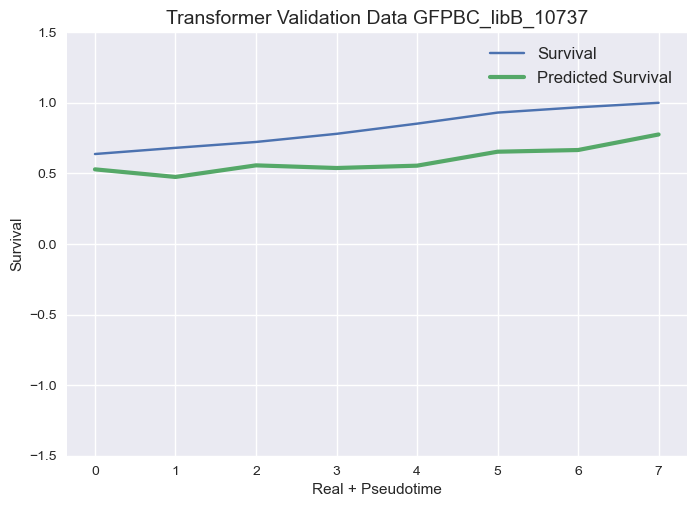

1/1 [==============================] - 0s 47ms/steploss: 0.0067 - mean_squared_error: 0.00
 (217, 72)
Transformer Evaluation metrics
13/13 [==============================] - 0s 14ms/step - loss: 0.0141 - mean_squared_error: 0.0141 - val_loss: 0.8898 - val_mean_squared_error: 0.8898
(16, 72)Epoch 10/20
Transformer Training MSE - MSE: 0.0040
Transformer Validation MSE - MSE: 0.0177
 8/13 [=================>............] - ETA: 0s - loss: 0.0147 - mean_squared_error: 0.0147Evaluation metrics Regr
Regr Training Data - MSE: 0.1318
Regr Validation Data - MSE: 0.1332
13/13 [==============================] - 0s 12ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.7289 - val_mean_squared_error: 0.7289
Epoch 11/20
Epoch 19/20
13/13 [==============================] - 0s 16ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.7940 - val_mean_squared_error: 0.7940
Epoch 12/20
Epoch 8/20
22/26 [========================>.....] - ETA: 0s - loss: 0.0037 - mean_squared_error: 

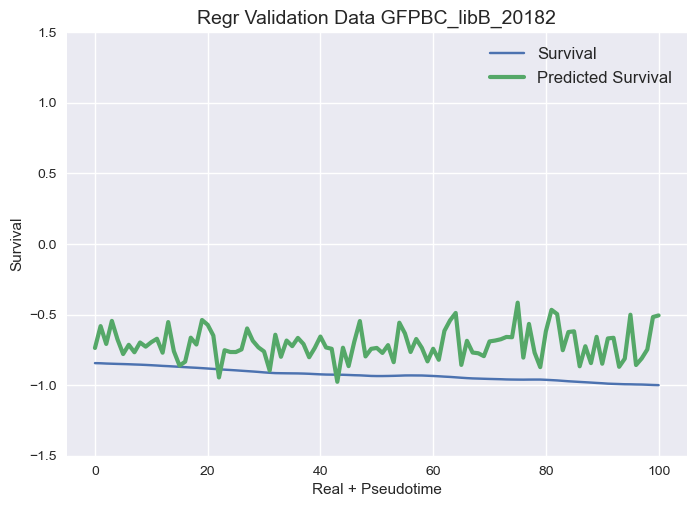

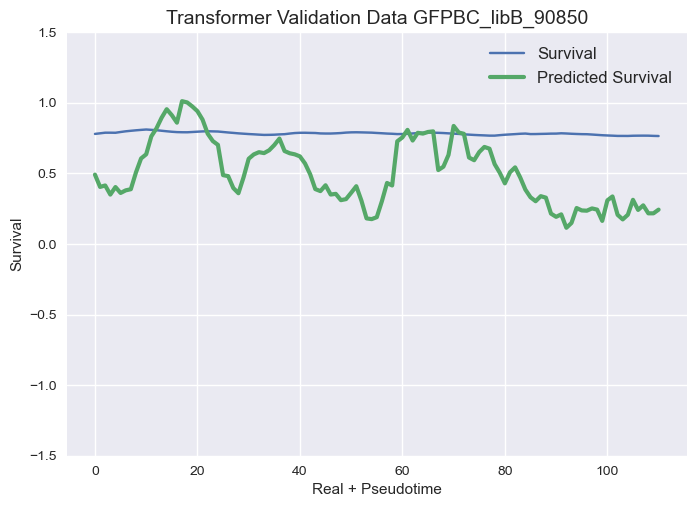

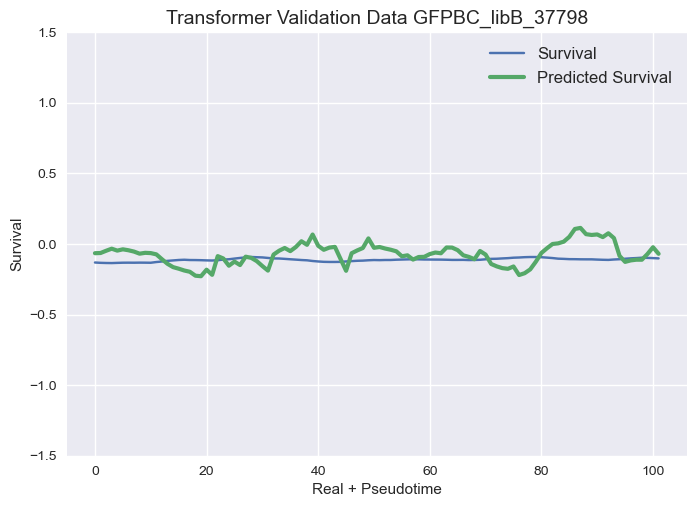

 7/49 [===>..........................] - ETA: 0s - loss: 0.0050 - mean_squared_error: 0.0050

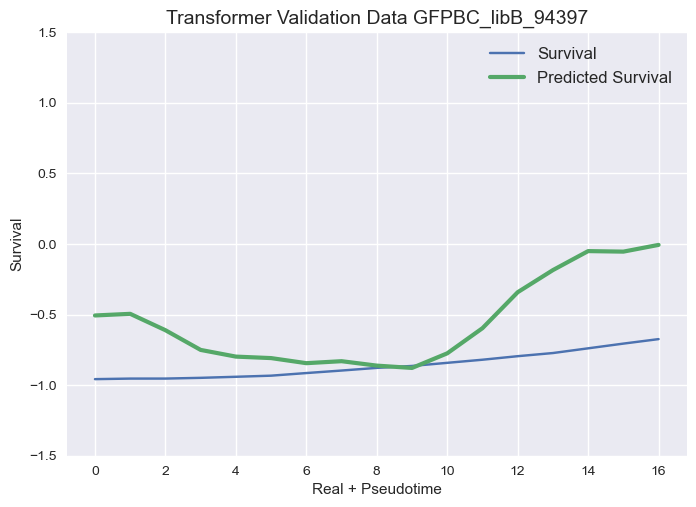

(344, 8, 72) (17, 8, 72)
13/13 [==============================] - 0s 19ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.9200 - val_mean_squared_error: 0.9200


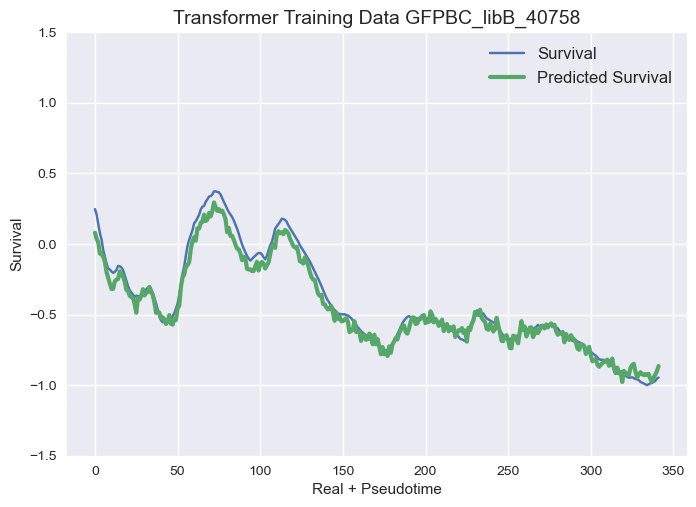

 Epoch 13/20
29/49 [================>.............] - ETA: 0s - loss: 0.0057 - mean_squared_error: 0.0057 
Evaluation metrics Regr
Regr Training Data - MSE: 0.0495
Regr Validation Data - MSE: 0.0052
1/1 [==============================] - 0s 76ms/step
Epoch 14/20
47/49 [===========================>..] - ETA: 0s - loss: 0.0068 - mean_squared_error: 0.0068 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0138
Transformer Validation MSE - MSE: 0.0816
49/49 [==============================] - 1s 12ms/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.1858 - val_mean_squared_error: 0.1858
Epoch 9/20
 
 1/49 [..............................] - ETA: 0s - loss: 0.0052 - mean_squared_error: 0.0052Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0019
Transformer Validation MSE - MSE: 0.1012
13/13 [==============================] - 0s 14ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.8821 - val_mean_squared_error: 0.8821
Epoch 15/20
 1/1

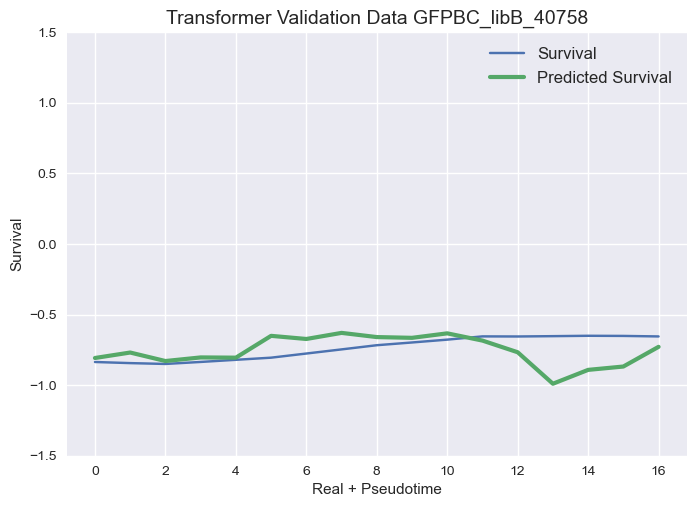

(342, 8, 72) (17, 8, 72)
12/13 [==========================>...] - ETA: 0s - loss: 0.0097 - mean_squared_error: 0.0097

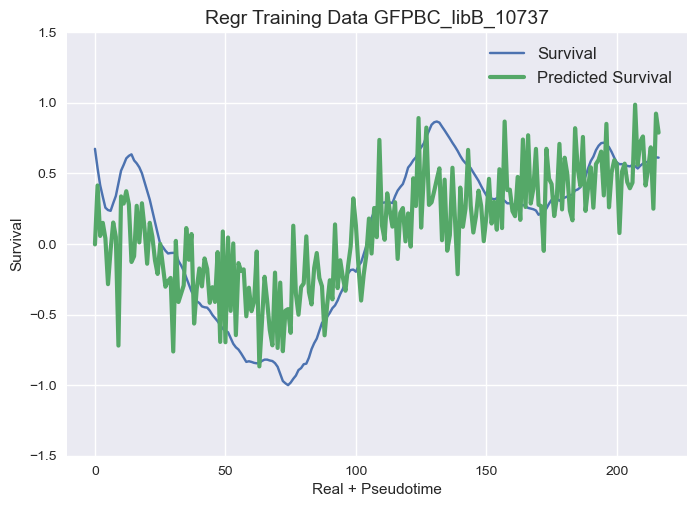

13/13 [==============================] - 0s 13ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.9407 - val_mean_squared_error: 0.9407


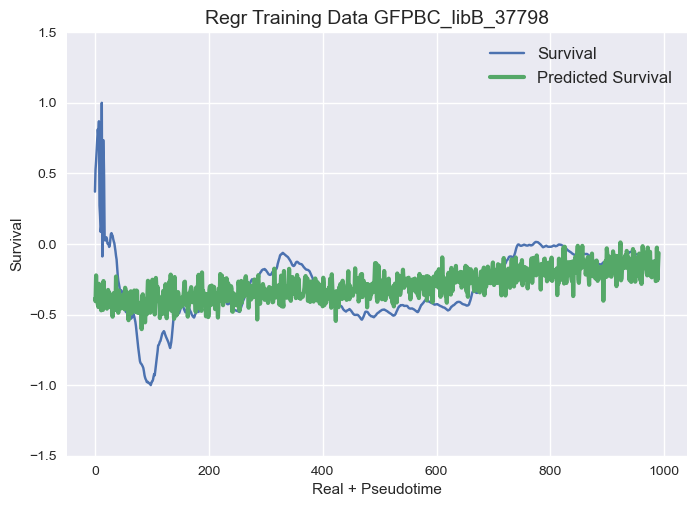

1/1 [==============================] - 0s 25ms/steploss: 0.0063 - mean_squared_error: 0.00
 


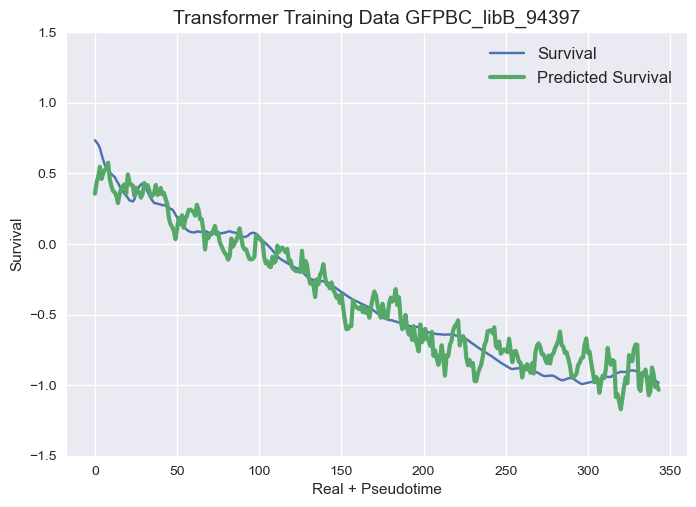

Transformer Evaluation metrics
47/49 [===========================>..] - ETA: 0s - loss: 0.0065 - mean_squared_error: 0.0065Transformer Training MSE - MSE: 0.0306
Transformer Validation MSE - MSE: 0.0311
13/13 [==============================] - 0s 11ms/step - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.8929 - val_mean_squared_error: 0.8929
Epoch 17/20
49/49 [==============================] - 0s 9ms/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.1704 - val_mean_squared_error: 0.1704
Epoch 10/20


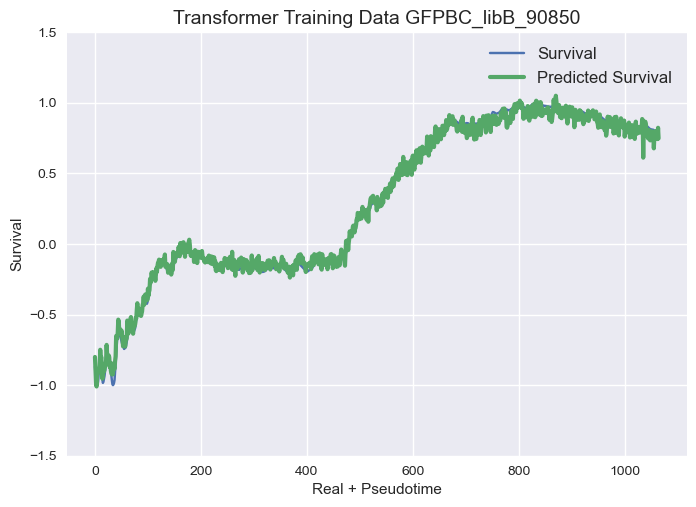

15/15 [==============================] - 2s 26ms/step - loss: 0.1516 - mean_squared_error: 0.1516 - val_loss: 0.1032 - val_mean_squared_error: 0.1032
Epoch 2/20
Epoch 1/20
 7/13 [===============>..............] - ETA: 0s - loss: 0.0103 - mean_squared_error: 0.0103

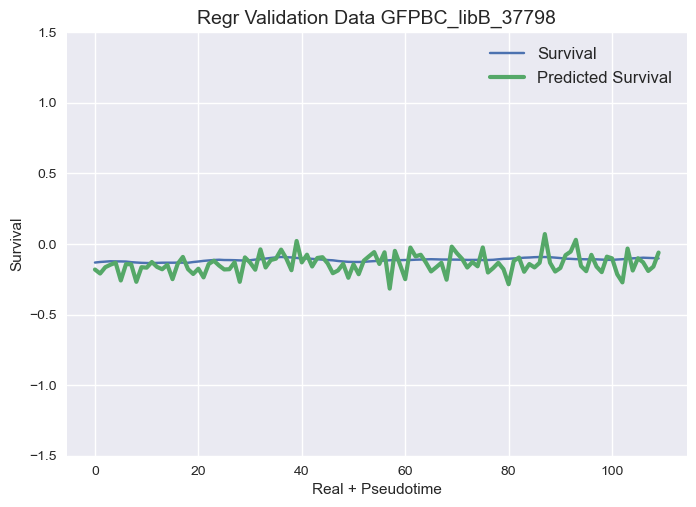

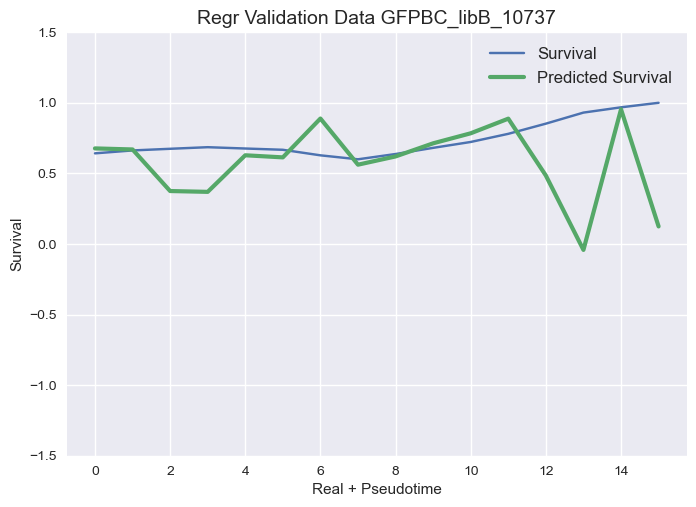

15/15 [==============================] - 0s 13ms/step - loss: 0.0499 - mean_squared_error: 0.0499 - val_loss: 0.0476 - val_mean_squared_error: 0.0476
Transformer Training/Val set shapes (varies depending on barcode)  Epoch 1/20
Epoch 3/20
(287, 8, 72) (8, 8, 72)
13/13 [==============================] - 0s 12ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.9405 - val_mean_squared_error: 0.9405
Epoch 19/20
11/15 [=====================>........] - ETA: 0s - loss: 0.0300 - mean_squared_error: 0.0300

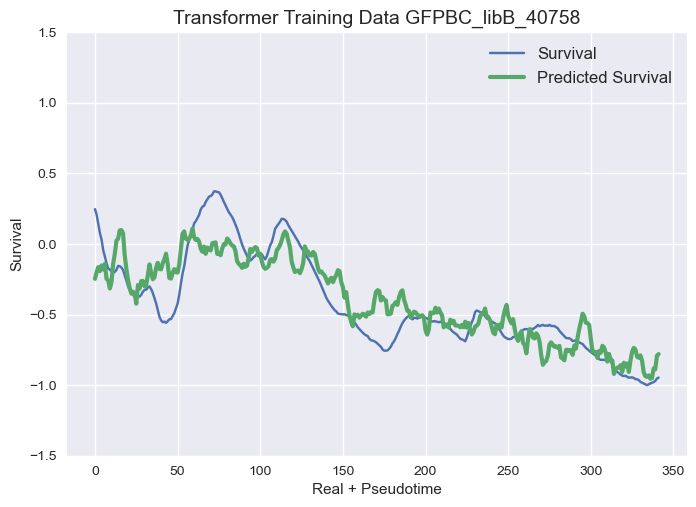

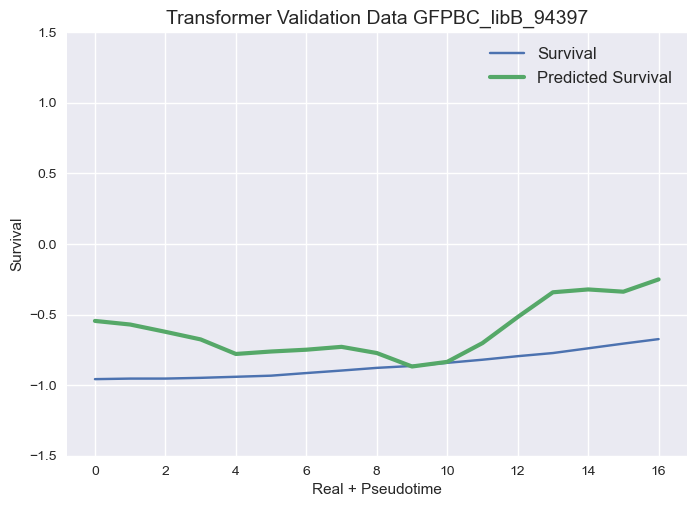

12/13 [==========================>...] - ETA: 0s - loss: 0.0075 - mean_squared_error: 0.0075(344, 8, 7 (17, 8, 72)


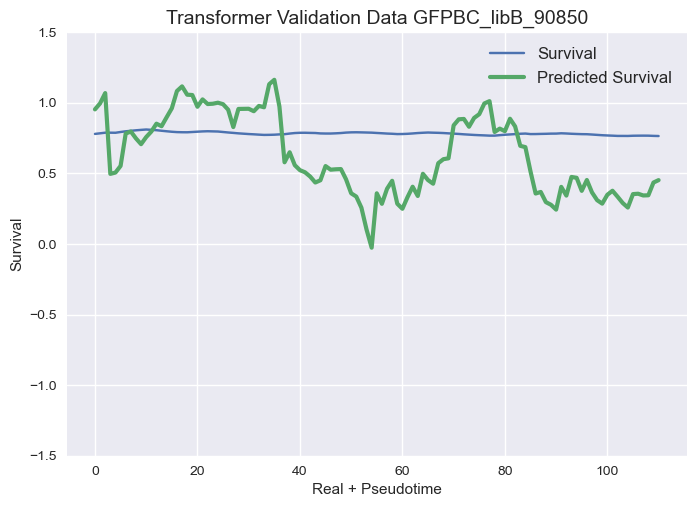

13/13 [==============================] - 0s 13ms/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.9017 - val_mean_squared_error: 0.9017
Epoch 20/20
49/49 [==============================] - 1s 11ms/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.2074 - val_mean_squared_error: 0.2074)  (1073
(119, 72)
Epoch 11/20
10/49 [=====>........................] - ETA: 0s - loss: 0.0060 - mean_squared_error: 0.0060 
Evaluation metrics Regr
15/15 [==============================] - 0s 14ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0372 - val_mean_squared_error: 0.0372
Regr Training Data - MSE: 0.0906
Regr Validation Data - MSE: 0.1902Epoch 5/20

1/1 [==============================] - 0s 55ms/steploss: 0.0057 - mean_squared_error: 0.00
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0028
Transformer Validation MSE - MSE: 0.1252
15/15 [==============================] - 0s 13ms/step - loss: 0.0201 - mean_squared_error: 0.0201 - val_los

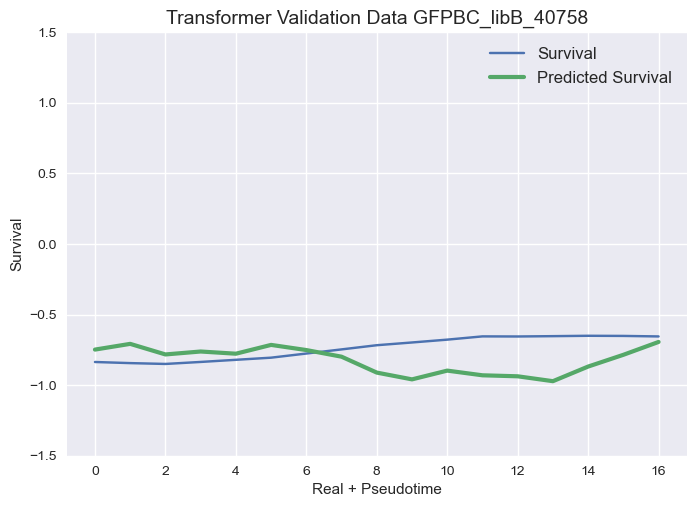

(342, 8, 72) (17, 8, 72)
49/49 [==============================] - 1s 10ms/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.2274 - val_mean_squared_error: 0.2274
Epoch 12/20
15/15 [==============================] - 0s 13ms/step - loss: 0.0206 - mean_squared_error: 0.0206 - val_loss: 0.0366 - val_mean_squared_error: 0.0366
Epoch 7/20
 1/11 [=>............................] - ETA: 1sTransformer Evaluation metrics

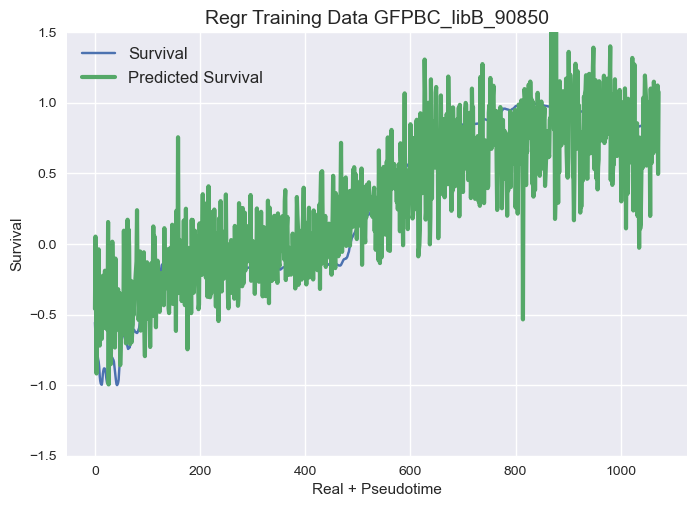


15/15 [==============================] - 0s 11ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.0320 - val_mean_squared_error: 0.0320

Transformer Validation MSE - MSE: 0.5043
Epoch 8/20
29/49 [================>.............] - ETA: 0s - loss: 0.0051 - mean_squared_error: 0.0051

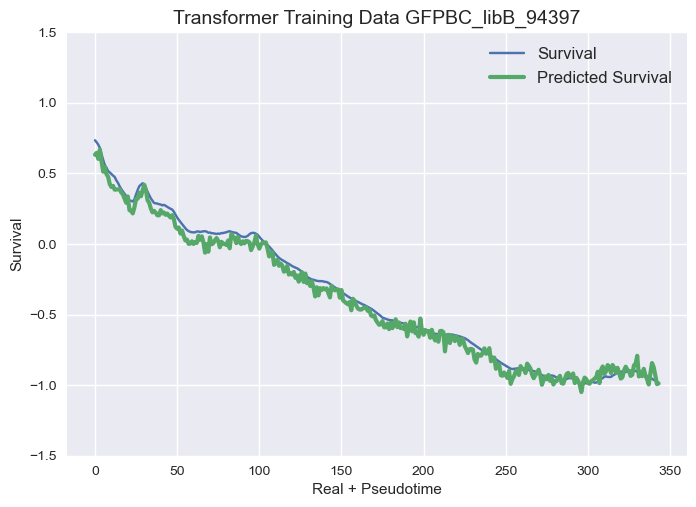

1/1 [==============================] - 0s 47ms/step
 
42/49 [========================>.....] - ETA: 0s - loss: 0.0051 - mean_squared_error: 0.0051
Transformer Validation MSE - MSE: 0.0149
15/15 [==============================] - 0s 11ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0308 - val_mean_squared_error: 0.0308
Epoch 9/20
49/49 [==============================] - 0s 9ms/step - loss: 0.0050 - mean_squared_error: 0.0050 - val_loss: 0.2311 - val_mean_squared_error: 0.2311
Epoch 13/20
15/15 [==============================] - 0s 11ms/step - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0349 - val_mean_squared_error: 0.0349
Epoch 10/20
14/49 [=======>......................] - ETA: 0s - loss: 0.0043 - mean_squared_error: 0.0043Epoch 1/20


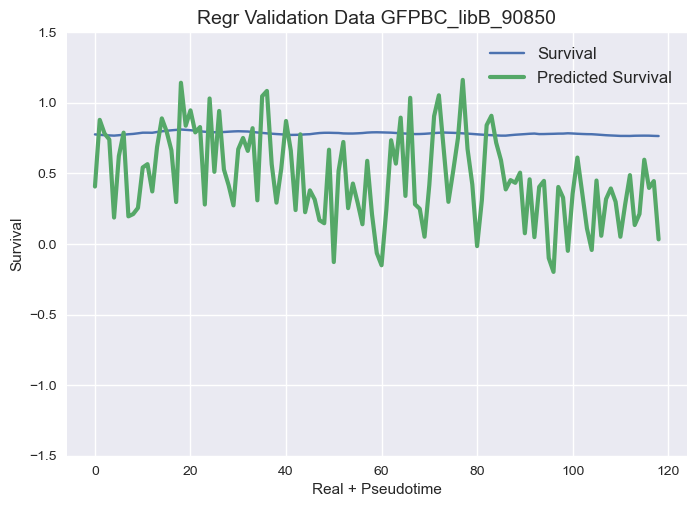

28/49 [================>.............] - ETA: 0s - loss: 0.0045 - mean_squared_error: 0.0045

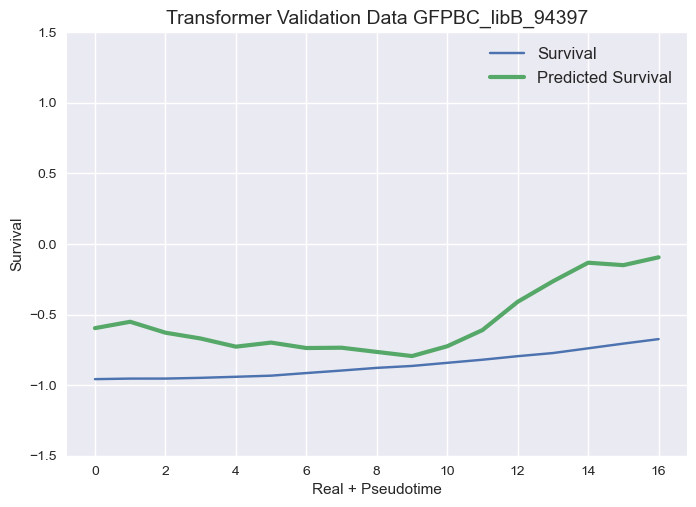

26/26 [==============================] - 2s 10ms/step - loss: 0.1704 - mean_squared_error: 0.1704 - val_loss: 0.2688 - val_mean_squared_error: 0.2688
Epoch 2/20
 1/26 [>.............................] - ETA: 0s - loss: 0.0928 - mean_squared_error: 0.0928

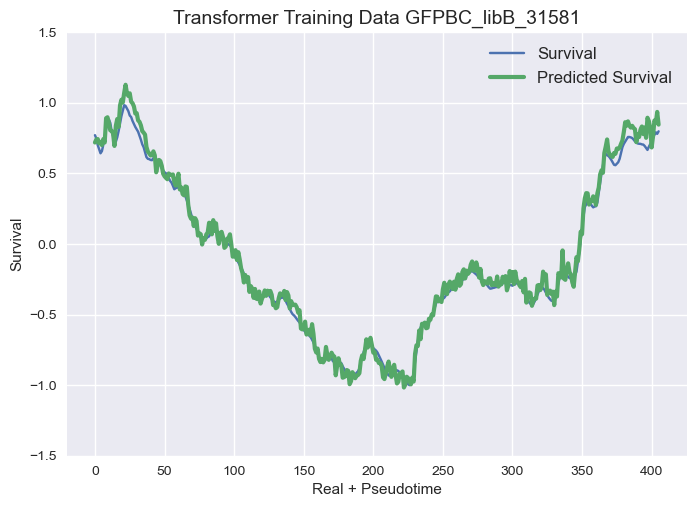

15/15 [==============================] - 0s 11ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0406 - val_mean_squared_error: 0.0406
Epoch 11/20
40/49 [=======================>......] - ETA: 0s - loss: 0.0048 - mean_squared_error: 0.0048 Evaluation metrics Regr


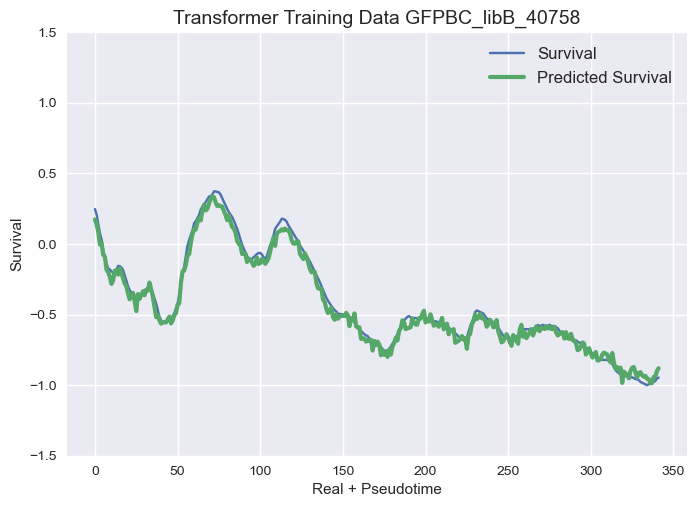

26/26 [==============================] - 0s 4ms/step - loss: 0.0659 - mean_squared_error: 0.0659 - val_loss: 0.2097 - val_mean_squared_error: 0.2097
Epoch 3/20

Regr Validation Data - MSE: 0.3142
15/15 [==============================] - 0s 17ms/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.0396 - val_mean_squared_error: 0.0396
Epoch 12/20
49/49 [==============================] - 1s 11ms/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.2073 - val_mean_squared_error: 0.2073
Epoch 14/20
 8/49 [===>..........................] - ETA: 0s - loss: 0.0057 - mean_squared_error: 0.0057Epoch 5/20


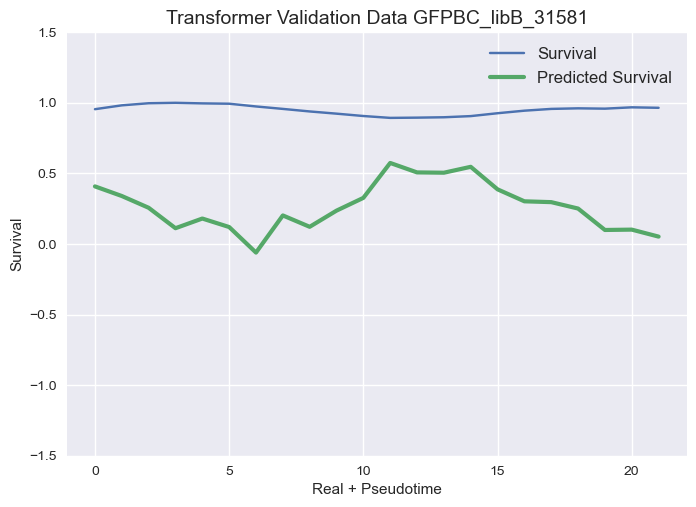

15/15 [==============================] - 0s 11ms/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.0345 - val_mean_squared_error: 0.0345
Epoch 13/20
15/15 [==============================] - 0s 11ms/step - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0347 - val_mean_squared_error: 0.0347
Epoch 14/20
26/26 [==============================] - 0s 5ms/step - loss: 0.0487 - mean_squared_error: 0.0487 - val_loss: 0.1943 - val_mean_squared_error: 0.1943


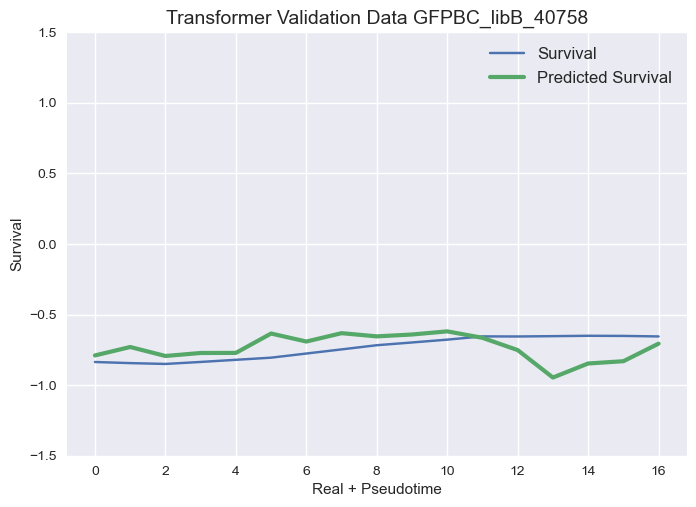

Epoch 7/20
1/1 [==============================] - 0s 34ms/steploss: 0.0048 - mean_squared_error: 0.0048Regr Training/Val set shapes (varies depending on barc
(350, 72) (25, 72)
26/26 [==============================] - 0s 4ms/step - loss: 0.0447 - mean_squared_error: 0.0447 - val_loss: 0.1732 - val_mean_squared_error: 0.1732
Epoch 8/20
 
 1/26 [>.............................] - ETA: 0s - loss: 0.0498 - mean_squared_error: 0.0498
Regr Training Data - MSE: 0.0572
Regr Validation Data - MSE: 0.0470
Transformer Training MSE - MSE: 0.0307
Transformer Validation MSE - MSE: 1.0867
15/15 [==============================] - 0s 13ms/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0374 - val_mean_squared_error: 0.0374
Epoch 15/20
49/49 [==============================] - 1s 13ms/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.2183 - val_mean_squared_error: 0.2183
Epoch 15/20
15/15 [==============================] - 0s 13ms/step - loss: 0.0054 - mean_squared_error: 0.005

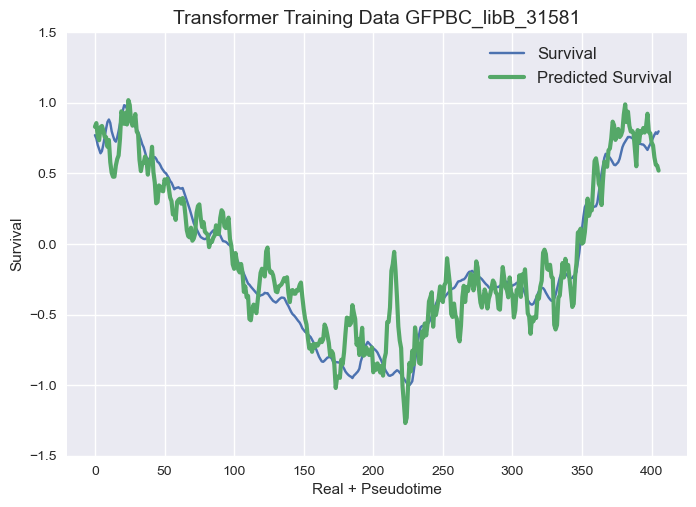

26/26 [==============================] - 0s 5ms/step - loss: 0.0399 - mean_squared_error: 0.0399 - val_loss: 0.1670 - val_mean_squared_error: 0.1670
Epoch 1/20
Epoch 11/20


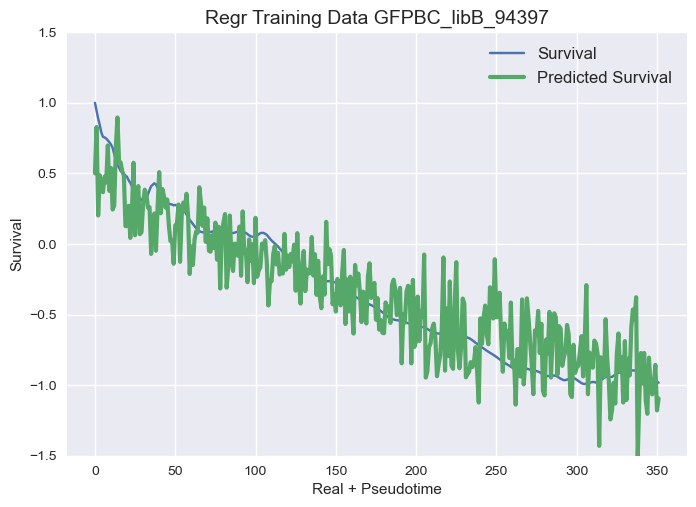

15/15 [==============================] - 0s 14ms/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0447 - val_mean_squared_error: 0.0447
Epoch 18/20
49/49 [==============================] - 1s 11ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.2443 - val_mean_squared_error: 0.2443
Epoch 16/20
Epoch 12/20
15/15 [==============================] - 0s 11ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0434 - val_mean_squared_error: 0.0434
Epoch 19/20
26/26 [==============================] - 0s 4ms/step - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.1558 - val_mean_squared_error: 0.1558
Epoch 13/20
 7/15 [=============>................] - ETA: 0s - loss: 0.0052 - mean_squared_error: 0.0052

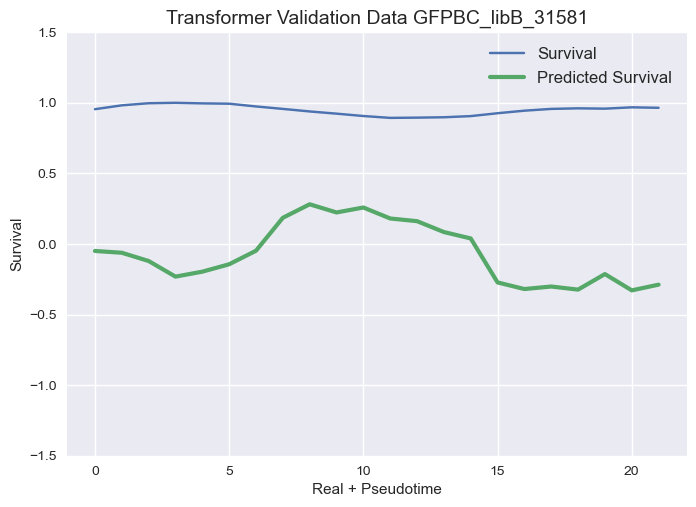

26/26 [==============================] - 0s 5ms/step - loss: 0.0354 - mean_squared_error: 0.0354 - val_loss: 0.1762 - val_mean_squared_error: 0.1762
Epoch 14/20
34/49 [===================>..........] - ETA: 0s - loss: 0.0034 - mean_squared_error: 0.0034Epoch 20/20


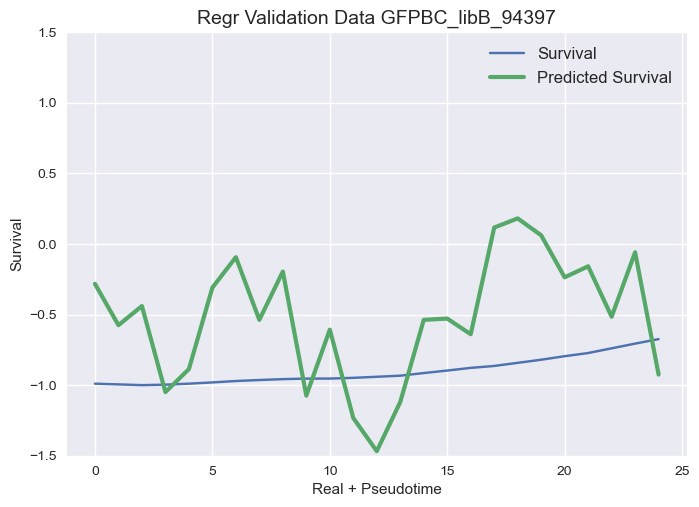

44/44 [==============================] - 3s 18ms/step - loss: 0.0609 - mean_squared_error: 0.0609 - val_loss: 0.0545 - val_mean_squared_error: 0.0545
Epoch 2/20
 1/44 [..............................] - ETA: 1s - loss: 0.0127 - mean_squared_error: 0.0127

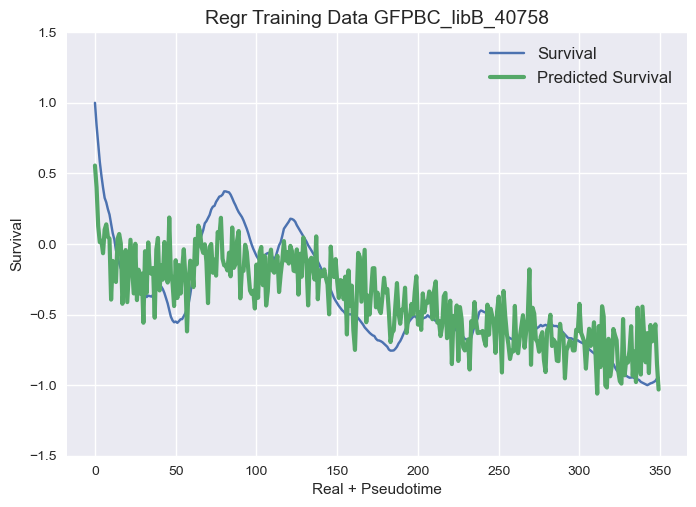

26/26 [==============================] - 0s 5ms/step - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.1328 - val_mean_squared_error: 0.1328
Epoch 16/20
49/49 [==============================] - 1s 10ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.1861 - val_mean_squared_error: 0.1861
Epoch 17/20
 7/49 [===>..........................] - ETA: 0s - loss: 0.0047 - mean_squared_error: 0.0047
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0031
26/26 [==============================] - 0s 5ms/step - loss: 0.0326 - mean_squared_error: 0.0326 - val_loss: 0.1428 - val_mean_squared_error: 0.1428
Epoch 17/20
27/49 [===============>..............] - ETA: 0s - loss: 0.0040 - mean_squared_error: 0.0040

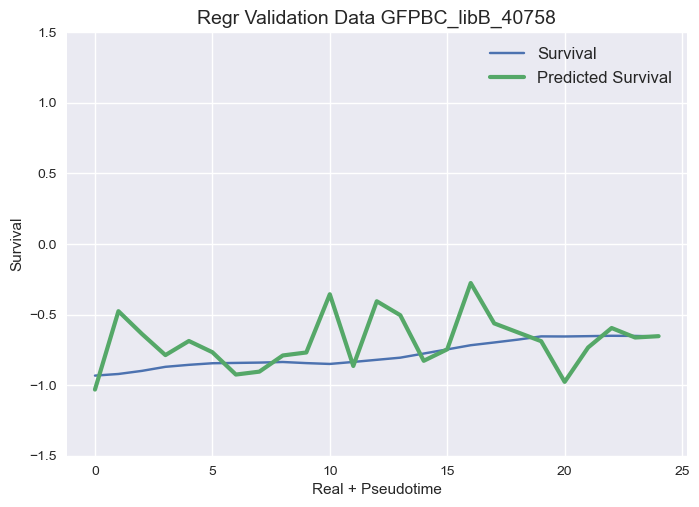

44/44 [==============================] - 1s 12ms/step - loss: 0.0290 - mean_squared_error: 0.0290 - val_loss: 0.0311 - val_mean_squared_error: 0.0311
 (468, 8, 72)Epoch 3/20
15/15 [==============================] - 0s 5ms/steposs: 0.0539 - mean_squared_error: 0.05

1/1 [==============================] - 0s 42ms/step
 Epoch 19/20
49/49 [==============================] - 1s 11ms/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.1590 - val_mean_squared_error: 0.1590
Epoch 18/20
Transformer Training MSE - MSE: 0.0017
18/26 [===================>..........] - ETA: 0s - loss: 0.0296 - mean_squared_error: 0.0296Transformer Validation MSE - MSE: 0.0402


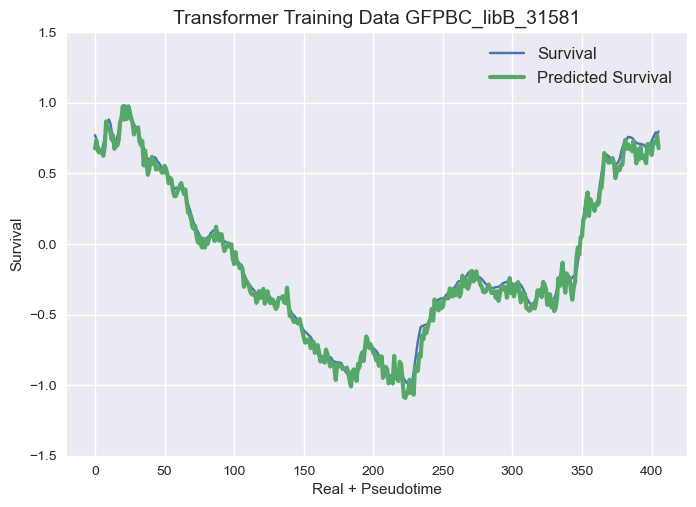

9/9 [==============================] - 0s 19ms/step - loss: 0.1557 - mean_squared_error: 0.1557 - val_loss: 0.0103 - val_mean_squared_error: 0.0103
Epoch 3/20
9/9 [==============================] - 0s 19ms/step - loss: 0.1090 - mean_squared_error: 0.1090 - val_loss: 0.1119 - val_mean_squared_error: 0.1119
Epoch 4/20
9/9 [==============================] - 0s 15ms/step - loss: 0.0833 - mean_squared_error: 0.0833 - val_loss: 0.0144 - val_mean_squared_error: 0.0144
Epoch 4/20
Epoch 5/20
48/48 [==============================] - 3s 17ms/step - loss: 0.0401 - mean_squared_error: 0.0401 - val_loss: 0.1209 - val_mean_squared_error: 0.1209
Epoch 2/20


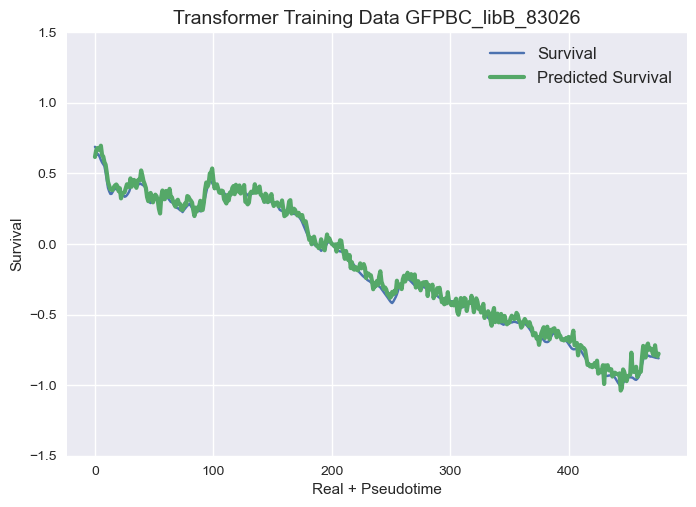

 1/48 [..............................] - ETA: 0s - loss: 0.0200 - mean_squared_error: 0.0200

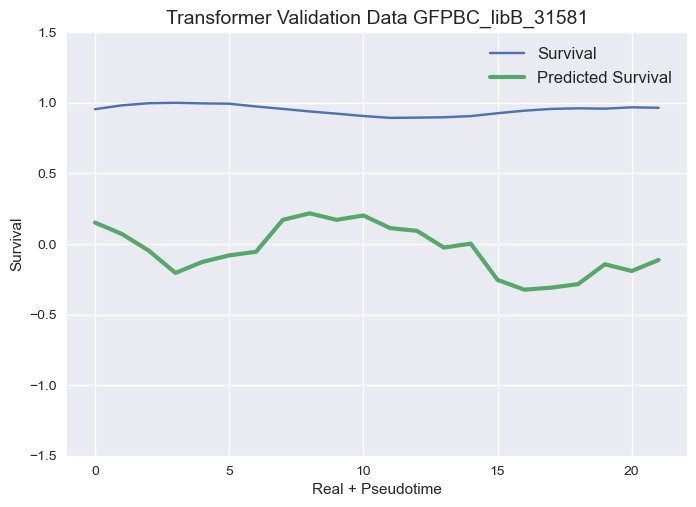

9/9 [==============================] - 0s 16ms/step - loss: 0.0566 - mean_squared_error: 0.0566 - val_loss: 0.0781 - val_mean_squared_error: 0.0781
Epoch 6/20
(30, 72)
27/44 [=================>............] - ETA: 0s - loss: 0.0165 - mean_squared_error: 0.0165
Evaluation metrics Regr
44/44 [==============================] - 1s 14ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.0592 - val_mean_squared_error: 0.0592
Epoch 5/20
Epoch 1/20
9/9 [==============================] - 0s 24ms/step - loss: 0.0253 - mean_squared_error: 0.0253 - val_loss: 0.0251 - val_mean_squared_error: 0.0251
Epoch 8/20
1/9 [==>...........................] - ETA: 0s - loss: 0.0211 - mean_squared_error: 0.021190

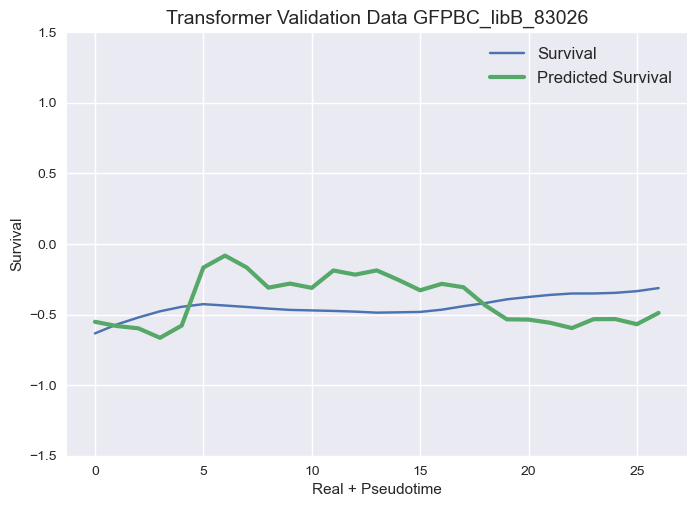

13/44 [=======>......................] - ETA: 0s - loss: 0.0082 - mean_squared_error: 0.0082Epoch 9/20


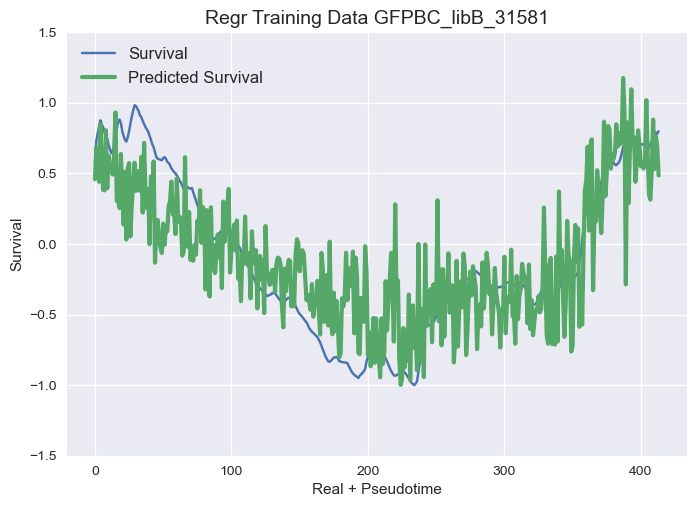

9/9 [==============================] - 0s 19ms/step - loss: 0.0155 - mean_squared_error: 0.0155 - val_loss: 0.0236 - val_mean_squared_error: 0.0236
Epoch 11/20

44/44 [==============================] - 1s 13ms/step - loss: 0.0091 - mean_squared_error: 0.0091 - val_loss: 0.0469 - val_mean_squared_error: 0.0469


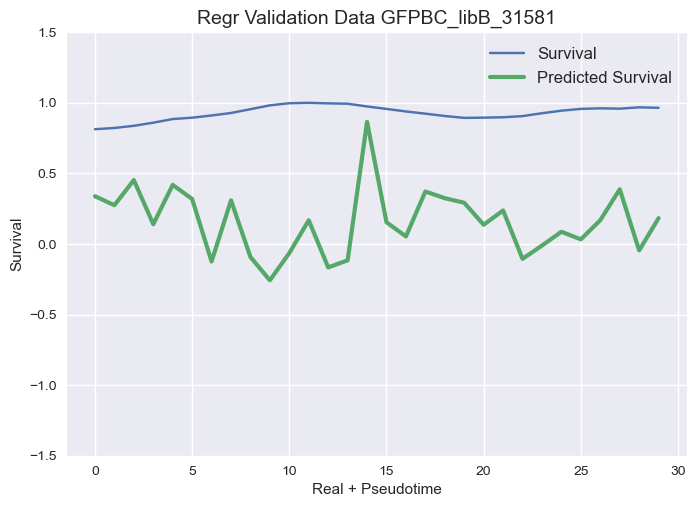

9/9 [==============================] - 0s 15ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0131 - val_mean_squared_error: 0.0131
Epoch 12/20
48/48 [==============================] - 1s 14ms/step - loss: 0.0227 - mean_squared_error: 0.0227 - val_loss: 0.0655 - val_mean_squared_error: 0.0655
Epoch 4/20
52/52 [==============================] - 3s 17ms/step - loss: 0.1474 - mean_squared_error: 0.1474 - val_loss: 0.1268 - val_mean_squared_error: 0.1268
Epoch 2/20
49/49 [==============================] - 1s 11ms/step - loss: 0.0032 - mean_squared_error: 0.0032 - val_loss: 0.2364 - val_mean_squared_error: 0.2364
Epoch 13/20


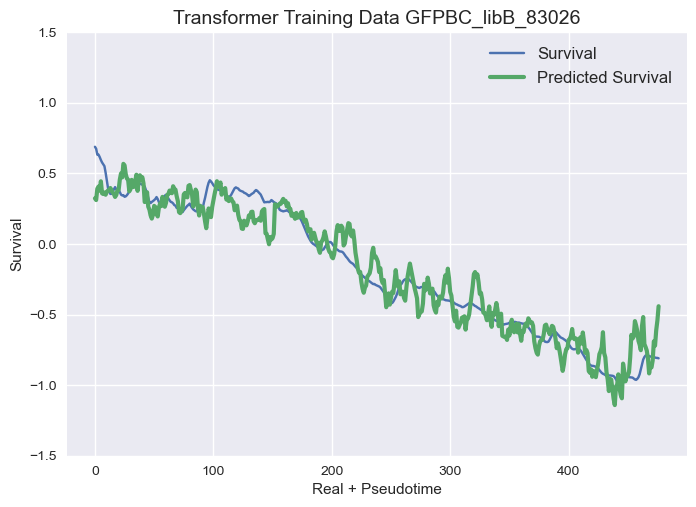

44/44 [==============================] - 1s 12ms/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0581 - val_mean_squared_error: 0.0581
Epoch 7/20
9/9 [==============================] - 0s 17ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0257 - val_mean_squared_error: 0.0257n barcode)(554, 8
Epoch 15/20
42/52 [=======================>......] - ETA: 0s - loss: 0.0538 - mean_squared_error: 0.0538(22, 8, 72)


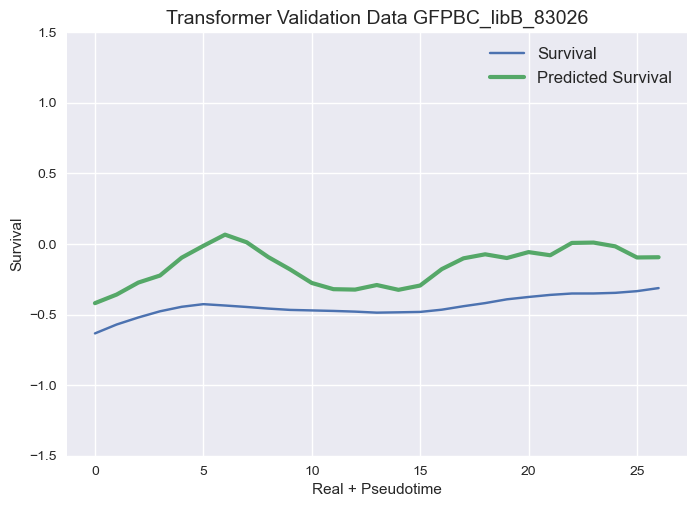

48/48 [==============================] - 1s 13ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.0737 - val_mean_squared_error: 0.0737
Epoch 5/20
52/52 [==============================] - 1s 12ms/step - loss: 0.0531 - mean_squared_error: 0.0531 - val_loss: 0.1340 - val_mean_squared_error: 0.1340
Epoch 3/20
44/44 [==============================] - 1s 13ms/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0400 - val_mean_squared_error: 0.0400
Epoch 8/20
9/9 [==============================] - 0s 14ms/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.0313 - val_mean_squared_error: 0.0313

Epoch 17/20
22/52 [===========>..................] - ETA: 0s - loss: 0.0385 - mean_squared_error: 0.0385

44/44 [==============================] - 1s 12ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0318 - val_mean_squared_error: 0.0318
Epoch 9/20
 6/15 [===========>..................] - ETA: 0s - loss: 0.1385 - mean_squared_error: 0.1385Epoch 20/

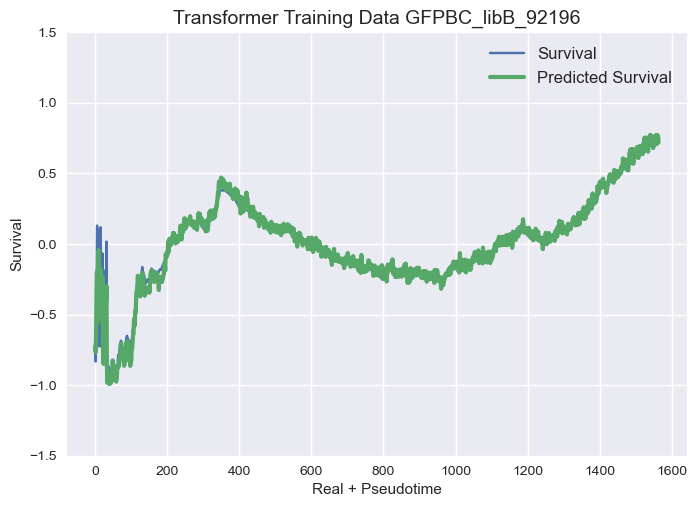

11/44 [======>.......................] - ETA: 0s - loss: 0.0036 - mean_squared_error: 0.0036

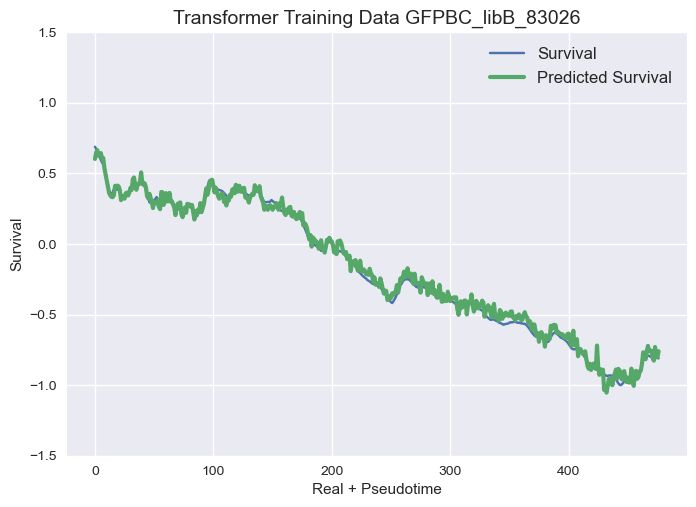

26/26 [==============================] - 2s 22ms/step - loss: 0.1176 - mean_squared_error: 0.1176 - val_loss: 0.2521 - val_mean_squared_error: 0.2521
Epoch 2/20
41/52 [======================>.......] - ETA: 0s - loss: 0.0243 - mean_squared_error: 0.0243

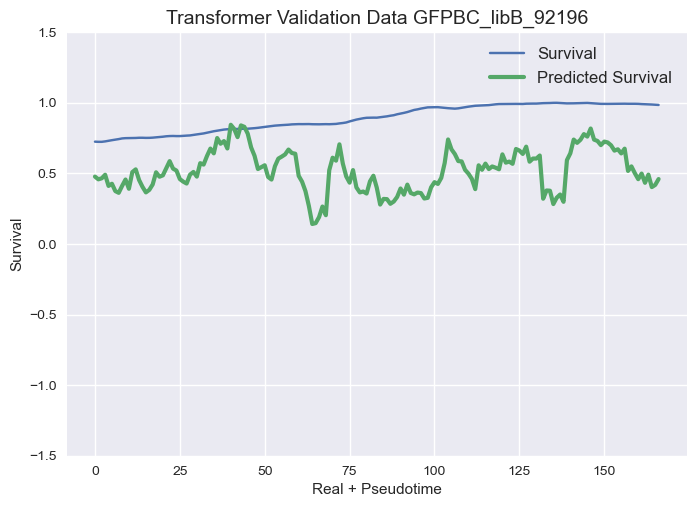

26/26 [==============================] - 0s 13ms/step - loss: 0.0544 - mean_squared_error: 0.0544 - val_loss: 0.2873 - val_mean_squared_error: 0.2873
 (167, 8, 72)
44/44 [==============================] - 1s 13ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0392 - val_mean_squared_error: 0.0392


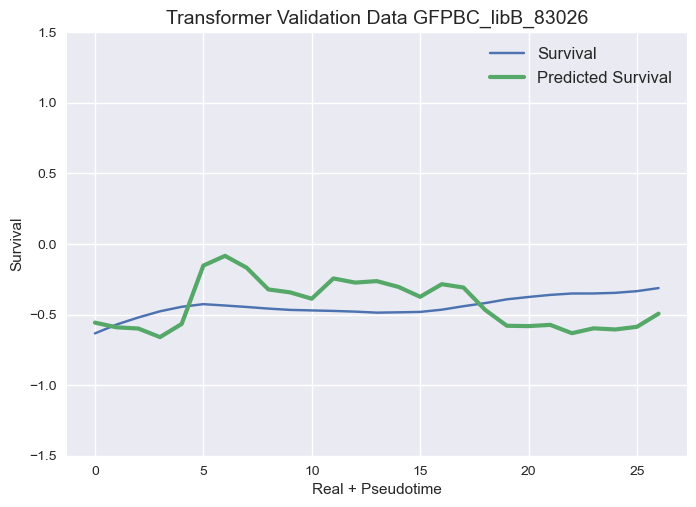

Epoch 10/20
Epoch 3/20
15/15 [==============================] - 3s 32ms/step - loss: 0.2350 - mean_squared_error: 0.2350 - val_loss: 1.4134 - val_mean_squared_error: 1.4134
Epoch 2/20
Regr Training/Val set shapes (varies depending on barcode) Epoch 7/20
15/15 [==============================] - 0s 20ms/step - loss: 0.0818 - mean_squared_error: 0.0818 - val_loss: 1.5147 - val_mean_squared_error: 1.5147
Epoch 4/20
52/52 [==============================] - 1s 13ms/step - loss: 0.0235 - mean_squared_error: 0.0235 - val_loss: 0.1195 - val_mean_squared_error: 0.1195
Epoch 5/20
15/15 [==============================] - 0s 20ms/step - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 1.5817 - val_mean_squared_error: 1.5817
Epoch 5/20
26/26 [==============================] - 0s 14ms/step - loss: 0.0372 - mean_squared_error: 0.0372 - val_loss: 0.1891 - val_mean_squared_error: 0.1891
Epoch 4/20
32/52 [=================>............] - ETA: 0s - loss: 0.0159 - mean_squared_error: 0.0159Epoch 6/20

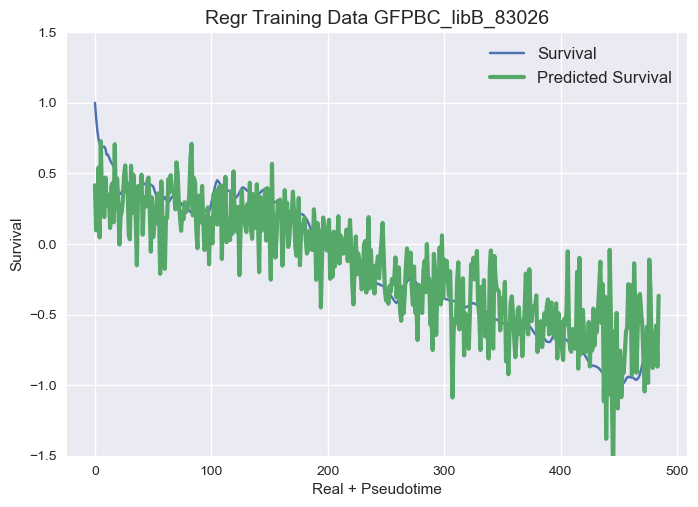

48/48 [==============================] - 1s 16ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0575 - val_mean_squared_error: 0.0575
Epoch 5/20
15/15 [==============================] - 0s 24ms/step - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 1.0436 - val_mean_squared_error: 1.0436
Epoch 7/20
26/26 [==============================] - 0s 13ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.1300 - val_mean_squared_error: 0.1300
Epoch 6/20
Epoch 6/20
 1/26 [>.............................] - ETA: 0s - loss: 0.0097 - mean_squared_error: 0.0097

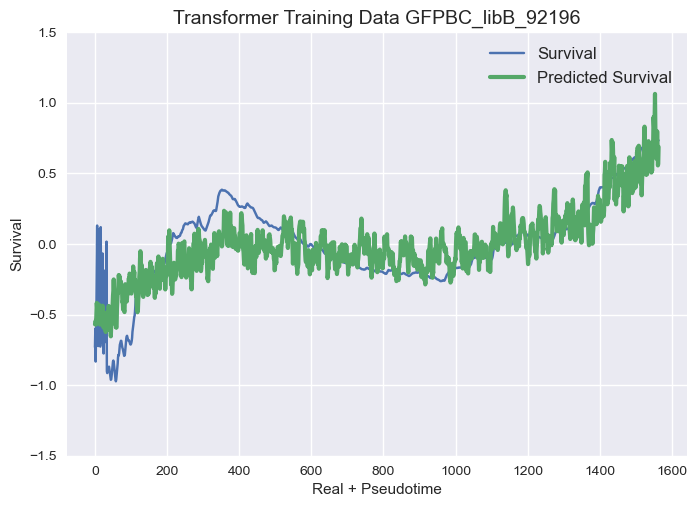

26/44 [================>.............] - ETA: 0s - loss: 0.0043 - mean_squared_error: 0.0043

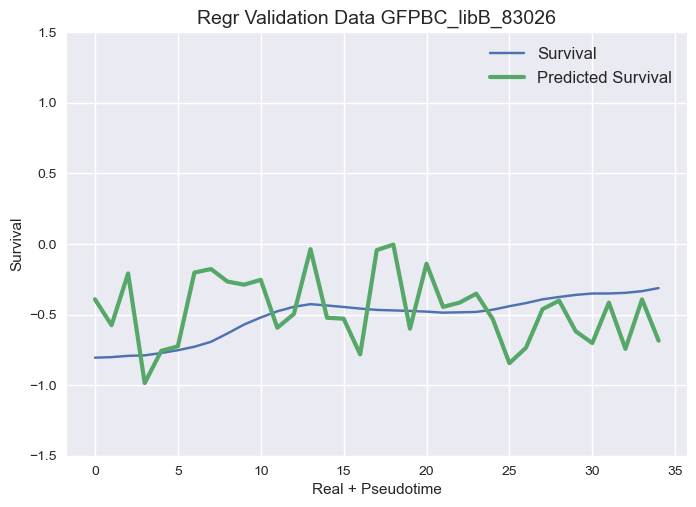

15/15 [==============================] - 0s 15ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 1.3723 - val_mean_squared_error: 1.3723barcode)
Epoch 8/20
15/15 [==============================] - 0s 21ms/step - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 1.0855 - val_mean_squared_error: 1.0855
Epoch 7/20
26/26 [==============================] - 0s 16ms/step - loss: 0.0117 - mean_squared_error: 0.0117 - val_loss: 0.1467 - val_mean_squared_error: 0.1467
Epoch 7/20
49/52 [===========================>..] - ETA: 0s - loss: 0.0132 - mean_squared_error: 0.0132

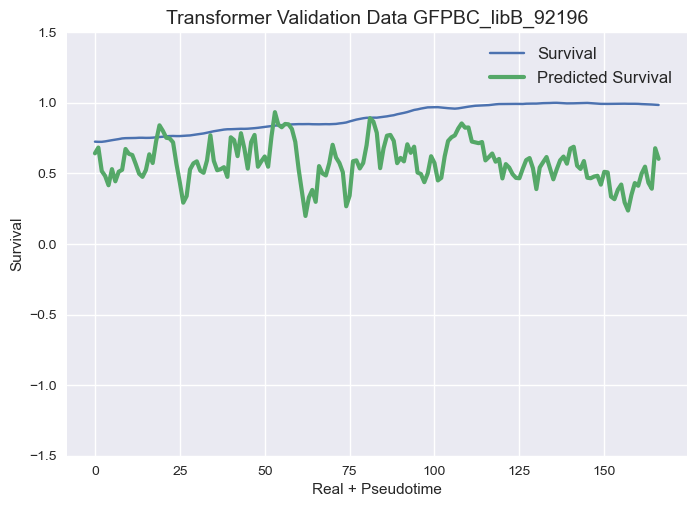

52/52 [==============================] - 1s 14ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.0934 - val_mean_squared_error: 0.0934
Epoch 7/20
15/15 [==============================] - 0s 16ms/step - loss: 0.0152 - mean_squared_error: 0.0152 - val_loss: 1.1051 - val_mean_squared_error: 1.1051
Epoch 8/20
15/15 [==============================] - 0s 18ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 1.4932 - val_mean_squared_error: 1.4932
Epoch 10/20
15/15 [==============================] - 0s 16ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 1.0469 - val_mean_squared_error: 1.0469
Epoch 9/20
9/9 [==============================] - 0s 7ms/step - loss: 0.3020 - mean_squared_error: 0.3020 - val_loss: 0.5977 - val_mean_squared_error: 0.5977
Epoch 8/20
9/9 [==============================] - 0s 9ms/step - loss: 0.2902 - mean_squared_error: 0.2902 - val_loss: 0.6423 - val_mean_squared_error: 0.6423
Epoch 4/20
44/44 [==============================] 

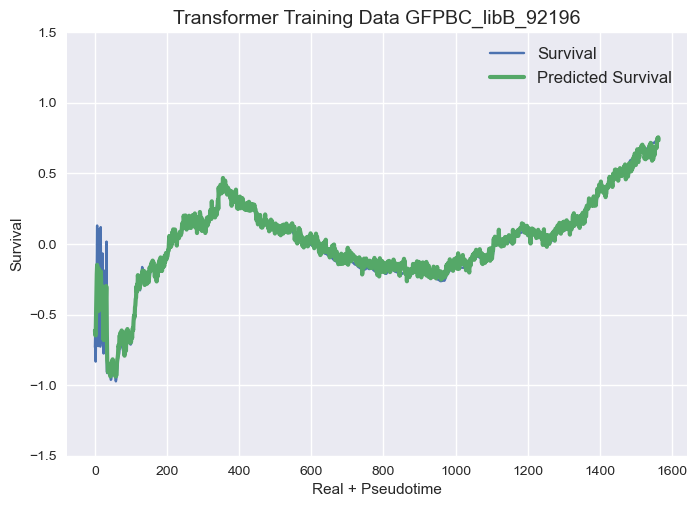

9/9 [==============================] - 0s 16ms/step - loss: 0.1224 - mean_squared_error: 0.1224 - val_loss: 0.0510 - val_mean_squared_error: 0.0510
Epoch 11/20
Epoch 11/20
9/9 [==============================] - 0s 13ms/step - loss: 0.1078 - mean_squared_error: 0.1078 - val_loss: 0.0315 - val_mean_squared_error: 0.0315
Epoch 12/20
52/52 [==============================] - 1s 13ms/step - loss: 0.0103 - mean_squared_error: 0.0103 - val_loss: 0.0880 - val_mean_squared_error: 0.0880
Epoch 9/20
15/18 [========================>.....] - ETA: 0s - loss: 0.1551 - mean_squared_error: 0.1551Epoch 11/20
Epoch 13/20
15/15 [==============================] - 0s 21ms/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 1.1188 - val_mean_squared_error: 1.1188
Epoch 13/20
18/18 [==============================] - 0s 14ms/step - loss: 0.1543 - mean_squared_error: 0.1543 - val_loss: 0.4805 - val_mean_squared_error: 0.4805
Epoch 4/20
35/48 [====================>.........] - ETA: 0s - loss: 0.0036 - me

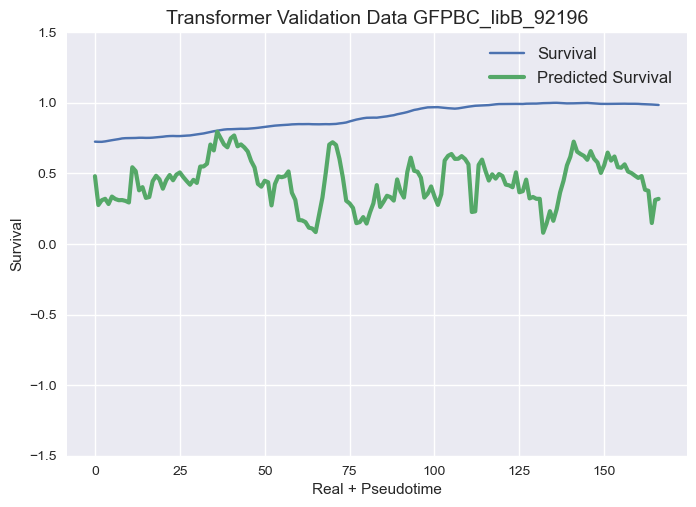

Epoch 15/20
Epoch 1/20
15/15 [==============================] - 0s 19ms/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.9636 - val_mean_squared_error: 0.9636
Epoch 14/20
26/26 [==============================] - 0s 14ms/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.1798 - val_mean_squared_error: 0.1798
Epoch 15/20
18/18 [==============================] - 0s 17ms/step - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.2812 - val_mean_squared_error: 0.2812
Epoch 5/20
48/48 [==============================] - 1s 15ms/step - loss: 0.0035 - mean_squared_error: 0.0035 - val_loss: 0.0775 - val_mean_squared_error: 0.0775
Epoch 12/20
9/9 [==============================] - 0s 22ms/step - loss: 0.0998 - mean_squared_error: 0.0998 - val_loss: 0.0261 - val_mean_squared_error: 0.0261
Epoch 17/20
9/9 [==============================] - 0s 14ms/step - loss: 0.0979 - mean_squared_error: 0.0979 - val_loss: 0.0382 - val_mean_squared_error: 0.0382
 
Evaluation metrics R

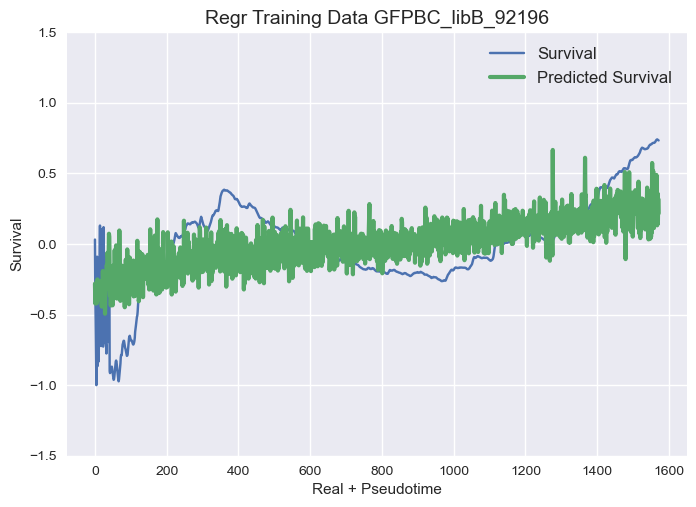

Epoch 14/20
15/15 [==============================] - 0s 16ms/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.9680 - val_mean_squared_error: 0.9680
Epoch 18/20
18/18 [==============================] - 0s 15ms/step - loss: 0.0245 - mean_squared_error: 0.0245 - val_loss: 0.1792 - val_mean_squared_error: 0.1792
Epoch 8/20
52/52 [==============================] - 1s 14ms/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0920 - val_mean_squared_error: 0.0920
Epoch 11/20
15/15 [==============================] - 0s 17ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 1.6862 - val_mean_squared_error: 1.6862
Epoch 20/20
15/15 [==============================] - 0s 18ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 1.1412 - val_mean_squared_error: 1.1412
Epoch 19/20
18/18 [==============================] - 0s 19ms/step - loss: 0.0260 - mean_squared_error: 0.0260 - val_loss: 0.1519 - val_mean_squared_error: 0.1519
Epoch 15/20


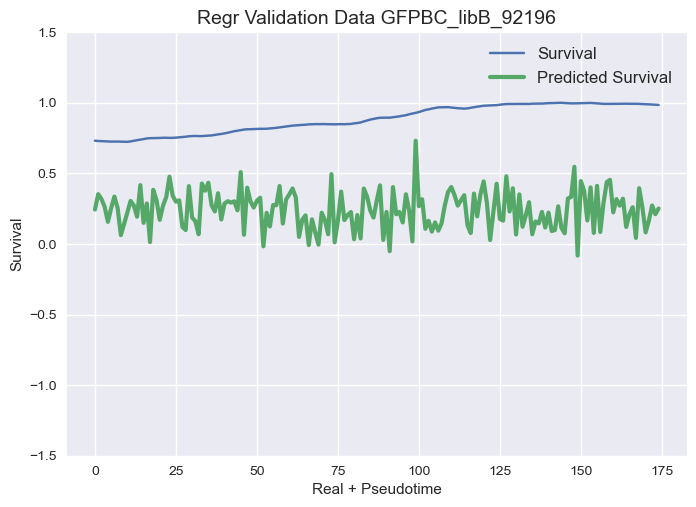

Epoch 9/20
44/44 [==============================] - 1s 16ms/step - loss: 0.0026 - mean_squared_error: 0.0026 - val_loss: 0.0418 - val_mean_squared_error: 0.0418
Epoch 17/20
18/18 [==============================] - 0s 15ms/step - loss: 0.0161 - mean_squared_error: 0.0161 - val_loss: 0.2668 - val_mean_squared_error: 0.2668
 (2438, 8, 72)Epoch 10/20
26/26 [==============================] - 0s 11ms/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.2398 - val_mean_squared_error: 0.2398
Epoch 16/20
52/52 [==============================] - 1s 14ms/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.1055 - val_mean_squared_error: 0.1055
Epoch 12/20
18/18 [==============================] - 0s 14ms/step - loss: 0.0146 - mean_squared_error: 0.0146 - val_loss: 0.1856 - val_mean_squared_error: 0.1856
Epoch 11/20
26/26 [==============================] - 0s 14ms/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.2133 - val_mean_squared_error: 0.2133
Epoch 17/20
44/

52/52 [==============================] - 1s 13ms/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0955 - val_mean_squared_error: 0.0955
Epoch 15/20
15/15 [==============================] - 0s 10ms/step - loss: 0.0926 - mean_squared_error: 0.0926 - val_loss: 2.0326 - val_mean_squared_error: 2.0326
Epoch 6/20
Epoch 4/20
18/18 [==============================] - 0s 15ms/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.2041 - val_mean_squared_error: 0.2041
Epoch 5/20
15/15 [==============================] - 0s 5ms/step - loss: 0.1019 - mean_squared_error: 0.1019 - val_loss: 1.9524 - val_mean_squared_error: 1.9524
Epoch 5/20
Epoch 7/20
9/9 [==============================] - 0s 17ms/step - loss: 0.0747 - mean_squared_error: 0.0747 - val_loss: 0.0139 - val_mean_squared_error: 0.0139
Epoch 5/20
Epoch 18/20
15/15 [==============================] - 0s 5ms/step - loss: 0.0818 - mean_squared_error: 0.0818 - val_loss: 2.0281 - val_mean_squared_error: 2.0281
Epoch 6/20
 6/

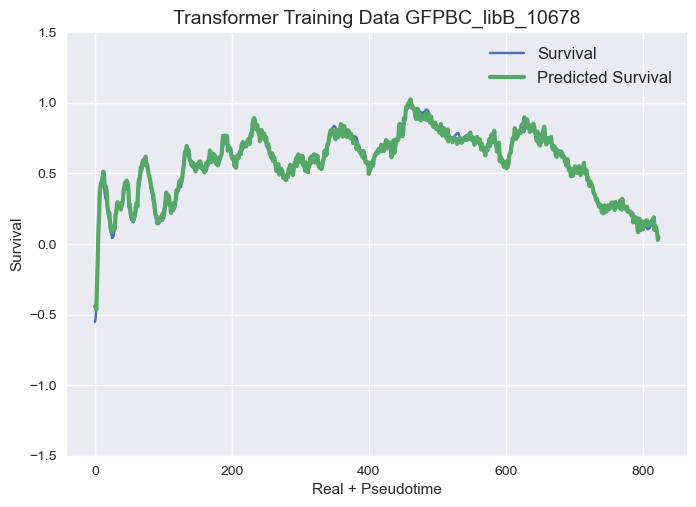

Epoch 10/20
21/21 [==============================] - 0s 12ms/step - loss: 0.0164 - mean_squared_error: 0.0164 - val_loss: 0.7212 - val_mean_squared_error: 0.7212
Epoch 7/20
18/18 [==============================] - 0s 16ms/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.2198 - val_mean_squared_error: 0.2198
Epoch 8/20
Epoch 20/20
9/9 [==============================] - 0s 17ms/step - loss: 0.0196 - mean_squared_error: 0.0196 - val_loss: 0.0166 - val_mean_squared_error: 0.0166
Epoch 9/20
15/15 [==============================] - 0s 5ms/step - loss: 0.0797 - mean_squared_error: 0.0797 - val_loss: 1.9244 - val_mean_squared_error: 1.9244
Epoch 12/20
48/48 [==============================] - 1s 13ms/step - loss: 0.0031 - mean_squared_error: 0.0031 - val_loss: 0.1029 - val_mean_squared_error: 0.1029
Epoch 8/20
Epoch 19/20
15/15 [==============================] - 0s 9ms/step - loss: 0.0715 - mean_squared_error: 0.0715 - val_loss: 1.8214 - val_mean_squared_error: 1.8214
Epoch 13/20


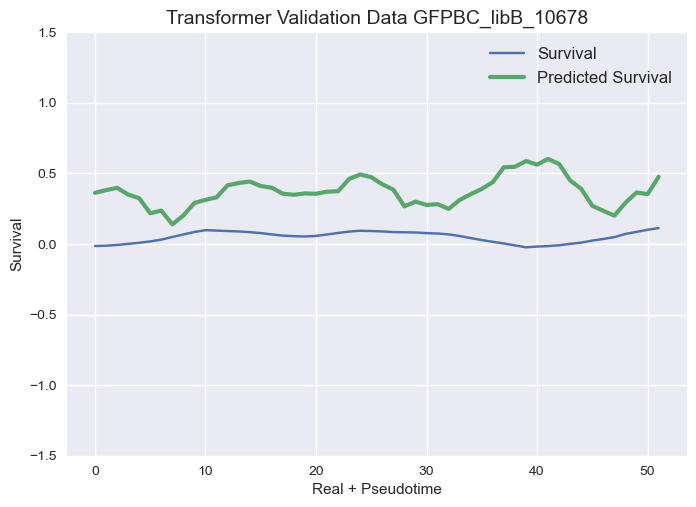

Epoch 10/20
21/21 [==============================] - 0s 12ms/step - loss: 0.0128 - mean_squared_error: 0.0128 - val_loss: 0.8110 - val_mean_squared_error: 0.8110
Epoch 15/20
9/9 [==============================] - 0s 17ms/step - loss: 0.0125 - mean_squared_error: 0.0125 - val_loss: 0.0168 - val_mean_squared_error: 0.0168
Epoch 9/20
9/9 [==============================] - 0s 14ms/step - loss: 0.0115 - mean_squared_error: 0.0115 - val_loss: 0.0161 - val_mean_squared_error: 0.0161
Epoch 12/20
2/2 [==============================] - 0s 4ms/step loss: 0.0028 - mean_squared_error: 0.00
Epoch 15/20
15/15 [==============================] - 0s 5ms/step - loss: 0.0814 - mean_squared_error: 0.0814 - val_loss: 1.8627 - val_mean_squared_error: 1.8627
Transformer Training MSE - MSE: 0.0225Epoch 17/20

9/9 [==============================] - 0s 18ms/step - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0370 - val_mean_squared_error: 0.0370
Epoch 13/20
Epoch 18/20
15/15 [=========================

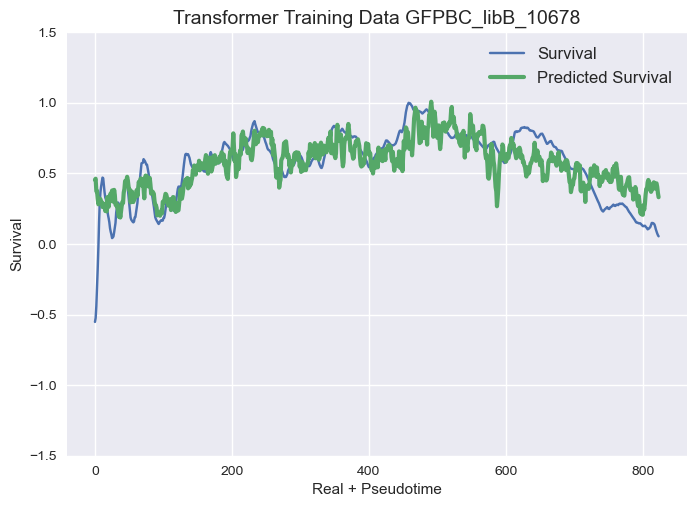

15/15 [==============================] - 0s 7ms/step - loss: 0.0554 - mean_squared_error: 0.0554 - val_loss: 1.6714 - val_mean_squared_error: 1.6714
Epoch 19/20
52/52 [==============================] - 1s 15ms/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.1101 - val_mean_squared_error: 0.1101
Epoch 18/20
21/21 [==============================] - 0s 16ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.8315 - val_mean_squared_error: 0.8315
Epoch 12/20
Epoch 17/20
14/52 [=======>......................] - ETA: 0s - loss: 0.0042 - mean_squared_error: 0.0042

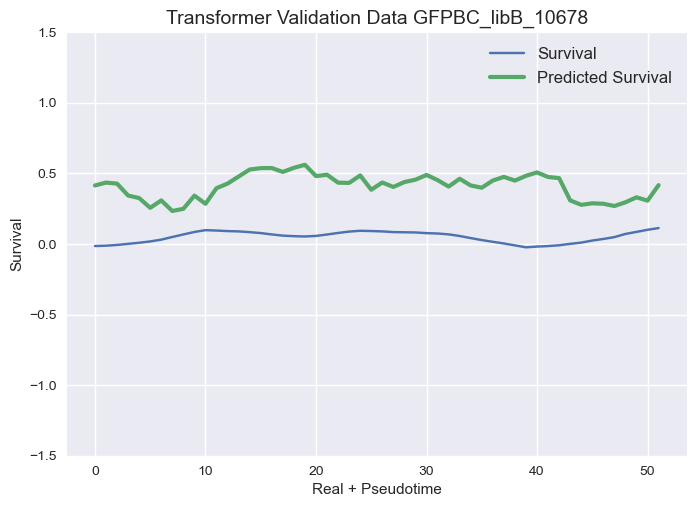

19/52 [=========>....................] - ETA: 0s - loss: 0.0040 - mean_squared_error: 0.0040Epoch 2/20
(52, 8, 72)
77/77 [==============================] - 3s 15ms/step - loss: 0.0984 - mean_squared_error: 0.0984 - val_loss: 0.1476 - val_mean_squared_error: 0.1476
Epoch 2/20
9/9 [==============================] - 0s 15ms/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0288 - val_mean_squared_error: 0.0288
Epoch 19/20
Epoch 13/20
44/44 [==============================] - 0s 5ms/step - loss: 0.0624 - mean_squared_error: 0.0624 - val_loss: 0.0764 - val_mean_squared_error: 0.0764
Epoch 3/20
9/9 [==============================] - 0s 23ms/step - loss: 0.0083 - mean_squared_error: 0.0083 - val_loss: 0.0248 - val_mean_squared_error: 0.0248
Epoch 20/20
52/52 [==============================] - 1s 12ms/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0752 - val_mean_squared_error: 0.0752
Epoch 19/20
2/2 [==============================] - 0s 27ms/stepss: 0.0084 - mean_s

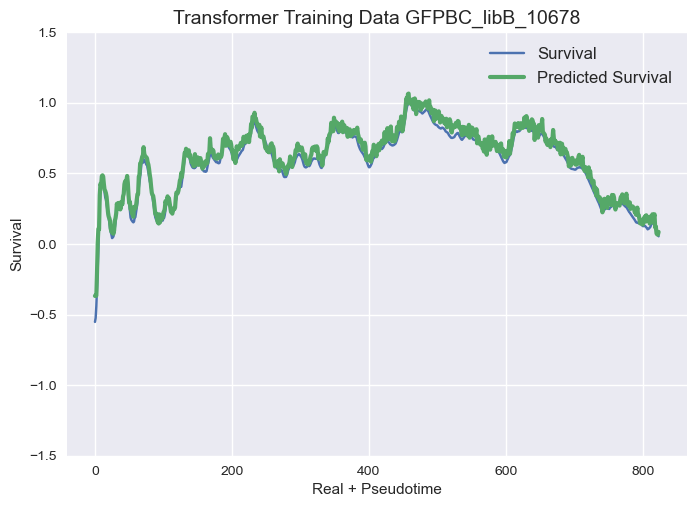

18/18 [==============================] - 2s 19ms/step - loss: 0.2945 - mean_squared_error: 0.2945 - val_loss: 0.6977 - val_mean_squared_error: 0.6977
Epoch 2/20
 7/77 [=>............................] - ETA: 0s - loss: 0.0315 - mean_squared_error: 0.0315Transformer Training MSE - MSE: 0.00
Transformer Validation MSE - MSE: 0.0248
52/52 [==============================] - 1s 11ms/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.1085 - val_mean_squared_error: 0.1085
Epoch 20/20
18/18 [==============================] - 0s 6ms/step - loss: 0.2898 - mean_squared_error: 0.2898 - val_loss: 0.6551 - val_mean_squared_error: 0.6551
Epoch 3/20
44/44 [==============================] - 0s 5ms/step - loss: 0.0351 - mean_squared_error: 0.0351 - val_loss: 0.0326 - val_mean_squared_error: 0.0326
Epoch 7/20
21/21 [==============================] - 0s 11ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.8792 - val_mean_squared_error: 0.8792
Epoch 16/20
44/44 [==================

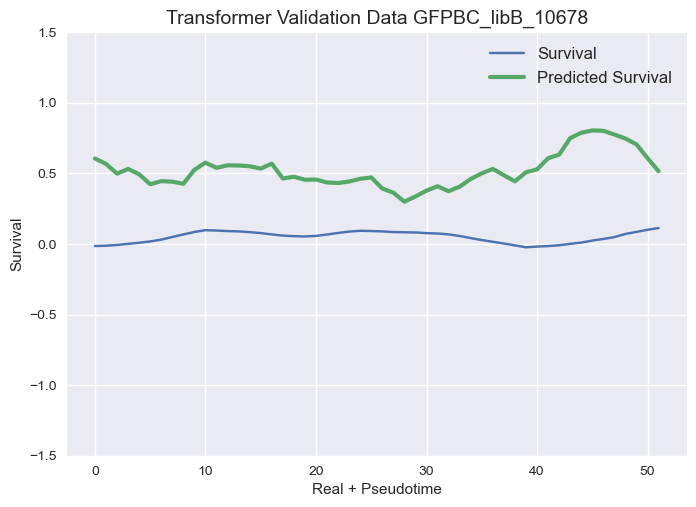

21/21 [==============================] - 0s 14ms/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.9645 - val_mean_squared_error: 0.9645
Epoch 17/20
18/18 [==============================] - 0s 6ms/step - loss: 0.1680 - mean_squared_error: 0.1680 - val_loss: 0.2642 - val_mean_squared_error: 0.2642
Epoch 6/20
38/52 [====================>.........] - ETA: 0s - loss: 0.0051 - mean_squared_error: 0.0051

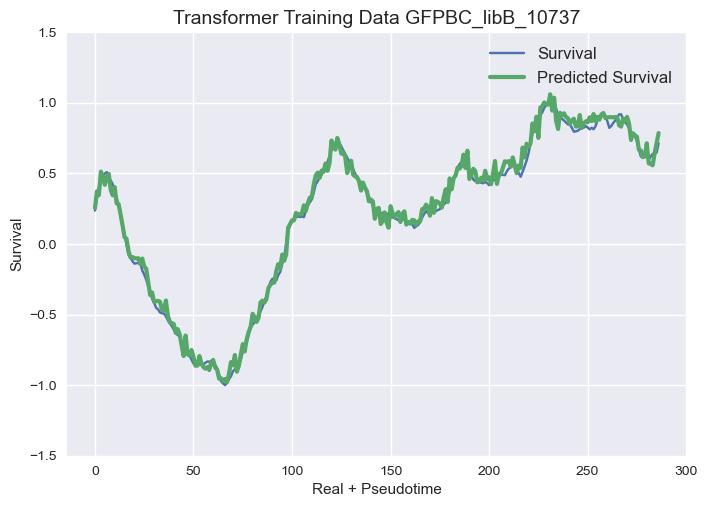

44/44 [==============================] - 0s 4ms/step - loss: 0.0327 - mean_squared_error: 0.0327 - val_loss: 0.0293 - val_mean_squared_error: 0.0293
Epoch 9/20
18/18 [==============================] - 0s 6ms/step - loss: 0.1171 - mean_squared_error: 0.1171 - val_loss: 0.3612 - val_mean_squared_error: 0.3612
Epoch 8/20
44/44 [==============================] - 0s 5ms/step - loss: 0.0325 - mean_squared_error: 0.0325 - val_loss: 0.0120 - val_mean_squared_error: 0.0120
Epoch 10/20
21/21 [==============================] - 0s 19ms/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.8233 - val_mean_squared_error: 0.8233
Epoch 18/20
 6/18 [=========>....................] - ETA: 0s - loss: 0.1024 - mean_squared_error: 0.1024 
Evaluation metrics Regr
18/44 [===========>..................] - ETA: 0s - loss: 0.0248 - mean_squared_error: 0.0248
Regr Validation Data - MSE: 0.3153
18/18 [==============================] - 0s 8ms/step - loss: 0.0910 - mean_squared_error: 0.0910 - val_loss: 0.

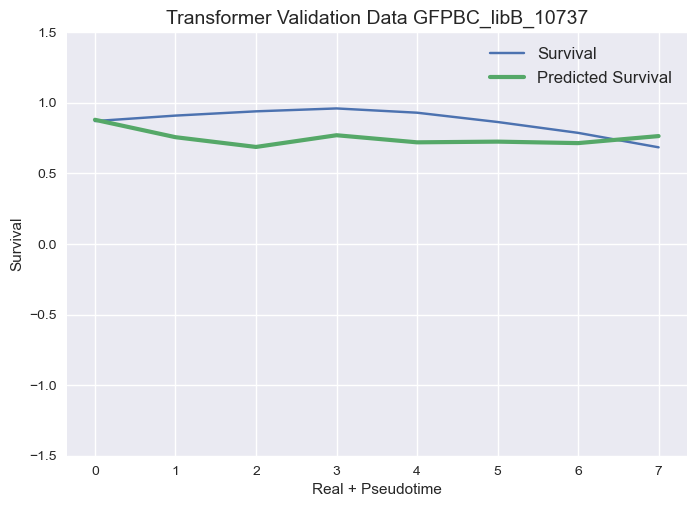

48/48 [==============================] - 2s 13ms/step - loss: 0.0475 - mean_squared_error: 0.0475 - val_loss: 0.1175 - val_mean_squared_error: 0.1175
(287, 8, 72)Epoch 2/20
21/21 [==============================] - 0s 15ms/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 1.0544 - val_mean_squared_error: 1.0544
 (8, 8, 72)
Epoch 19/20
48/48 [==============================] - 0s 4ms/step - loss: 0.0338 - mean_squared_error: 0.0338 - val_loss: 0.1270 - val_mean_squared_error: 0.1270
Epoch 3/20
18/18 [==============================] - 0s 5ms/step - loss: 0.0634 - mean_squared_error: 0.0634 - val_loss: 0.1472 - val_mean_squared_error: 0.1472
Epoch 14/20
1/1 [==============================] - 0s 40ms/step
 
34/48 [====================>.........] - ETA: 0s - loss: 0.0321 - mean_squared_error: 0.0321Epoch 13/20

Epoch 1/20
Transformer Training MSE - MSE: 0.0714
18/18 [==============================] - 0s 7ms/step - loss: 0.0551 - mean_squared_error: 0.0551 - val_loss: 0.1033 - val_m

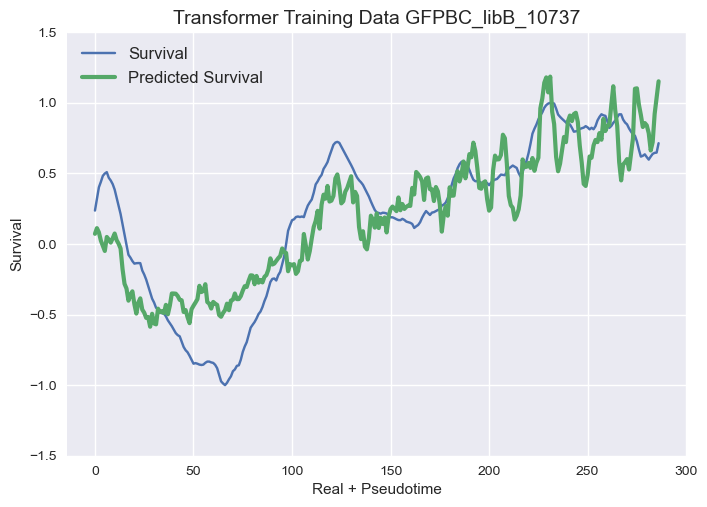

77/77 [==============================] - 1s 11ms/step - loss: 0.0198 - mean_squared_error: 0.0198 - val_loss: 0.1231 - val_mean_squared_error: 0.1231
Epoch 19/20
Epoch 5/20
 7/77 [=>............................] - ETA: 0s - loss: 0.0212 - mean_squared_error: 0.0212

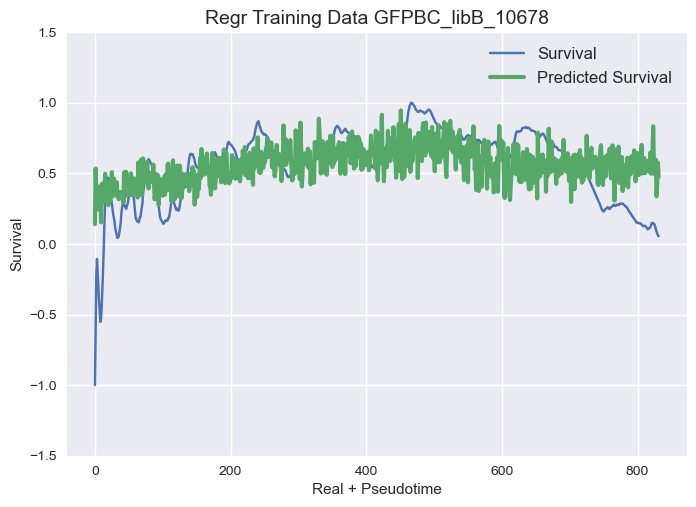

15/15 [==============================] - 0s 14ms/step - loss: 0.1079 - mean_squared_error: 0.1079 - val_loss: 1.7825 - val_mean_squared_error: 1.7825
Epoch 3/20
15/15 [==============================] - 0s 13ms/step - loss: 0.0359 - mean_squared_error: 0.0359 - val_loss: 1.2447 - val_mean_squared_error: 1.2447
Epoch 5/20
44/44 [==============================] - 0s 6ms/step - loss: 0.0258 - mean_squared_error: 0.0258 - val_loss: 0.0094 - val_mean_squared_error: 0.0094
Epoch 20/20
15/15 [==============================] - 0s 13ms/step - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 1.5762 - val_mean_squared_error: 1.5762
Epoch 6/20
Epoch 4/20
48/48 [==============================] - 0s 5ms/step - loss: 0.0292 - mean_squared_error: 0.0292 - val_loss: 0.0895 - val_mean_squared_error: 0.0895
Epoch 1/20
44/44 [==============================] - 0s 6ms/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0173 - val_mean_squared_error: 0.0173
Epoch 17/20
 1/44 [.................

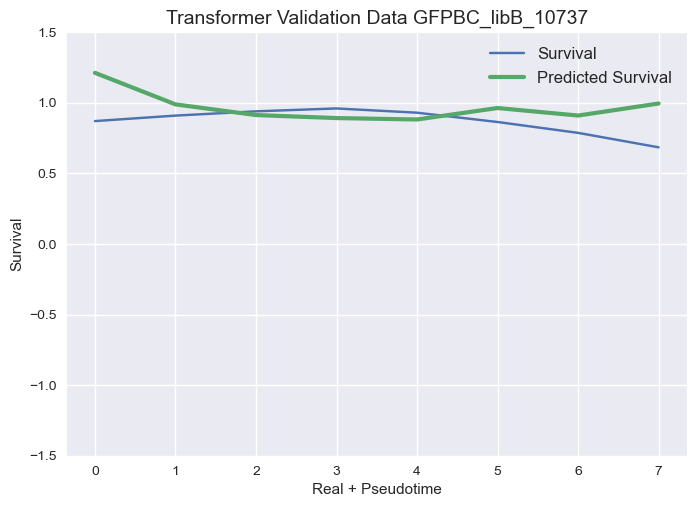

21/44 [=============>................] - ETA: 0s - loss: 0.0222 - mean_squared_error: 0.0222(287, 8, 72) (8, 8, 7


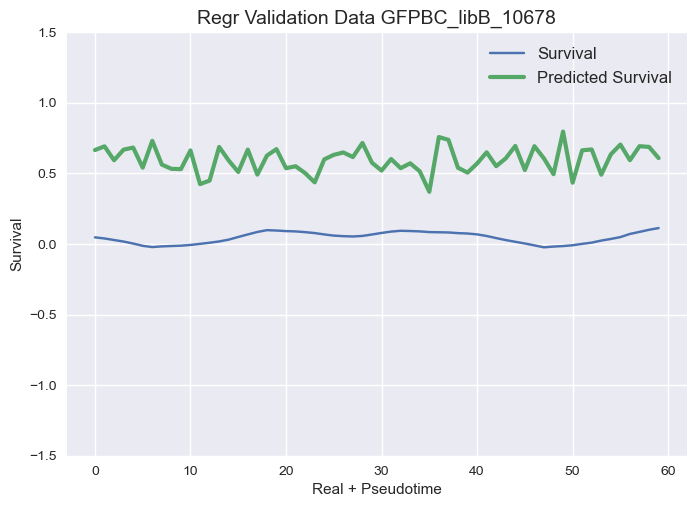

15/15 [==============================] - 0s 16ms/step - loss: 0.0456 - mean_squared_error: 0.0456 - val_loss: 1.9812 - val_mean_squared_error: 1.9812
Epoch 5/20
48/48 [==============================] - 0s 4ms/step - loss: 0.0278 - mean_squared_error: 0.0278 - val_loss: 0.0863 - val_mean_squared_error: 0.0863
Epoch 8/20
44/44 [==============================] - 0s 4ms/step - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0137 - val_mean_squared_error: 0.0137
Epoch 18/20
15/15 [==============================] - 0s 12ms/step - loss: 0.0301 - mean_squared_error: 0.0301 - val_loss: 1.7456 - val_mean_squared_error: 1.7456

Epoch 6/20
48/48 [==============================] - 0s 3ms/step - loss: 0.0281 - mean_squared_error: 0.0281 - val_loss: 0.0844 - val_mean_squared_error: 0.0844
Epoch 9/20
44/44 [==============================] - 0s 4ms/step - loss: 0.0232 - mean_squared_error: 0.0232 - val_loss: 0.0108 - val_mean_squared_error: 0.0108
Epoch 19/20
15/15 [============================

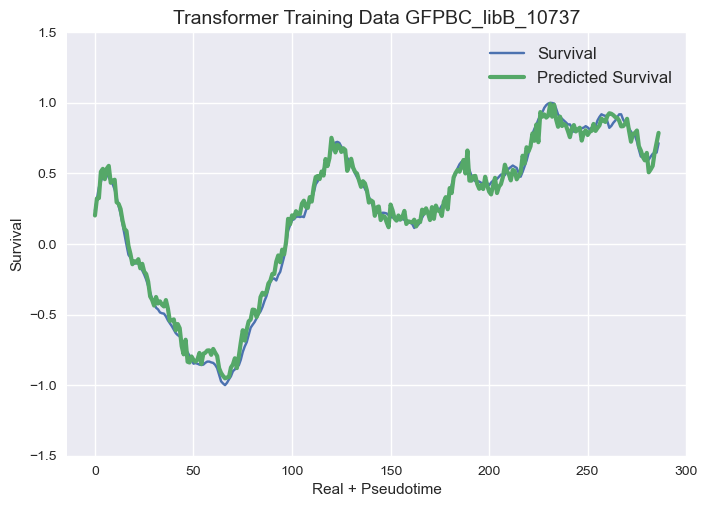

15/15 [==============================] - 0s 13ms/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 1.3251 - val_mean_squared_error: 1.3251
Epoch 12/20
52/52 [==============================] - 0s 4ms/step - loss: 0.2152 - mean_squared_error: 0.2152 - val_loss: 0.0847 - val_mean_squared_error: 0.0847
Epoch 3/20
52/52 [==============================] - 0s 4ms/step - loss: 0.1286 - mean_squared_error: 0.1286 - val_loss: 0.1769 - val_mean_squared_error: 0.1769
Epoch 4/20
15/15 [==============================] - 0s 13ms/step - loss: 0.0095 - mean_squared_error: 0.0095 - val_loss: 2.2884 - val_mean_squared_error: 2.2884
Epoch 11/20
23/52 [============>.................] - ETA: 0s - loss: 0.0866 - mean_squared_error: 0.0866

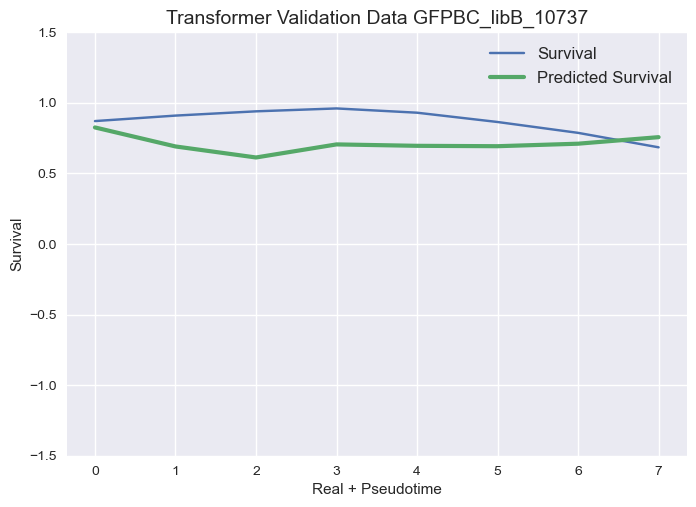

15/15 [==============================] - 0s 10ms/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 1.1982 - val_mean_squared_error: 1.1982
Epoch 14/20
 8/15 [===============>..............] - ETA: 0s - loss: 0.0097 - mean_squared_error: 0.0097(295, 72)Epoch 7/20
 (16, 72)
21/21 [==============================] - 1s 16ms/step - loss: 0.1862 - mean_squared_error: 0.1862 - val_loss: 0.9629 - val_mean_squared_error: 0.9629
Epoch 2/20
48/48 [==============================] - 0s 6ms/step - loss: 0.0266 - mean_squared_error: 0.0266 - val_loss: 0.0776 - val_mean_squared_error: 0.0776
Epoch 14/20
21/21 [==============================] - 0s 7ms/step - loss: 0.1776 - mean_squared_error: 0.1776 - val_loss: 1.0663 - val_mean_squared_error: 1.0663
Epoch 3/20
15/15 [==============================] - 0s 18ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 2.1251 - val_mean_squared_error: 2.1251
Epoch 1/20
15/15 [==============================] - 0s 17ms/step - loss: 0.0074 - me

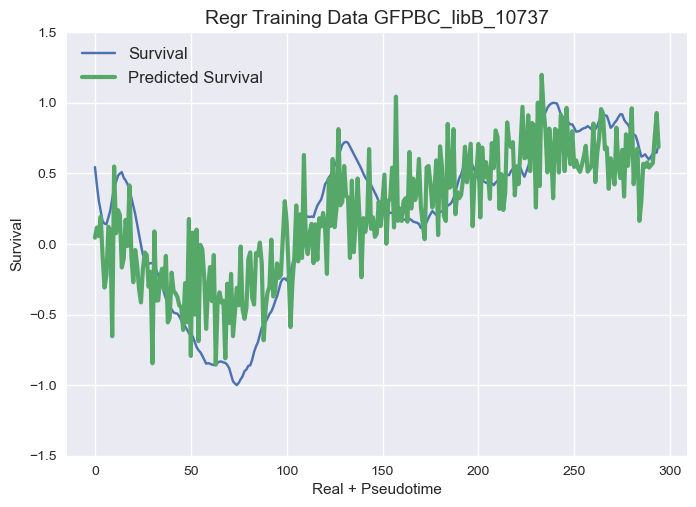

21/21 [==============================] - 0s 8ms/step - loss: 0.1586 - mean_squared_error: 0.1586 - val_loss: 1.3185 - val_mean_squared_error: 1.3185
Epoch 7/20
48/48 [==============================] - 0s 4ms/step - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0918 - val_mean_squared_error: 0.0918
Epoch 17/20
15/15 [==============================] - 0s 12ms/step - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 2.0447 - val_mean_squared_error: 2.0447
Epoch 15/20
52/52 [==============================] - 0s 4ms/step - loss: 0.0509 - mean_squared_error: 0.0509 - val_loss: 0.1073 - val_mean_squared_error: 0.1073
Epoch 8/20
48/48 [==============================] - 0s 4ms/step - loss: 0.0240 - mean_squared_error: 0.0240 - val_loss: 0.0891 - val_mean_squared_error: 0.0891
Epoch 18/20
21/21 [==============================] - 0s 5ms/step - loss: 0.1171 - mean_squared_error: 0.1171 - val_loss: 1.1494 - val_mean_squared_error: 1.1494
Epoch 9/20
15/15 [=============================

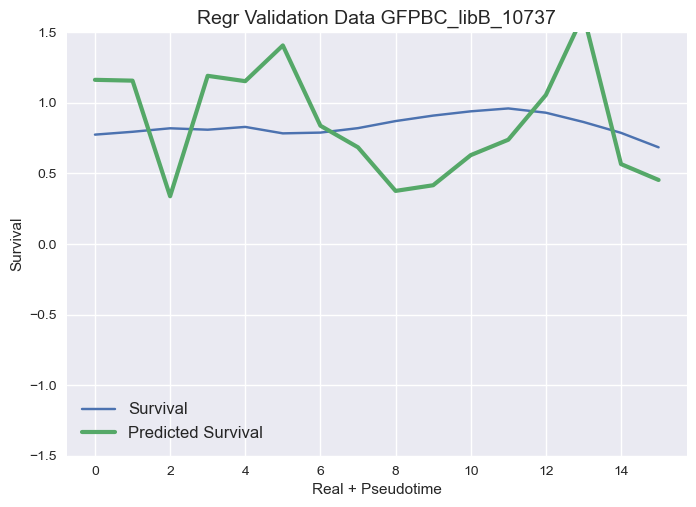

48/48 [==============================] - 0s 5ms/step - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0760 - val_mean_squared_error: 0.0760
Epoch 19/20
21/21 [==============================] - 0s 5ms/step - loss: 0.0908 - mean_squared_error: 0.0908 - val_loss: 0.7759 - val_mean_squared_error: 0.7759
Epoch 17/20
Epoch 11/20
15/15 [==============================] - 0s 13ms/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 1.1573 - val_mean_squared_error: 1.1573
Epoch 20/20
52/52 [==============================] - 0s 5ms/step - loss: 0.0413 - mean_squared_error: 0.0413 - val_loss: 0.0662 - val_mean_squared_error: 0.0662
Epoch 10/20
48/48 [==============================] - 0s 4ms/step - loss: 0.0235 - mean_squared_error: 0.0235 - val_loss: 0.0595 - val_mean_squared_error: 0.0595
Epoch 20/20
15/15 [==============================] - 0s 12ms/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 1.9823 - val_mean_squared_error: 1.9823
Epoch 18/20
21/21 [=============

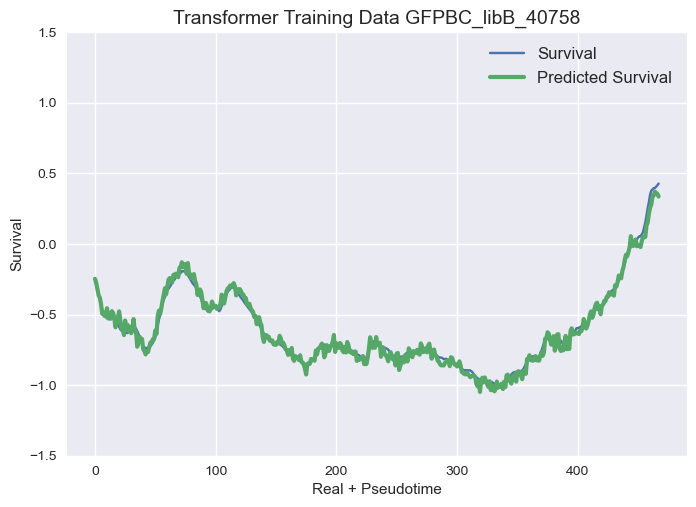

1/1 [==============================] - 0s 39ms/steploss: 0.0299 - mean_squared_error: 0.02
 
21/21 [==============================] - 0s 4ms/step - loss: 0.0386 - mean_squared_error: 0.0386 - val_loss: 0.4040 - val_mean_squared_error: 0.4040

Transformer Validation MSE - MSE: 1.5183
44/44 [==============================] - 2s 15ms/step - loss: 0.0709 - mean_squared_error: 0.0709 - val_loss: 0.1151 - val_mean_squared_error: 0.1151
Epoch 2/20
18/18 [==============================] - 0s 11ms/step - loss: 0.0204 - mean_squared_error: 0.0204 - val_loss: 0.2910 - val_mean_squared_error: 0.2910
Epoch 8/20
Epoch 17/20
 7/18 [==========>...................] - ETA: 0s - loss: 0.0114 - mean_squared_error: 0.0114

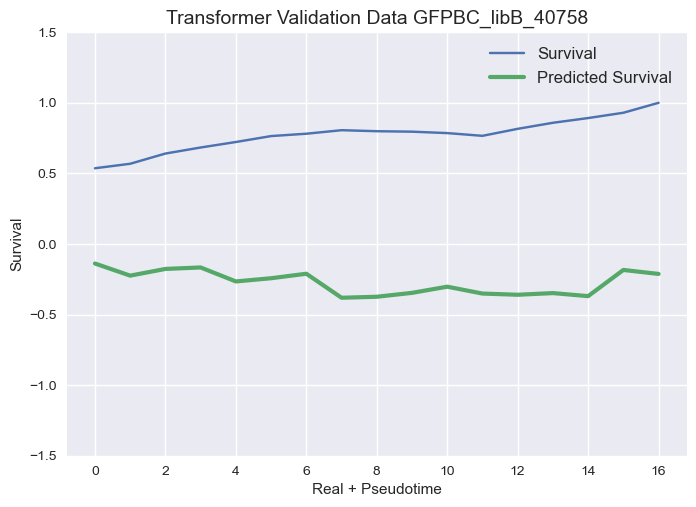

30/36 [========================>.....] - ETA: 0s - loss: 0.0626 - mean_squared_error: 0.0626(17, 8, 7


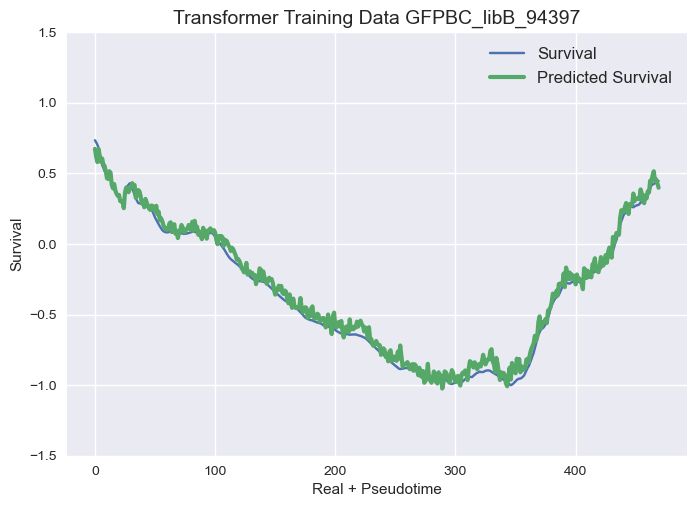

18/18 [==============================] - 0s 13ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.2931 - val_mean_squared_error: 0.2931
Epoch 9/20
52/52 [==============================] - 0s 3ms/step - loss: 0.0314 - mean_squared_error: 0.0314 - val_loss: 0.0508 - val_mean_squared_error: 0.0508
Epoch 19/20
 1/52 [..............................] - ETA: 0s - loss: 0.0254 - mean_squared_error: 0.0254
Transformer Evaluation metrics
18/18 [==============================] - 0s 12ms/step - loss: 0.0129 - mean_squared_error: 0.0129 - val_loss: 0.3336 - val_mean_squared_error: 0.3336
Epoch 10/20
 1/18 [>.............................] - ETA: 0s - loss: 0.0099 - mean_squared_error: 0.0099Transformer Training MSE - MSE: 0.0778
Epoch 2/20
Transformer Validation MSE - MSE: 1.7687
 6/36 [====>.........................] - ETA: 0s - loss: 0.0111 - mean_squared_error: 0.0111

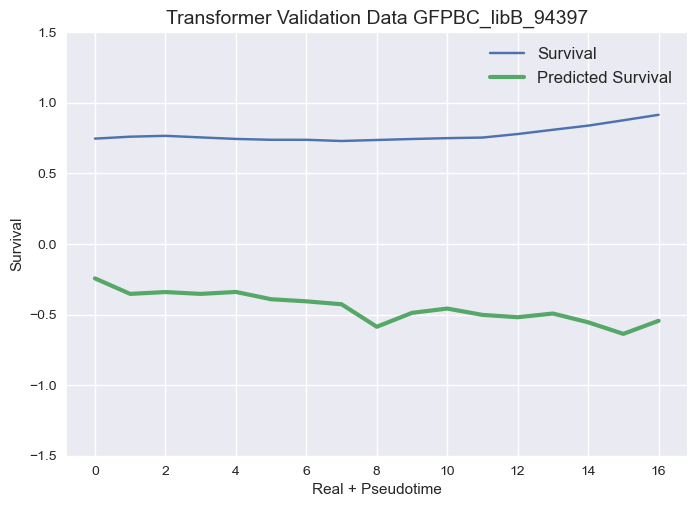

52/52 [==============================] - 0s 4ms/step - loss: 0.0320 - mean_squared_error: 0.0320 - val_loss: 0.0634 - val_mean_squared_error: 0.0634
Epoch 20/20
18/18 [==============================] - 0s 12ms/step - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.3197 - val_mean_squared_error: 0.3197
Epoch 11/20
44/44 [==============================] - 0s 11ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.2055 - val_mean_squared_error: 0.2055
Epoch 4/20
Epoch 11/20
1/1 [==============================] - 0s 31ms/step
 
Transformer Evaluation metrics
18/18 [==============================] - 0s 11ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.2599 - val_mean_squared_error: 0.2599
Epoch 12/20

 1/18 [>.............................] - ETA: 0s - loss: 0.0188 - mean_squared_error: 0.0188Transformer Validation MSE - MSE: 1.6614

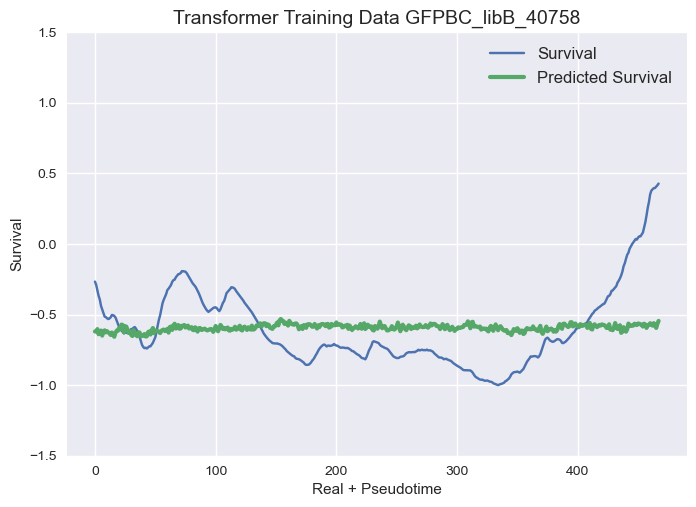


36/36 [==============================] - 0s 12ms/step - loss: 0.0093 - mean_squared_error: 0.0093 - val_loss: 0.7326 - val_mean_squared_error: 0.7326
Epoch 3/20
46/77 [================>.............] - ETA: 0s - loss: 0.0066 - mean_squared_error: 0.0066

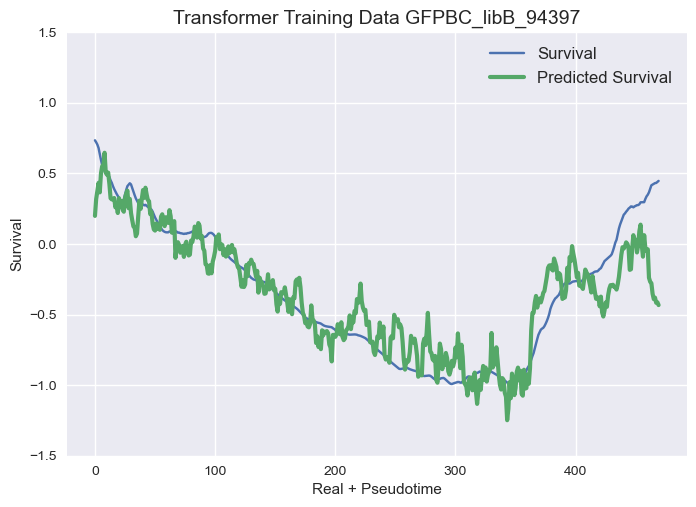

26/48 [===============>..............] - ETA: 0s - loss: 0.0536 - mean_squared_error: 0.0536

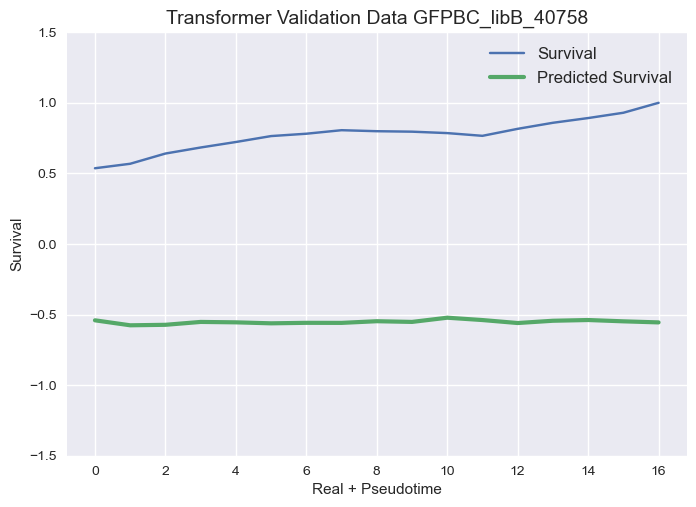

18/18 [==============================] - 0s 13ms/step - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.4646 - val_mean_squared_error: 0.4646
Epoch 14/20
18/18 [==============================] - 0s 13ms/step - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.3255 - val_mean_squared_error: 0.3255
Epoch 15/20
Epoch 1/20
 1/77 [..............................] - ETA: 2s - loss: 0.0043 - mean_squared_error: 0.0043

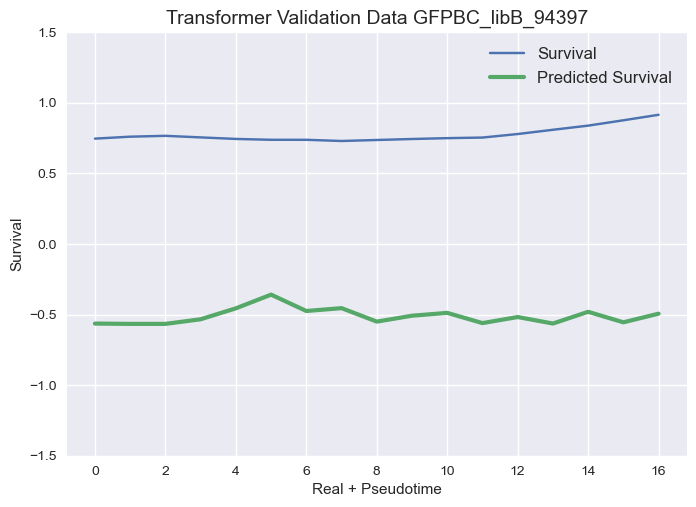

 (470, 8, 72) (17, 8, 72)

44/44 [==============================] - 1s 12ms/step - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.2217 - val_mean_squared_error: 0.2217

32/36 [=========================>....] - ETA: 0s - loss: 0.0072 - mean_squared_error: 0.0072
Transformer Validation MSE - MSE: 1.3351
Epoch 6/20
48/48 [==============================] - 2s 16ms/step - loss: 0.0424 - mean_squared_error: 0.0424 - val_loss: 0.1040 - val_mean_squared_error: 0.1040
Epoch 2/20
18/18 [==============================] - 0s 13ms/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.3662 - val_mean_squared_error: 0.3662
Transformer Evaluation metrics
 6/18 [=========>....................] - ETA: 0s - loss: 0.0065 - mean_squared_error: 0.0065

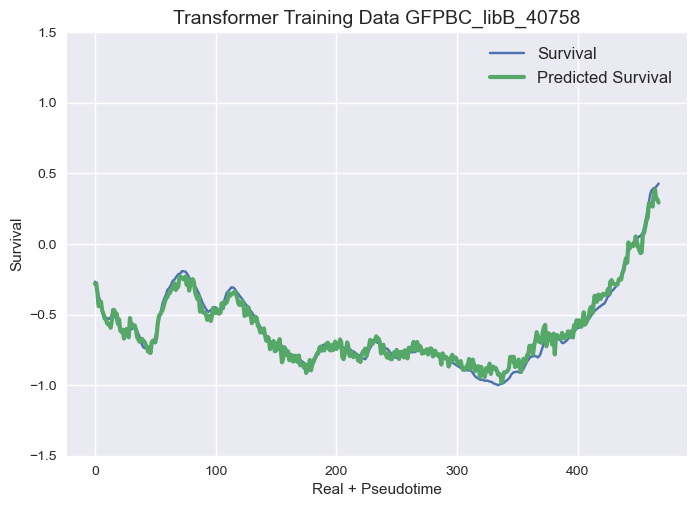

44/44 [==============================] - 1s 12ms/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.1377 - val_mean_squared_error: 0.1377
Epoch 7/20
48/48 [==============================] - 1s 12ms/step - loss: 0.0286 - mean_squared_error: 0.0286 - val_loss: 0.1161 - val_mean_squared_error: 0.1161
Epoch 3/20
18/18 [==============================] - 0s 11ms/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.4515 - val_mean_squared_error: 0.4515
Epoch 2/20
24/48 [==============>...............] - ETA: 0s - loss: 0.0239 - mean_squared_error: 0.0239

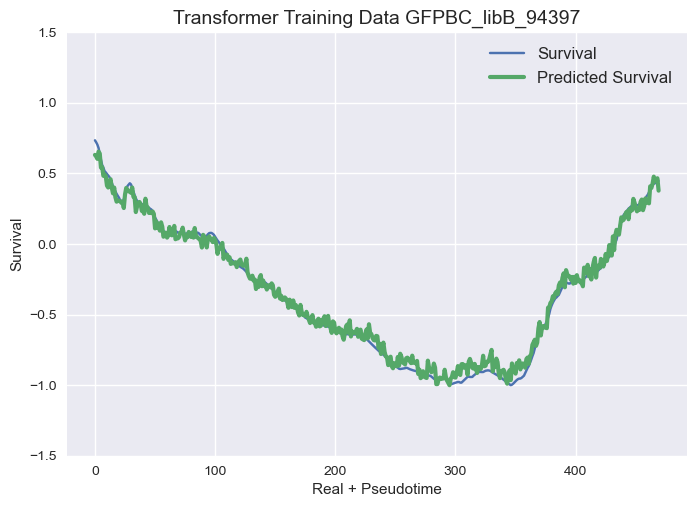

 7/18 [==========>...................] - ETA: 0s - loss: 0.0086 - mean_squared_error: 0.0086

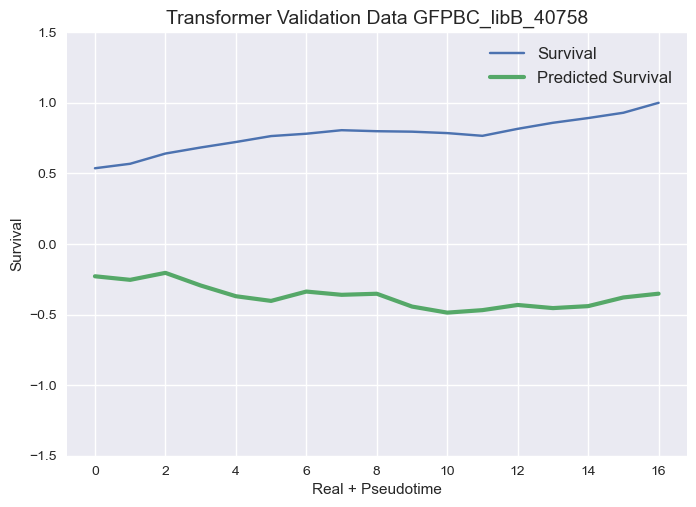

44/44 [==============================] - 1s 13ms/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.1469 - val_mean_squared_error: 0.1469
Epoch 8/20
Evaluation metrics Regr
36/36 [==============================] - 1s 17ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.6995 - val_mean_squared_error: 0.6995
Epoch 7/20
48/48 [==============================] - 1s 13ms/step - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0960 - val_mean_squared_error: 0.0960
Epoch 4/20
 5/36 [===>..........................] - ETA: 0s - loss: 0.0029 - mean_squared_error: 0.0029

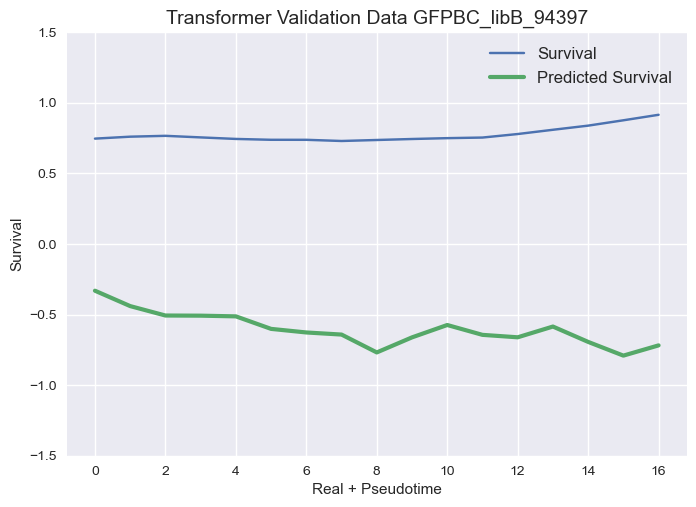

11/36 [========>.....................] - ETA: 0s - loss: 0.0032 - mean_squared_error: 0.0032Epoch 4/20

25/48 [==============>...............] - ETA: 0s - loss: 0.0146 - mean_squared_error: 0.0146Evaluation metr
Regr Training Data - MSE: 0.1411
Regr Validation Data - MSE: 1.7192
19/21 [==========================>...] - ETA: 0s - loss: 0.0461 - mean_squared_error: 0.0461

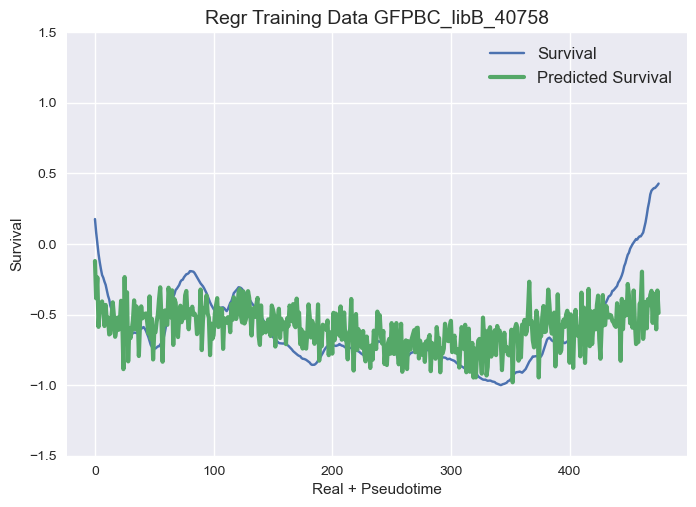

36/36 [==============================] - 1s 14ms/step - loss: 0.0034 - mean_squared_error: 0.0034 - val_loss: 0.6637 - val_mean_squared_error: 0.6637
Epoch 8/20
44/44 [==============================] - 1s 15ms/step - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.1861 - val_mean_squared_error: 0.1861
Epoch 9/20
1/1 [==============================] - 0s 29ms/steploss: 0.0031 - mean_squared_error: 0.00
 
21/21 [==============================] - 0s 12ms/step - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 1.3719 - val_mean_squared_error: 1.3719
Epoch 6/20
13/48 [=======>......................] - ETA: 0s - loss: 0.0104 - mean_squared_error: 0.0104Epoch 14/20


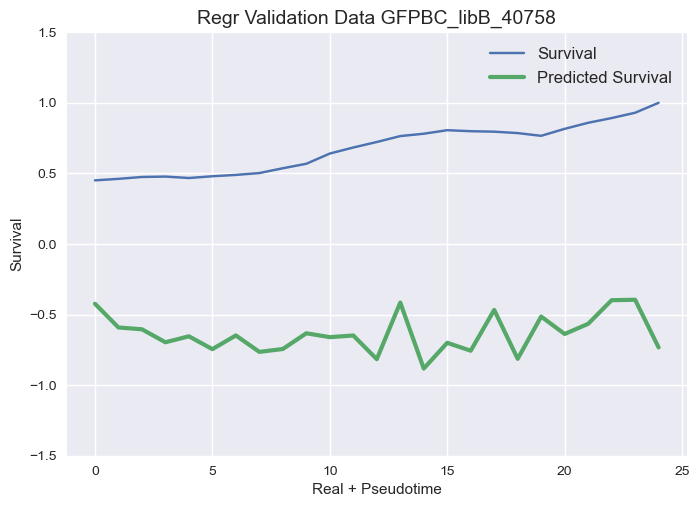

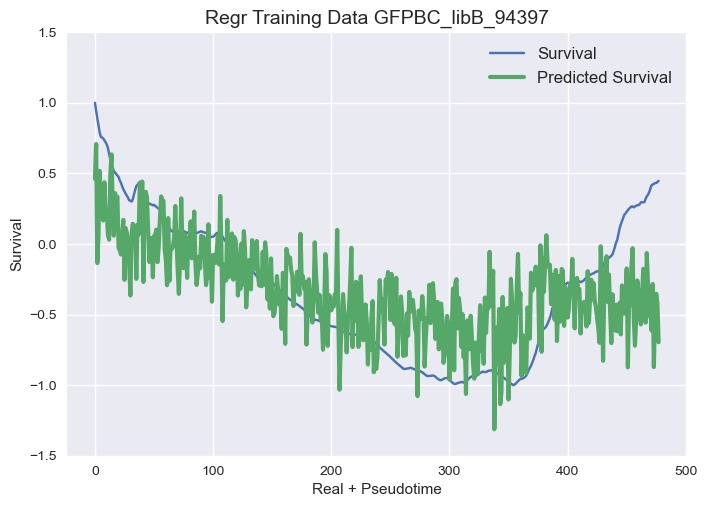

36/36 [==============================] - 0s 12ms/step - loss: 0.0029 - mean_squared_error: 0.0029 - val_loss: 0.7081 - val_mean_squared_error: 0.7081
Epoch 9/20
44/44 [==============================] - 1s 12ms/step - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.1550 - val_mean_squared_error: 0.1550
Epoch 10/20
45/48 [===========================>..] - ETA: 0s - loss: 0.0081 - mean_squared_error: 0.0081

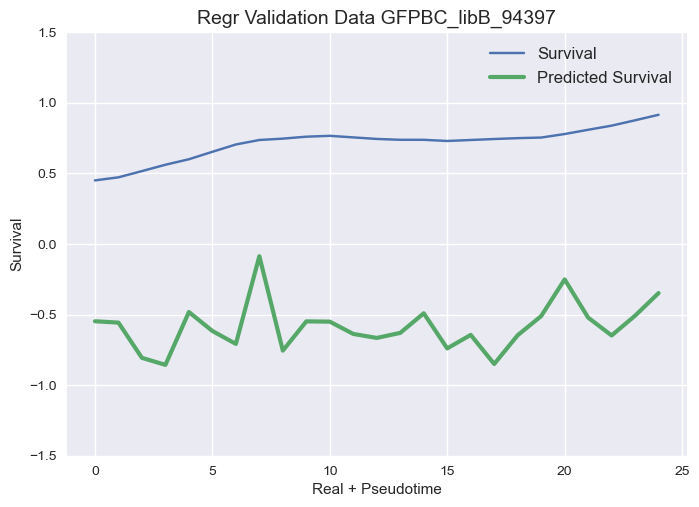

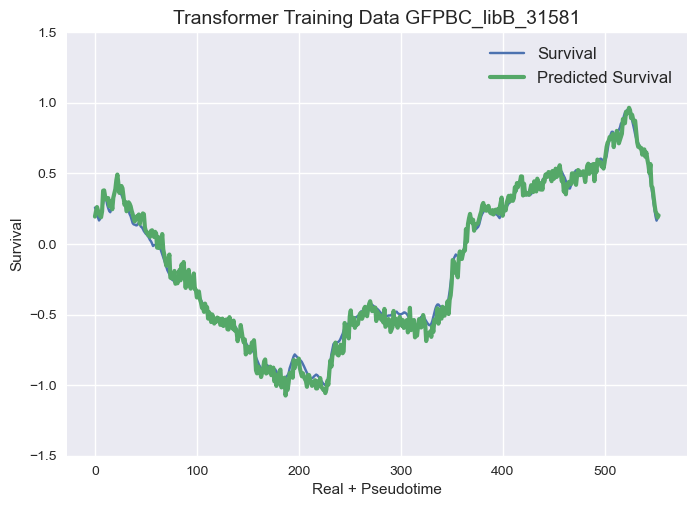

48/48 [==============================] - 1s 12ms/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.0882 - val_mean_squared_error: 0.0882
Epoch 6/20
52/52 [==============================] - 3s 15ms/step - loss: 0.1747 - mean_squared_error: 0.1747 - val_loss: 0.0998 - val_mean_squared_error: 0.0998
Epoch 2/20
36/36 [==============================] - 0s 11ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.7333 - val_mean_squared_error: 0.7333
Epoch 10/20
21/21 [==============================] - 0s 12ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 1.5244 - val_mean_squared_error: 1.5244
Epoch 9/20
44/44 [==============================] - 0s 11ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.1267 - val_mean_squared_error: 0.1267


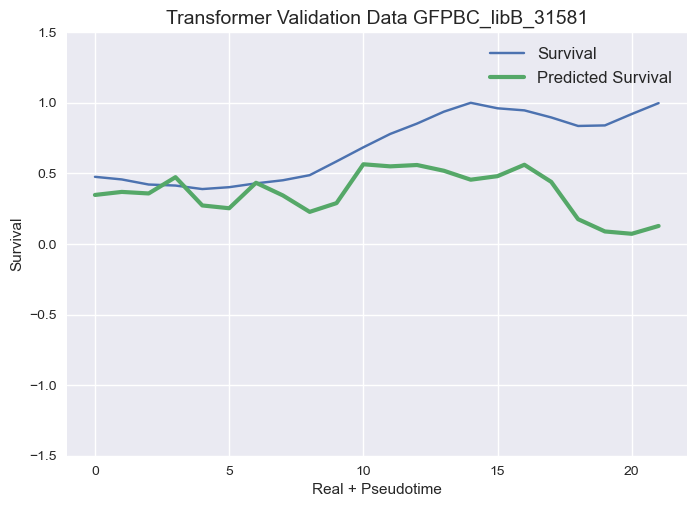

48/48 [==============================] - 0s 10ms/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0773 - val_mean_squared_error: 0.0773
Epoch 7/20
21/21 [==============================] - 0s 11ms/step - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 1.5184 - val_mean_squared_error: 1.5184
Epoch 10/20
36/36 [==============================] - 0s 12ms/step - loss: 0.0026 - mean_squared_error: 0.0026 - val_loss: 0.6401 - val_mean_squared_error: 0.6401
Epoch 11/20
1/1 [==============================] - 0s 23ms/steploss: 0.0074 - mean_squared_error: 0.00
 
Transformer Evaluation metrics
52/52 [==============================] - 1s 10ms/step - loss: 0.0559 - mean_squared_error: 0.0559 - val_loss: 0.1196 - val_mean_squared_error: 0.1196
Epoch 3/20
44/44 [==============================] - 0s 10ms/step - loss: 0.0035 - mean_squared_error: 0.0035 - val_loss: 0.1914 - val_mean_squared_error: 0.1914
Epoch 12/20
21/21 [==============================] - 0s 13ms/step - loss: 0.0108

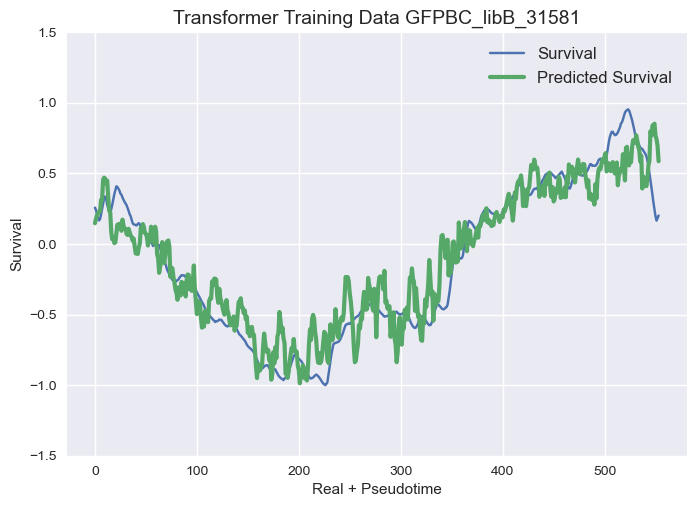

52/52 [==============================] - 1s 10ms/step - loss: 0.0360 - mean_squared_error: 0.0360 - val_loss: 0.1518 - val_mean_squared_error: 0.1518
Epoch 4/20
21/21 [==============================] - 0s 10ms/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 1.6627 - val_mean_squared_error: 1.6627
Epoch 13/20
44/44 [==============================] - 0s 11ms/step - loss: 0.0032 - mean_squared_error: 0.0032 - val_loss: 0.1762 - val_mean_squared_error: 0.1762
Epoch 13/20
77/77 [==============================] - 1s 12ms/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.1038 - val_mean_squared_error: 0.1038
Epoch 16/20
36/36 [==============================] - 0s 12ms/step - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.7168 - val_mean_squared_error: 0.7168
Epoch 13/20
11/77 [===>..........................] - ETA: 0s - loss: 0.0112 - mean_squared_error: 0.0112

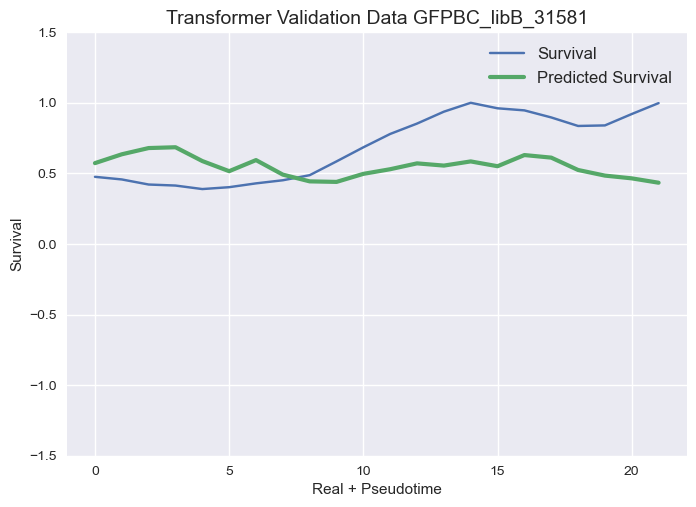

21/21 [==============================] - 0s 12ms/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 1.4787 - val_mean_squared_error: 1.4787
Epoch 14/20
48/48 [==============================] - 1s 10ms/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0635 - val_mean_squared_error: 0.0635
Epoch 9/20
52/52 [==============================] - 1s 10ms/step - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.1766 - val_mean_squared_error: 0.1766
Epoch 5/20
44/44 [==============================] - 0s 11ms/step - loss: 0.0032 - mean_squared_error: 0.0032 - val_loss: 0.1701 - val_mean_squared_error: 0.1701
Epoch 14/20
21/21 [==============================] - 0s 12ms/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 1.4548 - val_mean_squared_error: 1.4548
Epoch 15/20
14/52 [=======>......................] - ETA: 0s - loss: 0.0181 - mean_squared_error: 0.0181 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0024
Transformer Validation MSE -

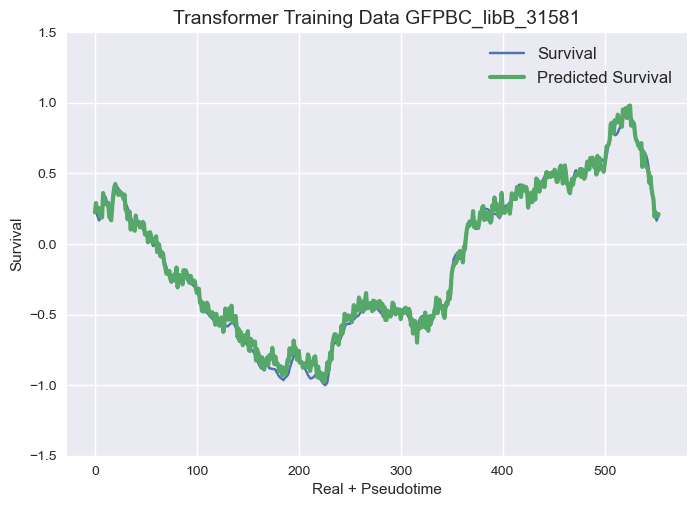

21/21 [==============================] - 0s 11ms/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 1.4669 - val_mean_squared_error: 1.4669
Epoch 17/20
36/36 [==============================] - 0s 12ms/step - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.6289 - val_mean_squared_error: 0.6289
Epoch 15/20
48/48 [==============================] - 0s 10ms/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0975 - val_mean_squared_error: 0.0975
Epoch 11/20
21/21 [==============================] - 0s 14ms/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 1.4014 - val_mean_squared_error: 1.4014
Epoch 18/20
34/36 [===========================>..] - ETA: 0s - loss: 0.0019 - mean_squared_error: 0.0019

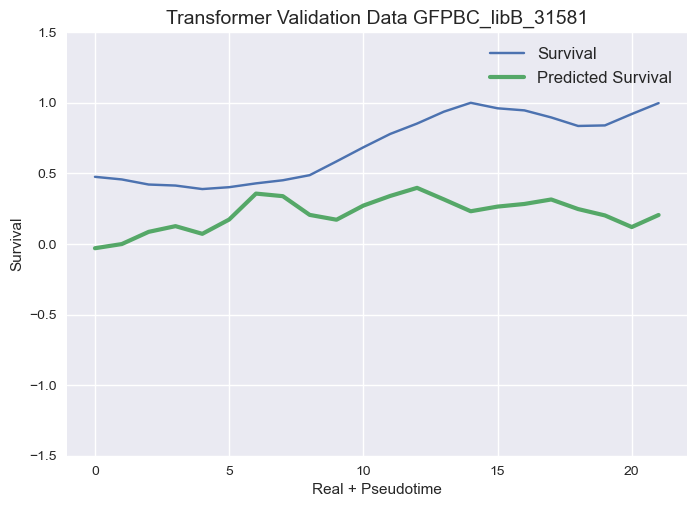

44/44 [==============================] - 0s 10ms/step - loss: 0.0030 - mean_squared_error: 0.0030 - val_loss: 0.1298 - val_mean_squared_error: 0.1298)  (562, 72) (30, 7

Epoch 16/20
52/52 [==============================] - 1s 11ms/step - loss: 0.0127 - mean_squared_error: 0.0127 - val_loss: 0.1048 - val_mean_squared_error: 0.1048
Epoch 7/20
21/21 [==============================] - 0s 13ms/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 1.5356 - val_mean_squared_error: 1.5356
Epoch 19/20
20/36 [===============>..............] - ETA: 0s - loss: 0.0020 - mean_squared_error: 0.0020 
Evaluation metrics Regr
Regr Training Data - MSE: 0.1391
Regr Validation Data - MSE: 0.4232
21/21 [==============================] - 0s 16ms/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 1.4736 - val_mean_squared_error: 1.4736
Epoch 20/20
36/36 [==============================] - 1s 15ms/step - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.6246 - val_mean_squared_error: 0.62

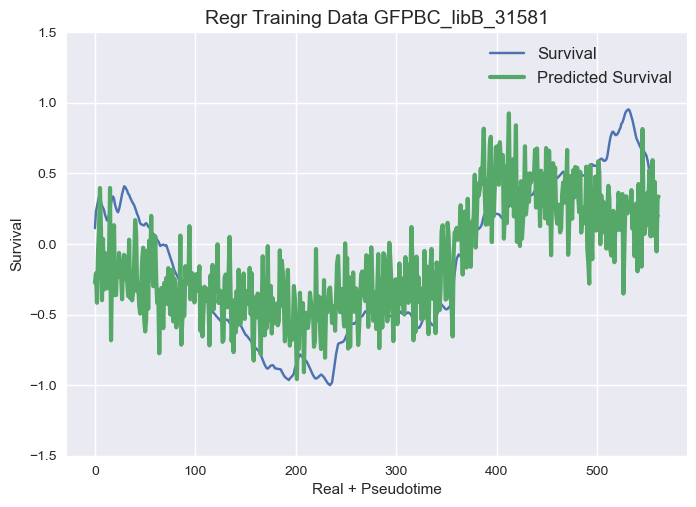

36/36 [==============================] - 0s 11ms/step - loss: 0.0017 - mean_squared_error: 0.0017 - val_loss: 0.6119 - val_mean_squared_error: 0.6119
Epoch 18/20
44/44 [==============================] - 0s 11ms/step - loss: 0.0027 - mean_squared_error: 0.0027 - val_loss: 0.1403 - val_mean_squared_error: 0.1403
Epoch 18/20
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0019
Transformer Validation MSE - MSE: 0.8664
64/77 [=======================>......] - ETA: 0s - loss: 0.0054 - mean_squared_error: 0.0054

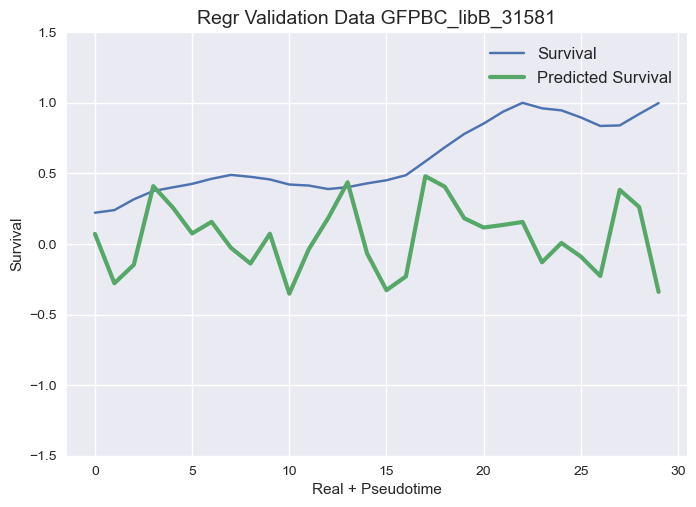

52/52 [==============================] - 1s 10ms/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.0847 - val_mean_squared_error: 0.0847
Epoch 9/20
77/77 [==============================] - 1s 10ms/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.1638 - val_mean_squared_error: 0.1638
Epoch 19/20
36/36 [==============================] - 0s 12ms/step - loss: 0.0016 - mean_squared_error: 0.0016 - val_loss: 0.6688 - val_mean_squared_error: 0.6688
Epoch 19/20
19/77 [======>.......................] - ETA: 0s - loss: 0.0044 - mean_squared_error: 0.0044

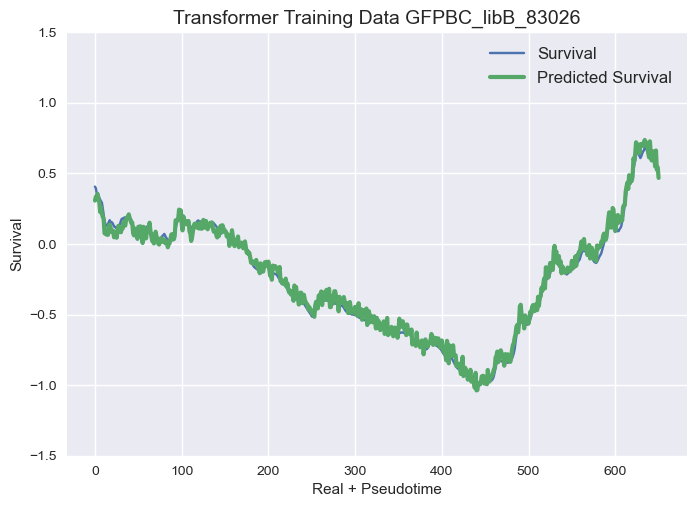

52/52 [==============================] - 0s 9ms/step - loss: 0.0073 - mean_squared_error: 0.0073 - val_loss: 0.1366 - val_mean_squared_error: 0.1366
Epoch 10/20
36/36 [==============================] - 0s 10ms/step - loss: 0.0014 - mean_squared_error: 0.0014 - val_loss: 0.6304 - val_mean_squared_error: 0.6304
Epoch 20/20
65/77 [========================>.....] - ETA: 0s - loss: 0.0041 - mean_squared_error: 0.0041

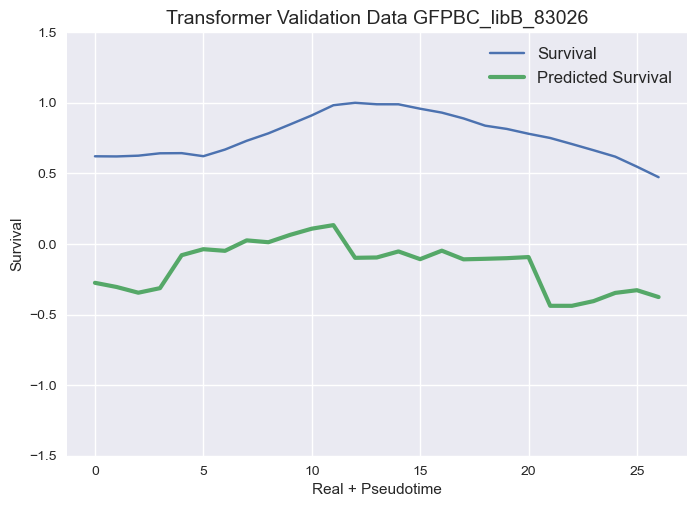

(651, 8, 72) (27, 8, 72)
77/77 [==============================] - 1s 10ms/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.1298 - val_mean_squared_error: 0.1298
Epoch 20/20
52/52 [==============================] - 0s 9ms/step - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0679 - val_mean_squared_error: 0.0679
Epoch 11/20
12/77 [===>..........................] - ETA: 0s - loss: 0.0040 - mean_squared_error: 0.0040 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0275
Transformer Validation MSE - MSE: 0.4040
48/48 [==============================] - 0s 10ms/step - loss: 0.0033 - mean_squared_error: 0.0033 - val_loss: 0.0831 - val_mean_squared_error: 0.0831
Epoch 16/20
52/52 [==============================] - 0s 8ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.0978 - val_mean_squared_error: 0.0978
Epoch 12/20
64/77 [=======================>......] - ETA: 0s - loss: 0.0039 - mean_squared_error: 0.0039

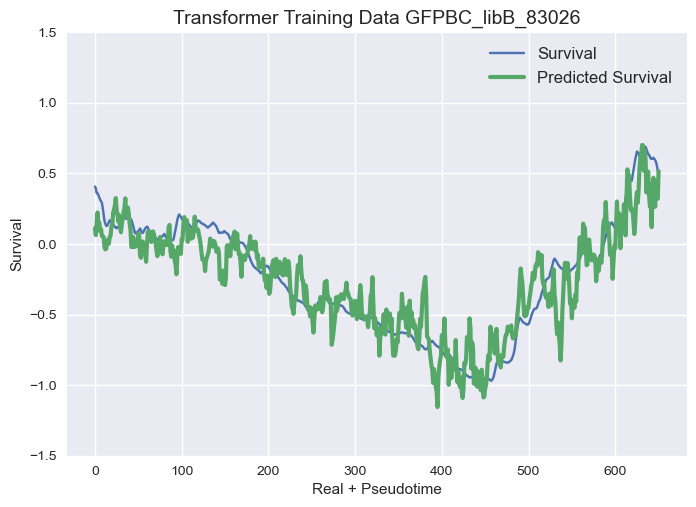

48/48 [==============================] - 0s 8ms/step - loss: 0.0031 - mean_squared_error: 0.0031 - val_loss: 0.0784 - val_mean_squared_error: 0.0784
Epoch 17/20
3/3 [==============================] - 0s 4ms/step loss: 0.0056 - mean_squared_error: 0.00
 
77/77 [==============================] - 1s 9ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.1572 - val_mean_squared_error: 0.1572

Transformer Training MSE - MSE: 0.0014
Transformer Validation MSE - MSE: 0.0334
52/52 [==============================] - 0s 8ms/step - loss: 0.0056 - mean_squared_error: 0.0056 - val_loss: 0.0889 - val_mean_squared_error: 0.0889
Epoch 13/20
48/48 [==============================] - 0s 7ms/step - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0922 - val_mean_squared_error: 0.0922
Epoch 18/20
 1/48 [..............................] - ETA: 0s - loss: 0.0016 - mean_squared_error: 0.0016

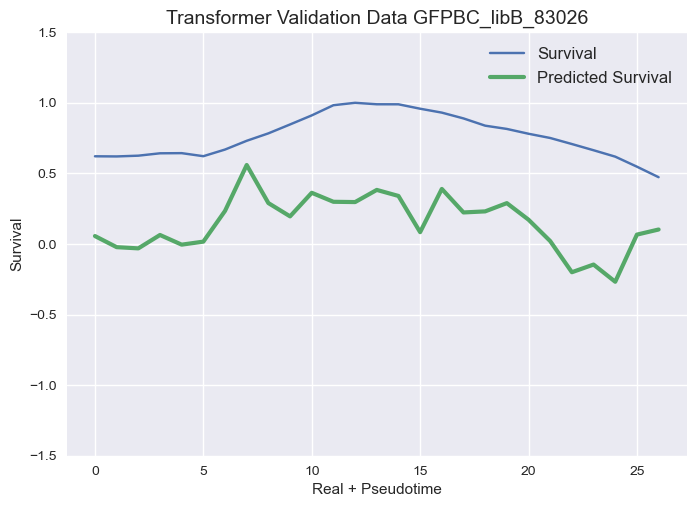

(651, 8, 72) (27, 8, 72)
34/52 [==================>...........] - ETA: 0s - loss: 0.0052 - mean_squared_error: 0.0052

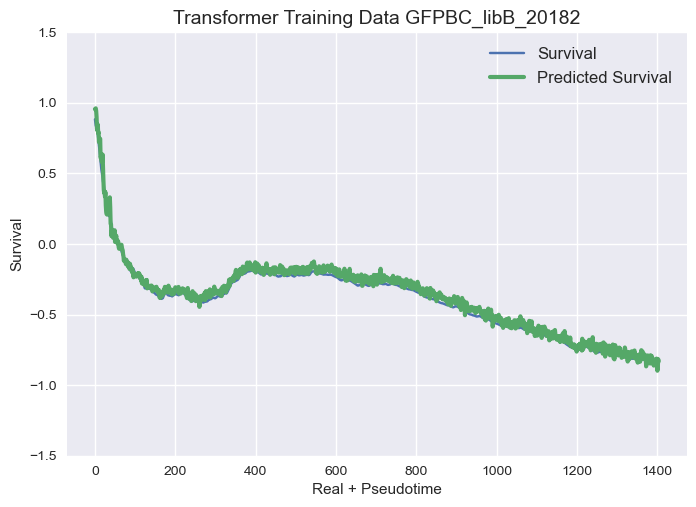

1/1 [==============================] - 0s 25ms/step
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0024
Transformer Validation MSE - MSE: 1.5622
52/52 [==============================] - 0s 7ms/step - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.1132 - val_mean_squared_error: 0.1132
Epoch 14/20
48/48 [==============================] - 0s 7ms/step - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.1044 - val_mean_squared_error: 0.1044
Epoch 19/20
33/52 [==================>...........] - ETA: 0s - loss: 0.0052 - mean_squared_error: 0.0052

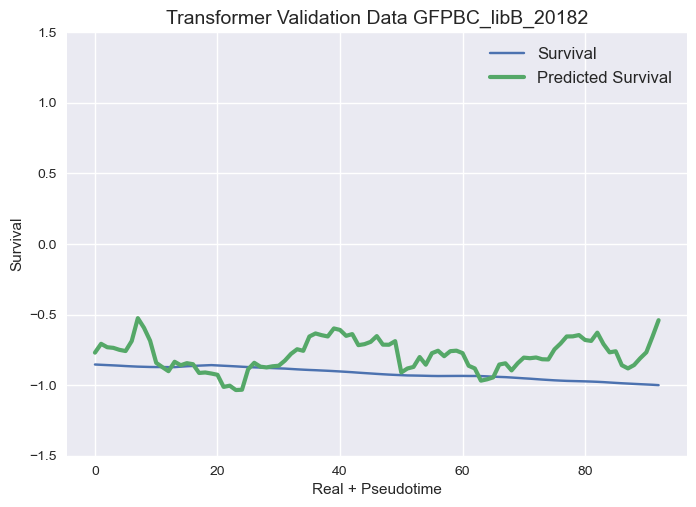

(1404, 8, 72) (93, 8, 72)
52/52 [==============================] - 0s 7ms/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0863 - val_mean_squared_error: 0.0863
Epoch 15/20
 1/52 [..............................] - ETA: 0s - loss: 0.0043 - mean_squared_error: 0.00437

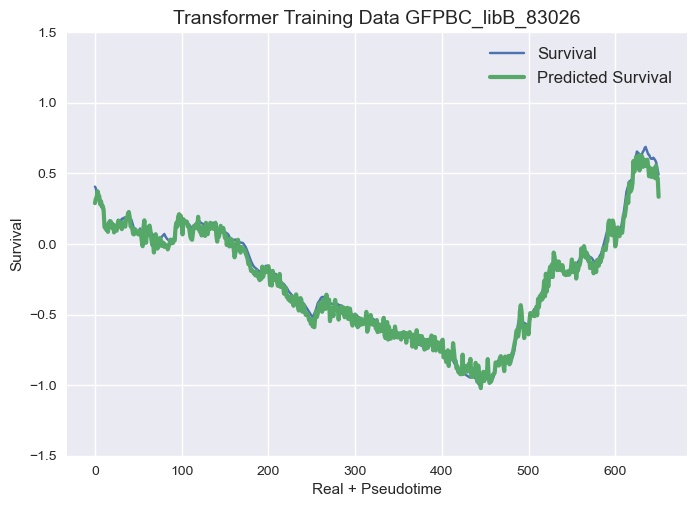

3/3 [==============================] - 0s 2ms/step loss: 0.0040 - mean_squared_error: 0.00
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0175
Transformer Validation MSE - MSE: 0.0177
36/36 [==============================] - 1s 9ms/step - loss: 0.0524 - mean_squared_error: 0.0524 - val_loss: 0.6960 - val_mean_squared_error: 0.6960
Epoch 2/20
48/48 [==============================] - 0s 7ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0720 - val_mean_squared_error: 0.0720
(1534, 8, 72) (102, 8, 72)
52/52 [==============================] - 0s 7ms/step - loss: 0.0049 - mean_squared_error: 0.0049 - val_loss: 0.0964 - val_mean_squared_error: 0.0964
Epoch 16/20
36/36 [==============================] - 0s 3ms/step - loss: 0.0138 - mean_squared_error: 0.0138 - val_loss: 0.7522 - val_mean_squared_error: 0.7522
Epoch 3/20
 1/36 [..............................] - ETA: 0s - loss: 0.0173 - mean_squared_error: 0.0173

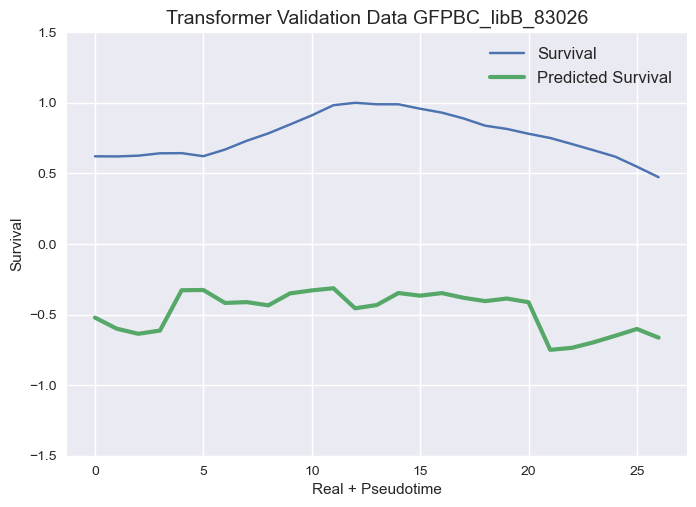

21/52 [===========>..................] - ETA: 0s - loss: 0.0046 - mean_squared_error: 0.0046
Evaluation metrics Regr
Regr Training Data - MSE: 0.1241
Regr Validation Data - MSE: 1.2655


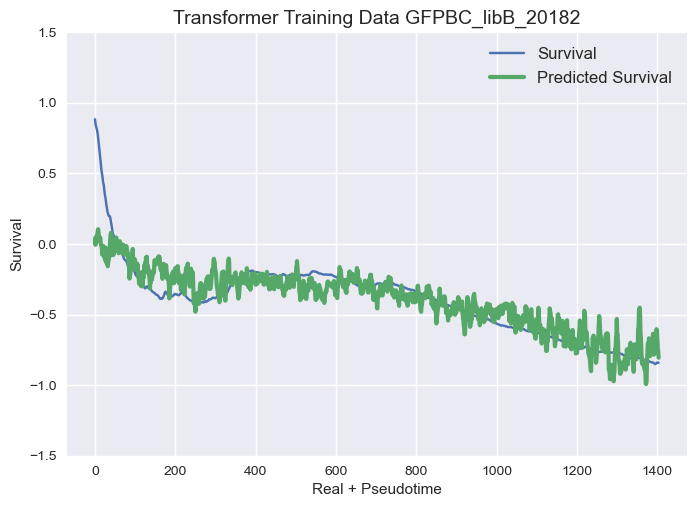

36/36 [==============================] - 0s 3ms/step - loss: 0.0124 - mean_squared_error: 0.0124 - val_loss: 0.8158 - val_mean_squared_error: 0.8158
Epoch 5/20
36/36 [==============================] - 0s 3ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.7802 - val_mean_squared_error: 0.7802
Epoch 6/20
52/52 [==============================] - 0s 9ms/step - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.1124 - val_mean_squared_error: 0.1124
Epoch 17/20
4/4 [==============================] - 0s 3ms/step loss: 0.0105 - mean_squared_error: 0.01
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0012
Transformer Validation MSE - MSE: 0.0715
36/36 [==============================] - 0s 3ms/step - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.8563 - val_mean_squared_error: 0.8563
Epoch 8/20
 1/36 [..............................] - ETA: 0s - loss: 0.0103 - mean_squared_error: 0.0103

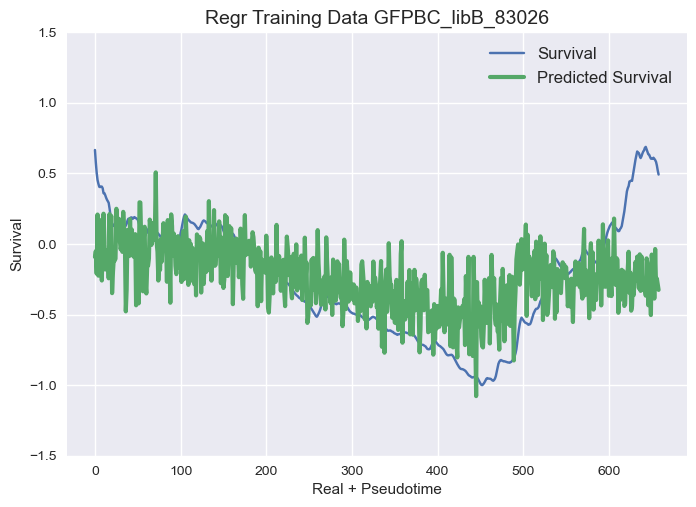

36/36 [==============================] - 0s 3ms/step - loss: 0.0108 - mean_squared_error: 0.0108 - val_loss: 0.8416 - val_mean_squared_error: 0.8416
Epoch 9/20
52/52 [==============================] - 0s 7ms/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.1502 - val_mean_squared_error: 0.1502
Epoch 18/20
77/77 [==============================] - 2s 5ms/step - loss: 0.2179 - mean_squared_error: 0.2179 - val_loss: 0.0865 - val_mean_squared_error: 0.0865
Epoch 2/20
36/36 [==============================] - 0s 3ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.7957 - val_mean_squared_error: 0.7957
Epoch 10/20
36/36 [==============================] - 0s 3ms/step - loss: 0.0088 - mean_squared_error: 0.0088 - val_loss: 0.6815 - val_mean_squared_error: 0.6815
Epoch 11/20
77/77 [==============================] - 0s 3ms/step - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.1684 - val_mean_squared_error: 0.1684
Epoch 3/20
 1/77 [..............................

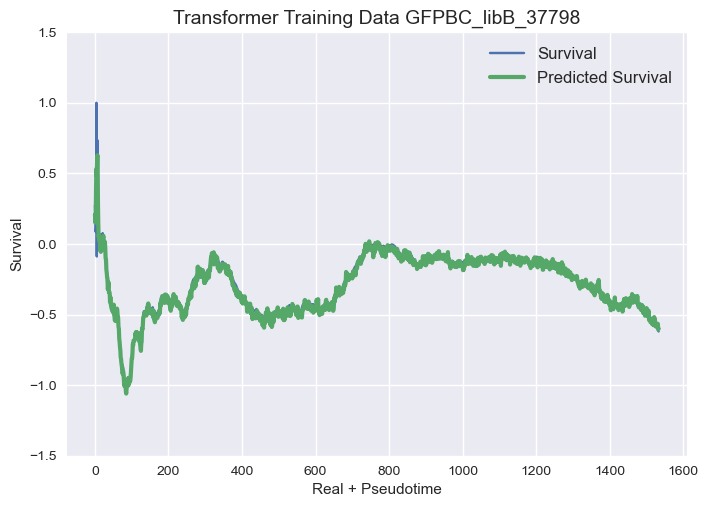

44/52 [========================>.....] - ETA: 0s - loss: 0.0050 - mean_squared_error: 0.0050

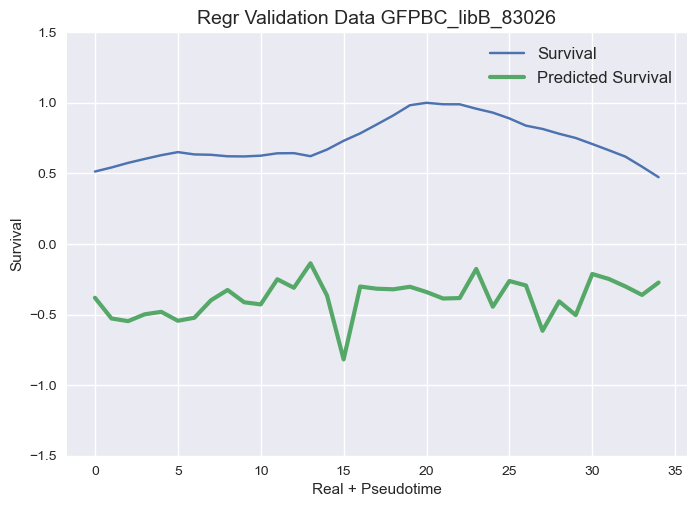

36/36 [==============================] - 0s 3ms/step - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.6815 - val_mean_squared_error: 0.6815
Epoch 12/20
73/77 [===========================>..] - ETA: 0s - loss: 0.0647 - mean_squared_error: 0.0647Epoch 19/20


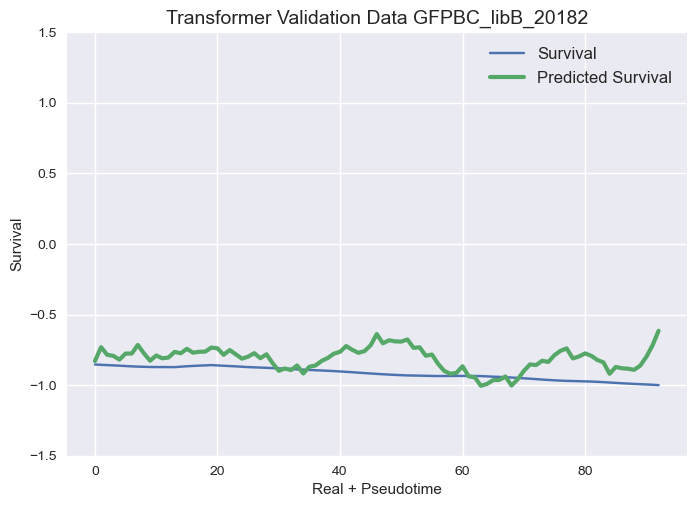

36/36 [==============================] - 0s 3ms/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.6703 - val_mean_squared_error: 0.6703
Epoch 13/20
77/77 [==============================] - 0s 3ms/step - loss: 0.0645 - mean_squared_error: 0.0645 - val_loss: 0.2158 - val_mean_squared_error: 0.2158
Epoch 4/20
36/36 [==============================] - 0s 3ms/step - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.6330 - val_mean_squared_error: 0.6330
Epoch 14/20
18/44 [===========>..................] - ETA: 0s - loss: 0.0039 - mean_squared_error: 0.00

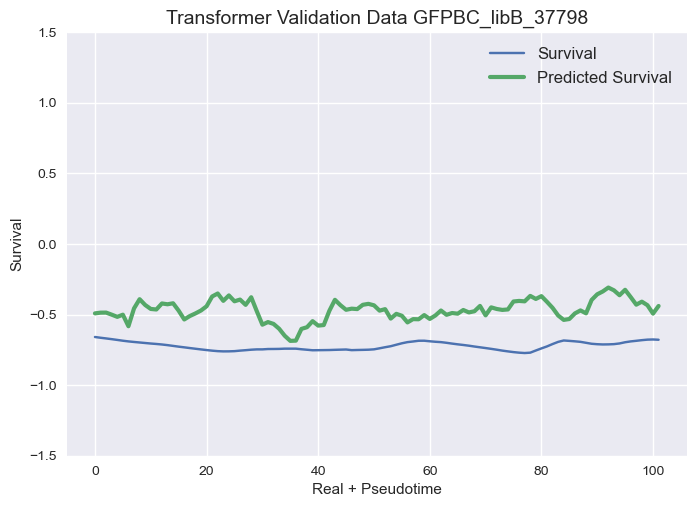

(1534, 8, 72) (102, 8, 72)
77/77 [==============================] - 0s 3ms/step - loss: 0.0608 - mean_squared_error: 0.0608 - val_loss: 0.1868 - val_mean_squared_error: 0.1868
Epoch 5/20
36/36 [==============================] - 0s 3ms/step - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.6413 - val_mean_squared_error: 0.6413
Epoch 15/20
52/52 [==============================] - 0s 7ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0959 - val_mean_squared_error: 0.0959
Epoch 20/20
36/36 [==============================] - 0s 3ms/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.6561 - val_mean_squared_error: 0.6561
Epoch 16/20
3/3 [==============================] - 0s 4ms/step loss: 0.0060 - mean_squared_error: 0.00
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0006
Transformer Validation MSE - MSE: 0.1488
36/36 [==============================] - 0s 3ms/step - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.6134 - val_mean

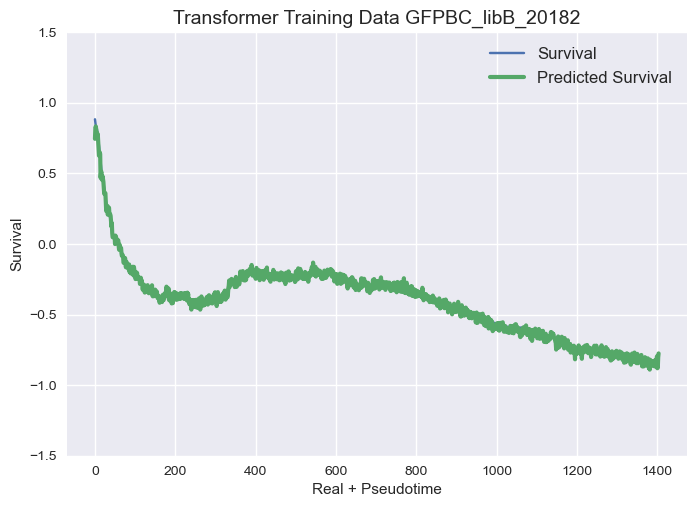

17/52 [========>.....................] - ETA: 0s - loss: 0.0534 - mean_squared_error: 0.05

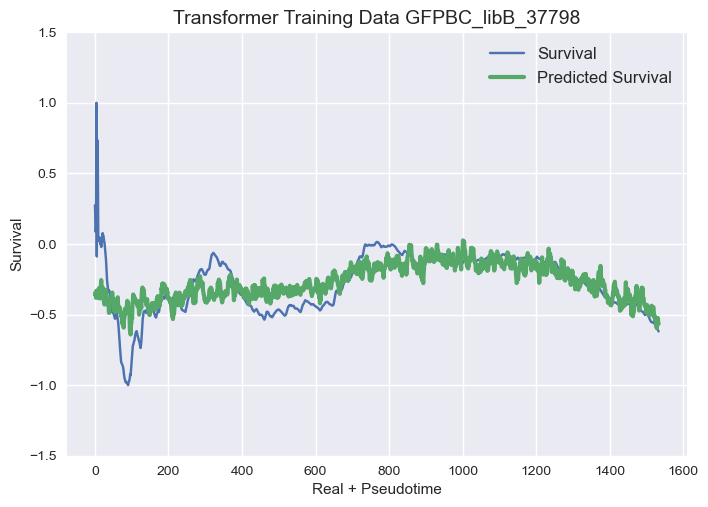

77/77 [==============================] - 0s 3ms/step - loss: 0.0534 - mean_squared_error: 0.0534 - val_loss: 0.1676 - val_mean_squared_error: 0.1676
Epoch 9/20
4/4 [==============================] - 0s 4ms/step loss: 0.0518 - mean_squared_error: 0.05
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0014
Transformer Validation MSE - MSE: 0.0963
66/77 [========================>.....] - ETA: 0s - loss: 0.0549 - mean_squared_error: 0.0549

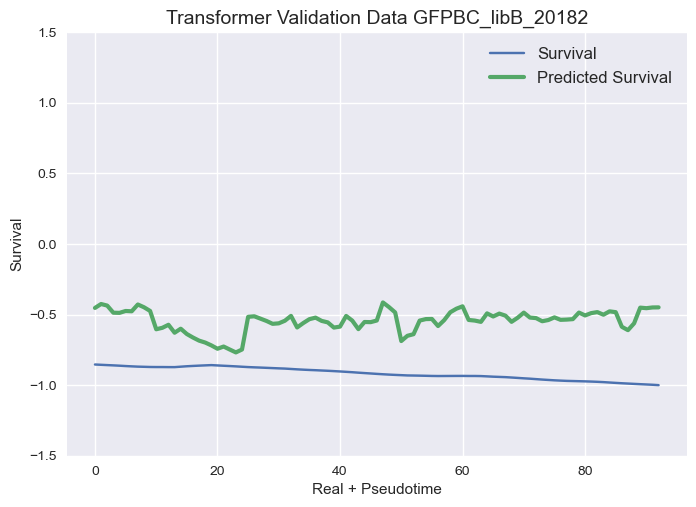

77/77 [==============================] - 0s 3ms/step - loss: 0.0537 - mean_squared_error: 0.0537 - val_loss: 0.1586 - val_mean_squared_error: 0.1586
Epoch 10/20
21/77 [=======>......................] - ETA: 0s - loss: 0.0554 - mean_squared_error: 0.0554 
Evaluation metrics Regr
Regr Training Data - MSE: 0.0389
Regr Validation Data - MSE: 0.1224
77/77 [==============================] - 0s 6ms/step - loss: 0.0530 - mean_squared_error: 0.0530 - val_loss: 0.1469 - val_mean_squared_error: 0.1469
Epoch 11/20
37/77 [=============>................] - ETA: 0s - loss: 0.0480 - mean_squared_error: 0.0480

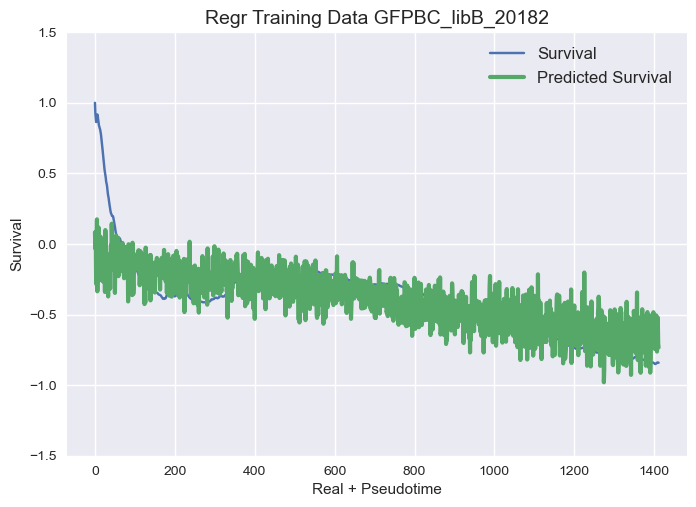

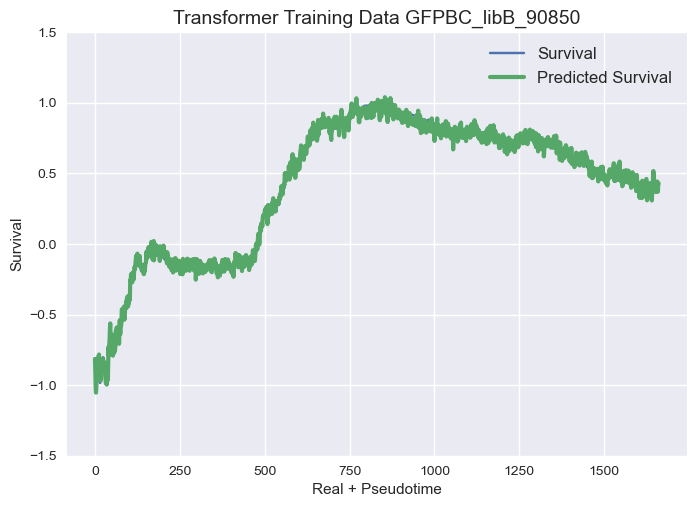

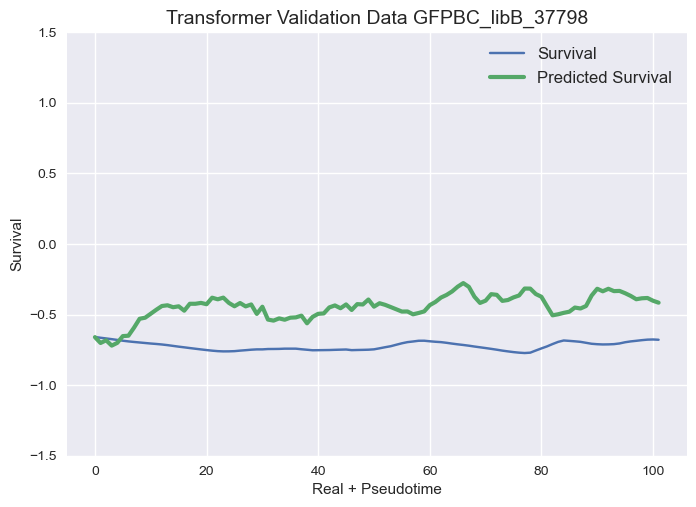

(1534, 8, 72) (102, 8, 72)
77/77 [==============================] - 0s 4ms/step - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.1954 - val_mean_squared_error: 0.1954
Epoch 12/20
43/48 [=========================>....] - ETA: 0s - loss: 0.0508 - mean_squared_error: 0.05

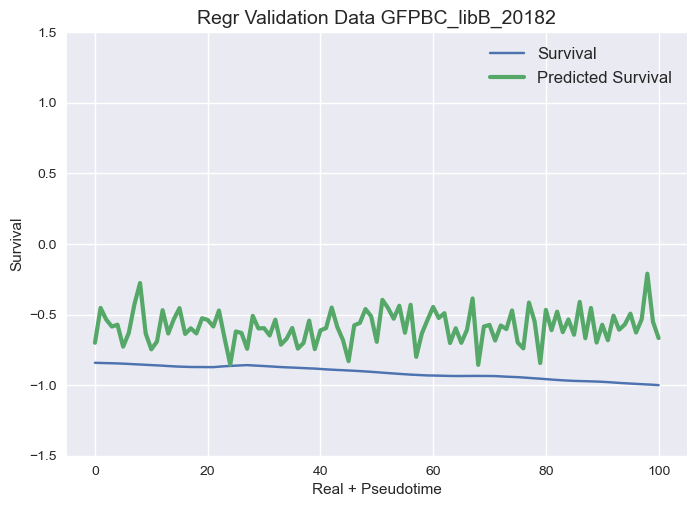

77/77 [==============================] - 0s 4ms/step - loss: 0.0503 - mean_squared_error: 0.0503 - val_loss: 0.1668 - val_mean_squared_error: 0.1668
Epoch 13/20
1/4 [======>.......................] - ETA: 0s0s - loss: 0.0408 - mean_squared_error: 0.0408

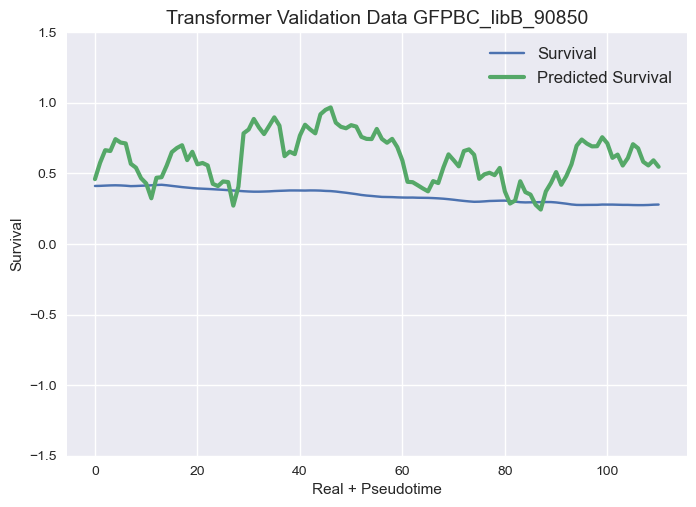

(1661, 8, 72) (111, 8, 72)
4/4 [==============================] - 0s 4ms/step loss: 0.0491 - mean_squared_error: 0.04
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0015
Transformer Validation MSE - MSE: 0.0720
77/77 [==============================] - 0s 4ms/step - loss: 0.0490 - mean_squared_error: 0.0490 - val_loss: 0.1538 - val_mean_squared_error: 0.1538
Epoch 14/20
44/77 [================>.............] - ETA: 0s - loss: 0.0497 - mean_squared_error: 0.0497

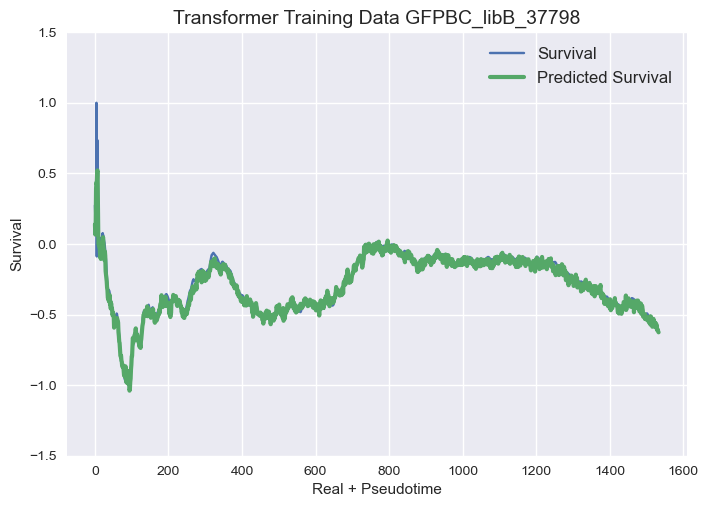

4/4 [==============================] - 0s 3ms/step loss: 0.0484 - mean_squared_error: 0.04
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0210
Transformer Validation MSE - MSE: 0.0441
77/77 [==============================] - 0s 5ms/step - loss: 0.0484 - mean_squared_error: 0.0484 - val_loss: 0.1793 - val_mean_squared_error: 0.1793
Epoch 15/20
57/77 [=====================>........] - ETA: 0s - loss: 0.0469 - mean_squared_error: 0.0469

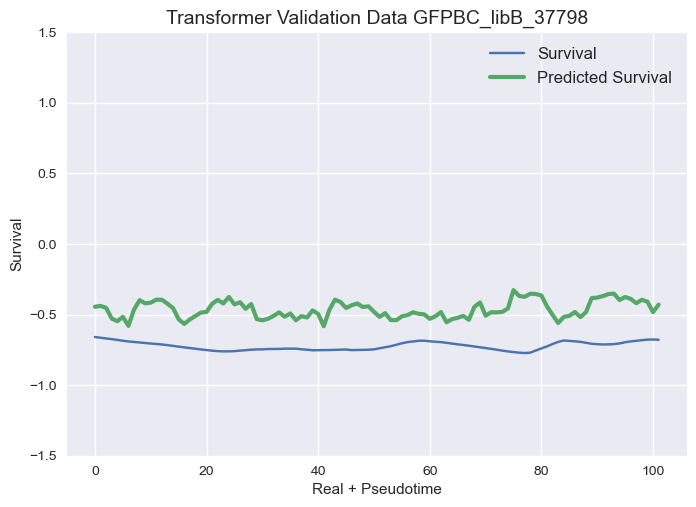

71/77 [==========================>...] - ETA: 0s - loss: 0.0474 - mean_squared_error: 0.0474Regr Training/Val set shapes (varies depending on barcode)  (1542, 72) (110, 72)
 
Evaluation metrics Regr
Regr Training Data - MSE: 0.0372
77/77 [==============================] - 0s 5ms/step - loss: 0.0480 - mean_squared_error: 0.0480 - val_loss: 0.1640 - val_mean_squared_error: 0.1640
Epoch 16/20
77/77 [==============================] - 0s 5ms/step - loss: 0.0474 - mean_squared_error: 0.0474 - val_loss: 0.1223 - val_mean_squared_error: 0.1223
Epoch 17/20
50/77 [==================>...........] - ETA: 0s - loss: 0.0451 - mean_squared_error: 0.0451

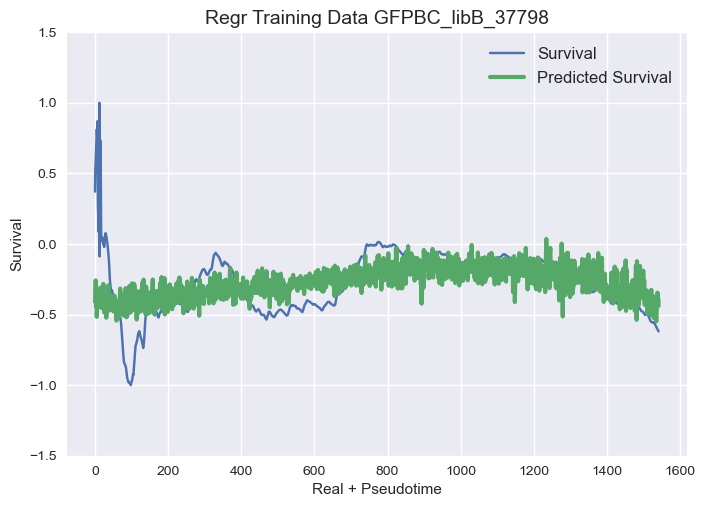

36/36 [==============================] - 2s 21ms/step - loss: 0.0486 - mean_squared_error: 0.0486 - val_loss: 0.5751 - val_mean_squared_error: 0.5751
Epoch 2/20
77/77 [==============================] - 0s 4ms/step - loss: 0.0471 - mean_squared_error: 0.0471 - val_loss: 0.1750 - val_mean_squared_error: 0.1750
Epoch 18/20
25/36 [===================>..........] - ETA: 0s - loss: 0.0146 - mean_squared_error: 0.0146

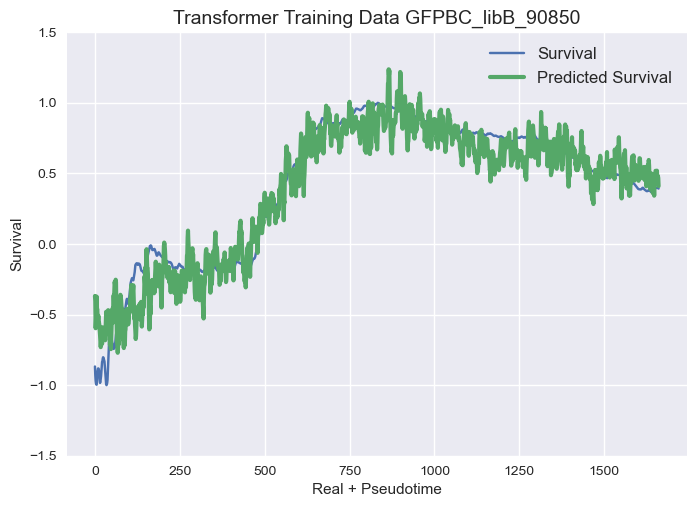

31/36 [========================>.....] - ETA: 0s - loss: 0.0137 - mean_squared_error: 0.0137

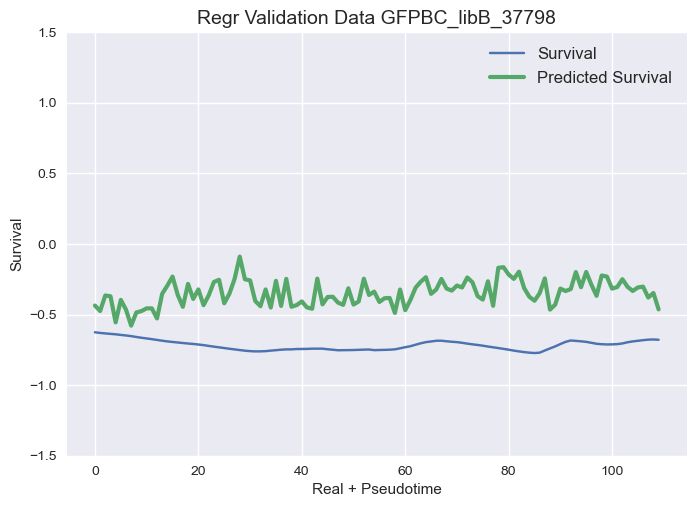

77/77 [==============================] - 0s 4ms/step - loss: 0.0466 - mean_squared_error: 0.0466 - val_loss: 0.1642 - val_mean_squared_error: 0.1642
Epoch 19/20
36/36 [==============================] - 0s 11ms/step - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.6304 - val_mean_squared_error: 0.6304
Epoch 3/20
77/77 [==============================] - 0s 4ms/step - loss: 0.0457 - mean_squared_error: 0.0457 - val_loss: 0.1487 - val_mean_squared_error: 0.1487
Epoch 20/20
22/36 [=================>............] - ETA: 0s - loss: 0.0100 - mean_squared_error: 0.0100

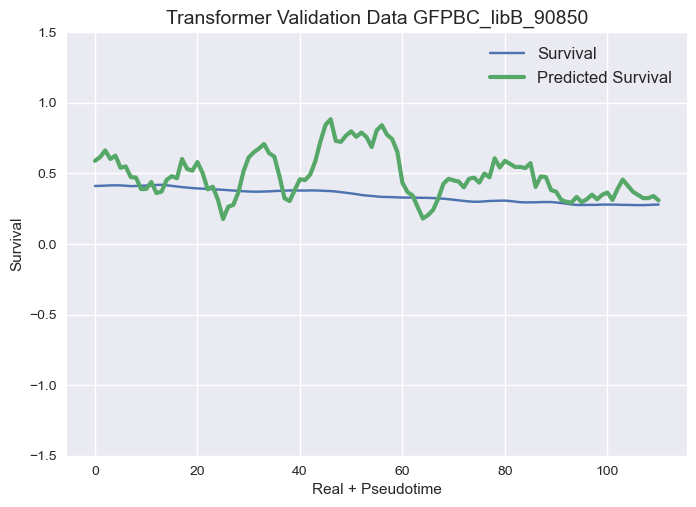

(1661, 8, 72) (111, 8, 72)
36/36 [==============================] - 0s 11ms/step - loss: 0.0091 - mean_squared_error: 0.0091 - val_loss: 0.6307 - val_mean_squared_error: 0.6307
Epoch 4/20
36/36 [==============================] - 0s 11ms/step - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.6680 - val_mean_squared_error: 0.6680
Epoch 5/20
 1/36 [..............................] - ETA: 0s - loss: 0.0054 - mean_squared_error: 0.0054 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0015
Transformer Validation MSE - MSE: 0.0977
36/36 [==============================] - 0s 12ms/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.5929 - val_mean_squared_error: 0.5929
Epoch 6/20
27/36 [=====================>........] - ETA: 0s - loss: 0.0054 - mean_squared_error: 0.0054

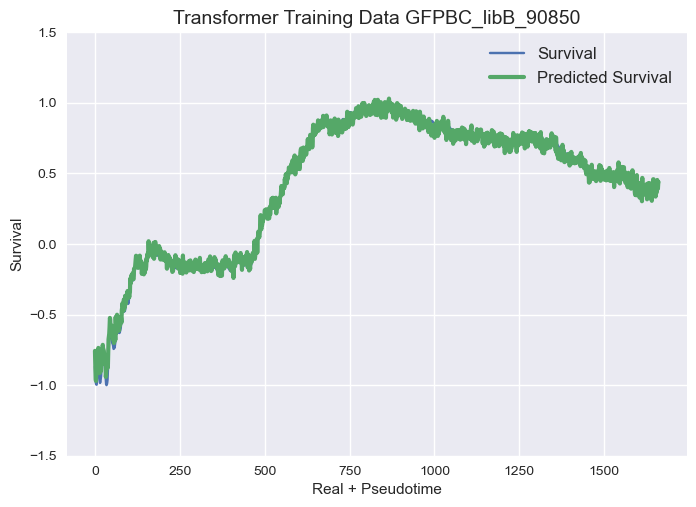

36/36 [==============================] - 0s 11ms/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.6342 - val_mean_squared_error: 0.6342
Epoch 7/20
36/36 [==============================] - 0s 10ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.4683 - val_mean_squared_error: 0.4683
Epoch 8/20
27/36 [=====================>........] - ETA: 0s - loss: 0.0037 - mean_squared_error: 0.0037

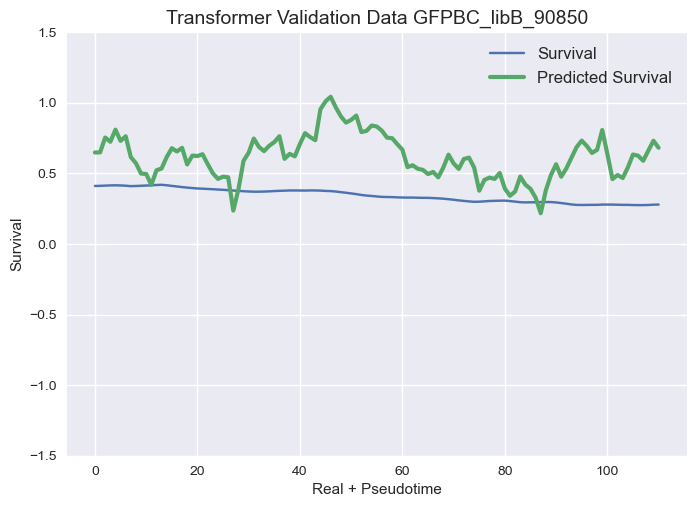

60/60 [==============================] - 3s 20ms/step - loss: 0.0528 - mean_squared_error: 0.0528 - val_loss: 0.0064 - val_mean_squared_error: 0.0064
Epoch 2/20
36/36 [==============================] - 0s 10ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.5542 - val_mean_squared_error: 0.5542
(119, 72)
Epoch 9/20
 5/36 [===>..........................] - ETA: 0s - loss: 0.0027 - mean_squared_error: 0.0027 
Evaluation metrics Regr
Regr Training Data - MSE: 0.0897
36/36 [==============================] - 1s 15ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.4841 - val_mean_squared_error: 0.4841
Epoch 10/20
60/60 [==============================] - 1s 14ms/step - loss: 0.0242 - mean_squared_error: 0.0242 - val_loss: 0.0097 - val_mean_squared_error: 0.0097
Epoch 3/20
36/36 [==============================] - 0s 9ms/step - loss: 0.0030 - mean_squared_error: 0.0030 - val_loss: 0.5109 - val_mean_squared_error: 0.5109
Epoch 11/20


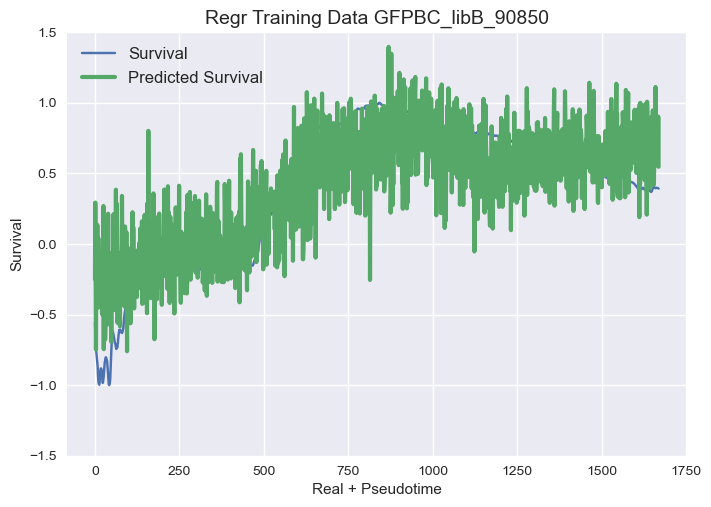

36/36 [==============================] - 0s 10ms/step - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.5277 - val_mean_squared_error: 0.5277
Epoch 12/20
55/60 [==========================>...] - ETA: 0s - loss: 0.0143 - mean_squared_error: 0.0143

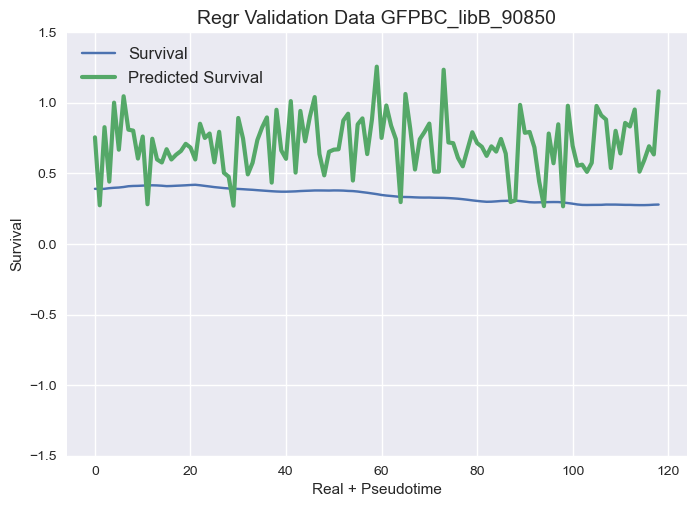

60/60 [==============================] - 1s 10ms/step - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0206 - val_mean_squared_error: 0.0206
Epoch 4/20
36/36 [==============================] - 0s 10ms/step - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.5372 - val_mean_squared_error: 0.5372
Epoch 13/20
36/36 [==============================] - 0s 10ms/step - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.5393 - val_mean_squared_error: 0.5393
Epoch 14/20
60/60 [==============================] - 1s 11ms/step - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0193 - val_mean_squared_error: 0.0193
Epoch 5/20
36/36 [==============================] - 0s 11ms/step - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.5563 - val_mean_squared_error: 0.5563
Epoch 15/20
36/36 [==============================] - 0s 10ms/step - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.5187 - val_mean_squared_error: 0.5187
Epoch 16/20
60/60 [=======================

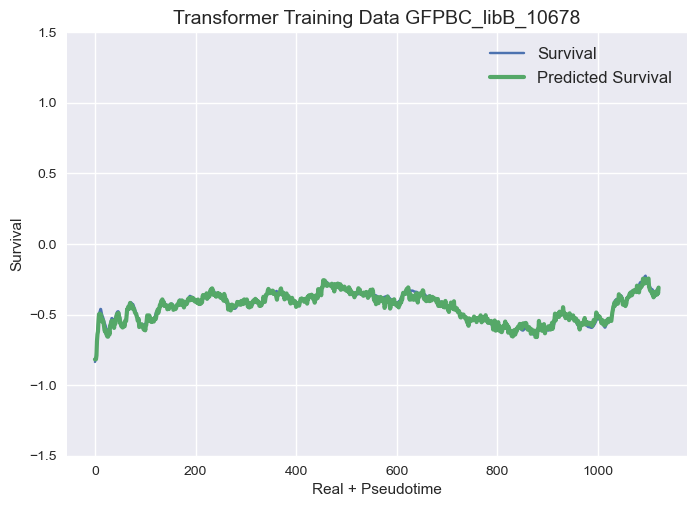

66/66 [==============================] - 1s 9ms/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.2739 - val_mean_squared_error: 0.2739
Epoch 6/20
77/77 [==============================] - 1s 8ms/step - loss: 0.0151 - mean_squared_error: 0.0151 - val_loss: 0.1617 - val_mean_squared_error: 0.1617
Epoch 6/20
60/60 [==============================] - 1s 9ms/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0099 - val_mean_squared_error: 0.0099
Epoch 11/20
 7/60 [==>...........................] - ETA: 0s - loss: 0.0038 - mean_squared_error: 0.0038

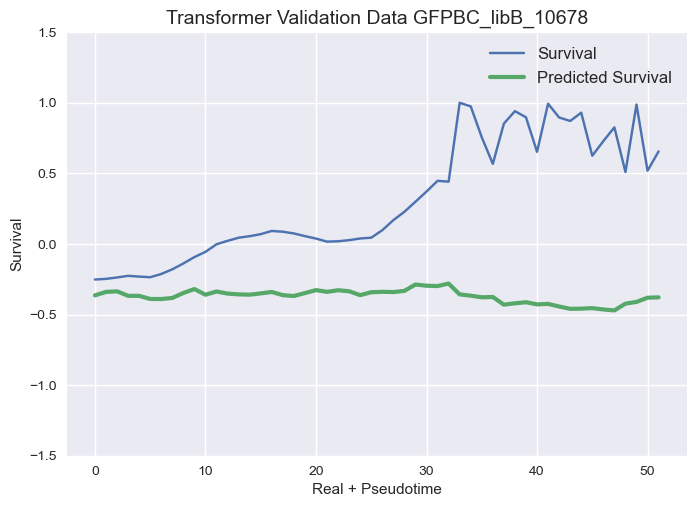

(1122, 8, 72) (52, 8, 72)
58/66 [=========================>....] - ETA: 0s - loss: 0.0037 - mean_squared_error: 0.0037 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0038
Transformer Validation MSE - MSE: 0.6023
66/66 [==============================] - 1s 9ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - val_loss: 0.2388 - val_mean_squared_error: 0.2388
Epoch 7/20
60/60 [==============================] - 1s 9ms/step - loss: 0.0031 - mean_squared_error: 0.0031 - val_loss: 0.0084 - val_mean_squared_error: 0.0084
Epoch 12/20
77/77 [==============================] - 1s 8ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.1992 - val_mean_squared_error: 0.1992
Epoch 7/20
25/60 [===========>..................] - ETA: 0s - loss: 0.0033 - mean_squared_error: 0.0033

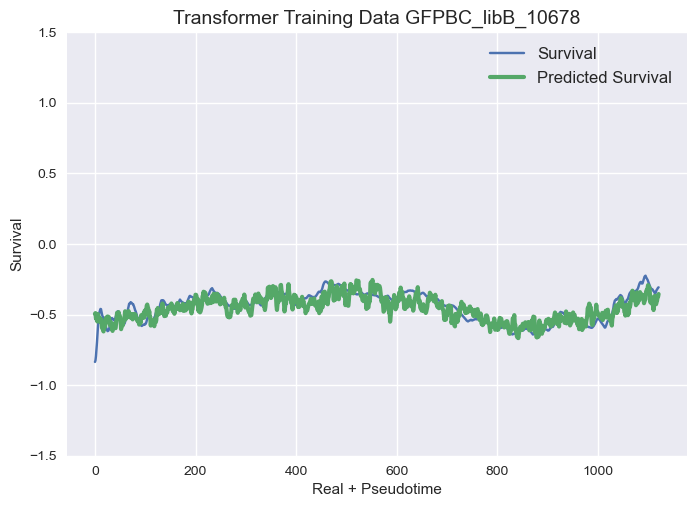

60/60 [==============================] - 1s 9ms/step - loss: 0.0031 - mean_squared_error: 0.0031 - val_loss: 0.0072 - val_mean_squared_error: 0.0072
Epoch 13/20
71/71 [==============================] - 1s 9ms/step - loss: 0.0329 - mean_squared_error: 0.0329 - val_loss: 0.1686 - val_mean_squared_error: 0.1686
Epoch 3/20
13/66 [====>.........................] - ETA: 0s - loss: 0.0028 - mean_squared_error: 0.0028

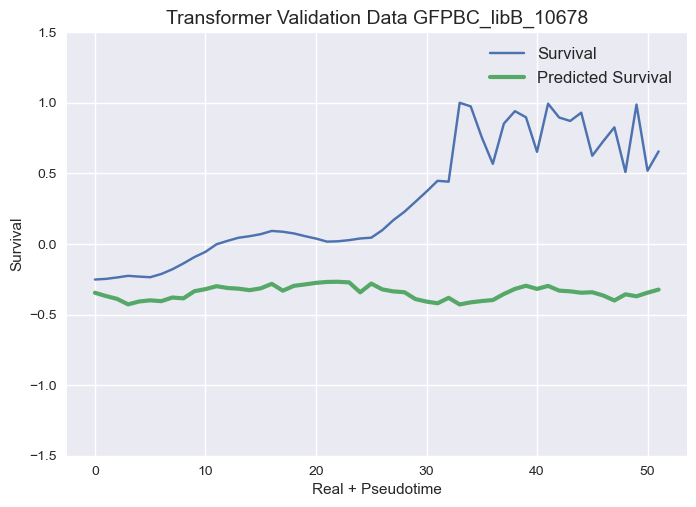

77/77 [==============================] - 1s 9ms/step - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.1934 - val_mean_squared_error: 0.1934
Epoch 8/20
2/2 [==============================] - 0s 6ms/step loss: 0.0030 - mean_squared_error: 0.00
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0012
Transformer Validation MSE - MSE: 0.5129
60/60 [==============================] - 1s 10ms/step - loss: 0.0030 - mean_squared_error: 0.0030 - val_loss: 0.0101 - val_mean_squared_error: 0.0101
Epoch 14/20
66/66 [==============================] - 1s 9ms/step - loss: 0.0033 - mean_squared_error: 0.0033 - val_loss: 0.2700 - val_mean_squared_error: 0.2700
Epoch 9/20
71/71 [==============================] - 1s 9ms/step - loss: 0.0203 - mean_squared_error: 0.0203 - val_loss: 0.4062 - val_mean_squared_error: 0.4062
Epoch 4/20
77/77 [==============================] - 1s 8ms/step - loss: 0.0084 - mean_squared_error: 0.0084 - val_loss: 0.1475 - val_mean_squared_error: 0.1475
Epoch

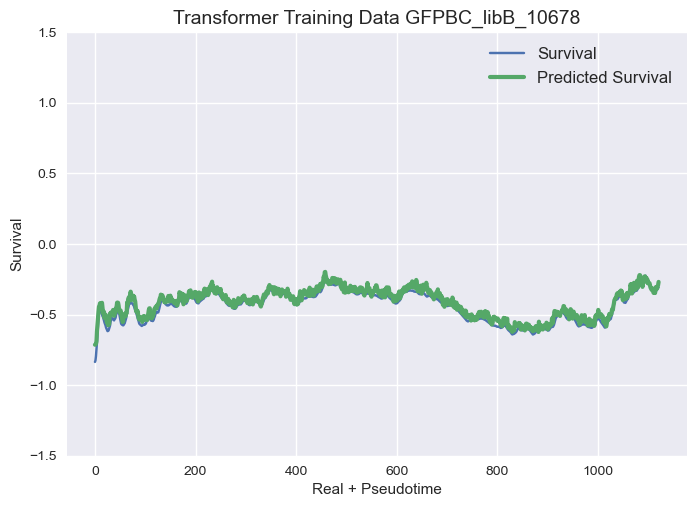

60/60 [==============================] - 1s 9ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 15/20
13/66 [====>.........................] - ETA: 0s - loss: 0.0026 - mean_squared_error: 0.0026

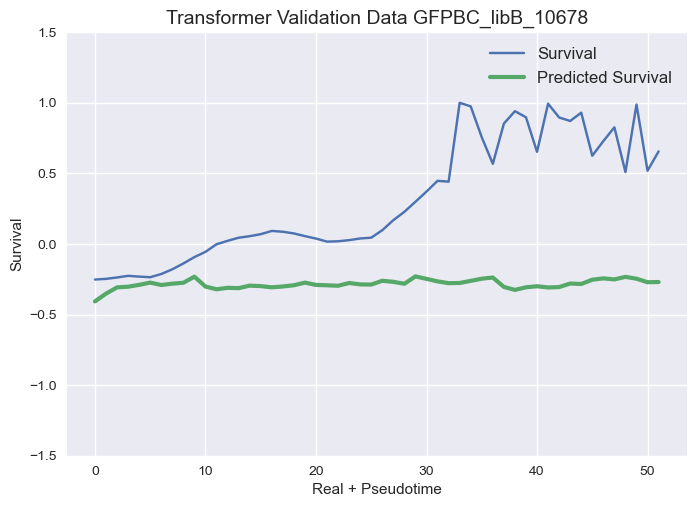

71/71 [==============================] - 1s 9ms/step - loss: 0.0139 - mean_squared_error: 0.0139 - val_loss: 0.2891 - val_mean_squared_error: 0.2891
Epoch 5/20
77/77 [==============================] - 1s 8ms/step - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.1691 - val_mean_squared_error: 0.1691
Epoch 10/20
44/60 [=====================>........] - ETA: 0s - loss: 0.0025 - mean_squared_error: 0.0025 
Evaluation metrics Regr
Regr Training Data - MSE: 0.0096
Regr Validation Data - MSE: 0.5939
60/60 [==============================] - 1s 12ms/step - loss: 0.0025 - mean_squared_error: 0.0025 - val_loss: 0.0080 - val_mean_squared_error: 0.0080
Epoch 16/20
 7/66 [==>...........................] - ETA: 0s - loss: 0.0029 - mean_squared_error: 0.0029

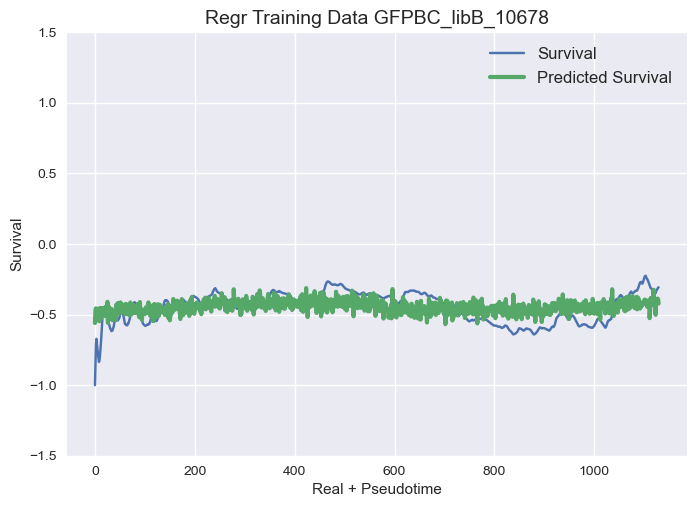

71/71 [==============================] - 1s 11ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.3326 - val_mean_squared_error: 0.3326
Epoch 6/20
77/77 [==============================] - 1s 10ms/step - loss: 0.0068 - mean_squared_error: 0.0068 - val_loss: 0.2248 - val_mean_squared_error: 0.2248
Epoch 11/20
60/60 [==============================] - 1s 9ms/step - loss: 0.0028 - mean_squared_error: 0.0028 - val_loss: 0.0103 - val_mean_squared_error: 0.0103
Epoch 17/20
32/71 [============>.................] - ETA: 0s - loss: 0.0097 - mean_squared_error: 0.0097

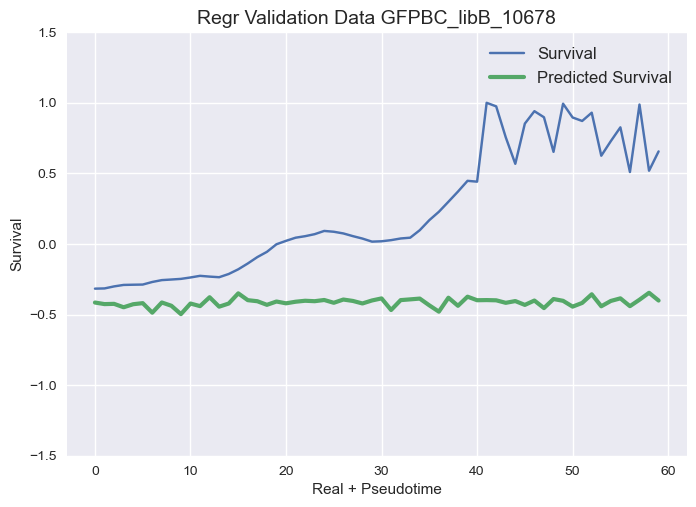

66/66 [==============================] - 1s 9ms/step - loss: 0.0026 - mean_squared_error: 0.0026 - val_loss: 0.3230 - val_mean_squared_error: 0.3230
Epoch 12/20
77/77 [==============================] - 1s 8ms/step - loss: 0.0057 - mean_squared_error: 0.0057 - val_loss: 0.1858 - val_mean_squared_error: 0.1858
Epoch 12/20
60/60 [==============================] - 1s 9ms/step - loss: 0.0026 - mean_squared_error: 0.0026 - val_loss: 0.0082 - val_mean_squared_error: 0.0082
Epoch 18/20
71/71 [==============================] - 1s 9ms/step - loss: 0.0077 - mean_squared_error: 0.0077 - val_loss: 0.3821 - val_mean_squared_error: 0.3821
Epoch 8/20
77/77 [==============================] - 1s 8ms/step - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.1268 - val_mean_squared_error: 0.1268
Epoch 13/20
60/60 [==============================] - 1s 9ms/step - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.0100 - val_mean_squared_error: 0.0100
Epoch 19/20
60/60 [============================

60/60 [==============================] - 0s 3ms/step - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0184 - val_mean_squared_error: 0.0184
Epoch 13/20
6/6 [==============================] - 0s 3ms/step loss: 0.0045 - mean_squared_error: 0.00
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0024
Transformer Validation MSE - MSE: 0.1572
60/60 [==============================] - 0s 3ms/step - loss: 0.0192 - mean_squared_error: 0.0192 - val_loss: 0.0181 - val_mean_squared_error: 0.0181
Epoch 14/20
71/71 [==============================] - 1s 8ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.2954 - val_mean_squared_error: 0.2954
Epoch 17/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0165 - val_mean_squared_error: 0.0165
Epoch 15/20
38/71 [===============>..............] - ETA: 0s - loss: 0.0038 - mean_squared_error: 0.0038

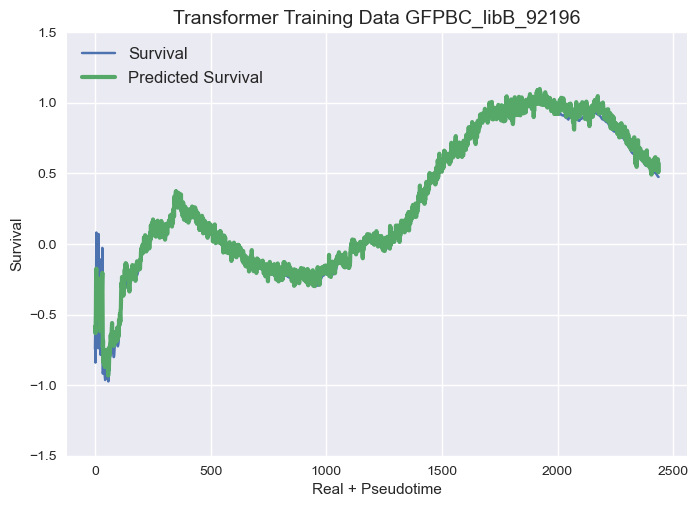

60/60 [==============================] - 0s 4ms/step - loss: 0.0180 - mean_squared_error: 0.0180 - val_loss: 0.0185 - val_mean_squared_error: 0.0185
Epoch 16/20
60/60 [==============================] - 0s 4ms/step - loss: 0.0171 - mean_squared_error: 0.0171 - val_loss: 0.0193 - val_mean_squared_error: 0.0193
Epoch 17/20
60/60 [==============================] - 0s 4ms/step - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0190 - val_mean_squared_error: 0.0190
Epoch 18/20
66/66 [==============================] - 1s 6ms/step - loss: 0.0551 - mean_squared_error: 0.0551 - val_loss: 0.5450 - val_mean_squared_error: 0.5450
Epoch 2/20
16/60 [=======>......................] - ETA: 0s - loss: 0.0186 - mean_squared_error: 0.0186

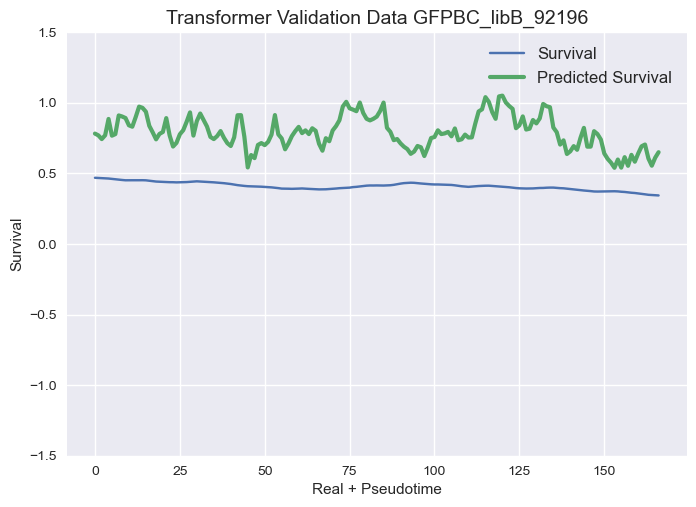

(2438, 8, 72) (167, 8, 72)
60/60 [==============================] - 0s 4ms/step - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0184 - val_mean_squared_error: 0.0184
Epoch 19/20
66/66 [==============================] - 0s 5ms/step - loss: 0.0197 - mean_squared_error: 0.0197 - val_loss: 0.5615 - val_mean_squared_error: 0.5615
Epoch 3/20
60/60 [==============================] - 0s 4ms/step - loss: 0.0153 - mean_squared_error: 0.0153 - val_loss: 0.0177 - val_mean_squared_error: 0.0177
Epoch 20/20
 1/60 [..............................] - ETA: 0s - loss: 0.0122 - mean_squared_error: 0.0122 
Transformer Evaluation metrics
46/66 [===================>..........] - ETA: 0s - loss: 0.0179 - mean_squared_error: 0.0179Transformer Training MSE - MSE: 0.0408
Transformer Validation MSE - MSE: 0.2029
66/66 [==============================] - 0s 4ms/step - loss: 0.0170 - mean_squared_error: 0.0170 - val_loss: 0.5923 - val_mean_squared_error: 0.5923
Epoch 4/20
71/71 [===========================

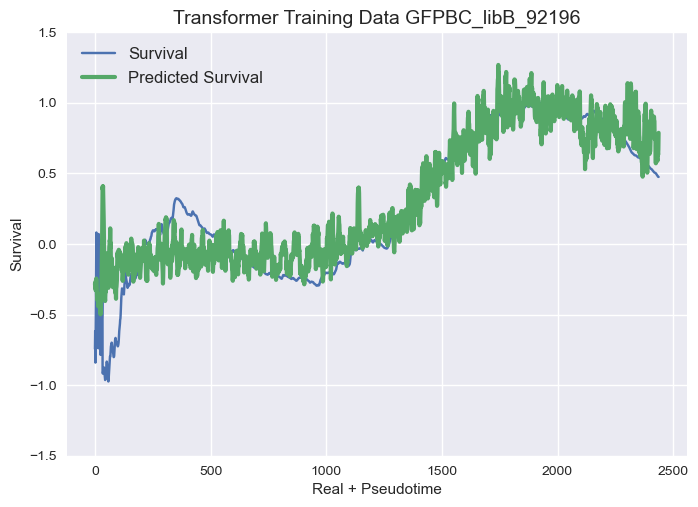

66/66 [==============================] - 0s 5ms/step - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.5099 - val_mean_squared_error: 0.5099
Epoch 7/20
71/71 [==============================] - 1s 14ms/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.3356 - val_mean_squared_error: 0.3356
Epoch 20/20
66/66 [==============================] - 0s 5ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.5296 - val_mean_squared_error: 0.5296
Epoch 8/20
25/71 [=========>....................] - ETA: 0s - loss: 0.0034 - mean_squared_error: 0.0034

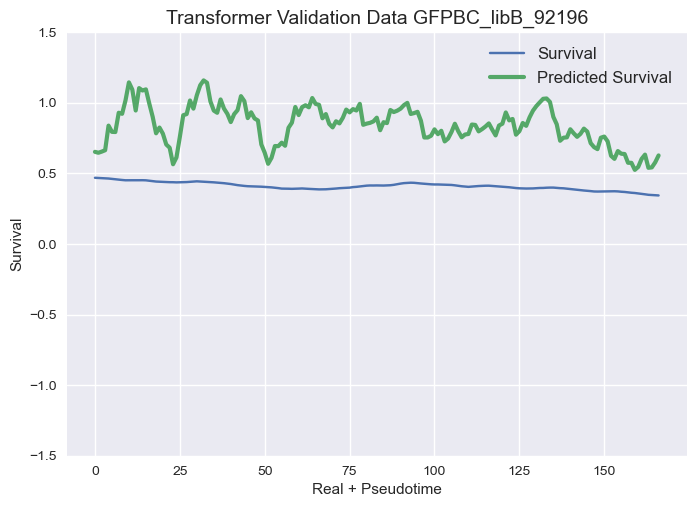

(2438, 8, 72) (167, 8, 72)
66/66 [==============================] - 0s 5ms/step - loss: 0.0100 - mean_squared_error: 0.0100 - val_loss: 0.4941 - val_mean_squared_error: 0.4941
Epoch 9/20
66/66 [==============================] - 0s 5ms/step - loss: 0.0094 - mean_squared_error: 0.0094 - val_loss: 0.5089 - val_mean_squared_error: 0.5089
Epoch 10/20
66/66 [==============================] - 0s 5ms/step - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.4807 - val_mean_squared_error: 0.4807
Epoch 11/20
 
 1/66 [..............................] - ETA: 0s - loss: 0.0088 - mean_squared_error: 0.0088
Transformer Training MSE - MSE: 0.0020
Transformer Validation MSE - MSE: 0.2077
66/66 [==============================] - 0s 5ms/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.4718 - val_mean_squared_error: 0.4718
Epoch 12/20
16/60 [=======>......................] - ETA: 0s - loss: 0.1396 - mean_squared_error: 0.1396

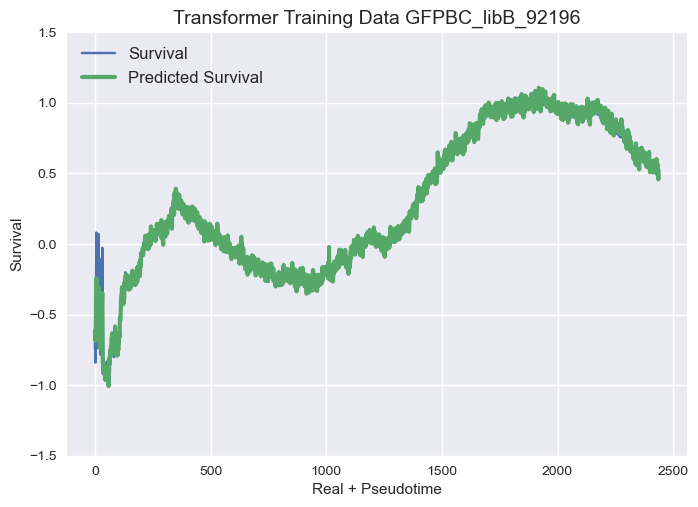

66/66 [==============================] - 0s 4ms/step - loss: 0.0087 - mean_squared_error: 0.0087 - val_loss: 0.4815 - val_mean_squared_error: 0.4815
Epoch 14/20
66/66 [==============================] - 0s 4ms/step - loss: 0.0080 - mean_squared_error: 0.0080 - val_loss: 0.4562 - val_mean_squared_error: 0.4562
Epoch 15/20
60/60 [==============================] - 2s 14ms/step - loss: 0.0643 - mean_squared_error: 0.0643 - val_loss: 0.0096 - val_mean_squared_error: 0.0096
Epoch 2/20
 1/60 [..............................] - ETA: 0s - loss: 0.0545 - mean_squared_error: 0.0545

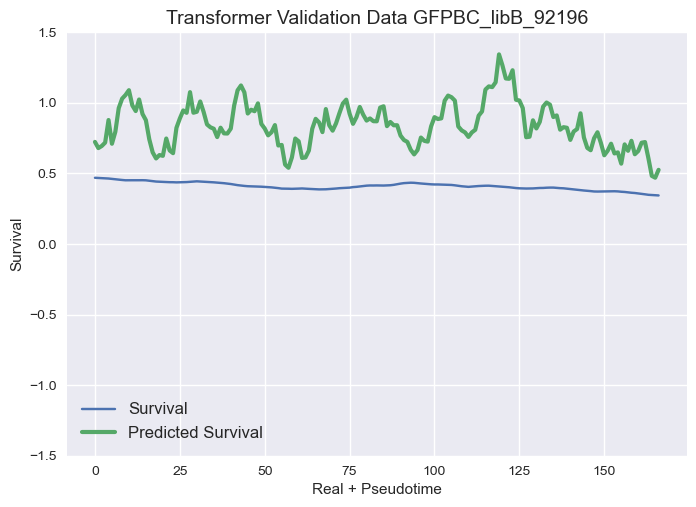

66/66 [==============================] - 0s 5ms/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.4633 - val_mean_squared_error: 0.4633
Epoch 16/20
15/71 [=====>........................] - ETA: 0s - loss: 0.2354 - mean_squared_error: 0.2354   
Evaluation metrics Regr
Regr Training Data - MSE: 0.0906
Regr Validation Data - MSE: 0.1432
66/66 [==============================] - 0s 6ms/step - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.4587 - val_mean_squared_error: 0.4587
Epoch 17/20
66/66 [==============================] - 0s 4ms/step - loss: 0.0082 - mean_squared_error: 0.0082 - val_loss: 0.4740 - val_mean_squared_error: 0.4740
Epoch 18/20
71/71 [==============================] - 2s 7ms/step - loss: 0.1801 - mean_squared_error: 0.1801 - val_loss: 1.0806 - val_mean_squared_error: 1.0806
Epoch 2/20
60/60 [==============================] - 1s 14ms/step - loss: 0.0268 - mean_squared_error: 0.0268 - val_loss: 0.0090 - val_mean_squared_error: 0.0090
Epoch 3/20
66/66 [=

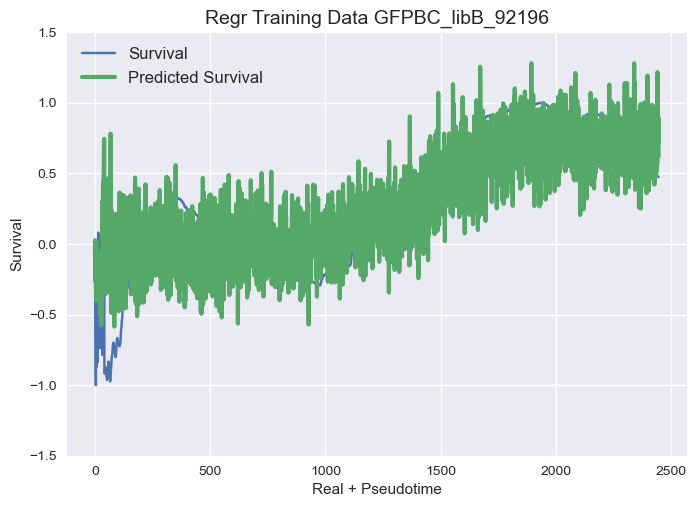

66/66 [==============================] - 0s 4ms/step - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.4750 - val_mean_squared_error: 0.4750
Epoch 20/20
71/71 [==============================] - 0s 3ms/step - loss: 0.1010 - mean_squared_error: 0.1010 - val_loss: 0.2601 - val_mean_squared_error: 0.2601
Epoch 4/20
60/60 [==============================] - 1s 9ms/step - loss: 0.0175 - mean_squared_error: 0.0175 - val_loss: 0.0196 - val_mean_squared_error: 0.0196
Epoch 4/20
71/71 [==============================] - 0s 3ms/step - loss: 0.0627 - mean_squared_error: 0.0627 - val_loss: 0.2977 - val_mean_squared_error: 0.2977
Epoch 5/20
 1/71 [..............................] - ETA: 0s - loss: 0.0936 - mean_squared_error: 0.0936

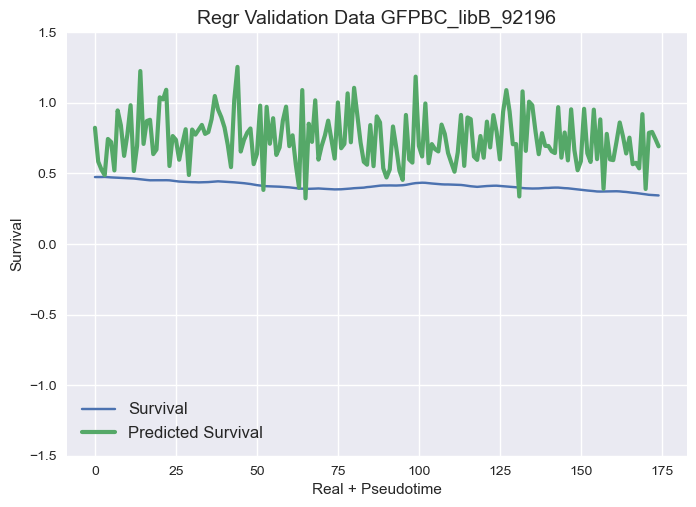

71/71 [==============================] - 0s 4ms/step - loss: 0.0518 - mean_squared_error: 0.0518 - val_loss: 0.3840 - val_mean_squared_error: 0.3840
Epoch 6/20
60/60 [==============================] - 1s 10ms/step - loss: 0.0120 - mean_squared_error: 0.0120 - val_loss: 0.0145 - val_mean_squared_error: 0.0145
Epoch 5/20
71/71 [==============================] - 0s 4ms/step - loss: 0.0494 - mean_squared_error: 0.0494 - val_loss: 0.3879 - val_mean_squared_error: 0.3879
Epoch 7/20
71/71 [==============================] - 0s 5ms/step - loss: 0.0452 - mean_squared_error: 0.0452 - val_loss: 0.2799 - val_mean_squared_error: 0.2799
Epoch 8/20
60/60 [==============================] - 1s 11ms/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0153 - val_mean_squared_error: 0.0153
Epoch 6/20
71/71 [==============================] - 0s 5ms/step - loss: 0.0414 - mean_squared_error: 0.0414 - val_loss: 0.3416 - val_mean_squared_error: 0.3416
Epoch 9/20
71/71 [==============================]

60/60 [==============================] - 0s 8ms/step - loss: 0.0021 - mean_squared_error: 0.0021 - val_loss: 0.0090 - val_mean_squared_error: 0.0090
Epoch 20/20
71/71 [==============================] - 1s 8ms/step - loss: 0.0302 - mean_squared_error: 0.0302 - val_loss: 0.4890 - val_mean_squared_error: 0.4890
Epoch 4/20
104/104 [==============================] - 1s 9ms/step - loss: 0.0105 - mean_squared_error: 0.0105 - val_loss: 0.0601 - val_mean_squared_error: 0.0601
Epoch 6/20
Epoch 12/20
60/60 [==============================] - 0s 8ms/step - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0078 - val_mean_squared_error: 0.0078
(1909, 8, 72) (93, 8, 72)
71/71 [==============================] - 1s 8ms/step - loss: 0.0181 - mean_squared_error: 0.0181 - val_loss: 0.5877 - val_mean_squared_error: 0.5877
Epoch 5/20
 84/104 [=======================>......] - ETA: 0s - loss: 0.0088 - mean_squared_error: 0.0088 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0009
Tran

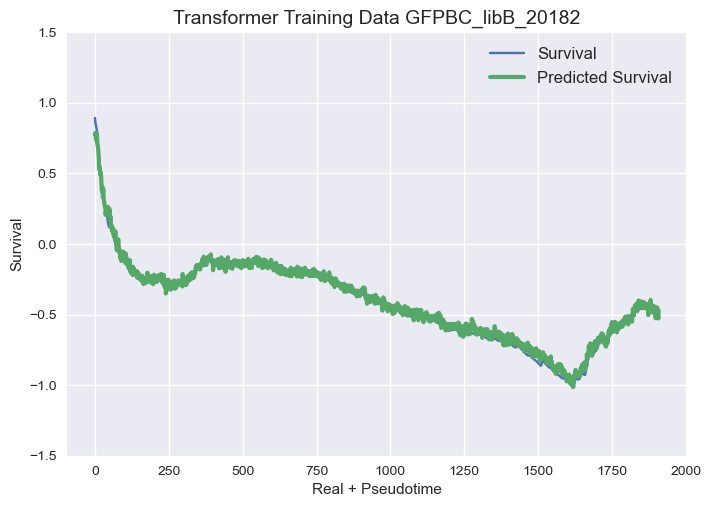

71/71 [==============================] - 1s 7ms/step - loss: 0.0107 - mean_squared_error: 0.0107 - val_loss: 0.5693 - val_mean_squared_error: 0.5693
Epoch 7/20
66/66 [==============================] - 0s 7ms/step - loss: 0.0024 - mean_squared_error: 0.0024 - val_loss: 0.3148 - val_mean_squared_error: 0.3148
Epoch 15/20
18/71 [======>.......................] - ETA: 0s - loss: 0.0085 - mean_squared_error: 0.0085

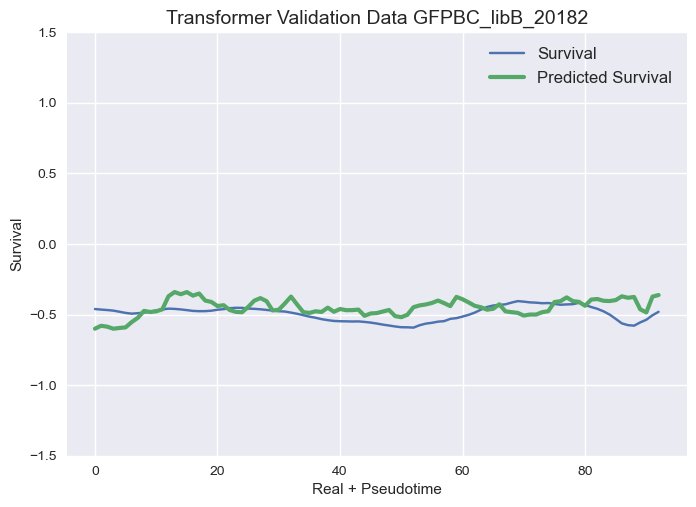

(1909, 8, 72) (93, 8, 72)
104/104 [==============================] - 1s 8ms/step - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0785 - val_mean_squared_error: 0.0785
Epoch 8/20
57/66 [========================>.....] - ETA: 0s - loss: 0.0023 - mean_squared_error: 0.0023 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0111
Transformer Validation MSE - MSE: 0.0195
71/71 [==============================] - 1s 7ms/step - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.6043 - val_mean_squared_error: 0.6043
Epoch 8/20
66/66 [==============================] - 0s 7ms/step - loss: 0.0023 - mean_squared_error: 0.0023 - val_loss: 0.2856 - val_mean_squared_error: 0.2856
Epoch 16/20
 78/104 [=====================>........] - ETA: 0s - loss: 0.0063 - mean_squared_error: 0.0063

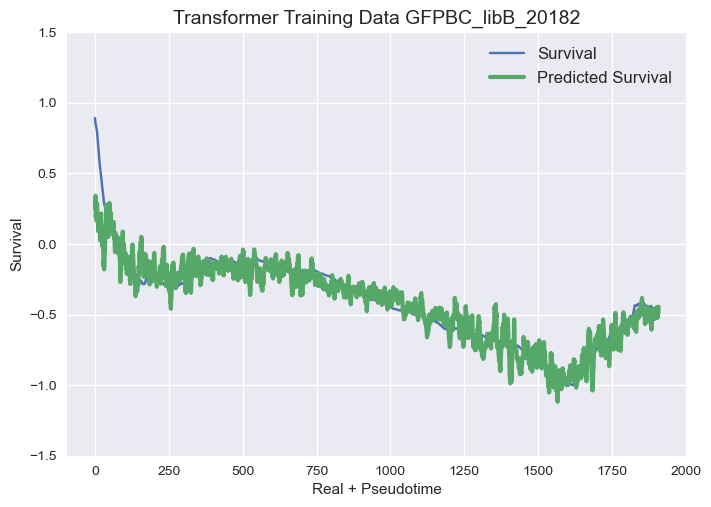

71/71 [==============================] - 1s 7ms/step - loss: 0.0074 - mean_squared_error: 0.0074 - val_loss: 0.6071 - val_mean_squared_error: 0.6071
Epoch 9/20
66/66 [==============================] - 0s 7ms/step - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.3016 - val_mean_squared_error: 0.3016
Epoch 17/20
104/104 [==============================] - 1s 8ms/step - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0986 - val_mean_squared_error: 0.0986
Epoch 9/20
41/66 [=================>............] - ETA: 0s - loss: 0.0020 - mean_squared_error: 0.0020

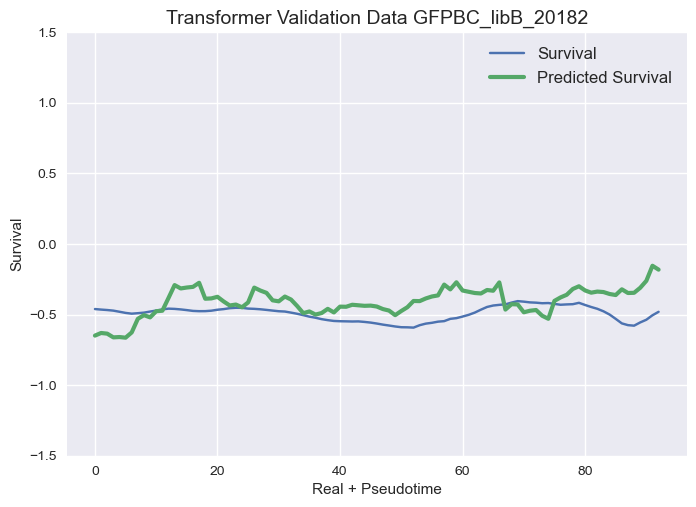

66/66 [==============================] - 0s 7ms/step - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.2789 - val_mean_squared_error: 0.2789
Epoch 18/20
71/71 [==============================] - 1s 7ms/step - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.6332 - val_mean_squared_error: 0.6332
Epoch 10/20
31/71 [============>.................] - ETA: 0s - loss: 0.0061 - mean_squared_error: 0.0061 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0010
Transformer Validation MSE - MSE: 0.0078
104/104 [==============================] - 1s 8ms/step - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0756 - val_mean_squared_error: 0.0756
Epoch 10/20
66/66 [==============================] - 0s 8ms/step - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.2960 - val_mean_squared_error: 0.2960
Epoch 19/20
71/71 [==============================] - 1s 7ms/step - loss: 0.0066 - mean_squared_error: 0.0066 - val_loss: 0.5225 - val_mean_squared_error: 0.5225


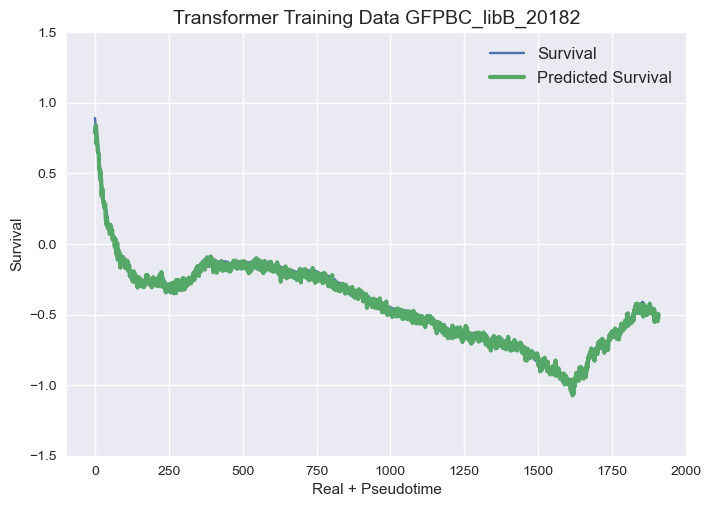

66/66 [==============================] - 0s 7ms/step - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.3244 - val_mean_squared_error: 0.3244
Epoch 20/20
71/71 [==============================] - 1s 7ms/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.6164 - val_mean_squared_error: 0.6164
Epoch 12/20
17/66 [======>.......................] - ETA: 0s - loss: 0.0016 - mean_squared_error: 0.0016

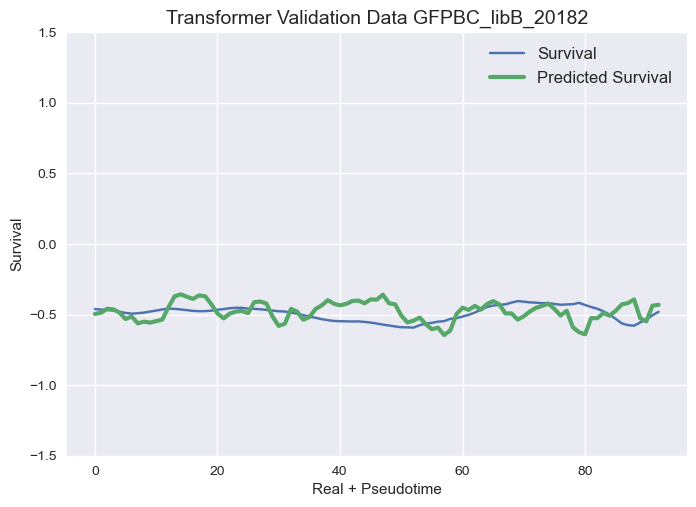

17/71 [======>.......................] - ETA: 0s - loss: 0.0049 - mean_squared_error: 0.0049 
Evaluation metrics Regr
Regr Training Data - MSE: 0.0385
Regr Validation Data - MSE: 0.0336
104/104 [==============================] - 1s 8ms/step - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0834 - val_mean_squared_error: 0.0834
Epoch 11/20
66/66 [==============================] - 1s 9ms/step - loss: 0.0017 - mean_squared_error: 0.0017 - val_loss: 0.2865 - val_mean_squared_error: 0.2865
(2085, 8, 72) (102, 8, 72)
71/71 [==============================] - 1s 8ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - val_loss: 0.5542 - val_mean_squared_error: 0.5542
Epoch 13/20
4/4 [==============================] - 0s 3ms/step loss: 0.0046 - mean_squared_error: 0.00
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0006
Transformer Validation MSE - MSE: 0.3079
71/71 [==============================] - 0s 7ms/step - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0

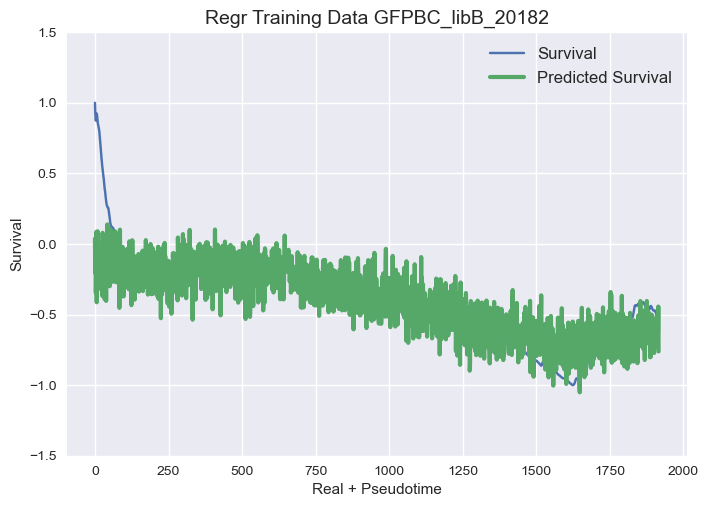

61/71 [========================>.....] - ETA: 0s - loss: 0.0051 - mean_squared_error: 0.0051

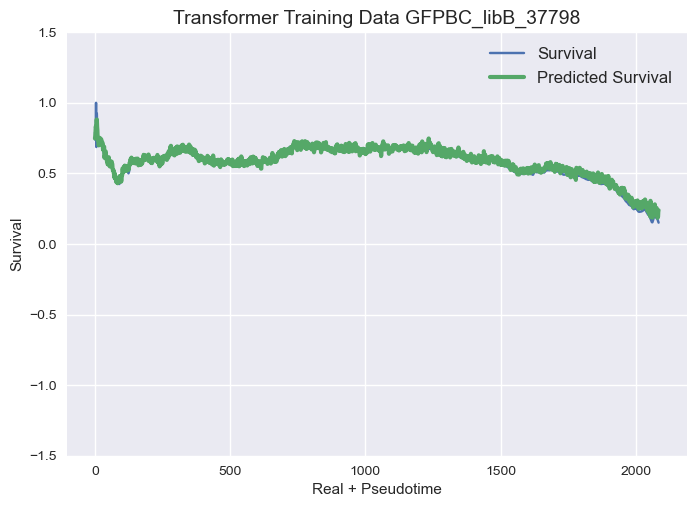

71/71 [==============================] - 0s 7ms/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.6070 - val_mean_squared_error: 0.6070
Epoch 15/20
10/71 [===>..........................] - ETA: 0s - loss: 0.0047 - mean_squared_error: 0.0047

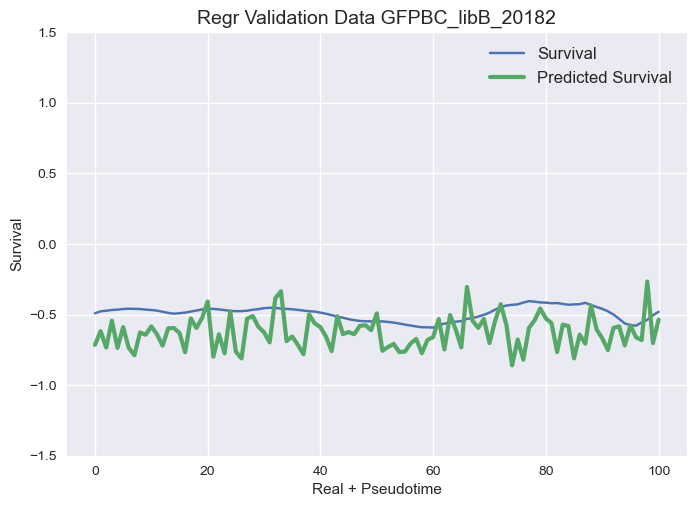

104/104 [==============================] - 1s 8ms/step - loss: 0.0051 - mean_squared_error: 0.0051 - val_loss: 0.0654 - val_mean_squared_error: 0.0654
Epoch 13/20
  1/104 [..............................] - ETA: 0s - loss: 0.0050 - mean_squared_error: 0.0050

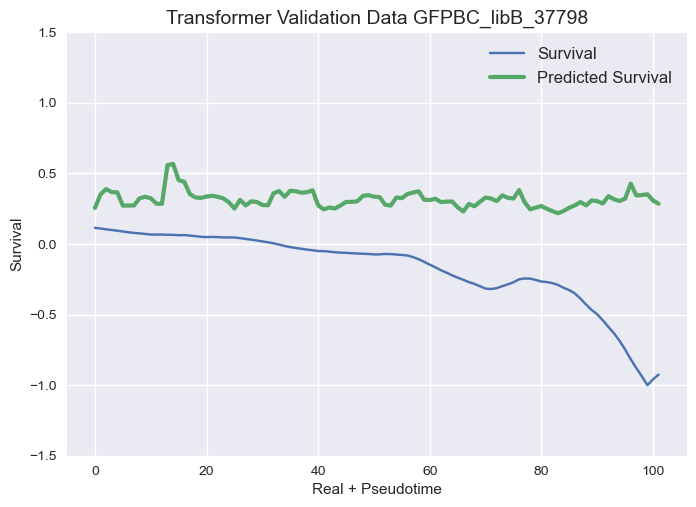

(2085, 8, 72) (102, 8, 72)
71/71 [==============================] - 0s 7ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.6124 - val_mean_squared_error: 0.6124
Epoch 16/20
 49/104 [=============>................] - ETA: 0s - loss: 0.0054 - mean_squared_error: 0.0054Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0048
Transformer Validation MSE - MSE: 0.4574
71/71 [==============================] - 1s 8ms/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.5465 - val_mean_squared_error: 0.5465
Epoch 17/20
19/71 [=======>......................] - ETA: 0s - loss: 0.0038 - mean_squared_error: 0.0038

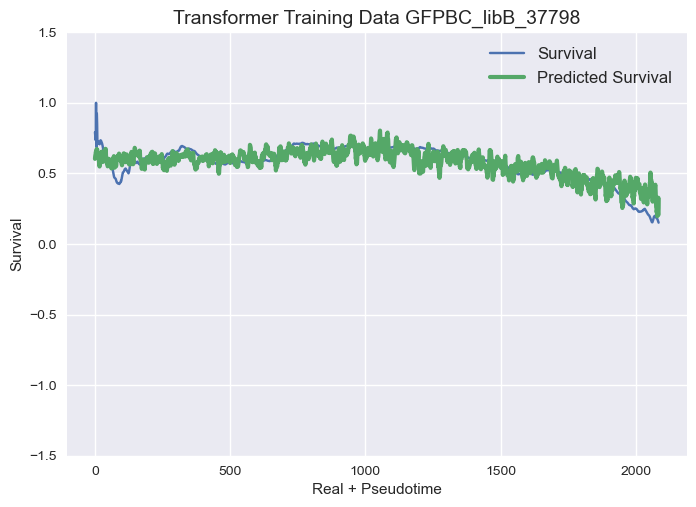

104/104 [==============================] - 1s 9ms/step - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0964 - val_mean_squared_error: 0.0964
Epoch 14/20
71/71 [==============================] - 3s 44ms/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.6141 - val_mean_squared_error: 0.6141
Epoch 18/20
104/104 [==============================] - 3s 28ms/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0932 - val_mean_squared_error: 0.0932
Epoch 15/20
 25/104 [======>.......................] - ETA: 1s - loss: 0.0052 - mean_squared_error: 0.0052

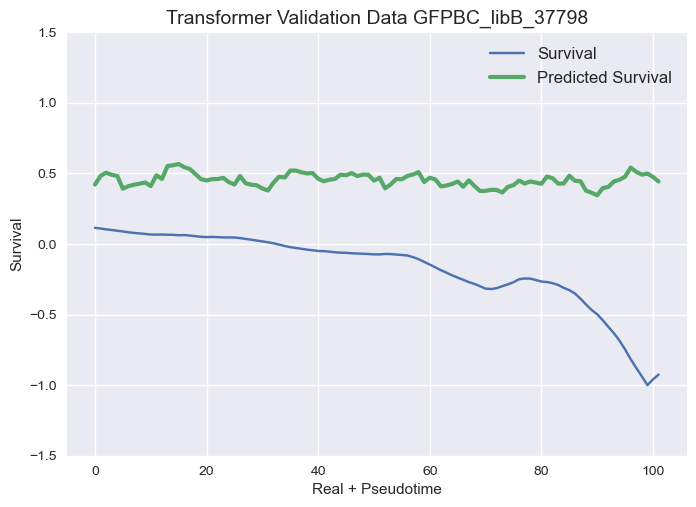

(2085, 8, 72) (102, 8, 72)
71/71 [==============================] - 1s 13ms/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.5936 - val_mean_squared_error: 0.5936
Epoch 19/20
4/4 [==============================] - 0s 5ms/step loss: 0.0042 - mean_squared_error: 0.00
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0007
Transformer Validation MSE - MSE: 0.2865
104/104 [==============================] - 2s 15ms/step - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0809 - val_mean_squared_error: 0.0809
Epoch 16/20
67/71 [===========================>..] - ETA: 0s - loss: 0.0042 - mean_squared_error: 0.0042

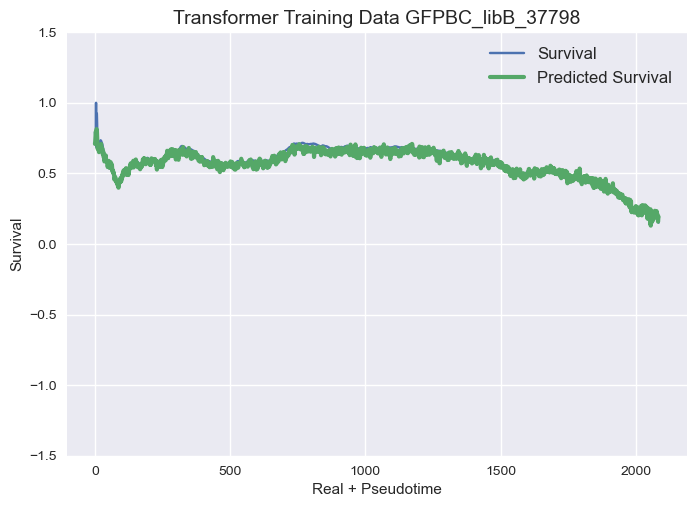

71/71 [==============================] - 1s 13ms/step - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.6176 - val_mean_squared_error: 0.6176
Epoch 20/20
 66/104 [==================>...........] - ETA: 0s - loss: 0.0040 - mean_squared_error: 0.0040

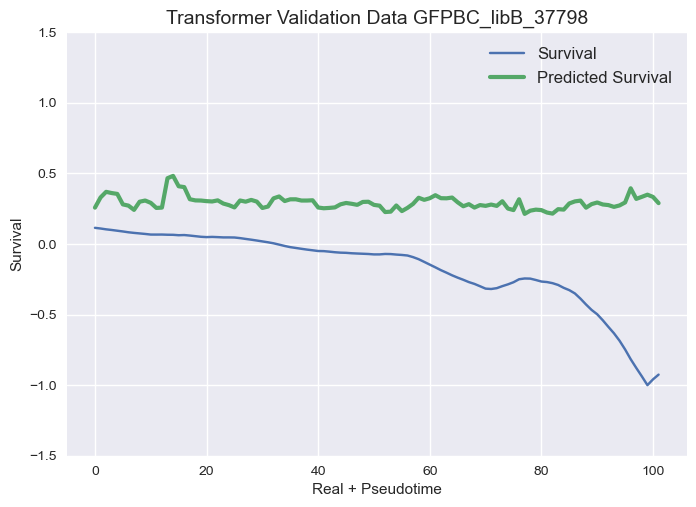

60/71 [========================>.....] - ETA: 0s - loss: 0.0033 - mean_squared_error: 0.0033 
Evaluation metrics Regr
Regr Training Data - MSE: 0.0110
Regr Validation Data - MSE: 0.5350
71/71 [==============================] - 1s 13ms/step - loss: 0.0033 - mean_squared_error: 0.0033 - val_loss: 0.6262 - val_mean_squared_error: 0.6262
(2258, 8, 72) (111, 8, 72)
104/104 [==============================] - 2s 15ms/step - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0991 - val_mean_squared_error: 0.0991
Epoch 17/20
22/71 [========>.....................] - ETA: 0s1s - loss: 0.0046 - mean_squared_error: 0.00

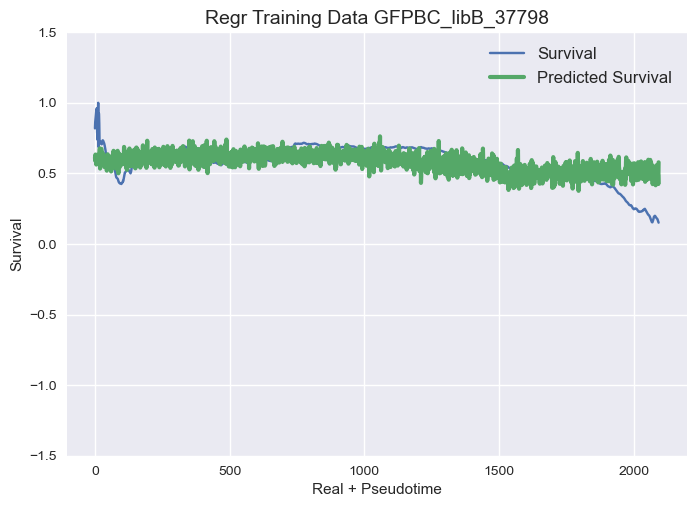

 45/104 [===========>..................] - ETA: 0s - loss: 0.0043 - mean_squared_error: 0.0043 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0012
Transformer Validation MSE - MSE: 0.2896
 50/104 [=============>................] - ETA: 0s - loss: 0.0043 - mean_squared_error: 0.0043

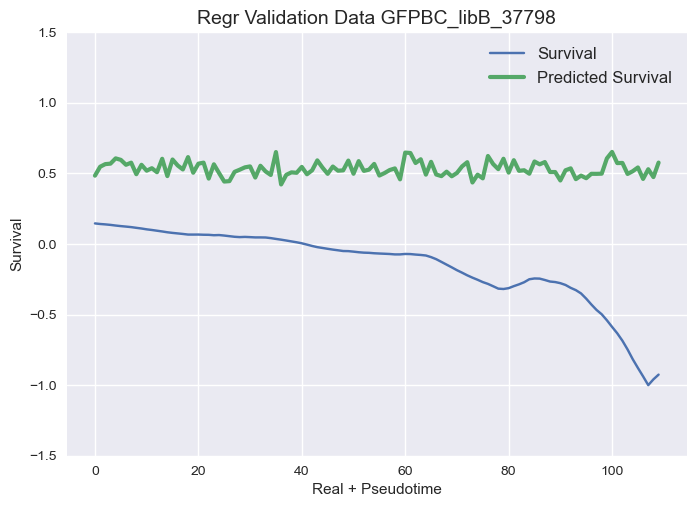

101/104 [============================>.] - ETA: 0s - loss: 0.0040 - mean_squared_error: 0.0040

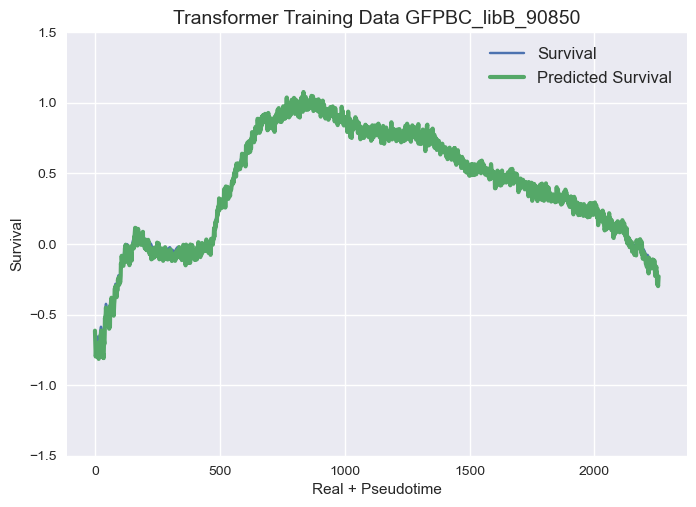

104/104 [==============================] - 1s 13ms/step - loss: 0.0040 - mean_squared_error: 0.0040 - val_loss: 0.0818 - val_mean_squared_error: 0.0818
Epoch 18/20
 30/104 [=======>......................] - ETA: 0s - loss: 0.0035 - mean_squared_error: 0.0035

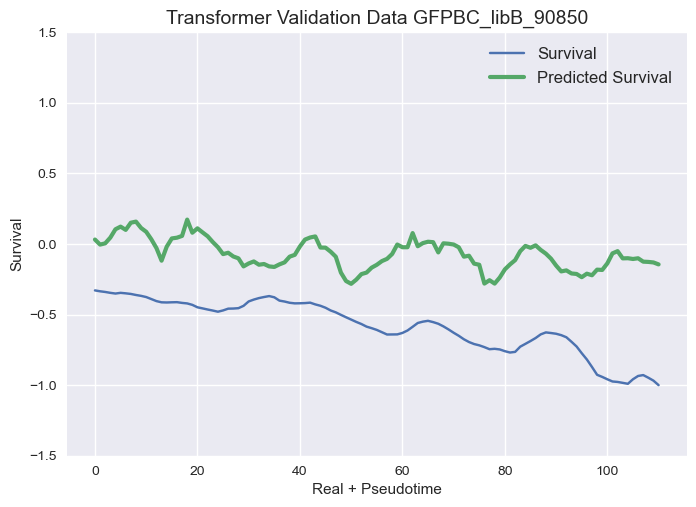

(2258, 8, 72) (111, 8, 72)
4/4 [==============================] - 0s 3ms/step - loss: 0.0037 - mean_squared_error: 0.00
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0217
Transformer Validation MSE - MSE: 0.1521
104/104 [==============================] - 1s 13ms/step - loss: 0.0036 - mean_squared_error: 0.0036 - val_loss: 0.0705 - val_mean_squared_error: 0.0705
Epoch 19/20
 14/104 [===>..........................] - ETA: 1s - loss: 0.0038 - mean_squared_error: 0.0038

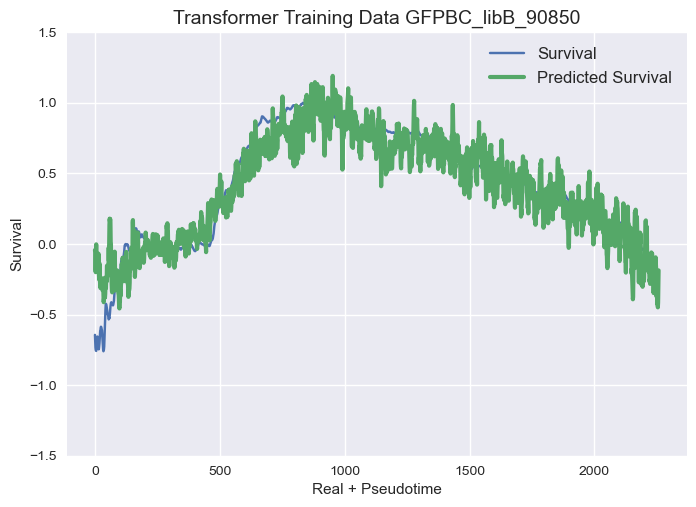

 66/104 [==================>...........] - ETA: 0s - loss: 0.0040 - mean_squared_error: 0.0040

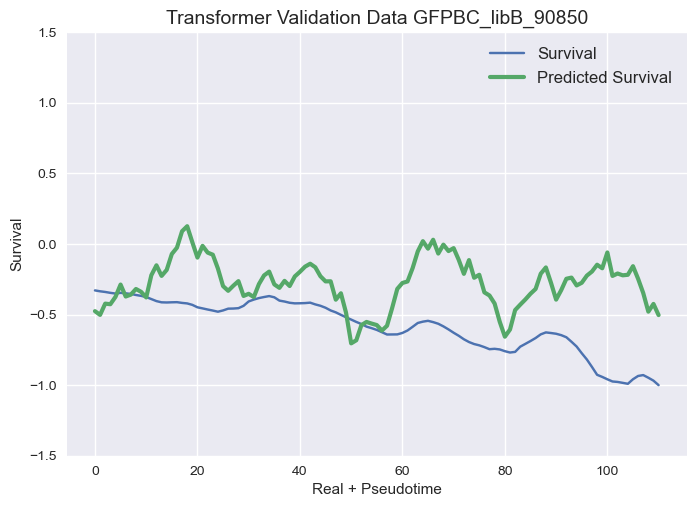

104/104 [==============================] - 1s 13ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - val_loss: 0.0965 - val_mean_squared_error: 0.0965
Epoch 20/20
4/4 [==============================] - 0s 6ms/step
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0014
Transformer Validation MSE - MSE: 0.6262
Epoch 1/20


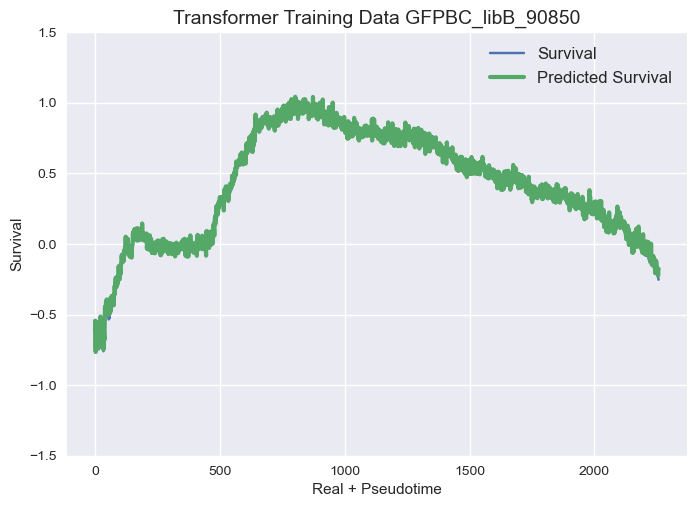

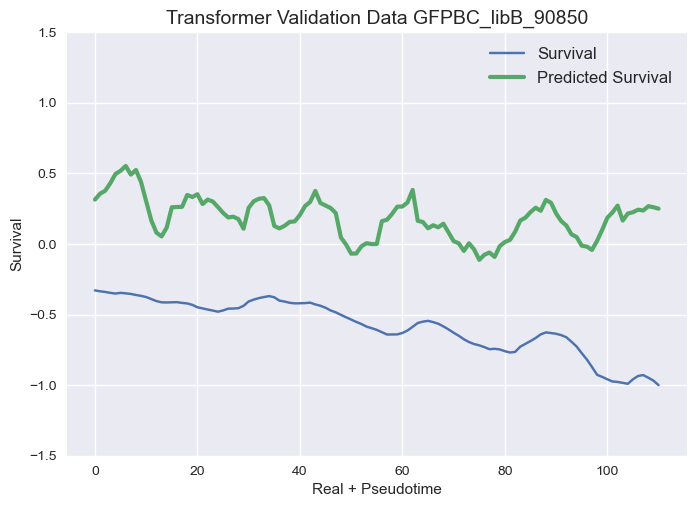

Regr Training/Val set shapes (varies depending on barcode)  (2266, 72) (119, 72)
 
Evaluation metrics Regr
Regr Training Data - MSE: 0.1051
Regr Validation Data - MSE: 1.0321


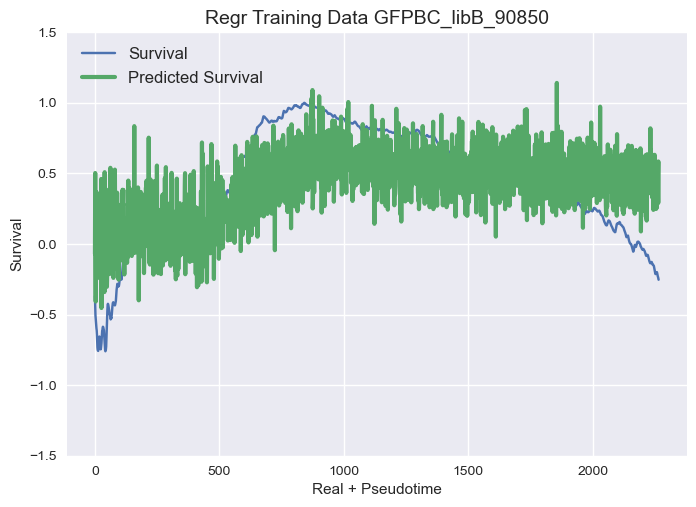

 69/104 [==================>...........] - ETA: 0s - loss: 0.1651 - mean_squared_error: 0.1651

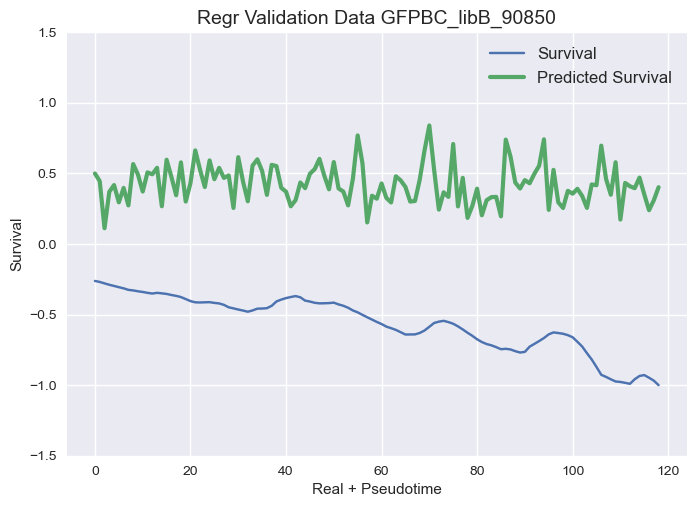

104/104 [==============================] - 2s 8ms/step - loss: 0.1442 - mean_squared_error: 0.1442 - val_loss: 0.3053 - val_mean_squared_error: 0.3053
Epoch 2/20
104/104 [==============================] - 1s 5ms/step - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.0492 - val_mean_squared_error: 0.0492
Epoch 3/20
104/104 [==============================] - 1s 5ms/step - loss: 0.0642 - mean_squared_error: 0.0642 - val_loss: 0.0439 - val_mean_squared_error: 0.0439
Epoch 4/20
104/104 [==============================] - 1s 5ms/step - loss: 0.0572 - mean_squared_error: 0.0572 - val_loss: 0.0677 - val_mean_squared_error: 0.0677
Epoch 5/20
104/104 [==============================] - 1s 5ms/step - loss: 0.0547 - mean_squared_error: 0.0547 - val_loss: 0.0400 - val_mean_squared_error: 0.0400
Epoch 6/20
104/104 [==============================] - 1s 5ms/step - loss: 0.0522 - mean_squared_error: 0.0522 - val_loss: 0.0414 - val_mean_squared_error: 0.0414
Epoch 7/20
104/104 [===================

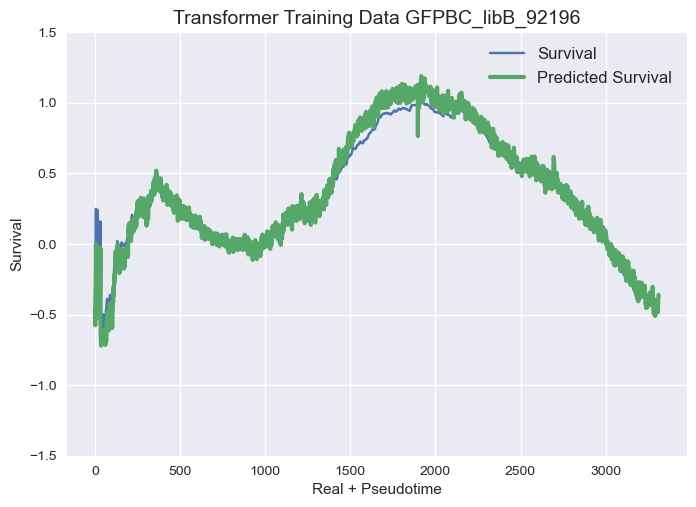

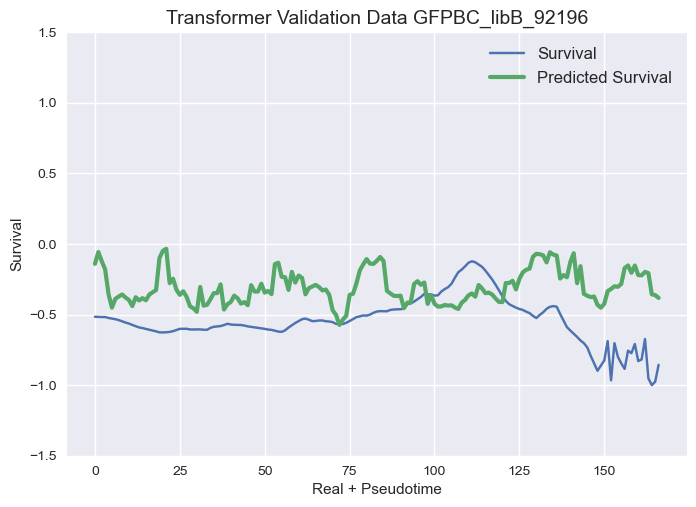

(3312, 8, 72) (167, 8, 72)
6/6 [==============================] - 0s 3ms/step
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0295
Transformer Validation MSE - MSE: 0.0422


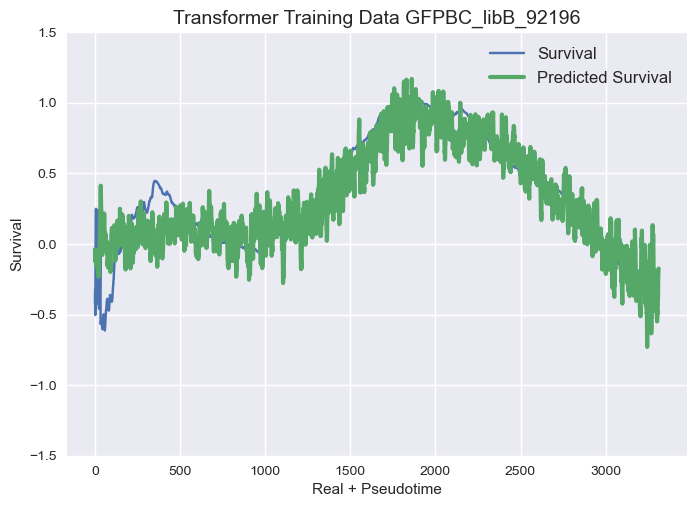

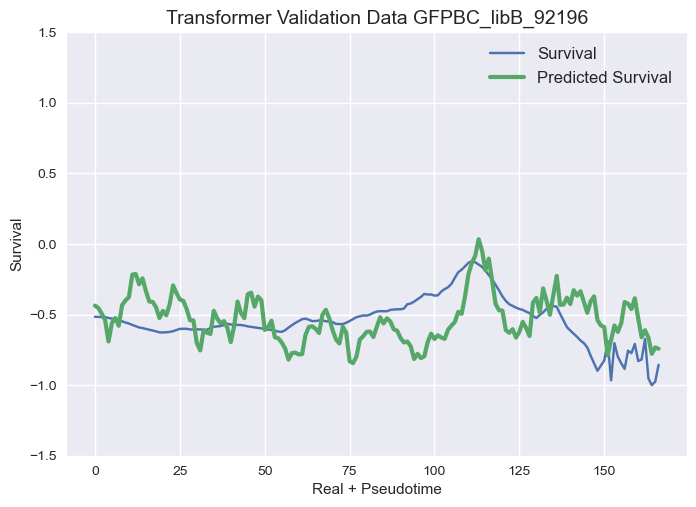

(3312, 8, 72) (167, 8, 72)
6/6 [==============================] - 0s 6ms/step
 
Transformer Evaluation metrics
Transformer Training MSE - MSE: 0.0027
Transformer Validation MSE - MSE: 0.1569


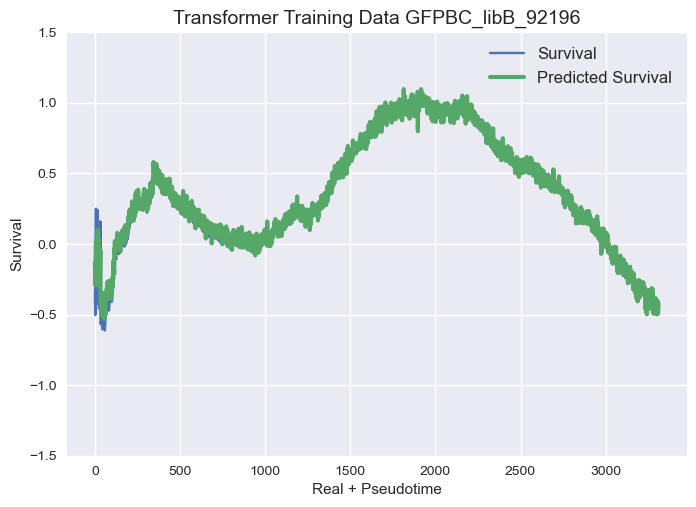

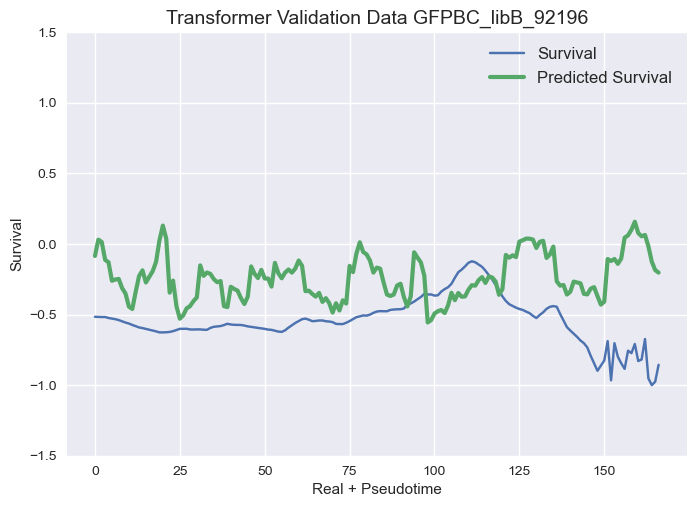

Regr Training/Val set shapes (varies depending on barcode)  (3320, 72) (175, 72)
 
Evaluation metrics Regr
Regr Training Data - MSE: 0.1193
Regr Validation Data - MSE: 0.6815


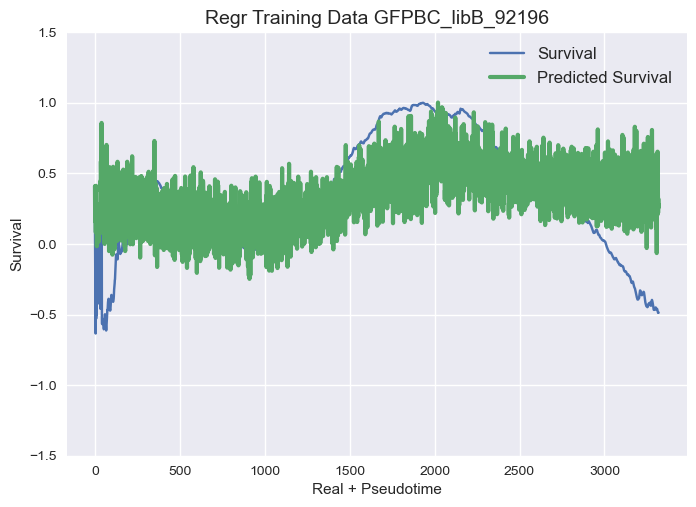

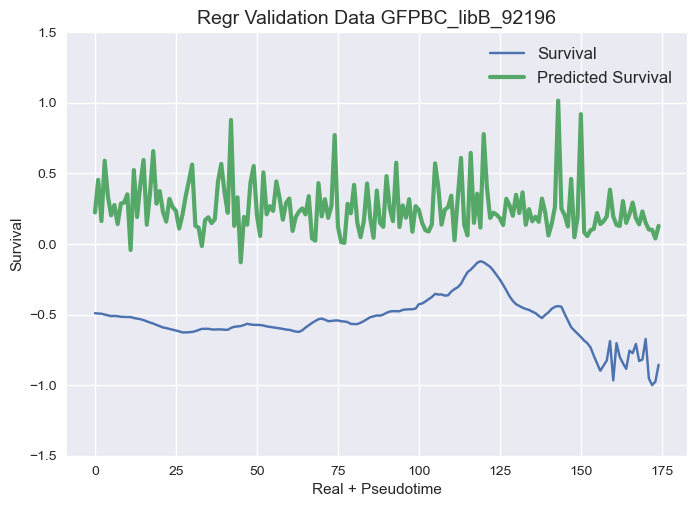

[{'GFPBC_libB_92196': {0.25: [0.005195752033840539, 0.2231691092188399, 0.12196878926168625, 0.418424543940992, 0.03854653819904173, 0.2246428891230229, 0.005307708366530451, 0.3005057378448236], 0.5: [0.001749629057676773, 0.166837548176599, 0.06946092794066955, 0.44139150727916937, 0.03446644710405157, 0.12951777626662034, 0.0022086707003061328, 0.2364209758204175], 0.75: [0.0024417704819006732, 0.15716549432563356, 0.09057307987393554, 0.14320631583082188, 0.0407983578997795, 0.20288258808266885, 0.002014990523770936, 0.2076699915443453], 1: [0.004629825132042864, 0.10057565177106773, 0.11926014395466553, 0.6815220780392292, 0.029546830451322847, 0.04220056548542434, 0.0027048042275098906, 0.15689714891870396]}}, {'GFPBC_libB_20182': {0.25: [0.001790967705300306, 0.10525389880138561, 0.09986571706095969, 0.20090520700166203, 0.05199457103270218, 0.1268084157526886, 0.002500010980988109, 0.08868420387206857], 0.5: [0.0007388260585900078, 0.04525108330671954, 0.05535873638862021, 0.06

In [71]:
import multiprocessing
import sys
from multiprocessing import Pool
threads = 14
print('test', new_barcodes)

    
pool = Pool(threads)
result = pool.starmap(runDynamicDeepLearn, zip(new_barcodes)) 
print(result)


print(mse_dict)


In [72]:
mse_dict = {}
for i, each in enumerate(result):
    mse_dict[new_barcodes[i]] = each[new_barcodes[i]]
#print(mse_dict)
mse = pd.DataFrame(mse_dict)
mse

,GFPBC_libB_92196,GFPBC_libB_20182,GFPBC_libB_90850,GFPBC_libB_10678,GFPBC_libB_37798,GFPBC_libB_31581,GFPBC_libB_40758,GFPBC_libB_94397,GFPBC_libB_83026,GFPBC_libB_10737
0.25,"[0.005195752033840539, 0.2231691092188399, 0.1...","[0.001790967705300306, 0.10525389880138561, 0....","[0.002481634920304332, 0.3134428381005696, 0.0...","[0.001548476801451297, 0.037979162088258536, 0...","[0.0030403048873520458, 0.10470494188678475, 0...","[0.0024696717204764425, 0.3352322104936204, 0....","[0.0031803416917609915, 0.07310716653612324, 0...","[0.0028437188088818537, 0.02850374311240174, 0...","[0.004106829534275748, 0.05065251531907517, 0....","[0.01021453724377759, 0.2785358563849011, 1.84..."
0.50,"[0.001749629057676773, 0.166837548176599, 0.06...","[0.0007388260585900078, 0.04525108330671954, 0...","[0.0016001086027432113, 0.06636435974047857, 0...","[0.00233214470291343, 0.05944753652178359, 0.0...","[0.0011801622071313128, 0.011753366261806095, ...","[0.005262849715867589, 0.26809318396187753, 0....","[0.001976056581583684, 0.0059367069785194486, ...","[0.0016454403219946078, 0.06690778477428314, 0...","[0.0018405841667166343, 0.01996956270917798, 0...","[0.007005930909604113, 0.08068359239003231, 0...."
0.75,"[0.0024417704819006732, 0.15716549432563356, 0...","[0.0013915039618307866, 0.03342652228801454, 0...","[0.0013930299963790208, 0.09627507289388094, 0...","[0.0008986836497459183, 0.1187001398562422, 0....","[0.0011558006485622209, 0.07145997134105422, 0...","[0.0033991536258675538, 0.5043161718257422, 0....","[0.003995565377850936, 0.01767030090279628, 0....","[0.0018569018111279619, 0.15090817503222745, 0...","[0.0016808237789384616, 0.04017595178195694, 0...","[0.0032748833694508654, 0.20197425766809213, 0..."
1.00,"[0.004629825132042864, 0.10057565177106773, 0....","[0.0009049421254035033, 0.007889446406147367, ...","[0.001175210154979961, 0.2896330109252801, 0.1...","[0.0004032898302236638, 0.653495469761495, 0.0...","[0.0005821418710495825, 0.3079094242220227, 0....","[0.0027037176397423993, 0.17836570653189207, 0...","[0.0012859173876179312, 1.1238555945935826, 0....","[0.002784280577977222, 1.5183345673427173, 0.1...","[0.0018800782543755459, 0.8663516204647981, 0....","[0.002423783079383331, 0.02477170925871551, 0...."


In [73]:
f = open('mse/mse_dict_trans_9545_plsrres0.3_HALL3_layers10.csv', 'w')
f.write(str(mse_dict))
f.close()

In [74]:
mse_file = open('mse/mse_dict_trans_9545_plsrres0.3_HALL3_layers10.csv', 'r')
for line in mse_file:
    mse = eval(line)
mse

{'GFPBC_libB_92196': {0.25: [0.005195752033840539,
   0.2231691092188399,
   0.12196878926168625,
   0.418424543940992,
   0.03854653819904173,
   0.2246428891230229,
   0.005307708366530451,
   0.3005057378448236],
  0.5: [0.001749629057676773,
   0.166837548176599,
   0.06946092794066955,
   0.44139150727916937,
   0.03446644710405157,
   0.12951777626662034,
   0.0022086707003061328,
   0.2364209758204175],
  0.75: [0.0024417704819006732,
   0.15716549432563356,
   0.09057307987393554,
   0.14320631583082188,
   0.0407983578997795,
   0.20288258808266885,
   0.002014990523770936,
   0.2076699915443453],
  1: [0.004629825132042864,
   0.10057565177106773,
   0.11926014395466553,
   0.6815220780392292,
   0.029546830451322847,
   0.04220056548542434,
   0.0027048042275098906,
   0.15689714891870396]},
 'GFPBC_libB_20182': {0.25: [0.001790967705300306,
   0.10525389880138561,
   0.09986571706095969,
   0.20090520700166203,
   0.05199457103270218,
   0.1268084157526886,
   0.00250001098